___

<p style="text-align: center;"><img src="https://docs.google.com/uc?id=1lY0Uj5R04yMY3-ZppPWxqCr5pvBLYPnV" class="img-fluid" alt="CLRSWY"></p>

___

<h1 style="text-align: center;">Deep Learning<br><br>Session - 4<br><br>Classification with ANN<br><br>Cancer Data<br><h1>

# Keras Classification

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings("ignore")
warnings.warn("this will not show")

plt.rcParams["figure.figsize"] = (10,6)

sns.set_style("whitegrid")
pd.set_option('display.float_format', lambda x: '%.3f' % x)

# Set it None to display all rows in the dataframe
# pd.set_option('display.max_rows', None)

# Set it to None to display all columns in the dataframe
pd.set_option('display.max_columns', None)

In [2]:
# from google.colab import drive
# drive.mount('/content/drive')

In [3]:
from sklearn.datasets import load_breast_cancer

In [4]:
cancer = load_breast_cancer()

In [5]:
cancer.keys() #objenin key lerini dondurur.

dict_keys(['data', 'target', 'frame', 'target_names', 'DESCR', 'feature_names', 'filename', 'data_module'])

In [6]:
print(cancer["target_names"])# malignant kotu huylu, benign iyi huylu

['malignant' 'benign']


In [7]:
print(cancer["DESCR"])

.. _breast_cancer_dataset:

Breast cancer wisconsin (diagnostic) dataset
--------------------------------------------

**Data Set Characteristics:**

    :Number of Instances: 569

    :Number of Attributes: 30 numeric, predictive attributes and the class

    :Attribute Information:
        - radius (mean of distances from center to points on the perimeter)
        - texture (standard deviation of gray-scale values)
        - perimeter
        - area
        - smoothness (local variation in radius lengths)
        - compactness (perimeter^2 / area - 1.0)
        - concavity (severity of concave portions of the contour)
        - concave points (number of concave portions of the contour)
        - symmetry
        - fractal dimension ("coastline approximation" - 1)

        The mean, standard error, and "worst" or largest (mean of the three
        worst/largest values) of these features were computed for each image,
        resulting in 30 features.  For instance, field 0 is Mean Radi

In [8]:
cancer["feature_names"]

array(['mean radius', 'mean texture', 'mean perimeter', 'mean area',
       'mean smoothness', 'mean compactness', 'mean concavity',
       'mean concave points', 'mean symmetry', 'mean fractal dimension',
       'radius error', 'texture error', 'perimeter error', 'area error',
       'smoothness error', 'compactness error', 'concavity error',
       'concave points error', 'symmetry error',
       'fractal dimension error', 'worst radius', 'worst texture',
       'worst perimeter', 'worst area', 'worst smoothness',
       'worst compactness', 'worst concavity', 'worst concave points',
       'worst symmetry', 'worst fractal dimension'], dtype='<U23')

In [9]:
df_feat = pd.DataFrame(cancer['data'],columns=cancer['feature_names'])
df_feat.head()

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,radius error,texture error,perimeter error,area error,smoothness error,compactness error,concavity error,concave points error,symmetry error,fractal dimension error,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension
0,17.990,10.380,122.800,1001.000,0.118,0.278,0.300,0.147,0.242,0.079,1.095,0.905,8.589,153.400,0.006,0.049,0.054,0.016,0.030,0.006,25.380,17.330,184.600,2019.000,0.162,0.666,0.712,0.265,0.460,0.119
1,20.570,17.770,132.900,1326.000,0.085,0.079,0.087,0.070,0.181,0.057,0.543,0.734,3.398,74.080,0.005,0.013,0.019,0.013,0.014,0.004,24.990,23.410,158.800,1956.000,0.124,0.187,0.242,0.186,0.275,0.089
2,19.690,21.250,130.000,1203.000,0.110,0.160,0.197,0.128,0.207,0.060,0.746,0.787,4.585,94.030,0.006,0.040,0.038,0.021,0.022,0.005,23.570,25.530,152.500,1709.000,0.144,0.424,0.450,0.243,0.361,0.088
3,11.420,20.380,77.580,386.100,0.142,0.284,0.241,0.105,0.260,0.097,0.496,1.156,3.445,27.230,0.009,0.075,0.057,0.019,0.060,0.009,14.910,26.500,98.870,567.700,0.210,0.866,0.687,0.258,0.664,0.173
4,20.290,14.340,135.100,1297.000,0.100,0.133,0.198,0.104,0.181,0.059,0.757,0.781,5.438,94.440,0.011,0.025,0.057,0.019,0.018,0.005,22.540,16.670,152.200,1575.000,0.137,0.205,0.400,0.163,0.236,0.077


In [10]:
df_target = pd.DataFrame(cancer['target'],columns=['Cancer'])
df_target.head()

,Cancer
0,0
1,0
2,0
3,0
4,0


In [11]:
frames = [df_feat, df_target]
df = pd.concat(frames,axis=1)
df.head()

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,radius error,texture error,perimeter error,area error,smoothness error,compactness error,concavity error,concave points error,symmetry error,fractal dimension error,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension,Cancer
0,17.990,10.380,122.800,1001.000,0.118,0.278,0.300,0.147,0.242,0.079,1.095,0.905,8.589,153.400,0.006,0.049,0.054,0.016,0.030,0.006,25.380,17.330,184.600,2019.000,0.162,0.666,0.712,0.265,0.460,0.119,0
1,20.570,17.770,132.900,1326.000,0.085,0.079,0.087,0.070,0.181,0.057,0.543,0.734,3.398,74.080,0.005,0.013,0.019,0.013,0.014,0.004,24.990,23.410,158.800,1956.000,0.124,0.187,0.242,0.186,0.275,0.089,0
2,19.690,21.250,130.000,1203.000,0.110,0.160,0.197,0.128,0.207,0.060,0.746,0.787,4.585,94.030,0.006,0.040,0.038,0.021,0.022,0.005,23.570,25.530,152.500,1709.000,0.144,0.424,0.450,0.243,0.361,0.088,0
3,11.420,20.380,77.580,386.100,0.142,0.284,0.241,0.105,0.260,0.097,0.496,1.156,3.445,27.230,0.009,0.075,0.057,0.019,0.060,0.009,14.910,26.500,98.870,567.700,0.210,0.866,0.687,0.258,0.664,0.173,0
4,20.290,14.340,135.100,1297.000,0.100,0.133,0.198,0.104,0.181,0.059,0.757,0.781,5.438,94.440,0.011,0.025,0.057,0.019,0.018,0.005,22.540,16.670,152.200,1575.000,0.137,0.205,0.400,0.163,0.236,0.077,0


## Exploratory Data Analysis and Visualization

In [12]:
df.shape

(569, 31)

In [13]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 31 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   mean radius              569 non-null    float64
 1   mean texture             569 non-null    float64
 2   mean perimeter           569 non-null    float64
 3   mean area                569 non-null    float64
 4   mean smoothness          569 non-null    float64
 5   mean compactness         569 non-null    float64
 6   mean concavity           569 non-null    float64
 7   mean concave points      569 non-null    float64
 8   mean symmetry            569 non-null    float64
 9   mean fractal dimension   569 non-null    float64
 10  radius error             569 non-null    float64
 11  texture error            569 non-null    float64
 12  perimeter error          569 non-null    float64
 13  area error               569 non-null    float64
 14  smoothness error         5

In [14]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
mean radius,569.000,14.127,3.524,6.981,11.700,13.370,15.780,28.110
mean texture,569.000,19.290,4.301,9.710,16.170,18.840,21.800,39.280
mean perimeter,569.000,91.969,24.299,43.790,75.170,86.240,104.100,188.500
mean area,569.000,654.889,351.914,143.500,420.300,551.100,782.700,2501.000
mean smoothness,569.000,0.096,0.014,0.053,0.086,0.096,0.105,0.163
mean compactness,569.000,0.104,0.053,0.019,0.065,0.093,0.130,0.345
mean concavity,569.000,0.089,0.080,0.000,0.030,0.062,0.131,0.427
mean concave points,569.000,0.049,0.039,0.000,0.020,0.034,0.074,0.201
mean symmetry,569.000,0.181,0.027,0.106,0.162,0.179,0.196,0.304
mean fractal dimension,569.000,0.063,0.007,0.050,0.058,0.062,0.066,0.097


In [15]:
df.Cancer.value_counts()

1    357
0    212
Name: Cancer, dtype: int64

<AxesSubplot:xlabel='Cancer', ylabel='count'>

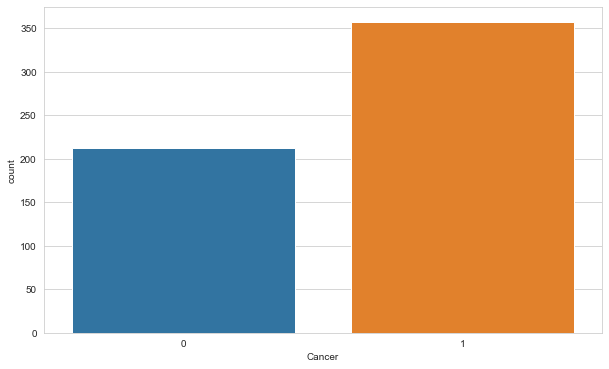

In [16]:
sns.countplot(df["Cancer"])

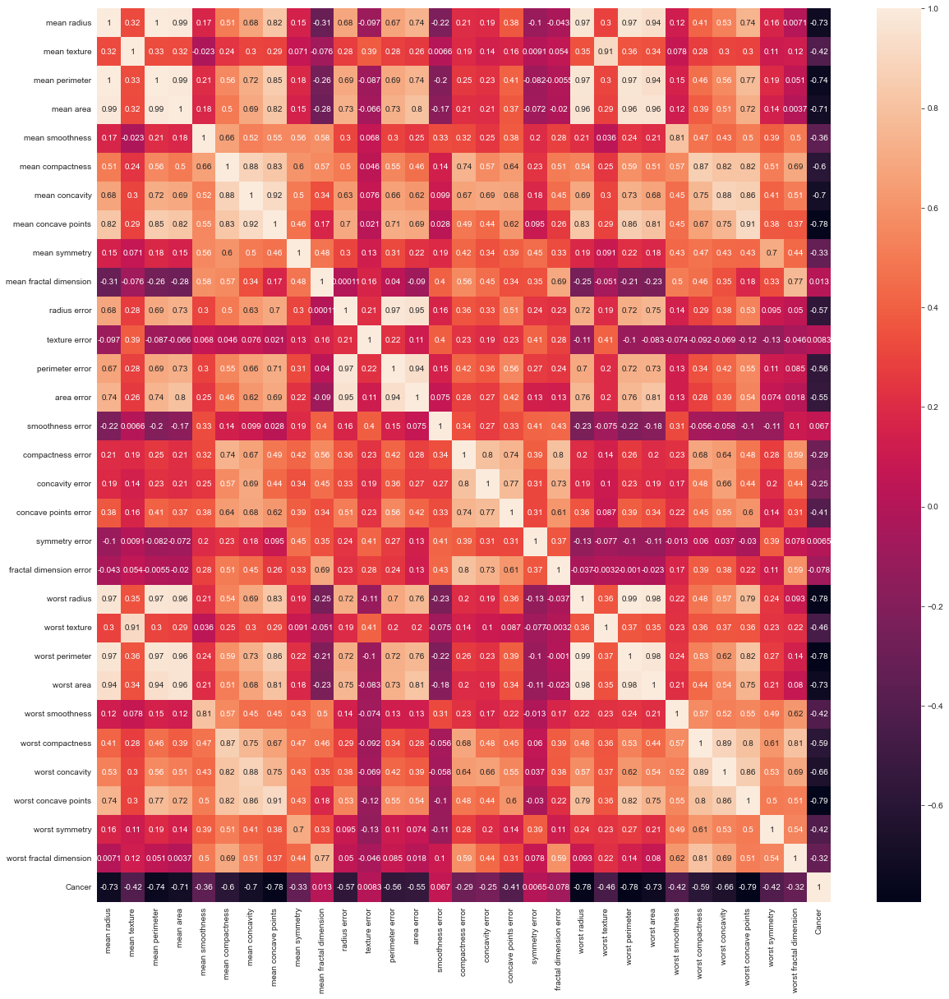

In [17]:
plt.figure(figsize=(20,20))
sns.heatmap(df.corr(), annot=True);

In [18]:
drop_list = ["worst perimeter", "worst area", "perimeter error", "area error", "mean perimeter", "mean area"]

In [19]:
df=df.drop(drop_list, axis=1)

In [20]:
df.shape

(569, 25)

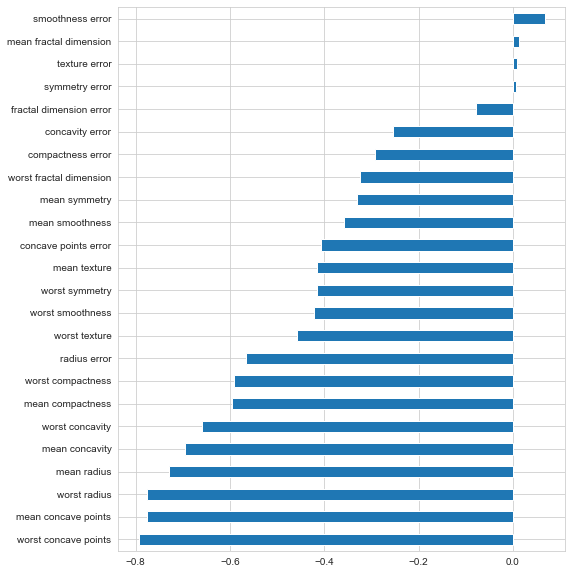

In [21]:
plt.figure(figsize = (8,10))
df.corr()['Cancer'].sort_values().drop("Cancer").plot(kind = "barh");

## Preprocessing of Data
- Train | Test Split, Scalling

In [22]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler

In [23]:
X = df.drop('Cancer', axis=1)
y = df['Cancer']

In [24]:
seed = 42

In [25]:
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify = y, test_size = 0.10, random_state = seed)

In [26]:
scaler = MinMaxScaler()

In [27]:
X_train= scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

## Modelling & Model Performance

In [28]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Activation
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.metrics import plot_roc_curve, roc_auc_score, roc_curve
from sklearn.model_selection import cross_val_score, cross_validate
from sklearn.model_selection import GridSearchCV

In [29]:
X_train.shape

(512, 24)

In [30]:
X_test.shape

(57, 24)

In [31]:
tf.random.set_seed(seed)

model = Sequential()

model.add(Dense(36, activation = "relu", input_dim = X_train.shape[1]))
model.add(Dense(18, activation = "relu"))
model.add(Dense(9, activation = "relu"))
model.add(Dense(1, activation = "sigmoid"))

model.compile(optimizer = "adam", loss = "binary_crossentropy", metrics = ["accuracy"])# eger burda recall yazarsak 1 i onemser

2022-06-20 17:00:44.518429: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [32]:
model.fit(x = X_train, y = y_train, validation_split = 0.1, batch_size = 32, epochs = 1000, verbose=1)

Epoch 1/1000
15/15 [==============================] - 1s 15ms/step - loss: 0.6778 - accuracy: 0.7674 - val_loss: 0.6622 - val_accuracy: 0.9038
Epoch 2/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.6524 - accuracy: 0.8326 - val_loss: 0.6296 - val_accuracy: 0.9038
Epoch 3/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.6204 - accuracy: 0.8457 - val_loss: 0.5931 - val_accuracy: 0.9231
Epoch 4/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.5807 - accuracy: 0.8717 - val_loss: 0.5448 - val_accuracy: 0.9423
Epoch 5/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.5275 - accuracy: 0.8761 - val_loss: 0.4792 - val_accuracy: 0.9423
Epoch 6/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.4660 - accuracy: 0.8870 - val_loss: 0.4088 - val_accuracy: 0.9423
Epoch 7/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.4028 - accuracy: 0.8957 - val_loss: 0.3341 - val_accuracy: 0.9423
Epoch

15/15 [==============================] - 0s 2ms/step - loss: 0.0565 - accuracy: 0.9826 - val_loss: 0.0402 - val_accuracy: 0.9808
Epoch 59/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0504 - accuracy: 0.9870 - val_loss: 0.0501 - val_accuracy: 0.9615
Epoch 60/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0489 - accuracy: 0.9848 - val_loss: 0.0486 - val_accuracy: 0.9615
Epoch 61/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0523 - accuracy: 0.9848 - val_loss: 0.0680 - val_accuracy: 0.9615
Epoch 62/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0557 - accuracy: 0.9848 - val_loss: 0.0320 - val_accuracy: 1.0000
Epoch 63/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0468 - accuracy: 0.9870 - val_loss: 0.0664 - val_accuracy: 0.9615
Epoch 64/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0538 - accuracy: 0.9848 - val_loss: 0.0317 - val_accuracy: 1.0000
Epoch 65/1000

15/15 [==============================] - 0s 2ms/step - loss: 0.0375 - accuracy: 0.9870 - val_loss: 0.0379 - val_accuracy: 0.9808
Epoch 116/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0382 - accuracy: 0.9870 - val_loss: 0.0369 - val_accuracy: 0.9808
Epoch 117/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0412 - accuracy: 0.9848 - val_loss: 0.0317 - val_accuracy: 0.9808
Epoch 118/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0373 - accuracy: 0.9870 - val_loss: 0.0423 - val_accuracy: 0.9808
Epoch 119/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0391 - accuracy: 0.9870 - val_loss: 0.0473 - val_accuracy: 0.9615
Epoch 120/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0400 - accuracy: 0.9848 - val_loss: 0.0348 - val_accuracy: 0.9808
Epoch 121/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0367 - accuracy: 0.9870 - val_loss: 0.0508 - val_accuracy: 0.9615
Epoch 1

Epoch 172/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0306 - accuracy: 0.9913 - val_loss: 0.0319 - val_accuracy: 0.9808
Epoch 173/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0338 - accuracy: 0.9848 - val_loss: 0.0231 - val_accuracy: 1.0000
Epoch 174/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0330 - accuracy: 0.9891 - val_loss: 0.0467 - val_accuracy: 0.9808
Epoch 175/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0307 - accuracy: 0.9891 - val_loss: 0.0291 - val_accuracy: 0.9808
Epoch 176/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0324 - accuracy: 0.9891 - val_loss: 0.0767 - val_accuracy: 0.9423
Epoch 177/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0418 - accuracy: 0.9848 - val_loss: 0.0357 - val_accuracy: 0.9808
Epoch 178/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0326 - accuracy: 0.9891 - val_loss: 0.0339 - val_accuracy:

Epoch 229/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0215 - accuracy: 0.9891 - val_loss: 0.0187 - val_accuracy: 1.0000
Epoch 230/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0246 - accuracy: 0.9913 - val_loss: 0.0366 - val_accuracy: 0.9808
Epoch 231/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0225 - accuracy: 0.9913 - val_loss: 0.0145 - val_accuracy: 1.0000
Epoch 232/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0291 - accuracy: 0.9870 - val_loss: 0.0197 - val_accuracy: 1.0000
Epoch 233/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0259 - accuracy: 0.9891 - val_loss: 0.0166 - val_accuracy: 1.0000
Epoch 234/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0313 - accuracy: 0.9891 - val_loss: 0.0479 - val_accuracy: 0.9808
Epoch 235/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0226 - accuracy: 0.9913 - val_loss: 0.0206 - val_accuracy:

Epoch 286/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0155 - accuracy: 0.9935 - val_loss: 0.0274 - val_accuracy: 0.9808
Epoch 287/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0172 - accuracy: 0.9935 - val_loss: 0.0225 - val_accuracy: 1.0000
Epoch 288/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0149 - accuracy: 0.9913 - val_loss: 0.0270 - val_accuracy: 0.9808
Epoch 289/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0151 - accuracy: 0.9935 - val_loss: 0.0201 - val_accuracy: 1.0000
Epoch 290/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0154 - accuracy: 0.9913 - val_loss: 0.0198 - val_accuracy: 1.0000
Epoch 291/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0155 - accuracy: 0.9935 - val_loss: 0.0217 - val_accuracy: 1.0000
Epoch 292/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0148 - accuracy: 0.9935 - val_loss: 0.0284 - val_accuracy:

Epoch 343/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0173 - accuracy: 0.9913 - val_loss: 0.0178 - val_accuracy: 1.0000
Epoch 344/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0118 - accuracy: 0.9978 - val_loss: 0.0310 - val_accuracy: 0.9808
Epoch 345/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0160 - accuracy: 0.9935 - val_loss: 0.0313 - val_accuracy: 0.9808
Epoch 346/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0170 - accuracy: 0.9891 - val_loss: 0.0207 - val_accuracy: 0.9808
Epoch 347/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0109 - accuracy: 0.9957 - val_loss: 0.0556 - val_accuracy: 0.9615
Epoch 348/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0238 - accuracy: 0.9870 - val_loss: 0.0176 - val_accuracy: 1.0000
Epoch 349/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0130 - accuracy: 0.9957 - val_loss: 0.0183 - val_accuracy:

Epoch 400/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0132 - accuracy: 0.9935 - val_loss: 0.0232 - val_accuracy: 0.9808
Epoch 401/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0113 - accuracy: 0.9957 - val_loss: 0.0288 - val_accuracy: 0.9808
Epoch 402/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0150 - accuracy: 0.9957 - val_loss: 0.0209 - val_accuracy: 1.0000
Epoch 403/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0097 - accuracy: 0.9957 - val_loss: 0.0278 - val_accuracy: 0.9808
Epoch 404/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0072 - accuracy: 1.0000 - val_loss: 0.0227 - val_accuracy: 0.9808
Epoch 405/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0165 - accuracy: 0.9913 - val_loss: 0.0493 - val_accuracy: 0.9808
Epoch 406/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0141 - accuracy: 0.9957 - val_loss: 0.0241 - val_accuracy:

Epoch 457/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0053 - accuracy: 1.0000 - val_loss: 0.0224 - val_accuracy: 1.0000
Epoch 458/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0062 - accuracy: 0.9978 - val_loss: 0.0248 - val_accuracy: 0.9808
Epoch 459/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0073 - accuracy: 1.0000 - val_loss: 0.0286 - val_accuracy: 0.9808
Epoch 460/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0073 - accuracy: 0.9978 - val_loss: 0.0255 - val_accuracy: 1.0000
Epoch 461/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0052 - accuracy: 1.0000 - val_loss: 0.0255 - val_accuracy: 0.9808
Epoch 462/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0053 - accuracy: 1.0000 - val_loss: 0.0246 - val_accuracy: 0.9808
Epoch 463/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0069 - accuracy: 0.9978 - val_loss: 0.0237 - val_accuracy:

Epoch 514/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0116 - accuracy: 0.9957 - val_loss: 0.0427 - val_accuracy: 0.9808
Epoch 515/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0104 - accuracy: 0.9978 - val_loss: 0.0302 - val_accuracy: 0.9808
Epoch 516/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0088 - accuracy: 0.9957 - val_loss: 0.0372 - val_accuracy: 0.9808
Epoch 517/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0031 - accuracy: 1.0000 - val_loss: 0.0295 - val_accuracy: 0.9808
Epoch 518/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0044 - accuracy: 0.9978 - val_loss: 0.0371 - val_accuracy: 0.9808
Epoch 519/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0081 - accuracy: 0.9957 - val_loss: 0.0295 - val_accuracy: 0.9808
Epoch 520/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0054 - accuracy: 0.9978 - val_loss: 0.0368 - val_accuracy:

Epoch 571/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0023 - accuracy: 1.0000 - val_loss: 0.0471 - val_accuracy: 0.9615
Epoch 572/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0024 - accuracy: 1.0000 - val_loss: 0.0429 - val_accuracy: 0.9615
Epoch 573/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0027 - accuracy: 1.0000 - val_loss: 0.0431 - val_accuracy: 0.9615
Epoch 574/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0026 - accuracy: 1.0000 - val_loss: 0.0441 - val_accuracy: 0.9615
Epoch 575/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0026 - accuracy: 1.0000 - val_loss: 0.0412 - val_accuracy: 0.9615
Epoch 576/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0022 - accuracy: 1.0000 - val_loss: 0.0402 - val_accuracy: 0.9808
Epoch 577/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0024 - accuracy: 1.0000 - val_loss: 0.0362 - val_accuracy:

Epoch 628/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0315 - accuracy: 0.9870 - val_loss: 0.2411 - val_accuracy: 0.9615
Epoch 629/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.1203 - accuracy: 0.9739 - val_loss: 0.1656 - val_accuracy: 0.9615
Epoch 630/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0307 - accuracy: 0.9870 - val_loss: 0.0041 - val_accuracy: 1.0000
Epoch 631/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0051 - accuracy: 0.9978 - val_loss: 0.0057 - val_accuracy: 1.0000
Epoch 632/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0066 - accuracy: 1.0000 - val_loss: 0.0150 - val_accuracy: 1.0000
Epoch 633/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0099 - accuracy: 0.9957 - val_loss: 0.0507 - val_accuracy: 0.9808
Epoch 634/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0311 - accuracy: 0.9935 - val_loss: 0.0649 - val_accuracy:

Epoch 685/1000
15/15 [==============================] - 0s 1ms/step - loss: 0.0013 - accuracy: 1.0000 - val_loss: 0.0516 - val_accuracy: 0.9808
Epoch 686/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0012 - accuracy: 1.0000 - val_loss: 0.0513 - val_accuracy: 0.9808
Epoch 687/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000 - val_loss: 0.0491 - val_accuracy: 0.9808
Epoch 688/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0010 - accuracy: 1.0000 - val_loss: 0.0484 - val_accuracy: 0.9808
Epoch 689/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0010 - accuracy: 1.0000 - val_loss: 0.0484 - val_accuracy: 0.9808
Epoch 690/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000 - val_loss: 0.0514 - val_accuracy: 0.9808
Epoch 691/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0011 - accuracy: 1.0000 - val_loss: 0.0458 - val_accuracy:

Epoch 741/1000
15/15 [==============================] - 0s 2ms/step - loss: 7.3788e-04 - accuracy: 1.0000 - val_loss: 0.0547 - val_accuracy: 0.9808
Epoch 742/1000
15/15 [==============================] - 0s 2ms/step - loss: 9.8718e-04 - accuracy: 1.0000 - val_loss: 0.0519 - val_accuracy: 0.9808
Epoch 743/1000
15/15 [==============================] - 0s 2ms/step - loss: 7.2763e-04 - accuracy: 1.0000 - val_loss: 0.0663 - val_accuracy: 0.9808
Epoch 744/1000
15/15 [==============================] - 0s 2ms/step - loss: 9.8557e-04 - accuracy: 1.0000 - val_loss: 0.0469 - val_accuracy: 0.9808
Epoch 745/1000
15/15 [==============================] - 0s 2ms/step - loss: 8.8764e-04 - accuracy: 1.0000 - val_loss: 0.0622 - val_accuracy: 0.9808
Epoch 746/1000
15/15 [==============================] - 0s 2ms/step - loss: 8.0925e-04 - accuracy: 1.0000 - val_loss: 0.0524 - val_accuracy: 0.9808
Epoch 747/1000
15/15 [==============================] - 0s 2ms/step - loss: 8.7078e-04 - accuracy: 1.0000 - val_

15/15 [==============================] - 0s 2ms/step - loss: 8.0005e-04 - accuracy: 1.0000 - val_loss: 0.0583 - val_accuracy: 0.9808
Epoch 797/1000
15/15 [==============================] - 0s 2ms/step - loss: 4.9637e-04 - accuracy: 1.0000 - val_loss: 0.0580 - val_accuracy: 0.9808
Epoch 798/1000
15/15 [==============================] - 0s 2ms/step - loss: 6.6782e-04 - accuracy: 1.0000 - val_loss: 0.0579 - val_accuracy: 0.9808
Epoch 799/1000
15/15 [==============================] - 0s 2ms/step - loss: 7.0372e-04 - accuracy: 1.0000 - val_loss: 0.0671 - val_accuracy: 0.9808
Epoch 800/1000
15/15 [==============================] - 0s 2ms/step - loss: 6.5566e-04 - accuracy: 1.0000 - val_loss: 0.0456 - val_accuracy: 0.9615
Epoch 801/1000
15/15 [==============================] - 0s 2ms/step - loss: 7.3495e-04 - accuracy: 1.0000 - val_loss: 0.0653 - val_accuracy: 0.9808
Epoch 802/1000
15/15 [==============================] - 0s 2ms/step - loss: 5.0052e-04 - accuracy: 1.0000 - val_loss: 0.0551 - 

15/15 [==============================] - 0s 2ms/step - loss: 2.8167e-04 - accuracy: 1.0000 - val_loss: 0.0664 - val_accuracy: 0.9808
Epoch 852/1000
15/15 [==============================] - 0s 2ms/step - loss: 3.9561e-04 - accuracy: 1.0000 - val_loss: 0.0869 - val_accuracy: 0.9808
Epoch 853/1000
15/15 [==============================] - 0s 2ms/step - loss: 5.8299e-04 - accuracy: 1.0000 - val_loss: 0.0647 - val_accuracy: 0.9615
Epoch 854/1000
15/15 [==============================] - 0s 1ms/step - loss: 7.2562e-04 - accuracy: 1.0000 - val_loss: 0.0459 - val_accuracy: 0.9615
Epoch 855/1000
15/15 [==============================] - 0s 2ms/step - loss: 8.6762e-04 - accuracy: 1.0000 - val_loss: 0.1285 - val_accuracy: 0.9615
Epoch 856/1000
15/15 [==============================] - 0s 1ms/step - loss: 0.0094 - accuracy: 0.9957 - val_loss: 0.1400 - val_accuracy: 0.9808
Epoch 857/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0212 - accuracy: 0.9957 - val_loss: 0.1232 - val_accu

15/15 [==============================] - 0s 2ms/step - loss: 1.8851e-04 - accuracy: 1.0000 - val_loss: 0.0719 - val_accuracy: 0.9615
Epoch 907/1000
15/15 [==============================] - 0s 2ms/step - loss: 1.9269e-04 - accuracy: 1.0000 - val_loss: 0.0704 - val_accuracy: 0.9615
Epoch 908/1000
15/15 [==============================] - 0s 2ms/step - loss: 1.9346e-04 - accuracy: 1.0000 - val_loss: 0.0763 - val_accuracy: 0.9808
Epoch 909/1000
15/15 [==============================] - 0s 2ms/step - loss: 1.9446e-04 - accuracy: 1.0000 - val_loss: 0.0740 - val_accuracy: 0.9808
Epoch 910/1000
15/15 [==============================] - 0s 2ms/step - loss: 1.7773e-04 - accuracy: 1.0000 - val_loss: 0.0713 - val_accuracy: 0.9615
Epoch 911/1000
15/15 [==============================] - 0s 2ms/step - loss: 1.8978e-04 - accuracy: 1.0000 - val_loss: 0.0736 - val_accuracy: 0.9808
Epoch 912/1000
15/15 [==============================] - 0s 2ms/step - loss: 1.8951e-04 - accuracy: 1.0000 - val_loss: 0.0744 - 

15/15 [==============================] - 0s 2ms/step - loss: 1.3624e-04 - accuracy: 1.0000 - val_loss: 0.0727 - val_accuracy: 0.9615
Epoch 962/1000
15/15 [==============================] - 0s 2ms/step - loss: 1.3416e-04 - accuracy: 1.0000 - val_loss: 0.0775 - val_accuracy: 0.9808
Epoch 963/1000
15/15 [==============================] - 0s 2ms/step - loss: 1.4347e-04 - accuracy: 1.0000 - val_loss: 0.0761 - val_accuracy: 0.9808
Epoch 964/1000
15/15 [==============================] - 0s 1ms/step - loss: 1.3700e-04 - accuracy: 1.0000 - val_loss: 0.0752 - val_accuracy: 0.9808
Epoch 965/1000
15/15 [==============================] - 0s 1ms/step - loss: 1.3164e-04 - accuracy: 1.0000 - val_loss: 0.0709 - val_accuracy: 0.9808
Epoch 966/1000
15/15 [==============================] - 0s 1ms/step - loss: 1.2812e-04 - accuracy: 1.0000 - val_loss: 0.0734 - val_accuracy: 0.9808
Epoch 967/1000
15/15 [==============================] - 0s 2ms/step - loss: 1.2158e-04 - accuracy: 1.0000 - val_loss: 0.0734 - 

In [33]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 36)                900       
                                                                 
 dense_1 (Dense)             (None, 18)                666       
                                                                 
 dense_2 (Dense)             (None, 9)                 171       
                                                                 
 dense_3 (Dense)             (None, 1)                 10        
                                                                 
Total params: 1,747
Trainable params: 1,747
Non-trainable params: 0
_________________________________________________________________


In [34]:
loss_df = pd.DataFrame(model.history.history)
loss_df.head()

,loss,accuracy,val_loss,val_accuracy
0,0.678,0.767,0.662,0.904
1,0.652,0.833,0.630,0.904
2,0.620,0.846,0.593,0.923
3,0.581,0.872,0.545,0.942
4,0.528,0.876,0.479,0.942


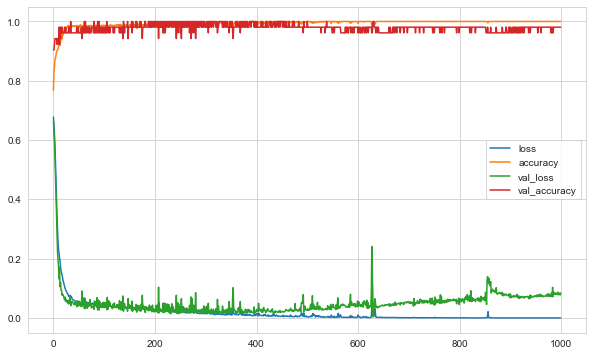

In [35]:
loss_df.plot();

In [36]:
model.evaluate(X_test, y_test, verbose=0)

[0.8845431804656982, 0.8947368264198303]

In [37]:
loss, accuracy = model.evaluate(X_test, y_test, verbose=0)
print("loss : ", loss)
print("accuracy : ", accuracy)

loss :  0.8845431804656982
accuracy :  0.8947368264198303


In [38]:
y_pred = model.predict(X_test) > 0.5
#y_pred = model.predict_classes(X_test) for tf 2.5.0
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

2/2 [==============================] - 0s 1ms/step
[[19  2]
 [ 4 32]]
              precision    recall  f1-score   support

           0       0.83      0.90      0.86        21
           1       0.94      0.89      0.91        36

    accuracy                           0.89        57
   macro avg       0.88      0.90      0.89        57
weighted avg       0.90      0.89      0.90        57



### EarlyStopping

In [39]:
from tensorflow.keras.callbacks import EarlyStopping

In [40]:
tf.random.set_seed(seed)

model = Sequential()

model.add(Dense(36, activation = "relu", input_dim = X_train.shape[1]))
model.add(Dense(18, activation = "relu"))
model.add(Dense(9, activation = "relu"))
model.add(Dense(1, activation = "sigmoid"))

model.compile(optimizer = "adam", loss = "binary_crossentropy", metrics = ["accuracy"])

In [41]:
#The patience is often set somewhere between 10 and 100 (10 or 25 is more common), 
#but it really depends on your dataset and network.

In [42]:
early_stop = EarlyStopping(monitor = "val_loss", mode = "min", verbose = 1, patience = 15, restore_best_weights = True)
##validationloss azaldikca iyilesen bir yontem oldugu icin mode = min aldik

In [43]:
model.fit(x = X_train, y = y_train, validation_split = 0.1, batch_size = 32, epochs = 1000, verbose = 1,
          callbacks = [early_stop])

Epoch 1/1000
15/15 [==============================] - 0s 8ms/step - loss: 0.6778 - accuracy: 0.7674 - val_loss: 0.6622 - val_accuracy: 0.9038
Epoch 2/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.6524 - accuracy: 0.8326 - val_loss: 0.6296 - val_accuracy: 0.9038
Epoch 3/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.6204 - accuracy: 0.8457 - val_loss: 0.5931 - val_accuracy: 0.9231
Epoch 4/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.5807 - accuracy: 0.8717 - val_loss: 0.5448 - val_accuracy: 0.9423
Epoch 5/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.5275 - accuracy: 0.8761 - val_loss: 0.4792 - val_accuracy: 0.9423
Epoch 6/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.4660 - accuracy: 0.8870 - val_loss: 0.4088 - val_accuracy: 0.9423
Epoch 7/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.4028 - accuracy: 0.8957 - val_loss: 0.3341 - val_accuracy: 0.9423
Epoch 

15/15 [==============================] - 0s 1ms/step - loss: 0.0565 - accuracy: 0.9826 - val_loss: 0.0402 - val_accuracy: 0.9808
Epoch 59/1000
15/15 [==============================] - 0s 1ms/step - loss: 0.0504 - accuracy: 0.9870 - val_loss: 0.0501 - val_accuracy: 0.9615
Epoch 60/1000
15/15 [==============================] - 0s 1ms/step - loss: 0.0489 - accuracy: 0.9848 - val_loss: 0.0486 - val_accuracy: 0.9615
Epoch 61/1000
15/15 [==============================] - 0s 1ms/step - loss: 0.0523 - accuracy: 0.9848 - val_loss: 0.0680 - val_accuracy: 0.9615
Epoch 62/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0557 - accuracy: 0.9848 - val_loss: 0.0320 - val_accuracy: 1.0000
Epoch 63/1000
15/15 [==============================] - 0s 1ms/step - loss: 0.0468 - accuracy: 0.9870 - val_loss: 0.0664 - val_accuracy: 0.9615
Epoch 64/1000
15/15 [==============================] - 0s 1ms/step - loss: 0.0538 - accuracy: 0.9848 - val_loss: 0.0317 - val_accuracy: 1.0000
Epoch 65/1000

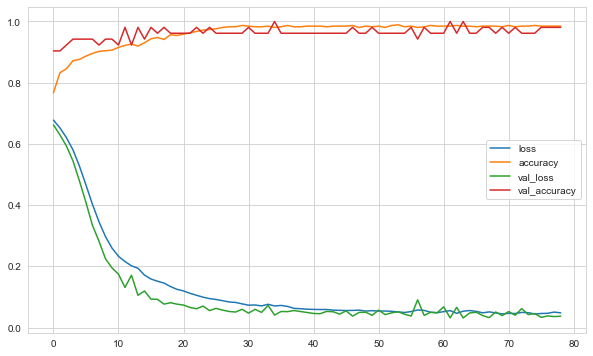

In [44]:
loss_df = pd.DataFrame(model.history.history)
loss_df.plot();

In [45]:
loss, accuracy = model.evaluate(X_test, y_test, verbose=0)
print("loss : ", loss)
print("accuracy : ", accuracy)

loss :  0.12801718711853027
accuracy :  0.9473684430122375


In [46]:
y_pred = model.predict(X_test) > 0.5
#y_pred = model.predict_classes(X_test) for tf 2.5.0
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

2/2 [==============================] - 0s 2ms/step
[[20  1]
 [ 2 34]]
              precision    recall  f1-score   support

           0       0.91      0.95      0.93        21
           1       0.97      0.94      0.96        36

    accuracy                           0.95        57
   macro avg       0.94      0.95      0.94        57
weighted avg       0.95      0.95      0.95        57



### learning_rate

In [47]:
from tensorflow.keras.optimizers import Adam

In [48]:
tf.random.set_seed(seed)

model = Sequential()

model.add(Dense(36, activation = "relu", input_dim = X_train.shape[1]))
model.add(Dense(18, activation = "relu"))
model.add(Dense(9, activation = "relu"))
model.add(Dense(1, activation = "sigmoid"))

opt = Adam(lr = 0.005)
model.compile(optimizer = opt, loss = "binary_crossentropy", metrics = ["accuracy"])

In [49]:
early_stop = EarlyStopping(monitor = "val_loss", mode = "min", verbose = 1, patience = 15, restore_best_weights = True)

In [50]:
model.fit(x = X_train, y = y_train, validation_split = 0.1, batch_size = 32, epochs = 1000, verbose = 1,
          callbacks = [early_stop])

Epoch 1/1000
15/15 [==============================] - 0s 7ms/step - loss: 0.6293 - accuracy: 0.8022 - val_loss: 0.5245 - val_accuracy: 0.9231
Epoch 2/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.4337 - accuracy: 0.8978 - val_loss: 0.2717 - val_accuracy: 0.9231
Epoch 3/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.2418 - accuracy: 0.9174 - val_loss: 0.1158 - val_accuracy: 0.9615
Epoch 4/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.1680 - accuracy: 0.9196 - val_loss: 0.0763 - val_accuracy: 0.9808
Epoch 5/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.1679 - accuracy: 0.9304 - val_loss: 0.0586 - val_accuracy: 1.0000
Epoch 6/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.1149 - accuracy: 0.9565 - val_loss: 0.0484 - val_accuracy: 1.0000
Epoch 7/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.1077 - accuracy: 0.9630 - val_loss: 0.0625 - val_accuracy: 0.9615
Epoch 

<AxesSubplot:>

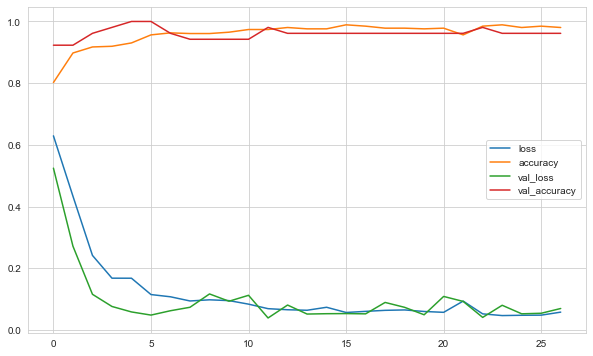

In [51]:
loss_df = pd.DataFrame(model.history.history)
loss_df.plot()

In [52]:
loss, accuracy = model.evaluate(X_test, y_test, verbose=0)
print("loss : ", loss)
print("accuracy : ", accuracy)

loss :  0.12057708948850632
accuracy :  0.9473684430122375


In [53]:
y_pred = model.predict(X_test) > 0.5
#y_pred = model.predict_classes(X_test) for tf 2.5.0
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

2/2 [==============================] - 0s 1ms/step
[[20  1]
 [ 2 34]]
              precision    recall  f1-score   support

           0       0.91      0.95      0.93        21
           1       0.97      0.94      0.96        36

    accuracy                           0.95        57
   macro avg       0.94      0.95      0.94        57
weighted avg       0.95      0.95      0.95        57



### Dropout

The Dropout layer randomly sets input units to 0 with a frequency of `rate`
at each step during training time, which helps prevent overfitting.

In [54]:
from tensorflow.keras.layers import Dropout

In [55]:
tf.random.set_seed(seed)

model = Sequential()

model.add(Dense(36, activation="relu", input_dim = X_train.shape[1]))
model.add(Dropout(0.5))

model.add(Dense(18, activation="relu"))
model.add(Dropout(0.5))

model.add(Dense(9, activation="relu"))
model.add(Dropout(0.5))

model.add(Dense(1, activation="sigmoid"))

opt = Adam(lr = 0.001)
model.compile(optimizer = opt, loss = "binary_crossentropy", metrics = ["accuracy"])

In [56]:
model.fit(x = X_train, y = y_train, validation_split = 0.1, batch_size = 32, epochs = 1000, verbose = 1)

Epoch 1/1000
15/15 [==============================] - 0s 7ms/step - loss: 0.7003 - accuracy: 0.4913 - val_loss: 0.6870 - val_accuracy: 0.5962
Epoch 2/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.6879 - accuracy: 0.6043 - val_loss: 0.6850 - val_accuracy: 0.5385
Epoch 3/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.6766 - accuracy: 0.6217 - val_loss: 0.6816 - val_accuracy: 0.5385
Epoch 4/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.6696 - accuracy: 0.6543 - val_loss: 0.6743 - val_accuracy: 0.5385
Epoch 5/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.6729 - accuracy: 0.6500 - val_loss: 0.6635 - val_accuracy: 0.6154
Epoch 6/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.6604 - accuracy: 0.6848 - val_loss: 0.6502 - val_accuracy: 0.6538
Epoch 7/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.6462 - accuracy: 0.7174 - val_loss: 0.6271 - val_accuracy: 0.8654
Epoch 

15/15 [==============================] - 0s 2ms/step - loss: 0.1958 - accuracy: 0.9348 - val_loss: 0.0575 - val_accuracy: 0.9615
Epoch 59/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.1902 - accuracy: 0.9413 - val_loss: 0.0297 - val_accuracy: 1.0000
Epoch 60/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.1890 - accuracy: 0.9283 - val_loss: 0.0373 - val_accuracy: 1.0000
Epoch 61/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.1863 - accuracy: 0.9304 - val_loss: 0.0357 - val_accuracy: 1.0000
Epoch 62/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.1717 - accuracy: 0.9522 - val_loss: 0.0465 - val_accuracy: 0.9808
Epoch 63/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.1941 - accuracy: 0.9391 - val_loss: 0.0309 - val_accuracy: 1.0000
Epoch 64/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.1852 - accuracy: 0.9391 - val_loss: 0.0403 - val_accuracy: 0.9808
Epoch 65/1000

15/15 [==============================] - 0s 2ms/step - loss: 0.1335 - accuracy: 0.9500 - val_loss: 0.0374 - val_accuracy: 0.9808
Epoch 116/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.1351 - accuracy: 0.9696 - val_loss: 0.0297 - val_accuracy: 0.9808
Epoch 117/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.1540 - accuracy: 0.9609 - val_loss: 0.0202 - val_accuracy: 1.0000
Epoch 118/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.1101 - accuracy: 0.9696 - val_loss: 0.0200 - val_accuracy: 1.0000
Epoch 119/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.1224 - accuracy: 0.9630 - val_loss: 0.0212 - val_accuracy: 1.0000
Epoch 120/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.1101 - accuracy: 0.9739 - val_loss: 0.0332 - val_accuracy: 0.9808
Epoch 121/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.1059 - accuracy: 0.9739 - val_loss: 0.0393 - val_accuracy: 0.9615
Epoch 1

Epoch 172/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0734 - accuracy: 0.9783 - val_loss: 0.0147 - val_accuracy: 1.0000
Epoch 173/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.1284 - accuracy: 0.9609 - val_loss: 0.0245 - val_accuracy: 1.0000
Epoch 174/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.1065 - accuracy: 0.9674 - val_loss: 0.0104 - val_accuracy: 1.0000
Epoch 175/1000
15/15 [==============================] - 0s 3ms/step - loss: 0.0911 - accuracy: 0.9717 - val_loss: 0.0313 - val_accuracy: 0.9808
Epoch 176/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.1113 - accuracy: 0.9630 - val_loss: 0.0097 - val_accuracy: 1.0000
Epoch 177/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.1264 - accuracy: 0.9652 - val_loss: 0.0070 - val_accuracy: 1.0000
Epoch 178/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.1088 - accuracy: 0.9609 - val_loss: 0.0143 - val_accuracy:

Epoch 229/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0869 - accuracy: 0.9848 - val_loss: 0.0066 - val_accuracy: 1.0000
Epoch 230/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0737 - accuracy: 0.9761 - val_loss: 0.0077 - val_accuracy: 1.0000
Epoch 231/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0848 - accuracy: 0.9696 - val_loss: 0.0078 - val_accuracy: 1.0000
Epoch 232/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0674 - accuracy: 0.9717 - val_loss: 0.0051 - val_accuracy: 1.0000
Epoch 233/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0978 - accuracy: 0.9717 - val_loss: 0.0057 - val_accuracy: 1.0000
Epoch 234/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.1066 - accuracy: 0.9630 - val_loss: 0.0120 - val_accuracy: 1.0000
Epoch 235/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0688 - accuracy: 0.9739 - val_loss: 0.0067 - val_accuracy:

Epoch 286/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0791 - accuracy: 0.9652 - val_loss: 0.0117 - val_accuracy: 1.0000
Epoch 287/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0791 - accuracy: 0.9761 - val_loss: 0.0084 - val_accuracy: 1.0000
Epoch 288/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0682 - accuracy: 0.9761 - val_loss: 0.0159 - val_accuracy: 1.0000
Epoch 289/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0672 - accuracy: 0.9761 - val_loss: 0.0083 - val_accuracy: 1.0000
Epoch 290/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0806 - accuracy: 0.9761 - val_loss: 0.0085 - val_accuracy: 1.0000
Epoch 291/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0851 - accuracy: 0.9717 - val_loss: 0.0083 - val_accuracy: 1.0000
Epoch 292/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.1049 - accuracy: 0.9630 - val_loss: 0.0068 - val_accuracy:

Epoch 343/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0843 - accuracy: 0.9696 - val_loss: 0.0040 - val_accuracy: 1.0000
Epoch 344/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0851 - accuracy: 0.9674 - val_loss: 0.0069 - val_accuracy: 1.0000
Epoch 345/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0596 - accuracy: 0.9891 - val_loss: 0.0092 - val_accuracy: 1.0000
Epoch 346/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0732 - accuracy: 0.9761 - val_loss: 0.0056 - val_accuracy: 1.0000
Epoch 347/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0524 - accuracy: 0.9913 - val_loss: 0.0029 - val_accuracy: 1.0000
Epoch 348/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0650 - accuracy: 0.9761 - val_loss: 0.0036 - val_accuracy: 1.0000
Epoch 349/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0712 - accuracy: 0.9717 - val_loss: 0.0087 - val_accuracy:

Epoch 400/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.1009 - accuracy: 0.9717 - val_loss: 0.0088 - val_accuracy: 1.0000
Epoch 401/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0751 - accuracy: 0.9761 - val_loss: 0.0088 - val_accuracy: 1.0000
Epoch 402/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0670 - accuracy: 0.9804 - val_loss: 0.0088 - val_accuracy: 1.0000
Epoch 403/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0818 - accuracy: 0.9652 - val_loss: 0.0039 - val_accuracy: 1.0000
Epoch 404/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0801 - accuracy: 0.9761 - val_loss: 0.0055 - val_accuracy: 1.0000
Epoch 405/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0634 - accuracy: 0.9761 - val_loss: 0.0047 - val_accuracy: 1.0000
Epoch 406/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0602 - accuracy: 0.9804 - val_loss: 0.0083 - val_accuracy:

Epoch 457/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0719 - accuracy: 0.9761 - val_loss: 0.0473 - val_accuracy: 0.9615
Epoch 458/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0877 - accuracy: 0.9652 - val_loss: 0.0035 - val_accuracy: 1.0000
Epoch 459/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0642 - accuracy: 0.9826 - val_loss: 0.0028 - val_accuracy: 1.0000
Epoch 460/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.1057 - accuracy: 0.9587 - val_loss: 0.0029 - val_accuracy: 1.0000
Epoch 461/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0755 - accuracy: 0.9761 - val_loss: 0.0038 - val_accuracy: 1.0000
Epoch 462/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0624 - accuracy: 0.9761 - val_loss: 0.0076 - val_accuracy: 1.0000
Epoch 463/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0542 - accuracy: 0.9783 - val_loss: 0.0044 - val_accuracy:

Epoch 514/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0574 - accuracy: 0.9761 - val_loss: 0.0014 - val_accuracy: 1.0000
Epoch 515/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0571 - accuracy: 0.9848 - val_loss: 0.0012 - val_accuracy: 1.0000
Epoch 516/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0493 - accuracy: 0.9826 - val_loss: 0.0012 - val_accuracy: 1.0000
Epoch 517/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0524 - accuracy: 0.9870 - val_loss: 0.0017 - val_accuracy: 1.0000
Epoch 518/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0765 - accuracy: 0.9674 - val_loss: 0.0010 - val_accuracy: 1.0000
Epoch 519/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0909 - accuracy: 0.9609 - val_loss: 0.0018 - val_accuracy: 1.0000
Epoch 520/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0623 - accuracy: 0.9783 - val_loss: 0.0035 - val_accuracy:

15/15 [==============================] - 0s 2ms/step - loss: 0.0519 - accuracy: 0.9783 - val_loss: 9.9721e-04 - val_accuracy: 1.0000
Epoch 571/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0579 - accuracy: 0.9717 - val_loss: 7.9229e-04 - val_accuracy: 1.0000
Epoch 572/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0457 - accuracy: 0.9804 - val_loss: 2.1191e-04 - val_accuracy: 1.0000
Epoch 573/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0524 - accuracy: 0.9761 - val_loss: 1.0860e-04 - val_accuracy: 1.0000
Epoch 574/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0918 - accuracy: 0.9674 - val_loss: 1.9427e-04 - val_accuracy: 1.0000
Epoch 575/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0617 - accuracy: 0.9739 - val_loss: 0.0012 - val_accuracy: 1.0000
Epoch 576/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0559 - accuracy: 0.9761 - val_loss: 6.7068e-04 - val_

15/15 [==============================] - 0s 2ms/step - loss: 0.0405 - accuracy: 0.9826 - val_loss: 9.7477e-04 - val_accuracy: 1.0000
Epoch 627/1000
15/15 [==============================] - 0s 3ms/step - loss: 0.0549 - accuracy: 0.9783 - val_loss: 9.4845e-04 - val_accuracy: 1.0000
Epoch 628/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0583 - accuracy: 0.9783 - val_loss: 0.0014 - val_accuracy: 1.0000
Epoch 629/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0495 - accuracy: 0.9826 - val_loss: 7.8375e-04 - val_accuracy: 1.0000
Epoch 630/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0436 - accuracy: 0.9870 - val_loss: 9.6789e-04 - val_accuracy: 1.0000
Epoch 631/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0697 - accuracy: 0.9739 - val_loss: 5.5386e-04 - val_accuracy: 1.0000
Epoch 632/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0504 - accuracy: 0.9826 - val_loss: 0.0011 - val_accu

15/15 [==============================] - 0s 2ms/step - loss: 0.0499 - accuracy: 0.9783 - val_loss: 0.0011 - val_accuracy: 1.0000
Epoch 683/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0461 - accuracy: 0.9826 - val_loss: 0.0010 - val_accuracy: 1.0000
Epoch 684/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0764 - accuracy: 0.9739 - val_loss: 0.0026 - val_accuracy: 1.0000
Epoch 685/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0639 - accuracy: 0.9761 - val_loss: 5.4450e-04 - val_accuracy: 1.0000
Epoch 686/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0453 - accuracy: 0.9848 - val_loss: 0.0012 - val_accuracy: 1.0000
Epoch 687/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0557 - accuracy: 0.9761 - val_loss: 8.9476e-04 - val_accuracy: 1.0000
Epoch 688/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0603 - accuracy: 0.9761 - val_loss: 3.6157e-04 - val_accuracy: 1.

15/15 [==============================] - 0s 2ms/step - loss: 0.0799 - accuracy: 0.9652 - val_loss: 0.0012 - val_accuracy: 1.0000
Epoch 739/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0691 - accuracy: 0.9717 - val_loss: 7.1533e-04 - val_accuracy: 1.0000
Epoch 740/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0427 - accuracy: 0.9848 - val_loss: 2.7668e-04 - val_accuracy: 1.0000
Epoch 741/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0480 - accuracy: 0.9848 - val_loss: 0.0020 - val_accuracy: 1.0000
Epoch 742/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0472 - accuracy: 0.9848 - val_loss: 0.0014 - val_accuracy: 1.0000
Epoch 743/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0478 - accuracy: 0.9848 - val_loss: 2.6495e-04 - val_accuracy: 1.0000
Epoch 744/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0357 - accuracy: 0.9891 - val_loss: 1.7488e-04 - val_accuracy

15/15 [==============================] - 0s 2ms/step - loss: 0.0620 - accuracy: 0.9739 - val_loss: 3.5621e-04 - val_accuracy: 1.0000
Epoch 794/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0577 - accuracy: 0.9804 - val_loss: 3.2454e-04 - val_accuracy: 1.0000
Epoch 795/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0442 - accuracy: 0.9826 - val_loss: 2.9646e-04 - val_accuracy: 1.0000
Epoch 796/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0566 - accuracy: 0.9783 - val_loss: 2.3162e-04 - val_accuracy: 1.0000
Epoch 797/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0563 - accuracy: 0.9739 - val_loss: 0.0023 - val_accuracy: 1.0000
Epoch 798/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0488 - accuracy: 0.9826 - val_loss: 0.0017 - val_accuracy: 1.0000
Epoch 799/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0459 - accuracy: 0.9870 - val_loss: 0.0027 - val_accuracy

Epoch 849/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0663 - accuracy: 0.9761 - val_loss: 6.9490e-04 - val_accuracy: 1.0000
Epoch 850/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0753 - accuracy: 0.9630 - val_loss: 7.1215e-04 - val_accuracy: 1.0000
Epoch 851/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0318 - accuracy: 0.9891 - val_loss: 5.1388e-04 - val_accuracy: 1.0000
Epoch 852/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0608 - accuracy: 0.9783 - val_loss: 1.3297e-04 - val_accuracy: 1.0000
Epoch 853/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0579 - accuracy: 0.9717 - val_loss: 1.1751e-04 - val_accuracy: 1.0000
Epoch 854/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0571 - accuracy: 0.9804 - val_loss: 0.0016 - val_accuracy: 1.0000
Epoch 855/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0427 - accuracy: 0.9804 - val_loss: 0.

15/15 [==============================] - 0s 2ms/step - loss: 0.0634 - accuracy: 0.9761 - val_loss: 1.1469e-04 - val_accuracy: 1.0000
Epoch 905/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0397 - accuracy: 0.9891 - val_loss: 8.7243e-05 - val_accuracy: 1.0000
Epoch 906/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0607 - accuracy: 0.9761 - val_loss: 3.3963e-04 - val_accuracy: 1.0000
Epoch 907/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0429 - accuracy: 0.9891 - val_loss: 0.0024 - val_accuracy: 1.0000
Epoch 908/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0514 - accuracy: 0.9783 - val_loss: 0.0112 - val_accuracy: 1.0000
Epoch 909/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0394 - accuracy: 0.9848 - val_loss: 3.2420e-04 - val_accuracy: 1.0000
Epoch 910/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0466 - accuracy: 0.9826 - val_loss: 7.3178e-05 - val_accu

Epoch 960/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0539 - accuracy: 0.9804 - val_loss: 3.9272e-04 - val_accuracy: 1.0000
Epoch 961/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0734 - accuracy: 0.9761 - val_loss: 0.0014 - val_accuracy: 1.0000
Epoch 962/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0467 - accuracy: 0.9826 - val_loss: 3.3297e-04 - val_accuracy: 1.0000
Epoch 963/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0629 - accuracy: 0.9826 - val_loss: 0.0011 - val_accuracy: 1.0000
Epoch 964/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0871 - accuracy: 0.9761 - val_loss: 0.0046 - val_accuracy: 1.0000
Epoch 965/1000
15/15 [==============================] - 0s 3ms/step - loss: 0.0682 - accuracy: 0.9761 - val_loss: 0.0037 - val_accuracy: 1.0000
Epoch 966/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.0964 - accuracy: 0.9674 - val_loss: 0.0019 - val_a

<AxesSubplot:>

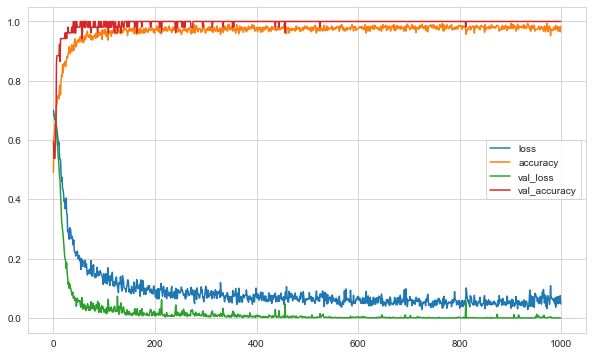

In [57]:
loss_df = pd.DataFrame(model.history.history)
loss_df.plot()

In [58]:
loss, accuracy = model.evaluate(X_test, y_test, verbose=0)
print("loss : ", loss)
print("accuracy : ", accuracy)

loss :  0.21266819536685944
accuracy :  0.9298245906829834


In [59]:
y_pred = model.predict(X_test) > 0.5
#y_pred = model.predict_classes(X_test) for tf 2.5.0
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

2/2 [==============================] - 0s 2ms/step
[[20  1]
 [ 3 33]]
              precision    recall  f1-score   support

           0       0.87      0.95      0.91        21
           1       0.97      0.92      0.94        36

    accuracy                           0.93        57
   macro avg       0.92      0.93      0.93        57
weighted avg       0.93      0.93      0.93        57



## Cross Validation

**Keras models** can be used in **scikit-learn** by wrapping them with the **KerasClassifier** or **KerasRegressor** class.

To use these wrappers you must define a function that creates and returns your Keras sequential model, then pass this function to the build_fn argument when constructing the KerasClassifier class.

The constructor for the KerasClassifier class can take default arguments that are passed on to the calls to model.fit(), such as the number of epochs and the batch size.

In [60]:
from tensorflow.keras.wrappers.scikit_learn import KerasClassifier

In [61]:
def build_classifier():
    tf.random.set_seed(seed)
    classifier = Sequential()
    classifier.add(Dense(units = 36, activation = 'relu'))
    classifier.add(Dense(units = 18, activation = 'relu'))
    classifier.add(Dense(units = 9, activation = 'relu'))
    classifier.add(Dense(units = 1, activation = 'sigmoid'))
    classifier.compile(optimizer = "adam", loss = 'binary_crossentropy', metrics = ['accuracy'])
    return classifier

In [62]:
classifier_model = KerasClassifier(build_fn = build_classifier, batch_size = 32, epochs = 100, verbose=0)

scores = cross_validate(estimator = classifier_model, X = X_train, y = y_train,
                        scoring = ['accuracy', 'precision', 'recall', 'f1'], cv = 10)

df_scores = pd.DataFrame(scores, index = range(1, 11)).iloc[:, 2:]

df_scores

2/2 [==============================] - 0s 2ms/step


,test_accuracy,test_precision,test_recall,test_f1
1,0.942,0.967,0.935,0.951
2,1.000,1.000,1.000,1.000
3,0.980,0.972,1.000,0.986
4,1.000,1.000,1.000,1.000
5,0.902,0.892,0.971,0.930
6,0.961,0.971,0.971,0.971
7,0.980,0.971,1.000,0.985
8,1.000,1.000,1.000,1.000
9,1.000,1.000,1.000,1.000
10,0.961,0.926,1.000,0.962


In [63]:
df_scores_summary = pd.DataFrame({"score_mean" : df_scores.mean().values, "score_std" : df_scores.std().values},
                                 index = ["acc", "pre", "rec", "f1"])

df_scores_summary

,score_mean,score_std
acc,0.973,0.032
pre,0.970,0.036
rec,0.988,0.022
f1,0.978,0.025


## GridSearchCV

https://machinelearningmastery.com/grid-search-hyperparameters-deep-learning-models-python-keras/

In [64]:
from tensorflow.keras.optimizers import Adam, Adadelta, RMSprop, Nadam

In [65]:
def build_classifier(optimizer, learn_rate):
    tf.random.set_seed(seed)
    classifier = Sequential()
    classifier.add(Dense(units = 36, activation = 'relu'))
    classifier.add(Dense(units = 18, activation = 'relu'))
    classifier.add(Dense(units = 9, activation = 'relu'))
    classifier.add(Dense(units = 1, activation = 'sigmoid'))
    classifier.compile(optimizer = optimizer(learn_rate), loss = 'binary_crossentropy', metrics = ['accuracy'])
    return classifier

In [66]:
early_stop = EarlyStopping(monitor = "val_loss", mode = "min", verbose = 1, patience = 15, restore_best_weights = True)

In [67]:
classifier_model = KerasClassifier(build_fn = build_classifier, validation_split = 0.1, epochs = 200)

parameters = {'batch_size': [32, 64],
              'optimizer': [Adam, RMSprop, Adadelta, Nadam],
              'learn_rate': [0.001, 0.003, 0.005]}

grid_model = GridSearchCV(estimator = classifier_model,
                          param_grid = parameters,
                          scoring = 'accuracy',
                          cv = 10,               #once cv boler sonra validationsplit boler..
                          n_jobs = -1,
                          verbose = 1)

grid_model.fit(X_train, y_train, callbacks = [early_stop])

Fitting 10 folds for each of 24 candidates, totalling 240 fits


2022-06-20 17:02:06.521441: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-06-20 17:02:06.524562: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-06-20 17:02:06.524659: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the ap

Epoch 1/200
Epoch 1/200
Epoch 1/200
Epoch 1/200
Epoch 1/200
Epoch 1/200
Epoch 1/200
Epoch 1/200
Epoch 1/200
Epoch 1/200
Epoch 1/200
Epoch 1/200
13/13 [==============================] - 1s 27ms/step - loss: 0.6802 - accuracy: 0.7512 - val_loss: 0.6661 - val_accuracy: 0.8936
Epoch 2/200
13/13 [==============================] - 1s 26ms/step - loss: 0.6813 - accuracy: 0.7440 - val_loss: 0.6727 - val_accuracy: 0.7174
Epoch 2/200
13/13 [==============================] - 1s 28ms/step - loss: 0.6810 - accuracy: 0.7295 - val_loss: 0.6731 - val_accuracy: 0.7174
Epoch 2/200
13/13 [==============================] - 1s 28ms/step - loss: 0.6800 - accuracy: 0.7778 - val_loss: 0.6684 - val_accuracy: 0.9149
Epoch 2/200
13/13 [==============================] - 1s 27ms/step - loss: 0.6800 - accuracy: 0.7415 - val_loss: 0.6645 - val_accuracy: 0.8936
Epoch 2/200
13/13 [==============================] - 1s 31ms/step - loss: 0.6796 - accuracy: 0.7464 - val_loss: 0.6635 - val_accuracy: 0.8936
Epoch 2/200
13/1

13/13 [==============================] - 0s 7ms/step - loss: 0.6423 - accuracy: 0.8357 - val_loss: 0.6188 - val_accuracy: 0.8913
Epoch 9/200
Epoch 3/200
Epoch 9/200
13/13 [==============================] - 0s 8ms/step - loss: 0.6423 - accuracy: 0.8285 - val_loss: 0.6165 - val_accuracy: 0.8913
Epoch 10/200
Epoch 9/200
Epoch 3/200
13/13 [==============================] - 0s 4ms/step - loss: 0.3434 - accuracy: 0.8961 - val_loss: 0.2789 - val_accuracy: 0.9348
Epoch 4/200
13/13 [==============================] - 0s 6ms/step - loss: 0.4030 - accuracy: 0.8937 - val_loss: 0.3718 - val_accuracy: 0.9149
Epoch 10/200
13/13 [==============================] - 0s 5ms/step - loss: 0.3441 - accuracy: 0.9082 - val_loss: 0.2950 - val_accuracy: 0.9362
Epoch 10/200
13/13 [==============================] - 0s 8ms/step - loss: 0.3899 - accuracy: 0.8937 - val_loss: 0.3279 - val_accuracy: 0.9362
Epoch 9/200
13/13 [==============================] - 0s 11ms/step - loss: 0.3540 - accuracy: 0.8937 - val_loss: 0.2

13/13 [==============================] - 0s 8ms/step - loss: 0.3494 - accuracy: 0.8961 - val_loss: 0.2919 - val_accuracy: 0.9362
Epoch 10/200
13/13 [==============================] - 0s 6ms/step - loss: 0.2615 - accuracy: 0.9203 - val_loss: 0.2010 - val_accuracy: 0.9362
Epoch 12/200
13/13 [==============================] - 0s 6ms/step - loss: 0.2954 - accuracy: 0.9058 - val_loss: 0.2343 - val_accuracy: 0.9362
Epoch 11/200
Epoch 12/200
13/13 [==============================] - 0s 6ms/step - loss: 0.5325 - accuracy: 0.8575 - val_loss: 0.5021 - val_accuracy: 0.8913
Epoch 12/200
Epoch 6/200
13/13 [==============================] - 0s 7ms/step - loss: 0.2756 - accuracy: 0.9106 - val_loss: 0.1960 - val_accuracy: 0.9574
Epoch 12/200
13/13 [==============================] - 0s 5ms/step - loss: 0.2711 - accuracy: 0.9034 - val_loss: 0.2478 - val_accuracy: 0.9362
Epoch 6/200
Epoch 12/200
13/13 [==============================] - 0s 7ms/step - loss: 0.3033 - accuracy: 0.9010 - val_loss: 0.2335 - val

13/13 [==============================] - 0s 8ms/step - loss: 0.2392 - accuracy: 0.9203 - val_loss: 0.1641 - val_accuracy: 0.9574
Epoch 13/200
13/13 [==============================] - 0s 4ms/step - loss: 0.4439 - accuracy: 0.8816 - val_loss: 0.3857 - val_accuracy: 0.9348
Epoch 14/200
Epoch 8/200
13/13 [==============================] - 0s 7ms/step - loss: 0.2268 - accuracy: 0.9130 - val_loss: 0.1577 - val_accuracy: 0.9362
Epoch 14/200
13/13 [==============================] - 0s 7ms/step - loss: 0.2141 - accuracy: 0.9300 - val_loss: 0.1551 - val_accuracy: 0.9362
Epoch 14/200
13/13 [==============================] - 0s 6ms/step - loss: 0.2348 - accuracy: 0.9106 - val_loss: 0.1599 - val_accuracy: 0.9362
Epoch 14/200
Epoch 14/200
13/13 [==============================] - 0s 5ms/step - loss: 0.2421 - accuracy: 0.9155 - val_loss: 0.1784 - val_accuracy: 0.9362
Epoch 14/200
13/13 [==============================] - 0s 5ms/step - loss: 0.2260 - accuracy: 0.9130 - val_loss: 0.1554 - val_accuracy: 0

13/13 [==============================] - 0s 14ms/step - loss: 0.2058 - accuracy: 0.9203 - val_loss: 0.1862 - val_accuracy: 0.9362
Epoch 15/200
13/13 [==============================] - 0s 7ms/step - loss: 0.1855 - accuracy: 0.9348 - val_loss: 0.1129 - val_accuracy: 0.9574
Epoch 10/200
Epoch 16/200
Epoch 16/200
13/13 [==============================] - 0s 15ms/step - loss: 0.3662 - accuracy: 0.8889 - val_loss: 0.3100 - val_accuracy: 0.9348
Epoch 10/200
13/13 [==============================] - 0s 4ms/step - loss: 0.1874 - accuracy: 0.9300 - val_loss: 0.1776 - val_accuracy: 0.9362
Epoch 16/200
Epoch 17/200
13/13 [==============================] - 0s 4ms/step - loss: 0.1801 - accuracy: 0.9348 - val_loss: 0.1061 - val_accuracy: 0.9565
Epoch 17/200
13/13 [==============================] - 0s 4ms/step - loss: 0.3385 - accuracy: 0.8913 - val_loss: 0.2589 - val_accuracy: 0.9565
Epoch 17/200
Epoch 11/200
13/13 [==============================] - 0s 7ms/step - loss: 0.1831 - accuracy: 0.9324 - val_l

Epoch 18/200
13/13 [==============================] - 0s 5ms/step - loss: 0.1507 - accuracy: 0.9420 - val_loss: 0.0855 - val_accuracy: 0.9787
Epoch 19/200
13/13 [==============================] - 0s 4ms/step - loss: 0.1619 - accuracy: 0.9469 - val_loss: 0.1050 - val_accuracy: 0.9362
Epoch 18/200
13/13 [==============================] - 0s 9ms/step - loss: 0.1626 - accuracy: 0.9420 - val_loss: 0.1573 - val_accuracy: 0.9362
Epoch 18/200
13/13 [==============================] - 0s 7ms/step - loss: 0.1609 - accuracy: 0.9420 - val_loss: 0.0873 - val_accuracy: 0.9787
Epoch 13/200
Epoch 19/200
13/13 [==============================] - 0s 7ms/step - loss: 0.2816 - accuracy: 0.9058 - val_loss: 0.2051 - val_accuracy: 0.9565
Epoch 19/200
Epoch 20/200
Epoch 13/200
Epoch 19/200
 1/13 [=>............................] - ETA: 0s - loss: 0.1307 - accuracy: 0.9688Epoch 19/200
Epoch 19/200
13/13 [==============================] - 0s 5ms/step - loss: 0.1494 - accuracy: 0.9541 - val_loss: 0.0949 - val_accur

13/13 [==============================] - 0s 6ms/step - loss: 0.1378 - accuracy: 0.9589 - val_loss: 0.0819 - val_accuracy: 0.9783
Epoch 21/200
Epoch 21/200
13/13 [==============================] - 0s 4ms/step - loss: 0.1210 - accuracy: 0.9614 - val_loss: 0.0718 - val_accuracy: 0.9787
Epoch 22/200
13/13 [==============================] - 0s 9ms/step - loss: 0.1447 - accuracy: 0.9420 - val_loss: 0.0890 - val_accuracy: 0.9574
Epoch 21/200
13/13 [==============================] - 0s 6ms/step - loss: 0.1378 - accuracy: 0.9565 - val_loss: 0.1216 - val_accuracy: 0.9787
Epoch 21/200
13/13 [==============================] - 0s 6ms/step - loss: 0.1231 - accuracy: 0.9589 - val_loss: 0.0819 - val_accuracy: 0.9574
Epoch 21/200
13/13 [==============================] - 0s 4ms/step - loss: 0.1345 - accuracy: 0.9517 - val_loss: 0.0833 - val_accuracy: 0.9348
Epoch 22/200
13/13 [==============================] - 0s 7ms/step - loss: 0.1367 - accuracy: 0.9469 - val_loss: 0.0801 - val_accuracy: 0.9574
Epoch 

13/13 [==============================] - 0s 4ms/step - loss: 0.1200 - accuracy: 0.9638 - val_loss: 0.0767 - val_accuracy: 0.9574
Epoch 23/200
13/13 [==============================] - 0s 6ms/step - loss: 0.1212 - accuracy: 0.9614 - val_loss: 0.1097 - val_accuracy: 0.9787
Epoch 23/200
Epoch 23/200
13/13 [==============================] - 0s 4ms/step - loss: 0.1226 - accuracy: 0.9589 - val_loss: 0.0720 - val_accuracy: 0.9787
Epoch 24/200
13/13 [==============================] - 0s 7ms/step - loss: 0.1200 - accuracy: 0.9638 - val_loss: 0.0722 - val_accuracy: 0.9574
Epoch 23/200
 1/13 [=>............................] - ETA: 0s - loss: 0.1016 - accuracy: 0.9688Epoch 24/200
Epoch 23/200
13/13 [==============================] - 0s 7ms/step - loss: 0.1977 - accuracy: 0.9324 - val_loss: 0.1475 - val_accuracy: 0.9348
Epoch 18/200
13/13 [==============================] - 0s 8ms/step - loss: 0.1999 - accuracy: 0.9372 - val_loss: 0.1424 - val_accuracy: 0.9348
Epoch 18/200
13/13 [====================

Epoch 25/200
13/13 [==============================] - 0s 5ms/step - loss: 0.1057 - accuracy: 0.9638 - val_loss: 0.0694 - val_accuracy: 0.9574
Epoch 26/200
13/13 [==============================] - 0s 9ms/step - loss: 0.1792 - accuracy: 0.9348 - val_loss: 0.1125 - val_accuracy: 0.9348
Epoch 20/200
13/13 [==============================] - 0s 4ms/step - loss: 0.1031 - accuracy: 0.9758 - val_loss: 0.0723 - val_accuracy: 0.9348
Epoch 26/200
13/13 [==============================] - 0s 7ms/step - loss: 0.1067 - accuracy: 0.9734 - val_loss: 0.0893 - val_accuracy: 0.9787
Epoch 26/200
Epoch 26/200
13/13 [==============================] - 0s 4ms/step - loss: 0.1020 - accuracy: 0.9686 - val_loss: 0.0685 - val_accuracy: 0.9565
Epoch 21/200
Epoch 27/200
13/13 [==============================] - 0s 12ms/step - loss: 0.0906 - accuracy: 0.9831 - val_loss: 0.0643 - val_accuracy: 0.9574
Epoch 26/200
Epoch 27/200
13/13 [==============================] - 0s 6ms/step - loss: 0.1055 - accuracy: 0.9710 - val_lo

13/13 [==============================] - 0s 6ms/step - loss: 0.0981 - accuracy: 0.9614 - val_loss: 0.0614 - val_accuracy: 0.9574
Epoch 28/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0858 - accuracy: 0.9758 - val_loss: 0.0518 - val_accuracy: 0.9787
Epoch 28/200
13/13 [==============================] - 0s 5ms/step - loss: 0.1531 - accuracy: 0.9541 - val_loss: 0.0924 - val_accuracy: 0.9565
Epoch 23/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0934 - accuracy: 0.9807 - val_loss: 0.0666 - val_accuracy: 0.9565
Epoch 29/200
13/13 [==============================] - 0s 10ms/step - loss: 0.0965 - accuracy: 0.9758 - val_loss: 0.0614 - val_accuracy: 0.9574
Epoch 29/200
Epoch 30/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0954 - accuracy: 0.9734 - val_loss: 0.0738 - val_accuracy: 1.0000
Epoch 23/200
Epoch 29/200
13/13 [==============================] - 0s 5ms/step - loss: 0.1481 - accuracy: 0.9469 - val_loss: 0.0853 - val_accuracy:

13/13 [==============================] - 0s 5ms/step - loss: 0.0880 - accuracy: 0.9758 - val_loss: 0.0702 - val_accuracy: 0.9574
Epoch 31/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0867 - accuracy: 0.9807 - val_loss: 0.0659 - val_accuracy: 1.0000
Epoch 31/200
Epoch 30/200
13/13 [==============================] - 0s 7ms/step - loss: 0.0738 - accuracy: 0.9831 - val_loss: 0.0556 - val_accuracy: 0.9574
Epoch 32/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0868 - accuracy: 0.9734 - val_loss: 0.0589 - val_accuracy: 0.9574
Epoch 31/200
13/13 [==============================] - 0s 11ms/step - loss: 0.0884 - accuracy: 0.9783 - val_loss: 0.0717 - val_accuracy: 0.9565
Epoch 31/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0870 - accuracy: 0.9807 - val_loss: 0.0680 - val_accuracy: 0.9574
Epoch 31/200
Epoch 26/200
13/13 [==============================] - 0s 7ms/step - loss: 0.1403 - accuracy: 0.9517 - val_loss: 0.0802 - val_accuracy:

13/13 [==============================] - 0s 5ms/step - loss: 0.1242 - accuracy: 0.9565 - val_loss: 0.0699 - val_accuracy: 1.0000
Epoch 28/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0835 - accuracy: 0.9783 - val_loss: 0.0710 - val_accuracy: 0.9574
Epoch 33/200
13/13 [==============================] - 0s 12ms/step - loss: 0.0816 - accuracy: 0.9831 - val_loss: 0.0567 - val_accuracy: 0.9574
Epoch 33/200
Epoch 33/200
13/13 [==============================] - 0s 11ms/step - loss: 0.0797 - accuracy: 0.9831 - val_loss: 0.0623 - val_accuracy: 0.9574
Epoch 33/200
13/13 [==============================] - 0s 11ms/step - loss: 0.0824 - accuracy: 0.9783 - val_loss: 0.0777 - val_accuracy: 0.9348
Epoch 33/200
13/13 [==============================] - 0s 10ms/step - loss: 0.0808 - accuracy: 0.9710 - val_loss: 0.0547 - val_accuracy: 0.9783
Epoch 34/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0791 - accuracy: 0.9807 - val_loss: 0.0651 - val_accuracy: 0.9574
Ep

13/13 [==============================] - 0s 8ms/step - loss: 0.0704 - accuracy: 0.9807 - val_loss: 0.0665 - val_accuracy: 0.9565
Epoch 40/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0698 - accuracy: 0.9855 - val_loss: 0.0557 - val_accuracy: 0.9574
Epoch 39/200
Epoch 34/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0562 - accuracy: 0.9879 - val_loss: 0.0421 - val_accuracy: 0.9787
Epoch 40/200
Epoch 40/200
13/13 [==============================] - 0s 11ms/step - loss: 0.0577 - accuracy: 0.9903 - val_loss: 0.0613 - val_accuracy: 0.9574
Epoch 41/200
13/13 [==============================] - 0s 10ms/step - loss: 0.0710 - accuracy: 0.9831 - val_loss: 0.0448 - val_accuracy: 1.0000
Epoch 39/200
13/13 [==============================] - 0s 11ms/step - loss: 0.0706 - accuracy: 0.9831 - val_loss: 0.0600 - val_accuracy: 0.9574
Epoch 39/200
13/13 [==============================] - 0s 11ms/step - loss: 0.0727 - accuracy: 0.9783 - val_loss: 0.0565 - val_accura

Epoch 44/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0646 - accuracy: 0.9831 - val_loss: 0.0544 - val_accuracy: 0.9574
Epoch 43/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0528 - accuracy: 0.9903 - val_loss: 0.0632 - val_accuracy: 0.9574
Epoch 46/200
13/13 [==============================] - 0s 9ms/step - loss: 0.0917 - accuracy: 0.9710 - val_loss: 0.0590 - val_accuracy: 0.9565
Epoch 38/200
13/13 [==============================] - 0s 9ms/step - loss: 0.0651 - accuracy: 0.9831 - val_loss: 0.0400 - val_accuracy: 1.0000
Epoch 43/200
13/13 [==============================] - 0s 7ms/step - loss: 0.0489 - accuracy: 0.9807 - val_loss: 0.0584 - val_accuracy: 0.9574
Epoch 45/200
13/13 [==============================] - 0s 7ms/step - loss: 0.0860 - accuracy: 0.9783 - val_loss: 0.0541 - val_accuracy: 1.0000
Epoch 39/200
13/13 [==============================] - 0s 7ms/step - loss: 0.0599 - accuracy: 0.9831 - val_loss: 0.0574 - val_accuracy: 0.9565
Epoch 

13/13 [==============================] - 0s 7ms/step - loss: 0.0498 - accuracy: 0.9855 - val_loss: 0.0415 - val_accuracy: 0.9787
Epoch 45/200
Epoch 47/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0491 - accuracy: 0.9879 - val_loss: 0.0548 - val_accuracy: 0.9574
Epoch 41/200
Epoch 48/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0653 - accuracy: 0.9831 - val_loss: 0.0631 - val_accuracy: 0.9574
Epoch 46/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0631 - accuracy: 0.9855 - val_loss: 0.0627 - val_accuracy: 0.9574
Epoch 47/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0615 - accuracy: 0.9855 - val_loss: 0.0584 - val_accuracy: 0.9574
Epoch 47/200
Epoch 46/200
Epoch 47/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0505 - accuracy: 0.9855 - val_loss: 0.0444 - val_accuracy: 0.9574
Epoch 48/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0642 - accuracy: 0.9831 - val_los

13/13 [==============================] - 0s 8ms/step - loss: 0.0590 - accuracy: 0.9855 - val_loss: 0.0608 - val_accuracy: 0.9574
Epoch 49/200
13/13 [==============================] - 0s 9ms/step - loss: 0.0487 - accuracy: 0.9879 - val_loss: 0.0655 - val_accuracy: 0.9574
Epoch 50/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0608 - accuracy: 0.9783 - val_loss: 0.0581 - val_accuracy: 0.9565
Epoch 48/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0665 - accuracy: 0.9807 - val_loss: 0.0395 - val_accuracy: 1.0000
Epoch 48/200
13/13 [==============================] - 0s 7ms/step - loss: 0.0616 - accuracy: 0.9807 - val_loss: 0.0623 - val_accuracy: 0.9574
Epoch 50/200
Epoch 49/200
13/13 [==============================] - 0s 8ms/step - loss: 0.0611 - accuracy: 0.9855 - val_loss: 0.0686 - val_accuracy: 0.9574
Epoch 48/200
Epoch 50/200
 1/13 [=>............................] - ETA: 0s - loss: 0.1745 - accuracy: 0.9688Epoch 44/200
Epoch 50/200
13/13 [=======

13/13 [==============================] - 0s 5ms/step - loss: 0.0603 - accuracy: 0.9807 - val_loss: 0.0583 - val_accuracy: 0.9574
Epoch 51/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0624 - accuracy: 0.9807 - val_loss: 0.0552 - val_accuracy: 0.9574
Epoch 51: early stopping
Epoch 46/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0595 - accuracy: 0.9807 - val_loss: 0.0570 - val_accuracy: 0.9574
Epoch 52/200
Epoch 52/200
Epoch 51/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0458 - accuracy: 0.9903 - val_loss: 0.0573 - val_accuracy: 0.9574
Restoring model weights from the end of the best epoch: 36.
Epoch 53/200
13/13 [==============================] - 0s 9ms/step - loss: 0.0624 - accuracy: 0.9855 - val_loss: 0.0575 - val_accuracy: 0.9574
Epoch 51: early stopping
13/13 [==============================] - 0s 6ms/step - loss: 0.0596 - accuracy: 0.9855 - val_loss: 0.0628 - val_accuracy: 0.9565
Epoch 52/200
13/13 [==================

13/13 [==============================] - 0s 8ms/step - loss: 0.0446 - accuracy: 0.9928 - val_loss: 0.0554 - val_accuracy: 0.9574
Epoch 53/200
Epoch 54: early stopping
13/13 [==============================] - 0s 6ms/step - loss: 0.0570 - accuracy: 0.9831 - val_loss: 0.0668 - val_accuracy: 0.9565
Epoch 54/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0584 - accuracy: 0.9831 - val_loss: 0.0306 - val_accuracy: 1.0000
Epoch 53/200
13/13 [==============================] - 0s 7ms/step - loss: 0.0583 - accuracy: 0.9831 - val_loss: 0.0643 - val_accuracy: 0.9574
Epoch 53/200
13/13 [==============================] - 0s 8ms/step - loss: 0.0758 - accuracy: 0.9831 - val_loss: 0.0685 - val_accuracy: 0.9565
Epoch 48/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0525 - accuracy: 0.9855 - val_loss: 0.0618 - val_accuracy: 0.9565
Epoch 54/200
13/13 [==============================] - 0s 9ms/step - loss: 0.0603 - accuracy: 0.9855 - val_loss: 0.0581 - val_accuracy: 0

Epoch 62/200
Epoch 61/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0568 - accuracy: 0.9831 - val_loss: 0.0696 - val_accuracy: 0.9574
Epoch 61/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0575 - accuracy: 0.9879 - val_loss: 0.0420 - val_accuracy: 0.9783
Epoch 62/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0656 - accuracy: 0.9831 - val_loss: 0.0700 - val_accuracy: 0.9565
Epoch 56/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0588 - accuracy: 0.9855 - val_loss: 0.0723 - val_accuracy: 0.9348
Epoch 56/200
 1/13 [=>............................] - ETA: 0s - loss: 0.0060 - accuracy: 1.0000Epoch 62/200
Epoch 1/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0554 - accuracy: 0.9807 - val_loss: 0.0538 - val_accuracy: 0.9574
Epoch 62/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0547 - accuracy: 0.9831 - val_loss: 0.0791 - val_accuracy: 0.9565
Epoch 63/200
13/13 [========

Epoch 69/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0566 - accuracy: 0.9831 - val_loss: 0.0427 - val_accuracy: 0.9783
Epoch 69/200
Epoch 70/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0573 - accuracy: 0.9807 - val_loss: 0.0701 - val_accuracy: 0.9348
Epoch 64/200
13/13 [==============================] - 0s 7ms/step - loss: 0.0545 - accuracy: 0.9855 - val_loss: 0.0356 - val_accuracy: 1.0000
Epoch 70/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0514 - accuracy: 0.9831 - val_loss: 0.0636 - val_accuracy: 0.9574
Epoch 70/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0509 - accuracy: 0.9879 - val_loss: 0.0560 - val_accuracy: 0.9574
Epoch 72/200
13/13 [==============================] - 0s 7ms/step - loss: 0.0363 - accuracy: 0.9831 - val_loss: 0.0349 - val_accuracy: 0.9787
Epoch 71/200
13/13 [==============================] - 0s 7ms/step - loss: 0.0625 - accuracy: 0.9807 - val_loss: 0.0457 - val_accuracy: 

13/13 [==============================] - 0s 4ms/step - loss: 0.0614 - accuracy: 0.9783 - val_loss: 0.0563 - val_accuracy: 0.9565
Epoch 73/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0512 - accuracy: 0.9855 - val_loss: 0.0467 - val_accuracy: 0.9783
Epoch 77/200
Epoch 79/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0536 - accuracy: 0.9879 - val_loss: 0.0457 - val_accuracy: 0.9787
Epoch 78/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0322 - accuracy: 0.9928 - val_loss: 0.0357 - val_accuracy: 0.9787
Epoch 79/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0550 - accuracy: 0.9831 - val_loss: 0.0564 - val_accuracy: 0.9565
Epoch 78/200
Epoch 80/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0542 - accuracy: 0.9807 - val_loss: 0.0495 - val_accuracy: 0.9574
Epoch 79/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0503 - accuracy: 0.9831 - val_loss: 0.0455 - val_accuracy: 

13/13 [==============================] - 0s 5ms/step - loss: 0.0581 - accuracy: 0.9783 - val_loss: 0.0570 - val_accuracy: 0.9565
Epoch 81/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0529 - accuracy: 0.9831 - val_loss: 0.0250 - val_accuracy: 1.0000
Epoch 85/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0511 - accuracy: 0.9783 - val_loss: 0.0534 - val_accuracy: 0.9574
Epoch 87/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0312 - accuracy: 0.9879 - val_loss: 0.0413 - val_accuracy: 0.9787
Epoch 87/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0550 - accuracy: 0.9831 - val_loss: 0.0456 - val_accuracy: 0.9783
Epoch 82/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0452 - accuracy: 0.9855 - val_loss: 0.0368 - val_accuracy: 0.9783
Epoch 88/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0538 - accuracy: 0.9807 - val_loss: 0.0553 - val_accuracy: 0.9574
Epoch 88/200
13/13 

13/13 [==============================] - 0s 8ms/step - loss: 0.4528 - accuracy: 0.8913 - val_loss: 0.4100 - val_accuracy: 0.9362
Epoch 8/200
13/13 [==============================] - 0s 6ms/step - loss: 0.4443 - accuracy: 0.8937 - val_loss: 0.3947 - val_accuracy: 0.9362
Epoch 8/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6067 - accuracy: 0.8671 - val_loss: 0.5771 - val_accuracy: 0.8936
Epoch 4/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0477 - accuracy: 0.9855 - val_loss: 0.0180 - val_accuracy: 1.0000
Epoch 98/200
13/13 [==============================] - 0s 8ms/step - loss: 0.0545 - accuracy: 0.9831 - val_loss: 0.0497 - val_accuracy: 0.9783
Epoch 96/200
Epoch 93/200
13/13 [==============================] - 0s 6ms/step - loss: 0.5335 - accuracy: 0.8792 - val_loss: 0.5075 - val_accuracy: 0.8723
Epoch 6/200
13/13 [==============================] - 0s 4ms/step - loss: 0.5704 - accuracy: 0.8720 - val_loss: 0.5333 - val_accuracy: 0.8936
Epoch 5/20

13/13 [==============================] - 0s 6ms/step - loss: 0.2243 - accuracy: 0.9203 - val_loss: 0.1491 - val_accuracy: 0.9574
Epoch 16/200
13/13 [==============================] - 0s 4ms/step - loss: 0.2877 - accuracy: 0.9227 - val_loss: 0.2388 - val_accuracy: 0.9362
Epoch 12/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0519 - accuracy: 0.9831 - val_loss: 0.0317 - val_accuracy: 1.0000
Epoch 101/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0486 - accuracy: 0.9855 - val_loss: 0.0178 - val_accuracy: 1.0000
Epoch 104/200
13/13 [==============================] - 0s 9ms/step - loss: 0.2290 - accuracy: 0.9130 - val_loss: 0.1581 - val_accuracy: 0.9362
Epoch 16/200
13/13 [==============================] - 0s 4ms/step - loss: 0.2100 - accuracy: 0.9251 - val_loss: 0.1387 - val_accuracy: 0.9574
Epoch 17/200
13/13 [==============================] - 0s 7ms/step - loss: 0.2456 - accuracy: 0.9130 - val_loss: 0.1682 - val_accuracy: 0.9574
Epoch 14/200
13/1

13/13 [==============================] - 0s 4ms/step - loss: 0.6404 - accuracy: 0.8333 - val_loss: 0.6204 - val_accuracy: 0.8723
Epoch 3/200
13/13 [==============================] - 0s 7ms/step - loss: 0.0284 - accuracy: 0.9903 - val_loss: 0.0510 - val_accuracy: 0.9574
Epoch 114/200
13/13 [==============================] - 0s 8ms/step - loss: 0.1398 - accuracy: 0.9420 - val_loss: 0.0862 - val_accuracy: 0.9362
Epoch 25/200
13/13 [==============================] - 0s 7ms/step - loss: 0.1516 - accuracy: 0.9420 - val_loss: 0.0865 - val_accuracy: 0.9787
Epoch 20/200
Epoch 22/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6100 - accuracy: 0.8671 - val_loss: 0.5872 - val_accuracy: 0.9149
Epoch 4/200
13/13 [==============================] - 0s 7ms/step - loss: 0.0317 - accuracy: 0.9903 - val_loss: 0.0395 - val_accuracy: 0.9787
Epoch 115/200
13/13 [==============================] - 0s 5ms/step - loss: 0.1422 - accuracy: 0.9493 - val_loss: 0.0913 - val_accuracy: 0.9362
Epoch 

13/13 [==============================] - 0s 7ms/step - loss: 0.1069 - accuracy: 0.9662 - val_loss: 0.0672 - val_accuracy: 0.9574
Epoch 33/200
13/13 [==============================] - 0s 5ms/step - loss: 0.2666 - accuracy: 0.9179 - val_loss: 0.1981 - val_accuracy: 0.9574
Epoch 13/200
13/13 [==============================] - 0s 10ms/step - loss: 0.1043 - accuracy: 0.9614 - val_loss: 0.0595 - val_accuracy: 0.9787
Epoch 29/200
13/13 [==============================] - 0s 6ms/step - loss: 0.5425 - accuracy: 0.8502 - val_loss: 0.5055 - val_accuracy: 0.9362
Epoch 6/200
13/13 [==============================] - 0s 8ms/step - loss: 0.0983 - accuracy: 0.9734 - val_loss: 0.0517 - val_accuracy: 1.0000
Epoch 35/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0989 - accuracy: 0.9686 - val_loss: 0.0679 - val_accuracy: 0.9574
Epoch 32/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0437 - accuracy: 0.9855 - val_loss: 0.0142 - val_accuracy: 1.0000
Epoch 123/200
13/13

13/13 [==============================] - 0s 4ms/step - loss: 0.0834 - accuracy: 0.9686 - val_loss: 0.0545 - val_accuracy: 0.9574
Epoch 37/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0467 - accuracy: 0.9879 - val_loss: 0.0135 - val_accuracy: 1.0000
Epoch 129/200
13/13 [==============================] - 0s 9ms/step - loss: 0.1741 - accuracy: 0.9420 - val_loss: 0.1082 - val_accuracy: 0.9787
Epoch 20/200
13/13 [==============================] - 0s 8ms/step - loss: 0.4932 - accuracy: 0.8865 - val_loss: 0.4723 - val_accuracy: 0.8723
Epoch 7/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0822 - accuracy: 0.9734 - val_loss: 0.0506 - val_accuracy: 0.9787
Epoch 13/200
Epoch 39/200
Epoch 42/200
13/13 [==============================] - 0s 7ms/step - loss: 0.0847 - accuracy: 0.9758 - val_loss: 0.0482 - val_accuracy: 1.0000
Epoch 41/200
13/13 [==============================] - 0s 4ms/step - loss: 0.4519 - accuracy: 0.8841 - val_loss: 0.4215 - val_accuracy: 

Epoch 45/200
13/13 [==============================] - 0s 10ms/step - loss: 0.1257 - accuracy: 0.9517 - val_loss: 0.0752 - val_accuracy: 0.9787
Epoch 27/200
13/13 [==============================] - 0s 9ms/step - loss: 0.0689 - accuracy: 0.9831 - val_loss: 0.0559 - val_accuracy: 0.9574
Epoch 14/200
Epoch 43/200
Epoch 48/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0743 - accuracy: 0.9807 - val_loss: 0.0597 - val_accuracy: 0.9574
Epoch 47/200
13/13 [==============================] - 3s 46ms/step - loss: 0.6725 - accuracy: 0.7609 - val_loss: 0.6565 - val_accuracy: 0.7660
Epoch 8/200
Epoch 2/200
13/13 [==============================] - 0s 9ms/step - loss: 0.1847 - accuracy: 0.9324 - val_loss: 0.1081 - val_accuracy: 0.9574
Epoch 20/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6874 - accuracy: 0.7150 - val_loss: 0.6895 - val_accuracy: 0.5870
Epoch 9/200
13/13 [==============================] - 0s 10ms/step - loss: 0.0674 - accuracy: 0.9879 - val_los

Epoch 53/200
13/13 [==============================] - 0s 10ms/step - loss: 0.0558 - accuracy: 0.9855 - val_loss: 0.0862 - val_accuracy: 0.9362
Epoch 51/200
13/13 [==============================] - 0s 9ms/step - loss: 0.1061 - accuracy: 0.9565 - val_loss: 0.0694 - val_accuracy: 0.9574
Epoch 33/200
13/13 [==============================] - 0s 10ms/step - loss: 0.4527 - accuracy: 0.8816 - val_loss: 0.4368 - val_accuracy: 0.8298
Epoch 8/200
13/13 [==============================] - 0s 10ms/step - loss: 0.6872 - accuracy: 0.7150 - val_loss: 0.6894 - val_accuracy: 0.5870
Epoch 15/200
13/13 [==============================] - 0s 7ms/step - loss: 0.1439 - accuracy: 0.9469 - val_loss: 0.0770 - val_accuracy: 0.9787
Epoch 26/200
13/13 [==============================] - 0s 9ms/step - loss: 0.0579 - accuracy: 0.9855 - val_loss: 0.0421 - val_accuracy: 0.9787
Epoch 50/200
13/13 [==============================] - 0s 7ms/step - loss: 0.0560 - accuracy: 0.9855 - val_loss: 0.0920 - val_accuracy: 0.9362
Epoc

13/13 [==============================] - 0s 9ms/step - loss: 0.6876 - accuracy: 0.7174 - val_loss: 0.6895 - val_accuracy: 0.5870
Epoch 9/200
13/13 [==============================] - 0s 10ms/step - loss: 0.0524 - accuracy: 0.9855 - val_loss: 0.0505 - val_accuracy: 0.9574
Epoch 61/200
Epoch 56/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0865 - accuracy: 0.9758 - val_loss: 0.0700 - val_accuracy: 0.9574
Epoch 40/200
Epoch 33/200
Epoch 1/200
13/13 [==============================] - 0s 10ms/step - loss: 0.0635 - accuracy: 0.9807 - val_loss: 0.0612 - val_accuracy: 0.9574
Epoch 60/200
13/13 [==============================] - 0s 7ms/step - loss: 0.2394 - accuracy: 0.9130 - val_loss: 0.2392 - val_accuracy: 0.8936
Epoch 15/200
13/13 [==============================] - 0s 8ms/step - loss: 0.1267 - accuracy: 0.9517 - val_loss: 0.0925 - val_accuracy: 0.9362
Epoch 28/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6876 - accuracy: 0.7174 - val_loss: 0.6895 - v

13/13 [==============================] - 0s 6ms/step - loss: 0.2090 - accuracy: 0.9179 - val_loss: 0.1975 - val_accuracy: 0.9149
Epoch 17/200
Epoch 151/200
13/13 [==============================] - 0s 7ms/step - loss: 0.1175 - accuracy: 0.9589 - val_loss: 0.0680 - val_accuracy: 0.9574
Epoch 64/200
Epoch 30/200
13/13 [==============================] - 0s 7ms/step - loss: 0.0529 - accuracy: 0.9831 - val_loss: 0.0384 - val_accuracy: 0.9787
Epoch 59/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0869 - accuracy: 0.9710 - val_loss: 0.0651 - val_accuracy: 0.9574
Epoch 43/200
13/13 [==============================] - 0s 9ms/step - loss: 0.0618 - accuracy: 0.9807 - val_loss: 0.0540 - val_accuracy: 0.9574
Epoch 12/200
Epoch 63/200
13/13 [==============================] - 0s 7ms/step - loss: 0.1001 - accuracy: 0.9686 - val_loss: 0.0570 - val_accuracy: 0.9787
Epoch 36/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0769 - accuracy: 0.9807 - val_loss: 0.0914 - 

13/13 [==============================] - 0s 9ms/step - loss: 0.0540 - accuracy: 0.9855 - val_loss: 0.0528 - val_accuracy: 0.9574
Epoch 66/200
13/13 [==============================] - 0s 8ms/step - loss: 0.0666 - accuracy: 0.9807 - val_loss: 0.0771 - val_accuracy: 0.9574
Epoch 65/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0461 - accuracy: 0.9831 - val_loss: 0.0176 - val_accuracy: 1.0000
Epoch 154/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0488 - accuracy: 0.9855 - val_loss: 0.0385 - val_accuracy: 0.9787
Epoch 62/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0804 - accuracy: 0.9807 - val_loss: 0.0674 - val_accuracy: 0.9574
Epoch 46/200
13/13 [==============================] - 0s 8ms/step - loss: 0.6870 - accuracy: 0.7150 - val_loss: 0.6891 - val_accuracy: 0.6087
Epoch 27/200
13/13 [==============================] - 0s 8ms/step - loss: 0.1826 - accuracy: 0.9300 - val_loss: 0.1635 - val_accuracy: 0.9362
Epoch 33/200
Epoch

13/13 [==============================] - 0s 10ms/step - loss: 0.1664 - accuracy: 0.9396 - val_loss: 0.1558 - val_accuracy: 0.9362
Epoch 22/200
13/13 [==============================] - 0s 8ms/step - loss: 0.6871 - accuracy: 0.7415 - val_loss: 0.6899 - val_accuracy: 0.5745
Epoch 3/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0976 - accuracy: 0.9686 - val_loss: 0.0544 - val_accuracy: 0.9787
Epoch 49/200
Epoch 36/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0598 - accuracy: 0.9855 - val_loss: 0.0630 - val_accuracy: 0.9574
Epoch 69/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6875 - accuracy: 0.7174 - val_loss: 0.6894 - val_accuracy: 0.6087
Epoch 41/200
Epoch 68/200
Epoch 17/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0424 - accuracy: 0.9831 - val_loss: 0.0132 - val_accuracy: 1.0000
Epoch 157/200
13/13 [==============================] - 0s 7ms/step - loss: 0.6870 - accuracy: 0.7150 - val_loss: 0.6891 - 

13/13 [==============================] - 0s 4ms/step - loss: 0.6871 - accuracy: 0.7415 - val_loss: 0.6898 - val_accuracy: 0.5745
Epoch 6/200
13/13 [==============================] - 0s 5ms/step - loss: 0.1403 - accuracy: 0.9565 - val_loss: 0.1420 - val_accuracy: 0.9362
Epoch 25/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6869 - accuracy: 0.7150 - val_loss: 0.6890 - val_accuracy: 0.6087
Epoch 32/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0776 - accuracy: 0.9831 - val_loss: 0.0982 - val_accuracy: 0.9362
Epoch 44/200
13/13 [==============================] - 0s 8ms/step - loss: 0.0448 - accuracy: 0.9807 - val_loss: 0.0118 - val_accuracy: 1.0000
Epoch 159/200
13/13 [==============================] - 0s 7ms/step - loss: 0.6874 - accuracy: 0.7174 - val_loss: 0.6893 - val_accuracy: 0.6087
Epoch 20/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0683 - accuracy: 0.9831 - val_loss: 0.0939 - val_accuracy: 0.9574
Epoch 52/200
13/13 

13/13 [==============================] - 0s 4ms/step - loss: 0.6873 - accuracy: 0.7174 - val_loss: 0.6892 - val_accuracy: 0.6087
Epoch 28/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0637 - accuracy: 0.9855 - val_loss: 0.0596 - val_accuracy: 0.9574
Epoch 60/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0798 - accuracy: 0.9734 - val_loss: 0.0568 - val_accuracy: 0.9574
Epoch 53/200
Epoch 47/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6869 - accuracy: 0.7391 - val_loss: 0.6896 - val_accuracy: 0.5745
Epoch 15/200
13/13 [==============================] - 0s 12ms/step - loss: 0.1040 - accuracy: 0.9686 - val_loss: 0.0829 - val_accuracy: 0.9787
Epoch 33/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0357 - accuracy: 0.9879 - val_loss: 0.0095 - val_accuracy: 1.0000
Epoch 169/200
13/13 [==============================] - 0s 8ms/step - loss: 0.6868 - accuracy: 0.7174 - val_loss: 0.6889 - val_accuracy: 0.6087
Epoc

13/13 [==============================] - 0s 5ms/step - loss: 0.6880 - accuracy: 0.7077 - val_loss: 0.6898 - val_accuracy: 0.5745
Epoch 6/200
13/13 [==============================] - 0s 9ms/step - loss: 0.6866 - accuracy: 0.7174 - val_loss: 0.6887 - val_accuracy: 0.6087
Epoch 49/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0694 - accuracy: 0.9807 - val_loss: 0.0683 - val_accuracy: 0.9574
Epoch 56/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0385 - accuracy: 0.9855 - val_loss: 0.0196 - val_accuracy: 1.0000
Epoch 178/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6868 - accuracy: 0.7343 - val_loss: 0.6894 - val_accuracy: 0.5745
Epoch 23/200
13/13 [==============================] - 0s 7ms/step - loss: 0.0683 - accuracy: 0.9831 - val_loss: 0.0502 - val_accuracy: 0.9574
Epoch 62/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6866 - accuracy: 0.7174 - val_loss: 0.6887 - val_accuracy: 0.6087
Epoch 50/200
13/13 

13/13 [==============================] - 0s 6ms/step - loss: 0.6866 - accuracy: 0.7367 - val_loss: 0.6893 - val_accuracy: 0.5745
Epoch 31/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6878 - accuracy: 0.7077 - val_loss: 0.6897 - val_accuracy: 0.5745
Epoch 14/200
Epoch 186/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6869 - accuracy: 0.7222 - val_loss: 0.6888 - val_accuracy: 0.6087
Epoch 46/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0747 - accuracy: 0.9710 - val_loss: 0.0437 - val_accuracy: 1.0000
Epoch 51/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6864 - accuracy: 0.7198 - val_loss: 0.6886 - val_accuracy: 0.6087
Epoch 58/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6866 - accuracy: 0.7367 - val_loss: 0.6892 - val_accuracy: 0.5745
Epoch 32/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6878 - accuracy: 0.7077 - val_loss: 0.6897 - val_accuracy: 0.5745
Epoch

13/13 [==============================] - 0s 4ms/step - loss: 0.6868 - accuracy: 0.7246 - val_loss: 0.6887 - val_accuracy: 0.6087
Epoch 54/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0671 - accuracy: 0.9831 - val_loss: 0.0396 - val_accuracy: 1.0000
Epoch 194/200
Epoch 59/200
13/13 [==============================] - 0s 7ms/step - loss: 0.6872 - accuracy: 0.7246 - val_loss: 0.6898 - val_accuracy: 0.5745
Epoch 9/200
13/13 [==============================] - 0s 7ms/step - loss: 0.6863 - accuracy: 0.7174 - val_loss: 0.6884 - val_accuracy: 0.6087
Epoch 66/200
13/13 [==============================] - 0s 8ms/step - loss: 0.6871 - accuracy: 0.7222 - val_loss: 0.6897 - val_accuracy: 0.5745
Epoch 12/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6868 - accuracy: 0.7246 - val_loss: 0.6887 - val_accuracy: 0.6087
Epoch 55/200
13/13 [==============================] - 0s 7ms/step - loss: 0.6877 - accuracy: 0.7077 - val_loss: 0.6895 - val_accuracy: 0.5957
Epoch 

13/13 [==============================] - 0s 4ms/step - loss: 0.6864 - accuracy: 0.7343 - val_loss: 0.6890 - val_accuracy: 0.5745
Epoch 42/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0677 - accuracy: 0.9807 - val_loss: 0.0337 - val_accuracy: 1.0000
Epoch 15/200
Epoch 12/200
Epoch 13/200
Epoch 62/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6876 - accuracy: 0.7077 - val_loss: 0.6895 - val_accuracy: 0.5957
Epoch 26/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6864 - accuracy: 0.7367 - val_loss: 0.6890 - val_accuracy: 0.5745
Epoch 43/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6871 - accuracy: 0.7246 - val_loss: 0.6897 - val_accuracy: 0.5745
Epoch 13/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0645 - accuracy: 0.9783 - val_loss: 0.0338 - val_accuracy: 1.0000
Epoch 69/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6867 - accuracy: 0.7246 - val_loss: 0.6886 - v

13/13 [==============================] - 0s 8ms/step - loss: 0.6874 - accuracy: 0.7174 - val_loss: 0.6899 - val_accuracy: 0.5745
Epoch 5/200
13/13 [==============================] - 0s 7ms/step - loss: 0.6861 - accuracy: 0.7174 - val_loss: 0.6882 - val_accuracy: 0.6087
Epoch 21/200
Epoch 74/200
13/13 [==============================] - 0s 7ms/step - loss: 0.6863 - accuracy: 0.7367 - val_loss: 0.6889 - val_accuracy: 0.5745
Epoch 48/200
13/13 [==============================] - 0s 7ms/step - loss: 0.0606 - accuracy: 0.9831 - val_loss: 0.0294 - val_accuracy: 1.0000
Epoch 68/200
13/13 [==============================] - 0s 7ms/step - loss: 0.6870 - accuracy: 0.7246 - val_loss: 0.6896 - val_accuracy: 0.5745
Epoch 18/200
13/13 [==============================] - 0s 8ms/step - loss: 0.6870 - accuracy: 0.7295 - val_loss: 0.6896 - val_accuracy: 0.5745
Epoch 22/200
Epoch 19/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6861 - accuracy: 0.7174 - val_loss: 0.6882 - val_accuracy: 0

13/13 [==============================] - 0s 10ms/step - loss: 0.6873 - accuracy: 0.7222 - val_loss: 0.6899 - val_accuracy: 0.5745
Epoch 5/200
13/13 [==============================] - 0s 9ms/step - loss: 0.6865 - accuracy: 0.7246 - val_loss: 0.6884 - val_accuracy: 0.6087
Epoch 70/200
13/13 [==============================] - 0s 10ms/step - loss: 0.6861 - accuracy: 0.7319 - val_loss: 0.6887 - val_accuracy: 0.5745
Epoch 39/200
13/13 [==============================] - 0s 8ms/step - loss: 0.6872 - accuracy: 0.7198 - val_loss: 0.6897 - val_accuracy: 0.5745
Epoch 55/200
 1/13 [=>............................] - ETA: 0s - loss: 0.6889 - accuracy: 0.6250Epoch 75/200
Epoch 13/200
13/13 [==============================] - 0s 9ms/step - loss: 0.6859 - accuracy: 0.7222 - val_loss: 0.6881 - val_accuracy: 0.6087
Epoch 82/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6873 - accuracy: 0.7222 - val_loss: 0.6899 - val_accuracy: 0.5745
Epoch 6/200
13/13 [==============================] -

13/13 [==============================] - 0s 8ms/step - loss: 0.0594 - accuracy: 0.9783 - val_loss: 0.0295 - val_accuracy: 1.0000
Epoch 57/200
Epoch 77/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6872 - accuracy: 0.7198 - val_loss: 0.6897 - val_accuracy: 0.5957
Epoch 15/200
13/13 [==============================] - 0s 7ms/step - loss: 0.6874 - accuracy: 0.7126 - val_loss: 0.6892 - val_accuracy: 0.5957
Epoch 41/200
13/13 [==============================] - 0s 9ms/step - loss: 0.6859 - accuracy: 0.7246 - val_loss: 0.6880 - val_accuracy: 0.6087
Epoch 84/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6868 - accuracy: 0.7246 - val_loss: 0.6894 - val_accuracy: 0.5957
Epoch 28/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6861 - accuracy: 0.7367 - val_loss: 0.6886 - val_accuracy: 0.5745
Epoch 8/200
Epoch 58/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6873 - accuracy: 0.7126 - val_loss: 0.6892 - val_accuracy: 0

13/13 [==============================] - 0s 5ms/step - loss: 0.0596 - accuracy: 0.9807 - val_loss: 0.0239 - val_accuracy: 1.0000
Epoch 84/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6866 - accuracy: 0.7246 - val_loss: 0.6891 - val_accuracy: 0.5745
Epoch 38/200
Epoch 79/200
13/13 [==============================] - 0s 9ms/step - loss: 0.6859 - accuracy: 0.7367 - val_loss: 0.6885 - val_accuracy: 0.5957
Epoch 64/200
13/13 [==============================] - 0s 9ms/step - loss: 0.6874 - accuracy: 0.7222 - val_loss: 0.6878 - val_accuracy: 0.7021
Epoch 91/200
Epoch 35/200
Epoch 9/200
13/13 [==============================] - 0s 8ms/step - loss: 0.6872 - accuracy: 0.7126 - val_loss: 0.6891 - val_accuracy: 0.5957
Epoch 48/200
13/13 [==============================] - 0s 9ms/step - loss: 0.6871 - accuracy: 0.7246 - val_loss: 0.6897 - val_accuracy: 0.5957
Epoch 15/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6863 - accuracy: 0.7246 - val_loss: 0.6882 - va

13/13 [==============================] - 0s 5ms/step - loss: 0.6866 - accuracy: 0.7271 - val_loss: 0.6892 - val_accuracy: 0.5957
Epoch 37/200
13/13 [==============================] - 0s 9ms/step - loss: 0.6873 - accuracy: 0.7222 - val_loss: 0.6877 - val_accuracy: 0.7021
Epoch 11/200
13/13 [==============================] - 0s 8ms/step - loss: 0.6872 - accuracy: 0.7126 - val_loss: 0.6890 - val_accuracy: 0.5957
Epoch 50/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6866 - accuracy: 0.7319 - val_loss: 0.6892 - val_accuracy: 0.5957
Epoch 40/200
Epoch 38/200
13/13 [==============================] - 0s 10ms/step - loss: 0.0567 - accuracy: 0.9807 - val_loss: 0.0233 - val_accuracy: 1.0000
Epoch 87/200
13/13 [==============================] - 0s 8ms/step - loss: 0.6870 - accuracy: 0.7198 - val_loss: 0.6895 - val_accuracy: 0.5957
Epoch 67/200
Epoch 24/200
13/13 [==============================] - 0s 10ms/step - loss: 0.6863 - accuracy: 0.7246 - val_loss: 0.6882 - val_accuracy

13/13 [==============================] - 0s 4ms/step - loss: 0.6870 - accuracy: 0.7246 - val_loss: 0.6895 - val_accuracy: 0.5957
Epoch 25/200
13/13 [==============================] - 0s 9ms/step - loss: 0.6864 - accuracy: 0.7246 - val_loss: 0.6890 - val_accuracy: 0.5957
Epoch 44/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6857 - accuracy: 0.7367 - val_loss: 0.6883 - val_accuracy: 0.5957
Epoch 74/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6864 - accuracy: 0.7319 - val_loss: 0.6890 - val_accuracy: 0.5957
Epoch 45/200
13/13 [==============================] - 0s 8ms/step - loss: 0.6861 - accuracy: 0.7246 - val_loss: 0.6881 - val_accuracy: 0.6087
Epoch 89/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6855 - accuracy: 0.7271 - val_loss: 0.6877 - val_accuracy: 0.6087
Epoch 101/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6869 - accuracy: 0.7246 - val_loss: 0.6895 - val_accuracy: 0.5957
Epoch 26/200
Epoch

13/13 [==============================] - 0s 4ms/step - loss: 0.6857 - accuracy: 0.7391 - val_loss: 0.6882 - val_accuracy: 0.5957
Epoch 76/200
13/13 [==============================] - 0s 8ms/step - loss: 0.6872 - accuracy: 0.7222 - val_loss: 0.6875 - val_accuracy: 0.7021
Epoch 103/200
13/13 [==============================] - 0s 8ms/step - loss: 0.6868 - accuracy: 0.7198 - val_loss: 0.6893 - val_accuracy: 0.5957
Epoch 33/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0532 - accuracy: 0.9855 - val_loss: 0.0296 - val_accuracy: 1.0000
Epoch 97/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6861 - accuracy: 0.7246 - val_loss: 0.6880 - val_accuracy: 0.6087
Epoch 92/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6869 - accuracy: 0.7246 - val_loss: 0.6895 - val_accuracy: 0.5957
Epoch 28/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6870 - accuracy: 0.7101 - val_loss: 0.6888 - val_accuracy: 0.5957
Epoch 60/200
13/13

13/13 [==============================] - 0s 4ms/step - loss: 0.6863 - accuracy: 0.7319 - val_loss: 0.6889 - val_accuracy: 0.5957
Epoch 50/200
13/13 [==============================] - 0s 7ms/step - loss: 0.6863 - accuracy: 0.7222 - val_loss: 0.6889 - val_accuracy: 0.5957
Epoch 49/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6871 - accuracy: 0.7222 - val_loss: 0.6875 - val_accuracy: 0.7021
Epoch 24/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6863 - accuracy: 0.7246 - val_loss: 0.6888 - val_accuracy: 0.5957
Epoch 52/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6868 - accuracy: 0.7198 - val_loss: 0.6893 - val_accuracy: 0.5957
Epoch 36/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6860 - accuracy: 0.7271 - val_loss: 0.6880 - val_accuracy: 0.6087
Epoch 95/200
13/13 [==============================] - 0s 8ms/step - loss: 0.6856 - accuracy: 0.7391 - val_loss: 0.6882 - val_accuracy: 0.5957
Epoch 106/200
Epoch

13/13 [==============================] - 0s 9ms/step - loss: 0.6870 - accuracy: 0.7222 - val_loss: 0.6873 - val_accuracy: 0.7021
Epoch 30/200
13/13 [==============================] - 0s 8ms/step - loss: 0.6867 - accuracy: 0.7246 - val_loss: 0.6893 - val_accuracy: 0.5957
Epoch 37/200
13/13 [==============================] - 0s 8ms/step - loss: 0.0564 - accuracy: 0.9783 - val_loss: 0.0269 - val_accuracy: 1.0000
Epoch 85/200
Epoch 106/200
13/13 [==============================] - 0s 9ms/step - loss: 0.6867 - accuracy: 0.7246 - val_loss: 0.6892 - val_accuracy: 0.5957
Epoch 42/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6859 - accuracy: 0.7319 - val_loss: 0.6878 - val_accuracy: 0.6087
Epoch 101/200
13/13 [==============================] - 0s 7ms/step - loss: 0.6862 - accuracy: 0.7271 - val_loss: 0.6887 - val_accuracy: 0.5957
Epoch 69/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6862 - accuracy: 0.7246 - val_loss: 0.6887 - val_accuracy: 0.5957
Epoc

13/13 [==============================] - 0s 4ms/step - loss: 0.6861 - accuracy: 0.7271 - val_loss: 0.6886 - val_accuracy: 0.5957
Epoch 61/200
 7/13 [===============>..............] - ETA: 0s - loss: 0.6875 - accuracy: 0.6875Epoch 71/200
Epoch 58/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6869 - accuracy: 0.7222 - val_loss: 0.6873 - val_accuracy: 0.7021
Epoch 33/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6861 - accuracy: 0.7246 - val_loss: 0.6887 - val_accuracy: 0.5957
Epoch 58/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0528 - accuracy: 0.9855 - val_loss: 0.0198 - val_accuracy: 1.0000
Epoch 109/200
13/13 [==============================] - 0s 8ms/step - loss: 0.6859 - accuracy: 0.7319 - val_loss: 0.6878 - val_accuracy: 0.6087
Epoch 103/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6854 - accuracy: 0.7415 - val_loss: 0.6879 - val_accuracy: 0.5957
Epoch 88/200
13/13 [==============================]

13/13 [==============================] - 0s 10ms/step - loss: 0.6852 - accuracy: 0.7295 - val_loss: 0.6874 - val_accuracy: 0.6087
Epoch 116/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0486 - accuracy: 0.9831 - val_loss: 0.0194 - val_accuracy: 1.0000
Epoch 111/200
13/13 [==============================] - 0s 7ms/step - loss: 0.6861 - accuracy: 0.7319 - val_loss: 0.6887 - val_accuracy: 0.5957
Epoch 90/200
Epoch 61/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6866 - accuracy: 0.7246 - val_loss: 0.6891 - val_accuracy: 0.5957
Epoch 47/200
13/13 [==============================] - 0s 8ms/step - loss: 0.6868 - accuracy: 0.7126 - val_loss: 0.6886 - val_accuracy: 0.5957
Epoch 61/200
Epoch 74/200
13/13 [==============================] - 0s 8ms/step - loss: 0.6869 - accuracy: 0.7222 - val_loss: 0.6872 - val_accuracy: 0.7021
Epoch 36/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0528 - accuracy: 0.9783 - val_loss: 0.0194 - val_accurac

13/13 [==============================] - 0s 9ms/step - loss: 0.6861 - accuracy: 0.7319 - val_loss: 0.6887 - val_accuracy: 0.5957
Epoch 63/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6860 - accuracy: 0.7271 - val_loss: 0.6885 - val_accuracy: 0.5957
Epoch 66/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6866 - accuracy: 0.7295 - val_loss: 0.6891 - val_accuracy: 0.5957
Epoch 45/200
13/13 [==============================] - 0s 8ms/step - loss: 0.6865 - accuracy: 0.7246 - val_loss: 0.6890 - val_accuracy: 0.5957
Epoch 49/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6852 - accuracy: 0.7295 - val_loss: 0.6873 - val_accuracy: 0.6087
Epoch 120/200
13/13 [==============================] - 0s 7ms/step - loss: 0.6860 - accuracy: 0.7271 - val_loss: 0.6886 - val_accuracy: 0.5957
Epoch 63/200
13/13 [==============================] - 0s 8ms/step - loss: 0.6858 - accuracy: 0.7319 - val_loss: 0.6877 - val_accuracy: 0.6087
Epoch 108/200
13/1

13/13 [==============================] - 0s 5ms/step - loss: 0.6857 - accuracy: 0.7319 - val_loss: 0.6877 - val_accuracy: 0.6087
Epoch 110/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6860 - accuracy: 0.7295 - val_loss: 0.6886 - val_accuracy: 0.5957
Epoch 66/200
13/13 [==============================] - 0s 8ms/step - loss: 0.6868 - accuracy: 0.7222 - val_loss: 0.6871 - val_accuracy: 0.7021
Epoch 41/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6860 - accuracy: 0.7271 - val_loss: 0.6884 - val_accuracy: 0.5957
Epoch 69/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6865 - accuracy: 0.7319 - val_loss: 0.6891 - val_accuracy: 0.5957
Epoch 48/200
13/13 [==============================] - 0s 8ms/step - loss: 0.6851 - accuracy: 0.7319 - val_loss: 0.6873 - val_accuracy: 0.6087
Epoch 79/200
Epoch 122/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6857 - accuracy: 0.7319 - val_loss: 0.6877 - val_accuracy: 0.6087
Epoc

13/13 [==============================] - 0s 9ms/step - loss: 0.6866 - accuracy: 0.7126 - val_loss: 0.6884 - val_accuracy: 0.5957
Epoch 81/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6860 - accuracy: 0.7319 - val_loss: 0.6885 - val_accuracy: 0.5957
Epoch 69/200
13/13 [==============================] - 0s 6ms/step - loss: 0.5929 - accuracy: 0.8551 - val_loss: 0.5589 - val_accuracy: 0.9348
Epoch 5/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6864 - accuracy: 0.7246 - val_loss: 0.6889 - val_accuracy: 0.5957
Epoch 68/200
Epoch 54/200
13/13 [==============================] - 0s 11ms/step - loss: 0.6852 - accuracy: 0.7415 - val_loss: 0.6877 - val_accuracy: 0.5957
Epoch 97/200
13/13 [==============================] - 0s 7ms/step - loss: 0.6859 - accuracy: 0.7271 - val_loss: 0.6884 - val_accuracy: 0.5957
Epoch 82/200
Epoch 72/200
13/13 [==============================] - 0s 4ms/step - loss: 0.5408 - accuracy: 0.8551 - val_loss: 0.5018 - val_accuracy: 

13/13 [==============================] - 0s 5ms/step - loss: 0.6859 - accuracy: 0.7271 - val_loss: 0.6883 - val_accuracy: 0.5957
Epoch 74/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6866 - accuracy: 0.7126 - val_loss: 0.6884 - val_accuracy: 0.5957
Epoch 84/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6867 - accuracy: 0.7271 - val_loss: 0.6870 - val_accuracy: 0.7021
Epoch 46/200
13/13 [==============================] - 0s 7ms/step - loss: 0.6850 - accuracy: 0.7343 - val_loss: 0.6872 - val_accuracy: 0.6087
Epoch 127/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6864 - accuracy: 0.7319 - val_loss: 0.6890 - val_accuracy: 0.5957
Epoch 100/200
Epoch 53/200
13/13 [==============================] - 0s 7ms/step - loss: 0.0481 - accuracy: 0.9855 - val_loss: 0.0189 - val_accuracy: 1.0000
Epoch 122/200
13/13 [==============================] - 0s 8ms/step - loss: 0.4201 - accuracy: 0.8841 - val_loss: 0.3463 - val_accuracy: 0.9565
Epo

13/13 [==============================] - 0s 5ms/step - loss: 0.0472 - accuracy: 0.9831 - val_loss: 0.0251 - val_accuracy: 1.0000
Epoch 124/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6851 - accuracy: 0.7415 - val_loss: 0.6876 - val_accuracy: 0.5957
Epoch 102/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6866 - accuracy: 0.7271 - val_loss: 0.6870 - val_accuracy: 0.7021
Epoch 73/200
13/13 [==============================] - 0s 7ms/step - loss: 0.6859 - accuracy: 0.7319 - val_loss: 0.6884 - val_accuracy: 0.5957
Epoch 49/200
Epoch 74/200
13/13 [==============================] - 0s 7ms/step - loss: 0.6856 - accuracy: 0.7319 - val_loss: 0.6875 - val_accuracy: 0.6087
Epoch 118/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6863 - accuracy: 0.7198 - val_loss: 0.6888 - val_accuracy: 0.5957
Epoch 59/200
13/13 [==============================] - 0s 7ms/step - loss: 0.6865 - accuracy: 0.7126 - val_loss: 0.6883 - val_accuracy: 0.5957
Epo

13/13 [==============================] - 0s 12ms/step - loss: 0.6851 - accuracy: 0.7415 - val_loss: 0.6876 - val_accuracy: 0.5957
Epoch 104/200
13/13 [==============================] - 0s 8ms/step - loss: 0.6863 - accuracy: 0.7198 - val_loss: 0.6888 - val_accuracy: 0.5957
Epoch 79/200
Epoch 61/200
13/13 [==============================] - 0s 6ms/step - loss: 0.2313 - accuracy: 0.9130 - val_loss: 0.1510 - val_accuracy: 0.9565
Epoch 13/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6849 - accuracy: 0.7391 - val_loss: 0.6871 - val_accuracy: 0.6087
Epoch 132/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6855 - accuracy: 0.7343 - val_loss: 0.6875 - val_accuracy: 0.6087
Epoch 121/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6865 - accuracy: 0.7126 - val_loss: 0.6883 - val_accuracy: 0.5957
Epoch 89/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6858 - accuracy: 0.7271 - val_loss: 0.6883 - val_accuracy: 0.5957
Ep

13/13 [==============================] - 0s 8ms/step - loss: 0.0502 - accuracy: 0.9783 - val_loss: 0.0190 - val_accuracy: 1.0000
Epoch 78/200
Epoch 129/200
13/13 [==============================] - 0s 4ms/step - loss: 0.1824 - accuracy: 0.9372 - val_loss: 0.1376 - val_accuracy: 0.9348
Epoch 16/200
13/13 [==============================] - 0s 7ms/step - loss: 0.6849 - accuracy: 0.7391 - val_loss: 0.6870 - val_accuracy: 0.6087
Epoch 135/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6865 - accuracy: 0.7295 - val_loss: 0.6869 - val_accuracy: 0.7021
Epoch 54/200
Epoch 107/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6857 - accuracy: 0.7343 - val_loss: 0.6883 - val_accuracy: 0.5957
Epoch 80/200
13/13 [==============================] - 0s 7ms/step - loss: 0.6862 - accuracy: 0.7319 - val_loss: 0.6888 - val_accuracy: 0.5957
Epoch 61/200
13/13 [==============================] - 0s 8ms/step - loss: 0.6863 - accuracy: 0.7222 - val_loss: 0.6887 - val_accurac

13/13 [==============================] - 0s 9ms/step - loss: 0.6862 - accuracy: 0.7222 - val_loss: 0.6887 - val_accuracy: 0.5957
Epoch 66/200
13/13 [==============================] - 0s 8ms/step - loss: 0.6856 - accuracy: 0.7271 - val_loss: 0.6881 - val_accuracy: 0.5957
Epoch 84/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0536 - accuracy: 0.9831 - val_loss: 0.0212 - val_accuracy: 1.0000
Epoch 18/200
Epoch 132/200
13/13 [==============================] - 0s 10ms/step - loss: 0.6864 - accuracy: 0.7150 - val_loss: 0.6882 - val_accuracy: 0.5957
Epoch 94/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6856 - accuracy: 0.7271 - val_loss: 0.6881 - val_accuracy: 0.5957
Epoch 67/200
Epoch 85/200
13/13 [==============================] - 0s 7ms/step - loss: 0.6848 - accuracy: 0.7391 - val_loss: 0.6870 - val_accuracy: 0.6304
Epoch 138/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0444 - accuracy: 0.9831 - val_loss: 0.0222 - val_accurac

Epoch 96/200
13/13 [==============================] - 0s 11ms/step - loss: 0.6862 - accuracy: 0.7222 - val_loss: 0.6886 - val_accuracy: 0.5957
Epoch 68/200
13/13 [==============================] - 0s 9ms/step - loss: 0.6862 - accuracy: 0.7319 - val_loss: 0.6887 - val_accuracy: 0.5957
Epoch 87/200
13/13 [==============================] - 0s 11ms/step - loss: 0.6857 - accuracy: 0.7343 - val_loss: 0.6882 - val_accuracy: 0.5957
Epoch 84/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6854 - accuracy: 0.7367 - val_loss: 0.6873 - val_accuracy: 0.6087
Epoch 83/200
Epoch 112/200
13/13 [==============================] - 0s 7ms/step - loss: 0.1308 - accuracy: 0.9662 - val_loss: 0.0741 - val_accuracy: 1.0000
Epoch 21/200
Epoch 140/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6864 - accuracy: 0.7295 - val_loss: 0.6868 - val_accuracy: 0.7021
Epoch 59/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6849 - accuracy: 0.7440 - val_loss: 0.6873

13/13 [==============================] - 0s 7ms/step - loss: 0.6856 - accuracy: 0.7343 - val_loss: 0.6882 - val_accuracy: 0.5957
Epoch 86/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6861 - accuracy: 0.7222 - val_loss: 0.6886 - val_accuracy: 0.5957
Epoch 71/200
13/13 [==============================] - 0s 10ms/step - loss: 0.6849 - accuracy: 0.7440 - val_loss: 0.6873 - val_accuracy: 0.5957
Epoch 114/200
13/13 [==============================] - 0s 10ms/step - loss: 0.6853 - accuracy: 0.7343 - val_loss: 0.6873 - val_accuracy: 0.6304
Epoch 130/200
13/13 [==============================] - 0s 10ms/step - loss: 0.1153 - accuracy: 0.9686 - val_loss: 0.0740 - val_accuracy: 0.9565
Epoch 23/200
13/13 [==============================] - 0s 12ms/step - loss: 0.0478 - accuracy: 0.9879 - val_loss: 0.0297 - val_accuracy: 1.0000
Epoch 137/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6847 - accuracy: 0.7415 - val_loss: 0.6868 - val_accuracy: 0.6522
Epoch 68/200

Epoch 139/200
13/13 [==============================] - 0s 7ms/step - loss: 0.6863 - accuracy: 0.7295 - val_loss: 0.6867 - val_accuracy: 0.7021
Epoch 63/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6861 - accuracy: 0.7222 - val_loss: 0.6885 - val_accuracy: 0.5957
Epoch 73/200
13/13 [==============================] - 0s 7ms/step - loss: 0.6853 - accuracy: 0.7367 - val_loss: 0.6872 - val_accuracy: 0.6304
Epoch 132/200
13/13 [==============================] - 0s 8ms/step - loss: 0.6855 - accuracy: 0.7295 - val_loss: 0.6880 - val_accuracy: 0.5957
Epoch 88/200
13/13 [==============================] - 0s 9ms/step - loss: 0.6861 - accuracy: 0.7295 - val_loss: 0.6886 - val_accuracy: 0.5957
Epoch 70/200
13/13 [==============================] - 0s 8ms/step - loss: 0.6848 - accuracy: 0.7415 - val_loss: 0.6872 - val_accuracy: 0.5957
Epoch 117/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6861 - accuracy: 0.7222 - val_loss: 0.6885 - val_accuracy: 0.5957
Epo

13/13 [==============================] - 0s 4ms/step - loss: 0.6852 - accuracy: 0.7343 - val_loss: 0.6872 - val_accuracy: 0.6304
Epoch 65/200
Epoch 93/200
Epoch 135/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6860 - accuracy: 0.7222 - val_loss: 0.6885 - val_accuracy: 0.5957
Epoch 76/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0490 - accuracy: 0.9855 - val_loss: 0.0208 - val_accuracy: 1.0000
Epoch 142/200
13/13 [==============================] - 0s 9ms/step - loss: 0.6848 - accuracy: 0.7440 - val_loss: 0.6872 - val_accuracy: 0.5957
Epoch 119/200
Epoch 147/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6855 - accuracy: 0.7343 - val_loss: 0.6881 - val_accuracy: 0.5957
Epoch 91/200
13/13 [==============================] - 0s 7ms/step - loss: 0.6860 - accuracy: 0.7295 - val_loss: 0.6886 - val_accuracy: 0.5957
Epoch 73/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6854 - accuracy: 0.7295 - val_loss: 0.6879

13/13 [==============================] - 0s 7ms/step - loss: 0.6854 - accuracy: 0.7319 - val_loss: 0.6878 - val_accuracy: 0.5957
Epoch 144/200
Epoch 96/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6862 - accuracy: 0.7271 - val_loss: 0.6866 - val_accuracy: 0.7021
Epoch 68/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6862 - accuracy: 0.7174 - val_loss: 0.6879 - val_accuracy: 0.5957
Epoch 137/200
Epoch 106/200
13/13 [==============================] - 0s 9ms/step - loss: 0.6854 - accuracy: 0.7295 - val_loss: 0.6879 - val_accuracy: 0.5957
Epoch 93/200
13/13 [==============================] - 0s 9ms/step - loss: 0.6847 - accuracy: 0.7440 - val_loss: 0.6871 - val_accuracy: 0.5957
Epoch 94/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6845 - accuracy: 0.7464 - val_loss: 0.6867 - val_accuracy: 0.6522
Epoch 122/200
Epoch 30/200
Epoch 150/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6862 - accuracy: 0.7174 - va

13/13 [==============================] - 0s 9ms/step - loss: 0.6852 - accuracy: 0.7367 - val_loss: 0.6871 - val_accuracy: 0.6522
Epoch 139/200
13/13 [==============================] - 0s 13ms/step - loss: 0.6861 - accuracy: 0.7174 - val_loss: 0.6879 - val_accuracy: 0.5957
Epoch 108/200
13/13 [==============================] - 0s 10ms/step - loss: 0.0775 - accuracy: 0.9758 - val_loss: 0.0534 - val_accuracy: 1.0000
Epoch 32/200
13/13 [==============================] - 0s 8ms/step - loss: 0.6859 - accuracy: 0.7246 - val_loss: 0.6884 - val_accuracy: 0.5957
Epoch 96/200
Epoch 124/200
Epoch 81/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6845 - accuracy: 0.7464 - val_loss: 0.6867 - val_accuracy: 0.6522
Epoch 152/200
Epoch 77/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6861 - accuracy: 0.7198 - val_loss: 0.6879 - val_accuracy: 0.5957
Epoch 109/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0762 - accuracy: 0.9831 - val_loss: 0.0

13/13 [==============================] - 0s 5ms/step - loss: 0.6861 - accuracy: 0.7198 - val_loss: 0.6878 - val_accuracy: 0.5957
Epoch 35/200
Epoch 111/200
13/13 [==============================] - 0s 11ms/step - loss: 0.6846 - accuracy: 0.7488 - val_loss: 0.6870 - val_accuracy: 0.5957
Epoch 126/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0454 - accuracy: 0.9807 - val_loss: 0.0180 - val_accuracy: 1.0000
Epoch 149/200
13/13 [==============================] - 0s 9ms/step - loss: 0.6853 - accuracy: 0.7319 - val_loss: 0.6878 - val_accuracy: 0.5957
Epoch 98/200
13/13 [==============================] - 0s 7ms/step - loss: 0.6851 - accuracy: 0.7391 - val_loss: 0.6870 - val_accuracy: 0.6522
Epoch 142/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6853 - accuracy: 0.7295 - val_loss: 0.6877 - val_accuracy: 0.5957
Epoch 101/200
13/13 [==============================] - 0s 7ms/step - loss: 0.6861 - accuracy: 0.7271 - val_loss: 0.6865 - val_accuracy: 0.7021


13/13 [==============================] - 0s 5ms/step - loss: 0.6860 - accuracy: 0.7198 - val_loss: 0.6878 - val_accuracy: 0.5957
Epoch 113/200
13/13 [==============================] - 0s 10ms/step - loss: 0.6851 - accuracy: 0.7391 - val_loss: 0.6870 - val_accuracy: 0.6522
Epoch 144/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6846 - accuracy: 0.7488 - val_loss: 0.6869 - val_accuracy: 0.5957
Epoch 75/200
Epoch 129/200
13/13 [==============================] - 0s 8ms/step - loss: 0.6852 - accuracy: 0.7319 - val_loss: 0.6877 - val_accuracy: 0.5957
Epoch 151/200
Epoch 100/200
13/13 [==============================] - 0s 10ms/step - loss: 0.6858 - accuracy: 0.7343 - val_loss: 0.6884 - val_accuracy: 0.5957
Epoch 82/200
13/13 [==============================] - 0s 8ms/step - loss: 0.6852 - accuracy: 0.7295 - val_loss: 0.6876 - val_accuracy: 0.5957
Epoch 157/200
Epoch 103/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6861 - accuracy: 0.7295 - val_loss: 0

13/13 [==============================] - 0s 9ms/step - loss: 0.6850 - accuracy: 0.7415 - val_loss: 0.6870 - val_accuracy: 0.6522
Epoch 146/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6858 - accuracy: 0.7367 - val_loss: 0.6883 - val_accuracy: 0.5957
Epoch 153/200
Epoch 84/200
13/13 [==============================] - 0s 10ms/step - loss: 0.6860 - accuracy: 0.7295 - val_loss: 0.6864 - val_accuracy: 0.7021
Epoch 77/200
13/13 [==============================] - 0s 10ms/step - loss: 0.6853 - accuracy: 0.7367 - val_loss: 0.6878 - val_accuracy: 0.5957
Epoch 159/200
Epoch 103/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0670 - accuracy: 0.9783 - val_loss: 0.0571 - val_accuracy: 0.9565
Epoch 40/200
13/13 [==============================] - 0s 8ms/step - loss: 0.6858 - accuracy: 0.7271 - val_loss: 0.6882 - val_accuracy: 0.5957
Epoch 105/200
Epoch 88/200
13/13 [==============================] - 0s 9ms/step - loss: 0.6860 - accuracy: 0.7222 - val_loss: 0.6

13/13 [==============================] - 0s 4ms/step - loss: 0.6860 - accuracy: 0.7222 - val_loss: 0.6877 - val_accuracy: 0.5957
Epoch 118/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6850 - accuracy: 0.7440 - val_loss: 0.6869 - val_accuracy: 0.6522
Epoch 149/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6857 - accuracy: 0.7367 - val_loss: 0.6883 - val_accuracy: 0.5957
Epoch 106/200
Epoch 87/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6860 - accuracy: 0.7319 - val_loss: 0.6864 - val_accuracy: 0.7021
Epoch 134/200
Epoch 80/200
13/13 [==============================] - 0s 12ms/step - loss: 0.6857 - accuracy: 0.7271 - val_loss: 0.6882 - val_accuracy: 0.5957
Epoch 90/200
Epoch 161/200
13/13 [==============================] - 0s 10ms/step - loss: 0.6851 - accuracy: 0.7295 - val_loss: 0.6875 - val_accuracy: 0.5957
Epoch 107/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0530 - accuracy: 0.9807 - val_loss: 0.

13/13 [==============================] - 0s 4ms/step - loss: 0.6843 - accuracy: 0.7512 - val_loss: 0.6864 - val_accuracy: 0.6522
Epoch 163/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6859 - accuracy: 0.7343 - val_loss: 0.6863 - val_accuracy: 0.7021
Epoch 82/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0587 - accuracy: 0.9855 - val_loss: 0.0463 - val_accuracy: 0.9783
Epoch 45/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6857 - accuracy: 0.7367 - val_loss: 0.6882 - val_accuracy: 0.5957
Epoch 89/200
13/13 [==============================] - 0s 9ms/step - loss: 0.0457 - accuracy: 0.9879 - val_loss: 0.0228 - val_accuracy: 1.0000
Epoch 158/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6859 - accuracy: 0.7222 - val_loss: 0.6876 - val_accuracy: 0.5957
Epoch 121/200
Epoch 92/200
13/13 [==============================] - 0s 12ms/step - loss: 0.6844 - accuracy: 0.7488 - val_loss: 0.6868 - val_accuracy: 0.5957
Ep

13/13 [==============================] - 0s 8ms/step - loss: 0.0464 - accuracy: 0.9831 - val_loss: 0.0149 - val_accuracy: 1.0000
Epoch 160/200
13/13 [==============================] - 0s 9ms/step - loss: 0.6844 - accuracy: 0.7488 - val_loss: 0.6867 - val_accuracy: 0.5957
Epoch 94/200
Epoch 138/200
13/13 [==============================] - 0s 8ms/step - loss: 0.0583 - accuracy: 0.9831 - val_loss: 0.0498 - val_accuracy: 0.9783
Epoch 47/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6850 - accuracy: 0.7295 - val_loss: 0.6874 - val_accuracy: 0.5957
Epoch 166/200
Epoch 112/200
13/13 [==============================] - 0s 9ms/step - loss: 0.6850 - accuracy: 0.7295 - val_loss: 0.6875 - val_accuracy: 0.5957
Epoch 161/200
Epoch 109/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0601 - accuracy: 0.9831 - val_loss: 0.0677 - val_accuracy: 0.9348
Epoch 48/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6844 - accuracy: 0.7464 - val_loss: 0.68

13/13 [==============================] - 0s 10ms/step - loss: 0.6851 - accuracy: 0.7415 - val_loss: 0.6876 - val_accuracy: 0.5957
Epoch 112/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6858 - accuracy: 0.7271 - val_loss: 0.6875 - val_accuracy: 0.5957
Epoch 125/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6858 - accuracy: 0.7343 - val_loss: 0.6862 - val_accuracy: 0.7021
Epoch 87/200
13/13 [==============================] - 0s 8ms/step - loss: 0.6850 - accuracy: 0.7295 - val_loss: 0.6874 - val_accuracy: 0.5957
Epoch 114/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6841 - accuracy: 0.7512 - val_loss: 0.6863 - val_accuracy: 0.6522
Epoch 169/200
13/13 [==============================] - 0s 7ms/step - loss: 0.6848 - accuracy: 0.7488 - val_loss: 0.6867 - val_accuracy: 0.6522
Epoch 156/200
 1/13 [=>............................] - ETA: 0s - loss: 0.6823 - accuracy: 0.7500Epoch 163/200
Epoch 50/200
13/13 [==========================

13/13 [==============================] - 0s 5ms/step - loss: 0.6850 - accuracy: 0.7295 - val_loss: 0.6874 - val_accuracy: 0.5957
Epoch 113/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0497 - accuracy: 0.9807 - val_loss: 0.0231 - val_accuracy: 1.0000
Epoch 158/200
Epoch 165/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0549 - accuracy: 0.9807 - val_loss: 0.0395 - val_accuracy: 1.0000
Epoch 89/200
Epoch 52/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6843 - accuracy: 0.7464 - val_loss: 0.6866 - val_accuracy: 0.5957
Epoch 143/200
Epoch 116/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6858 - accuracy: 0.7271 - val_loss: 0.6875 - val_accuracy: 0.5957
Epoch 128/200
Epoch 96/200
13/13 [==============================] - 0s 7ms/step - loss: 0.6841 - accuracy: 0.7512 - val_loss: 0.6863 - val_accuracy: 0.6739
Epoch 171/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6858 - accuracy: 0.7343 - 

13/13 [==============================] - 0s 4ms/step - loss: 0.6849 - accuracy: 0.7295 - val_loss: 0.6873 - val_accuracy: 0.5957
Epoch 116/200
13/13 [==============================] - 0s 11ms/step - loss: 0.0534 - accuracy: 0.9879 - val_loss: 0.0686 - val_accuracy: 0.9348
Epoch 54/200
13/13 [==============================] - 0s 12ms/step - loss: 0.6843 - accuracy: 0.7464 - val_loss: 0.6866 - val_accuracy: 0.5957
Epoch 145/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6855 - accuracy: 0.7271 - val_loss: 0.6879 - val_accuracy: 0.5957
Epoch 98/200
Epoch 130/200
13/13 [==============================] - 0s 7ms/step - loss: 0.6850 - accuracy: 0.7415 - val_loss: 0.6875 - val_accuracy: 0.5957
Epoch 117/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6858 - accuracy: 0.7343 - val_loss: 0.6861 - val_accuracy: 0.7021
Epoch 92/200
13/13 [==============================] - 0s 8ms/step - loss: 0.0464 - accuracy: 0.9783 - val_loss: 0.0143 - val_accuracy: 1.0000


Epoch 94/200
13/13 [==============================] - 0s 7ms/step - loss: 0.6849 - accuracy: 0.7391 - val_loss: 0.6874 - val_accuracy: 0.5957
Epoch 119/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6855 - accuracy: 0.7271 - val_loss: 0.6879 - val_accuracy: 0.5957
Epoch 104/200
13/13 [==============================] - 0s 7ms/step - loss: 0.0476 - accuracy: 0.9807 - val_loss: 0.0220 - val_accuracy: 1.0000
Epoch 119/200
13/13 [==============================] - 0s 7ms/step - loss: 0.6847 - accuracy: 0.7488 - val_loss: 0.6866 - val_accuracy: 0.6522
Epoch 170/200
Epoch 163/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6848 - accuracy: 0.7295 - val_loss: 0.6872 - val_accuracy: 0.5957
Epoch 122/200
13/13 [==============================] - 0s 8ms/step - loss: 0.0548 - accuracy: 0.9855 - val_loss: 0.0676 - val_accuracy: 0.9348
Epoch 57/200
13/13 [==============================] - 0s 8ms/step - loss: 0.6840 - accuracy: 0.7512 - val_loss: 0.6861 - val_accu

Epoch 121/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6840 - accuracy: 0.7512 - val_loss: 0.6861 - val_accuracy: 0.6739
Epoch 178/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0536 - accuracy: 0.9855 - val_loss: 0.0607 - val_accuracy: 0.9565
Epoch 124/200
Epoch 59/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6854 - accuracy: 0.7391 - val_loss: 0.6880 - val_accuracy: 0.5957
Epoch 103/200
13/13 [==============================] - 0s 9ms/step - loss: 0.6857 - accuracy: 0.7343 - val_loss: 0.6860 - val_accuracy: 0.7021
Epoch 97/200
13/13 [==============================] - 0s 9ms/step - loss: 0.6849 - accuracy: 0.7391 - val_loss: 0.6874 - val_accuracy: 0.5957
Epoch 136/200
Epoch 166/200
13/13 [==============================] - 0s 9ms/step - loss: 0.0459 - accuracy: 0.9879 - val_loss: 0.0261 - val_accuracy: 1.0000
Epoch 122/200
Epoch 173/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6841 - accuracy: 0.7464 -

Epoch 123/200
13/13 [==============================] - 0s 8ms/step - loss: 0.0447 - accuracy: 0.9831 - val_loss: 0.0143 - val_accuracy: 1.0000
Epoch 180/200
Epoch 138/200
13/13 [==============================] - 0s 10ms/step - loss: 0.6847 - accuracy: 0.7295 - val_loss: 0.6871 - val_accuracy: 0.5957
Epoch 175/200
13/13 [==============================] - 0s 8ms/step - loss: 0.6854 - accuracy: 0.7271 - val_loss: 0.6878 - val_accuracy: 0.5957
Epoch 109/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6848 - accuracy: 0.7391 - val_loss: 0.6873 - val_accuracy: 0.5957
Epoch 124/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6841 - accuracy: 0.7488 - val_loss: 0.6864 - val_accuracy: 0.5957
Epoch 124/200
13/13 [==============================] - 0s 9ms/step - loss: 0.6856 - accuracy: 0.7367 - val_loss: 0.6860 - val_accuracy: 0.7021
Epoch 100/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6856 - accuracy: 0.7295 - val_loss: 0.6873 - val_a

13/13 [==============================] - 0s 4ms/step - loss: 0.6848 - accuracy: 0.7391 - val_loss: 0.6873 - val_accuracy: 0.5957
Epoch 126/200
13/13 [==============================] - 0s 7ms/step - loss: 0.6853 - accuracy: 0.7415 - val_loss: 0.6879 - val_accuracy: 0.5957
Epoch 107/200
13/13 [==============================] - 0s 8ms/step - loss: 0.6840 - accuracy: 0.7488 - val_loss: 0.6863 - val_accuracy: 0.5957
Epoch 126/200
Epoch 155/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6847 - accuracy: 0.7295 - val_loss: 0.6870 - val_accuracy: 0.5957
Epoch 111/200
Epoch 129/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0408 - accuracy: 0.9831 - val_loss: 0.0131 - val_accuracy: 1.0000
Epoch 178/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6853 - accuracy: 0.7440 - val_loss: 0.6878 - val_accuracy: 0.5957
Epoch 108/200
Epoch 65/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6855 - accuracy: 0.7295 - val_loss: 0.

13/13 [==============================] - 0s 7ms/step - loss: 0.6853 - accuracy: 0.7295 - val_loss: 0.6877 - val_accuracy: 0.5957
Epoch 113/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6846 - accuracy: 0.7295 - val_loss: 0.6870 - val_accuracy: 0.5957
Epoch 185/200
Epoch 131/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0506 - accuracy: 0.9855 - val_loss: 0.0557 - val_accuracy: 0.9565
Epoch 110/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6845 - accuracy: 0.7512 - val_loss: 0.6864 - val_accuracy: 0.6739
Epoch 67/200
Epoch 173/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6855 - accuracy: 0.7295 - val_loss: 0.6872 - val_accuracy: 0.5957
Epoch 143/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6855 - accuracy: 0.7391 - val_loss: 0.6859 - val_accuracy: 0.7021
Epoch 104/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6847 - accuracy: 0.7391 - val_loss: 0.6872 - val_acc

13/13 [==============================] - 0s 9ms/step - loss: 0.0410 - accuracy: 0.9831 - val_loss: 0.0209 - val_accuracy: 1.0000
Epoch 182/200
13/13 [==============================] - 0s 7ms/step - loss: 0.6852 - accuracy: 0.7319 - val_loss: 0.6876 - val_accuracy: 0.5957
Epoch 187/200
Epoch 116/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6845 - accuracy: 0.7319 - val_loss: 0.6870 - val_accuracy: 0.5957
Epoch 145/200
Epoch 132/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6846 - accuracy: 0.7343 - val_loss: 0.6869 - val_accuracy: 0.5957
Epoch 134/200
13/13 [==============================] - 0s 11ms/step - loss: 0.6847 - accuracy: 0.7391 - val_loss: 0.6872 - val_accuracy: 0.5957
Epoch 131/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6855 - accuracy: 0.7391 - val_loss: 0.6858 - val_accuracy: 0.7021
Epoch 107/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6839 - accuracy: 0.7488 - val_loss: 0.6862 - val_a

Epoch 134/200
13/13 [==============================] - 0s 14ms/step - loss: 0.6852 - accuracy: 0.7440 - val_loss: 0.6877 - val_accuracy: 0.5957
Epoch 115/200
13/13 [==============================] - 0s 14ms/step - loss: 0.0432 - accuracy: 0.9879 - val_loss: 0.0130 - val_accuracy: 1.0000
Epoch 185/200
13/13 [==============================] - 0s 12ms/step - loss: 0.6837 - accuracy: 0.7488 - val_loss: 0.6858 - val_accuracy: 0.6739
Epoch 190/200
13/13 [==============================] - 0s 11ms/step - loss: 0.6846 - accuracy: 0.7391 - val_loss: 0.6871 - val_accuracy: 0.5957
Epoch 134/200
13/13 [==============================] - 0s 12ms/step - loss: 0.6854 - accuracy: 0.7295 - val_loss: 0.6871 - val_accuracy: 0.6170
Epoch 148/200
13/13 [==============================] - 0s 10ms/step - loss: 0.6839 - accuracy: 0.7488 - val_loss: 0.6861 - val_accuracy: 0.5957
Epoch 137/200
Epoch 119/200
Epoch 163/200
 1/13 [=>............................] - ETA: 0s - loss: 0.6837 - accuracy: 0.6875Epoch 73/200

13/13 [==============================] - 0s 5ms/step - loss: 0.6845 - accuracy: 0.7391 - val_loss: 0.6870 - val_accuracy: 0.5957
Epoch 138/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6844 - accuracy: 0.7367 - val_loss: 0.6867 - val_accuracy: 0.5957
Epoch 141/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6836 - accuracy: 0.7512 - val_loss: 0.6857 - val_accuracy: 0.6739
Epoch 195/200
13/13 [==============================] - 0s 7ms/step - loss: 0.6853 - accuracy: 0.7415 - val_loss: 0.6857 - val_accuracy: 0.7021
Epoch 167/200
Epoch 114/200
13/13 [==============================] - 0s 8ms/step - loss: 0.0408 - accuracy: 0.9855 - val_loss: 0.0272 - val_accuracy: 1.0000
Epoch 152/200
Epoch 190/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6851 - accuracy: 0.7319 - val_loss: 0.6875 - val_accuracy: 0.5957
Epoch 123/200
13/13 [==============================] - 0s 7ms/step - loss: 0.6843 - accuracy: 0.7512 - val_loss: 0.6862 - val_ac

13/13 [==============================] - 0s 7ms/step - loss: 0.6853 - accuracy: 0.7295 - val_loss: 0.6869 - val_accuracy: 0.6170
Epoch 154/200
13/13 [==============================] - 0s 7ms/step - loss: 0.6845 - accuracy: 0.7440 - val_loss: 0.6869 - val_accuracy: 0.5957
Epoch 141/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0422 - accuracy: 0.9903 - val_loss: 0.0137 - val_accuracy: 1.0000
Epoch 193/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6837 - accuracy: 0.7488 - val_loss: 0.6859 - val_accuracy: 0.5957
Epoch 170/200
13/13 [==============================] - 0s 11ms/step - loss: 0.6844 - accuracy: 0.7343 - val_loss: 0.6867 - val_accuracy: 0.5957
Epoch 141/200
13/13 [==============================] - 0s 8ms/step - loss: 0.6843 - accuracy: 0.7367 - val_loss: 0.6866 - val_accuracy: 0.5957
Epoch 185/200
Epoch 144/200
13/13 [==============================] - 0s 10ms/step - loss: 0.6850 - accuracy: 0.7464 - val_loss: 0.6875 - val_accuracy: 0.59

13/13 [==============================] - 0s 8ms/step - loss: 0.6851 - accuracy: 0.7343 - val_loss: 0.6868 - val_accuracy: 0.6170
Epoch 161/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6849 - accuracy: 0.7295 - val_loss: 0.6873 - val_accuracy: 0.5957
Epoch 132/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6851 - accuracy: 0.7488 - val_loss: 0.6855 - val_accuracy: 0.7021
Epoch 124/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0399 - accuracy: 0.9879 - val_loss: 0.0124 - val_accuracy: 1.0000
Epoch 200/200
13/13 [==============================] - 0s 10ms/step - loss: 0.6841 - accuracy: 0.7512 - val_loss: 0.6860 - val_accuracy: 0.6739
Epoch 192/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6849 - accuracy: 0.7295 - val_loss: 0.6872 - val_accuracy: 0.5957
Epoch 133/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6849 - accuracy: 0.7512 - val_loss: 0.6874 - val_accuracy: 0.5957
Epoch 149/20

13/13 [==============================] - 0s 5ms/step - loss: 0.6850 - accuracy: 0.7464 - val_loss: 0.6854 - val_accuracy: 0.7021
Epoch 132/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6842 - accuracy: 0.7464 - val_loss: 0.6866 - val_accuracy: 0.5957
Epoch 155/200
Epoch 137/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6840 - accuracy: 0.7367 - val_loss: 0.6864 - val_accuracy: 0.5957
Epoch 156/200
13/13 [==============================] - 0s 8ms/step - loss: 0.6840 - accuracy: 0.7391 - val_loss: 0.6863 - val_accuracy: 0.5957
Epoch 158/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6834 - accuracy: 0.7512 - val_loss: 0.6855 - val_accuracy: 0.5957
Epoch 186/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6850 - accuracy: 0.7343 - val_loss: 0.6866 - val_accuracy: 0.6383
Epoch 170/200
13/13 [==============================] - 0s 8ms/step - loss: 0.6847 - accuracy: 0.7319 - val_loss: 0.6870 - val_accuracy: 0.5957

13/13 [==============================] - 0s 5ms/step - loss: 0.6838 - accuracy: 0.7391 - val_loss: 0.6861 - val_accuracy: 0.5957
Epoch 165/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6848 - accuracy: 0.7464 - val_loss: 0.6852 - val_accuracy: 0.7021
Epoch 141/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6840 - accuracy: 0.7464 - val_loss: 0.6864 - val_accuracy: 0.6170
Epoch 164/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6848 - accuracy: 0.7391 - val_loss: 0.6864 - val_accuracy: 0.6383
Epoch 179/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6832 - accuracy: 0.7536 - val_loss: 0.6853 - val_accuracy: 0.5957
Epoch 195/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6845 - accuracy: 0.7512 - val_loss: 0.6870 - val_accuracy: 0.6170
Epoch 147/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6848 - accuracy: 0.7464 - val_loss: 0.6852 - val_accuracy: 0.7021
Epoch 142/200

13/13 [==============================] - 0s 5ms/step - loss: 0.6846 - accuracy: 0.7440 - val_loss: 0.6862 - val_accuracy: 0.6596
Epoch 188/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6836 - accuracy: 0.7415 - val_loss: 0.6858 - val_accuracy: 0.5957
Epoch 176/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6838 - accuracy: 0.7464 - val_loss: 0.6861 - val_accuracy: 0.6170
Epoch 174/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6843 - accuracy: 0.7536 - val_loss: 0.6868 - val_accuracy: 0.6170
Epoch 156/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6844 - accuracy: 0.7343 - val_loss: 0.6866 - val_accuracy: 0.5957
Epoch 159/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6846 - accuracy: 0.7440 - val_loss: 0.6862 - val_accuracy: 0.6596
Epoch 189/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6836 - accuracy: 0.7415 - val_loss: 0.6858 - val_accuracy: 0.5957
Epoch 177/200

13/13 [==============================] - 0s 5ms/step - loss: 0.6842 - accuracy: 0.7319 - val_loss: 0.6864 - val_accuracy: 0.6170
Epoch 168/200
13/13 [==============================] - 0s 7ms/step - loss: 0.6844 - accuracy: 0.7464 - val_loss: 0.6860 - val_accuracy: 0.6596
Epoch 186/200
Epoch 198/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6844 - accuracy: 0.7440 - val_loss: 0.6848 - val_accuracy: 0.7234
Epoch 161/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6834 - accuracy: 0.7343 - val_loss: 0.6856 - val_accuracy: 0.6170
Epoch 185/200
13/13 [==============================] - 0s 7ms/step - loss: 0.6841 - accuracy: 0.7536 - val_loss: 0.6866 - val_accuracy: 0.6383
Epoch 166/200
13/13 [==============================] - 0s 7ms/step - loss: 0.6835 - accuracy: 0.7512 - val_loss: 0.6859 - val_accuracy: 0.6170
Epoch 184/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6842 - accuracy: 0.7319 - val_loss: 0.6864 - val_accuracy: 0.6170

Epoch 177/200
13/13 [==============================] - 0s 4ms/step - loss: 0.5947 - accuracy: 0.8623 - val_loss: 0.5610 - val_accuracy: 0.8936
Epoch 5/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6831 - accuracy: 0.7391 - val_loss: 0.6853 - val_accuracy: 0.6170
Epoch 195/200
Epoch 194/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6842 - accuracy: 0.7488 - val_loss: 0.6846 - val_accuracy: 0.7234
Epoch 170/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6840 - accuracy: 0.7343 - val_loss: 0.6862 - val_accuracy: 0.6170
Epoch 178/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6839 - accuracy: 0.7560 - val_loss: 0.6863 - val_accuracy: 0.6383
Epoch 193/200
Epoch 175/200
13/13 [==============================] - 0s 4ms/step - loss: 0.5423 - accuracy: 0.8671 - val_loss: 0.5012 - val_accuracy: 0.8723
Epoch 6/200
13/13 [==============================] - 0s 5ms/step - loss: 0.2350 - accuracy: 0.9130 - val_loss: 0.152

13/13 [==============================] - 0s 5ms/step - loss: 0.2109 - accuracy: 0.9179 - val_loss: 0.1292 - val_accuracy: 0.9787
Epoch 14/200
13/13 [==============================] - 0s 7ms/step - loss: 0.1346 - accuracy: 0.9614 - val_loss: 0.0751 - val_accuracy: 0.9783
Epoch 4/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6840 - accuracy: 0.7464 - val_loss: 0.6845 - val_accuracy: 0.7234
Epoch 21/200
Epoch 179/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6837 - accuracy: 0.7609 - val_loss: 0.6861 - val_accuracy: 0.6596
Epoch 184/200
13/13 [==============================] - 0s 4ms/step - loss: 0.1969 - accuracy: 0.9275 - val_loss: 0.1191 - val_accuracy: 0.9574
Epoch 15/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6838 - accuracy: 0.7343 - val_loss: 0.6860 - val_accuracy: 0.6170
Epoch 187/200
13/13 [==============================] - 0s 4ms/step - loss: 0.1296 - accuracy: 0.9589 - val_loss: 0.0735 - val_accuracy: 0.9783
Epoc

Epoch 196/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0846 - accuracy: 0.9855 - val_loss: 0.0930 - val_accuracy: 0.9348
Epoch 31/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6838 - accuracy: 0.7464 - val_loss: 0.6843 - val_accuracy: 0.7234
Epoch 189/200
13/13 [==============================] - 0s 5ms/step - loss: 0.2173 - accuracy: 0.9203 - val_loss: 0.1303 - val_accuracy: 0.9787
Epoch 14/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6835 - accuracy: 0.7560 - val_loss: 0.6859 - val_accuracy: 0.6596
Epoch 194/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6836 - accuracy: 0.7391 - val_loss: 0.6857 - val_accuracy: 0.6170
Epoch 197/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0842 - accuracy: 0.9734 - val_loss: 0.0542 - val_accuracy: 0.9783
Epoch 32/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6837 - accuracy: 0.7464 - val_loss: 0.6842 - val_accuracy: 0.7234
Ep

13/13 [==============================] - 0s 5ms/step - loss: 0.4196 - accuracy: 0.8937 - val_loss: 0.3722 - val_accuracy: 0.9362
Epoch 23/200
Epoch 8/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6836 - accuracy: 0.7488 - val_loss: 0.6841 - val_accuracy: 0.7234
Epoch 198/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0694 - accuracy: 0.9831 - val_loss: 0.0610 - val_accuracy: 0.9565
Epoch 41/200
13/13 [==============================] - 0s 4ms/step - loss: 0.1137 - accuracy: 0.9710 - val_loss: 0.0876 - val_accuracy: 0.9362
Epoch 24/200
Epoch 34/200
13/13 [==============================] - 0s 4ms/step - loss: 0.3612 - accuracy: 0.8937 - val_loss: 0.2868 - val_accuracy: 0.9574
Epoch 9/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6835 - accuracy: 0.7488 - val_loss: 0.6841 - val_accuracy: 0.7234
Epoch 199/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0672 - accuracy: 0.9807 - val_loss: 0.0588 - val_accuracy: 

Epoch 36/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0621 - accuracy: 0.9855 - val_loss: 0.0593 - val_accuracy: 0.9574
Epoch 47/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0571 - accuracy: 0.9807 - val_loss: 0.0728 - val_accuracy: 0.9565
Epoch 54/200
13/13 [==============================] - 0s 4ms/step - loss: 0.1184 - accuracy: 0.9638 - val_loss: 0.0686 - val_accuracy: 0.9787
Epoch 22/200
13/13 [==============================] - 0s 5ms/step - loss: 0.3627 - accuracy: 0.9010 - val_loss: 0.2918 - val_accuracy: 0.9574
Epoch 37/200
Epoch 9/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0611 - accuracy: 0.9831 - val_loss: 0.0737 - val_accuracy: 0.9574
Epoch 48/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0705 - accuracy: 0.9831 - val_loss: 0.0487 - val_accuracy: 0.9787
Epoch 38/200
13/13 [==============================] - 0s 5ms/step - loss: 0.1098 - accuracy: 0.9614 - val_loss: 0.0760 - val_accuracy: 0

13/13 [==============================] - 0s 5ms/step - loss: 0.5538 - accuracy: 0.8527 - val_loss: 0.5107 - val_accuracy: 0.9362
Epoch 6/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0653 - accuracy: 0.9903 - val_loss: 0.0495 - val_accuracy: 0.9574
Epoch 35/200
Epoch 50/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0535 - accuracy: 0.9855 - val_loss: 0.0565 - val_accuracy: 0.9565
Epoch 67/200
13/13 [==============================] - 0s 5ms/step - loss: 0.2238 - accuracy: 0.9227 - val_loss: 0.1509 - val_accuracy: 0.9787
Epoch 13/200
13/13 [==============================] - 0s 4ms/step - loss: 0.4949 - accuracy: 0.8816 - val_loss: 0.4548 - val_accuracy: 0.8936
Epoch 7/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0607 - accuracy: 0.9807 - val_loss: 0.0704 - val_accuracy: 0.9574
Epoch 51/200
13/13 [==============================] - 0s 4ms/step - loss: 0.2084 - accuracy: 0.9251 - val_loss: 0.1376 - val_accuracy: 0.9574
Epoch 14

13/13 [==============================] - 0s 4ms/step - loss: 0.1583 - accuracy: 0.9444 - val_loss: 0.0914 - val_accuracy: 0.9362
Epoch 19/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0490 - accuracy: 0.9903 - val_loss: 0.0632 - val_accuracy: 0.9574
Epoch 48/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0649 - accuracy: 0.9903 - val_loss: 0.0519 - val_accuracy: 0.9574
Epoch 6/200
Epoch 34/200
13/13 [==============================] - 0s 4ms/step - loss: 0.4936 - accuracy: 0.8768 - val_loss: 0.4629 - val_accuracy: 0.8723
Epoch 7/200
Epoch 49/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0628 - accuracy: 0.9831 - val_loss: 0.0471 - val_accuracy: 0.9787
Epoch 20/200
Epoch 35/200
13/13 [==============================] - 0s 7ms/step - loss: 0.0990 - accuracy: 0.9662 - val_loss: 0.0647 - val_accuracy: 0.9574
Epoch 27/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0500 - accuracy: 0.9879 - val_loss: 0.0629 - val

13/13 [==============================] - 0s 8ms/step - loss: 0.1830 - accuracy: 0.9300 - val_loss: 0.1174 - val_accuracy: 0.9362
Epoch 16/200
13/13 [==============================] - 0s 8ms/step - loss: 0.1544 - accuracy: 0.9493 - val_loss: 0.0705 - val_accuracy: 1.0000
Epoch 8/200
13/13 [==============================] - 0s 8ms/step - loss: 0.0485 - accuracy: 0.9855 - val_loss: 0.0604 - val_accuracy: 0.9574
Epoch 44/200
13/13 [==============================] - 0s 8ms/step - loss: 0.1371 - accuracy: 0.9517 - val_loss: 0.0625 - val_accuracy: 1.0000
Epoch 9/200
13/13 [==============================] - 0s 9ms/step - loss: 0.1721 - accuracy: 0.9396 - val_loss: 0.1097 - val_accuracy: 0.9362
Epoch 17/200
13/13 [==============================] - 0s 11ms/step - loss: 0.0934 - accuracy: 0.9758 - val_loss: 0.0620 - val_accuracy: 0.9574
Epoch 8/200
Epoch 30/200
13/13 [==============================] - 0s 7ms/step - loss: 0.0494 - accuracy: 0.9855 - val_loss: 0.0500 - val_accuracy: 0.9574
Epoch 45

13/13 [==============================] - 0s 5ms/step - loss: 0.0415 - accuracy: 0.9903 - val_loss: 0.0548 - val_accuracy: 0.9574
Epoch 52/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0783 - accuracy: 0.9783 - val_loss: 0.0528 - val_accuracy: 0.9574
Epoch 38/200
13/13 [==============================] - 0s 7ms/step - loss: 0.1845 - accuracy: 0.9324 - val_loss: 0.1713 - val_accuracy: 0.9362
Epoch 16/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0734 - accuracy: 0.9831 - val_loss: 0.0661 - val_accuracy: 0.9348
Epoch 16/200
13/13 [==============================] - 0s 6ms/step - loss: 0.1998 - accuracy: 0.9155 - val_loss: 0.1338 - val_accuracy: 0.9348
Epoch 7/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0411 - accuracy: 0.9879 - val_loss: 0.0563 - val_accuracy: 0.9574
Epoch 53/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0747 - accuracy: 0.9758 - val_loss: 0.0588 - val_accuracy: 0.9574
Epoch 39/200
13/13 [

13/13 [==============================] - 0s 5ms/step - loss: 0.0727 - accuracy: 0.9758 - val_loss: 0.0683 - val_accuracy: 0.9574
Epoch 45/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0650 - accuracy: 0.9783 - val_loss: 0.0520 - val_accuracy: 0.9565
Epoch 23/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0602 - accuracy: 0.9831 - val_loss: 0.0674 - val_accuracy: 0.9574
Epoch 51/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0360 - accuracy: 0.9903 - val_loss: 0.0447 - val_accuracy: 0.9574
Epoch 60/200
Epoch 9/200
Epoch 1/200
13/13 [==============================] - 0s 10ms/step - loss: 0.1183 - accuracy: 0.9565 - val_loss: 0.0978 - val_accuracy: 0.9787
Epoch 24/200
13/13 [==============================] - 0s 7ms/step - loss: 0.0765 - accuracy: 0.9831 - val_loss: 0.0735 - val_accuracy: 0.9565
Epoch 15/200
13/13 [==============================] - 0s 7ms/step - loss: 0.0574 - accuracy: 0.9855 - val_loss: 0.0785 - val_accuracy: 0

13/13 [==============================] - 0s 8ms/step - loss: 0.0606 - accuracy: 0.9855 - val_loss: 0.0660 - val_accuracy: 0.9574
Epoch 52/200
13/13 [==============================] - 0s 9ms/step - loss: 0.2431 - accuracy: 0.9130 - val_loss: 0.1535 - val_accuracy: 0.9362
Epoch 6/200
13/13 [==============================] - 0s 8ms/step - loss: 0.0900 - accuracy: 0.9758 - val_loss: 0.0677 - val_accuracy: 1.0000
Epoch 39/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0386 - accuracy: 0.9903 - val_loss: 0.0388 - val_accuracy: 0.9787
Epoch 31/200
Epoch 67/200
13/13 [==============================] - 0s 8ms/step - loss: 0.1596 - accuracy: 0.9444 - val_loss: 0.0958 - val_accuracy: 0.9362
Epoch 58/200
13/13 [==============================] - 0s 5ms/step - loss: 0.1946 - accuracy: 0.9227 - val_loss: 0.0948 - val_accuracy: 0.9574
Epoch 68/200
Epoch 7/200
13/13 [==============================] - 0s 10ms/step - loss: 0.0619 - accuracy: 0.9831 - val_loss: 0.0513 - val_accuracy: 0

13/13 [==============================] - 0s 5ms/step - loss: 0.0548 - accuracy: 0.9903 - val_loss: 0.0526 - val_accuracy: 0.9574
Epoch 60/200
13/13 [==============================] - 0s 10ms/step - loss: 0.0830 - accuracy: 0.9807 - val_loss: 0.0598 - val_accuracy: 1.0000
Epoch 18/200
Epoch 33/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0755 - accuracy: 0.9710 - val_loss: 0.0510 - val_accuracy: 0.9565
Epoch 23/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0641 - accuracy: 0.9710 - val_loss: 0.0331 - val_accuracy: 1.0000
Epoch 32/200
13/13 [==============================] - 0s 9ms/step - loss: 0.0305 - accuracy: 0.9928 - val_loss: 0.0409 - val_accuracy: 0.9787
Epoch 70/200
Epoch 8/200
13/13 [==============================] - 0s 7ms/step - loss: 0.0581 - accuracy: 0.9855 - val_loss: 0.0500 - val_accuracy: 0.9574
Epoch 55/200
13/13 [==============================] - 0s 9ms/step - loss: 0.1113 - accuracy: 0.9541 - val_loss: 0.0586 - val_accuracy: 

13/13 [==============================] - 0s 4ms/step - loss: 0.0502 - accuracy: 0.9807 - val_loss: 0.0346 - val_accuracy: 1.0000
Epoch 30/200
13/13 [==============================] - 0s 7ms/step - loss: 0.0563 - accuracy: 0.9831 - val_loss: 0.0565 - val_accuracy: 0.9574
Epoch 61/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0853 - accuracy: 0.9614 - val_loss: 0.0378 - val_accuracy: 1.0000
Epoch 25/200
13/13 [==============================] - 0s 9ms/step - loss: 0.0707 - accuracy: 0.9831 - val_loss: 0.0455 - val_accuracy: 1.0000
Epoch 40/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0722 - accuracy: 0.9807 - val_loss: 0.0956 - val_accuracy: 0.9574
Epoch 39/200
Epoch 16/200
Epoch 18/200
 1/13 [=>............................] - ETA: 0s - loss: 0.0402 - accuracy: 1.0000Epoch 77/200
Epoch 49/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0588 - accuracy: 0.9831 - val_loss: 0.0697 - val_accuracy: 0.9574
Epoch 26/200
13/13 [=======

13/13 [==============================] - 0s 4ms/step - loss: 0.0464 - accuracy: 0.9879 - val_loss: 0.0310 - val_accuracy: 1.0000
Epoch 16/200
Epoch 41/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0283 - accuracy: 0.9903 - val_loss: 0.0282 - val_accuracy: 1.0000
Epoch 79/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0633 - accuracy: 0.9807 - val_loss: 0.0585 - val_accuracy: 0.9574
Epoch 51/200
13/13 [==============================] - 0s 7ms/step - loss: 0.0571 - accuracy: 0.9855 - val_loss: 0.1206 - val_accuracy: 0.9362
Epoch 18/200
13/13 [==============================] - 0s 9ms/step - loss: 0.0738 - accuracy: 0.9734 - val_loss: 0.0487 - val_accuracy: 0.9574
Epoch 20/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0543 - accuracy: 0.9903 - val_loss: 0.0518 - val_accuracy: 0.9574
Epoch 33/200
Epoch 28/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0707 - accuracy: 0.9807 - val_loss: 0.0410 - val_accuracy: 

13/13 [==============================] - 0s 5ms/step - loss: 0.0717 - accuracy: 0.9783 - val_loss: 0.0391 - val_accuracy: 1.0000
Epoch 45/200
Epoch 21/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0458 - accuracy: 0.9855 - val_loss: 0.0486 - val_accuracy: 0.9783
Epoch 44/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0267 - accuracy: 0.9928 - val_loss: 0.0415 - val_accuracy: 0.9787
Epoch 82/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0641 - accuracy: 0.9783 - val_loss: 0.0884 - val_accuracy: 0.9574
Epoch 23/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0553 - accuracy: 0.9807 - val_loss: 0.0616 - val_accuracy: 0.9574
Epoch 31/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0658 - accuracy: 0.9807 - val_loss: 0.0375 - val_accuracy: 1.0000
Epoch 46/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0531 - accuracy: 0.9928 - val_loss: 0.0594 - val_accuracy: 0.9574
Epoch 

13/13 [==============================] - 0s 9ms/step - loss: 0.0476 - accuracy: 0.9855 - val_loss: 0.0489 - val_accuracy: 0.9574
Epoch 29/200
13/13 [==============================] - 0s 8ms/step - loss: 0.0282 - accuracy: 0.9928 - val_loss: 0.0305 - val_accuracy: 0.9787
Epoch 90/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0857 - accuracy: 0.9662 - val_loss: 0.0791 - val_accuracy: 0.9574
Epoch 39/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0541 - accuracy: 0.9807 - val_loss: 0.0511 - val_accuracy: 0.9574
Epoch 31/200
Restoring model weights from the end of the best epoch: 47.
13/13 [==============================] - 0s 5ms/step - loss: 0.0566 - accuracy: 0.9831 - val_loss: 0.0572 - val_accuracy: 0.9574
Epoch 62: early stopping
Epoch 28/200
13/13 [==============================] - 0s 6ms/step - loss: 0.1526 - accuracy: 0.9493 - val_loss: 0.1131 - val_accuracy: 0.9362
Epoch 8/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0

Epoch 32/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0416 - accuracy: 0.9879 - val_loss: 0.0299 - val_accuracy: 1.0000
Epoch 47/200
Epoch 1/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0528 - accuracy: 0.9831 - val_loss: 0.0617 - val_accuracy: 0.9574
Epoch 34/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0606 - accuracy: 0.9879 - val_loss: 0.0293 - val_accuracy: 1.0000
Epoch 57/200
Epoch 1/200
13/13 [==============================] - 0s 5ms/step - loss: 0.1086 - accuracy: 0.9638 - val_loss: 0.0704 - val_accuracy: 0.9574
Epoch 11/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0385 - accuracy: 0.9855 - val_loss: 0.0410 - val_accuracy: 0.9787
Epoch 31/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0395 - accuracy: 0.9952 - val_loss: 0.0502 - val_accuracy: 0.9574
Epoch 33/200
13/13 [==============================] - 0s 7ms/step - loss: 0.0604 - accuracy: 0.9783 - val_loss: 0.0739 - val

Epoch 42/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0440 - accuracy: 0.9855 - val_loss: 0.0915 - val_accuracy: 0.9348
Epoch 55/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0583 - accuracy: 0.9831 - val_loss: 0.0249 - val_accuracy: 1.0000
Epoch 65/200
13/13 [==============================] - 0s 5ms/step - loss: 0.5923 - accuracy: 0.8575 - val_loss: 0.5180 - val_accuracy: 0.9362
Epoch 3/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0454 - accuracy: 0.9903 - val_loss: 0.0909 - val_accuracy: 0.9574
Epoch 51/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0376 - accuracy: 0.9855 - val_loss: 0.0302 - val_accuracy: 0.9787
Epoch 42/200
Epoch 39/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0637 - accuracy: 0.9783 - val_loss: 0.0622 - val_accuracy: 0.9574
Epoch 43/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0927 - accuracy: 0.9686 - val_loss: 0.1276 - val_accuracy: 0

13/13 [==============================] - 0s 6ms/step - loss: 0.0359 - accuracy: 0.9952 - val_loss: 0.0430 - val_accuracy: 0.9574
Epoch 44/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0430 - accuracy: 0.9831 - val_loss: 0.0302 - val_accuracy: 0.9783
Epoch 58/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0548 - accuracy: 0.9831 - val_loss: 0.0246 - val_accuracy: 1.0000
Epoch 6/200
Epoch 68/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0458 - accuracy: 0.9783 - val_loss: 0.0879 - val_accuracy: 0.9574
Epoch 47/200
Epoch 42/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0616 - accuracy: 0.9807 - val_loss: 0.0537 - val_accuracy: 0.9574
Epoch 22/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0383 - accuracy: 0.9855 - val_loss: 0.1192 - val_accuracy: 0.9348
Epoch 59/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0551 - accuracy: 0.9855 - val_loss: 0.0246 - val_accuracy: 1

13/13 [==============================] - 0s 4ms/step - loss: 0.0435 - accuracy: 0.9855 - val_loss: 0.0428 - val_accuracy: 0.9787
Epoch 54/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0584 - accuracy: 0.9831 - val_loss: 0.1172 - val_accuracy: 0.9574
Epoch 28/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0554 - accuracy: 0.9831 - val_loss: 0.0240 - val_accuracy: 1.0000
Epoch 65/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0942 - accuracy: 0.9686 - val_loss: 0.0427 - val_accuracy: 1.0000
Epoch 13/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0408 - accuracy: 0.9879 - val_loss: 0.0945 - val_accuracy: 0.9574
Epoch 51/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0439 - accuracy: 0.9855 - val_loss: 0.0383 - val_accuracy: 0.9787
Epoch 55/200
13/13 [==============================] - 0s 9ms/step - loss: 0.0336 - accuracy: 0.9879 - val_loss: 0.0246 - val_accuracy: 1.0000
Epoch 48/200
Epoch 

13/13 [==============================] - 0s 4ms/step - loss: 0.0507 - accuracy: 0.9855 - val_loss: 0.0223 - val_accuracy: 1.0000
Epoch 78/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0325 - accuracy: 0.9855 - val_loss: 0.0334 - val_accuracy: 0.9787
Epoch 51/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0325 - accuracy: 0.9928 - val_loss: 0.0824 - val_accuracy: 0.9574
Epoch 54/200
Epoch 2/200
13/13 [==============================] - 0s 5ms/step - loss: 0.5924 - accuracy: 0.8696 - val_loss: 0.5255 - val_accuracy: 0.8936
Epoch 3/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0529 - accuracy: 0.9831 - val_loss: 0.0780 - val_accuracy: 0.9574
Epoch 32/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0323 - accuracy: 0.9903 - val_loss: 0.0764 - val_accuracy: 0.9565
Epoch 69/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0215 - accuracy: 0.9928 - val_loss: 0.0256 - val_accuracy: 0.9787
Epoch 11

13/13 [==============================] - 0s 5ms/step - loss: 0.3532 - accuracy: 0.8865 - val_loss: 0.2870 - val_accuracy: 0.9149
Epoch 5/200
13/13 [==============================] - 0s 5ms/step - loss: 0.2531 - accuracy: 0.9034 - val_loss: 0.1449 - val_accuracy: 0.9574
Epoch 61/200
Epoch 6/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0763 - accuracy: 0.9807 - val_loss: 0.0547 - val_accuracy: 0.9574
Epoch 20/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0329 - accuracy: 0.9879 - val_loss: 0.0301 - val_accuracy: 0.9783
Epoch 72/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0331 - accuracy: 0.9879 - val_loss: 0.0363 - val_accuracy: 0.9787
Epoch 58/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0495 - accuracy: 0.9831 - val_loss: 0.0210 - val_accuracy: 1.0000
Epoch 82/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0262 - accuracy: 0.9903 - val_loss: 0.0169 - val_accuracy: 1.0000
Epoch 55

Epoch 64/200
Epoch 38/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0499 - accuracy: 0.9855 - val_loss: 0.0223 - val_accuracy: 1.0000
Epoch 61/200
Epoch 75/200
Epoch 85/200
13/13 [==============================] - 0s 8ms/step - loss: 0.0590 - accuracy: 0.9831 - val_loss: 0.0611 - val_accuracy: 0.9574
Epoch 23/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0224 - accuracy: 0.9928 - val_loss: 0.0220 - val_accuracy: 1.0000
Epoch 58/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0532 - accuracy: 0.9831 - val_loss: 0.0512 - val_accuracy: 0.9574
Epoch 39/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0476 - accuracy: 0.9783 - val_loss: 0.0785 - val_accuracy: 0.9574
Epoch 65/200
13/13 [==============================] - 0s 7ms/step - loss: 0.1214 - accuracy: 0.9565 - val_loss: 0.0589 - val_accuracy: 1.0000
Epoch 10/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0303 - accuracy: 0.9855 - val_los

13/13 [==============================] - 0s 5ms/step - loss: 0.1059 - accuracy: 0.9686 - val_loss: 0.0474 - val_accuracy: 1.0000
Epoch 12/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0486 - accuracy: 0.9855 - val_loss: 0.0443 - val_accuracy: 1.0000
Epoch 78/200
Epoch 88/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0736 - accuracy: 0.9758 - val_loss: 0.0345 - val_accuracy: 1.0000
Epoch 26/200
Epoch 12/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0357 - accuracy: 0.9879 - val_loss: 0.0401 - val_accuracy: 0.9574
Epoch 64/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0333 - accuracy: 0.9903 - val_loss: 0.1193 - val_accuracy: 0.9362
Epoch 61/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0989 - accuracy: 0.9638 - val_loss: 0.0438 - val_accuracy: 1.0000
Epoch 68/200
Epoch 13/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0565 - accuracy: 0.9855 - val_loss: 0.0489 - v

Epoch 67/200
Epoch 91/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0500 - accuracy: 0.9855 - val_loss: 0.0518 - val_accuracy: 0.9787
Epoch 44: early stopping
13/13 [==============================] - 0s 4ms/step - loss: 0.0665 - accuracy: 0.9734 - val_loss: 0.0332 - val_accuracy: 1.0000
Epoch 30/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0409 - accuracy: 0.9879 - val_loss: 0.0307 - val_accuracy: 0.9787
Epoch 71/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0352 - accuracy: 0.9855 - val_loss: 0.0970 - val_accuracy: 0.9362
Epoch 68/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0823 - accuracy: 0.9686 - val_loss: 0.0487 - val_accuracy: 1.0000
Epoch 65/200
 1/13 [=>............................] - ETA: 0s - loss: 0.0097 - accuracy: 1.0000Epoch 16/200
Epoch 92/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0389 - accuracy: 0.9879 - val_loss: 0.0474 - val_accuracy: 0.9787
Epoch 72/200
13

Epoch 22/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0504 - accuracy: 0.9855 - val_loss: 0.0377 - val_accuracy: 0.9787
Epoch 78/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0588 - accuracy: 0.9855 - val_loss: 0.0601 - val_accuracy: 0.9574
Epoch 23/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0357 - accuracy: 0.9879 - val_loss: 0.1306 - val_accuracy: 0.9362
Epoch 75/200
13/13 [==============================] - 2s 25ms/step - loss: 0.6410 - accuracy: 0.7150 - val_loss: 0.5563 - val_accuracy: 0.9130
Epoch 2/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0588 - accuracy: 0.9855 - val_loss: 0.0293 - val_accuracy: 1.0000
Epoch 23/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0412 - accuracy: 0.9879 - val_loss: 0.0401 - val_accuracy: 0.9787
Epoch 79/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0616 - accuracy: 0.9807 - val_loss: 0.0585 - val_accuracy: 0.9574
Epoch 

13/13 [==============================] - 0s 5ms/step - loss: 0.0548 - accuracy: 0.9831 - val_loss: 0.0252 - val_accuracy: 1.0000
Epoch 89/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0453 - accuracy: 0.9855 - val_loss: 0.0159 - val_accuracy: 1.0000
Epoch 110/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0237 - accuracy: 0.9855 - val_loss: 0.0769 - val_accuracy: 0.9574
Epoch 85/200
13/13 [==============================] - 0s 5ms/step - loss: 0.1206 - accuracy: 0.9589 - val_loss: 0.0634 - val_accuracy: 1.0000
Epoch 13/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0517 - accuracy: 0.9807 - val_loss: 0.0383 - val_accuracy: 1.0000
Epoch 34/200
Epoch 48/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0512 - accuracy: 0.9831 - val_loss: 0.0603 - val_accuracy: 0.9574
Epoch 34/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0237 - accuracy: 0.9903 - val_loss: 0.0390 - val_accuracy: 0.9574
Epoch

13/13 [==============================] - 0s 4ms/step - loss: 0.0777 - accuracy: 0.9734 - val_loss: 0.0628 - val_accuracy: 0.9574
Epoch 51/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0507 - accuracy: 0.9831 - val_loss: 0.0309 - val_accuracy: 1.0000
Epoch 37/200
13/13 [==============================] - 0s 5ms/step - loss: 0.3857 - accuracy: 0.8768 - val_loss: 0.2647 - val_accuracy: 0.9348
Epoch 4/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0194 - accuracy: 0.9952 - val_loss: 0.0234 - val_accuracy: 1.0000
Epoch 89/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0511 - accuracy: 0.9831 - val_loss: 0.1039 - val_accuracy: 0.9362
Epoch 37/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0547 - accuracy: 0.9758 - val_loss: 0.1151 - val_accuracy: 0.9362
Epoch 93/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0464 - accuracy: 0.9855 - val_loss: 0.0149 - val_accuracy: 1.0000
Epoch 114/200
13/13 

13/13 [==============================] - 0s 5ms/step - loss: 0.0896 - accuracy: 0.9734 - val_loss: 0.0540 - val_accuracy: 0.9565
Epoch 25/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0458 - accuracy: 0.9855 - val_loss: 0.0160 - val_accuracy: 1.0000
Epoch 60/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0443 - accuracy: 0.9855 - val_loss: 0.0277 - val_accuracy: 1.0000
Epoch 123/200
13/13 [==============================] - 0s 7ms/step - loss: 0.0198 - accuracy: 0.9928 - val_loss: 0.0338 - val_accuracy: 0.9787
Epoch 98/200
13/13 [==============================] - 0s 5ms/step - loss: 0.1245 - accuracy: 0.9541 - val_loss: 0.0589 - val_accuracy: 1.0000
Epoch 14/200
Epoch 46/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0464 - accuracy: 0.9879 - val_loss: 0.0226 - val_accuracy: 1.0000
Epoch 47/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0676 - accuracy: 0.9807 - val_loss: 0.0839 - val_accuracy: 0.9348
Epoch

13/13 [==============================] - 0s 6ms/step - loss: 0.0745 - accuracy: 0.9638 - val_loss: 0.0169 - val_accuracy: 1.0000
Epoch 49/200
13/13 [==============================] - 2s 31ms/step - loss: 0.6350 - accuracy: 0.8043 - val_loss: 0.5519 - val_accuracy: 0.9362
Epoch 49/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0360 - accuracy: 0.9903 - val_loss: 0.0251 - val_accuracy: 1.0000
Epoch 105/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0437 - accuracy: 0.9855 - val_loss: 0.0159 - val_accuracy: 1.0000
Epoch 126/200
13/13 [==============================] - 0s 6ms/step - loss: 0.5085 - accuracy: 0.8599 - val_loss: 0.4011 - val_accuracy: 0.9149
Epoch 3/200
Epoch 29/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0155 - accuracy: 0.9952 - val_loss: 0.0142 - val_accuracy: 1.0000
Epoch 102/200
13/13 [==============================] - 0s 5ms/step - loss: 0.5174 - accuracy: 0.8551 - val_loss: 0.4079 - val_accuracy: 0.9362
Epo

Epoch 104/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0544 - accuracy: 0.9879 - val_loss: 0.0341 - val_accuracy: 1.0000
Epoch 52/200
13/13 [==============================] - 0s 8ms/step - loss: 0.0586 - accuracy: 0.9855 - val_loss: 0.1512 - val_accuracy: 0.9348
Epoch 31/200
13/13 [==============================] - 0s 8ms/step - loss: 0.0478 - accuracy: 0.9855 - val_loss: 0.0776 - val_accuracy: 0.9362
Epoch 66/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0444 - accuracy: 0.9807 - val_loss: 0.0160 - val_accuracy: 1.0000
Epoch 6/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0549 - accuracy: 0.9879 - val_loss: 0.0314 - val_accuracy: 1.0000
Epoch 52/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0685 - accuracy: 0.9710 - val_loss: 0.0354 - val_accuracy: 1.0000
Epoch 32/200
13/13 [==============================] - 0s 7ms/step - loss: 0.0166 - accuracy: 0.9903 - val_loss: 0.0381 - val_accuracy: 0.9787
Epoch 

13/13 [==============================] - 0s 4ms/step - loss: 0.0411 - accuracy: 0.9855 - val_loss: 0.0138 - val_accuracy: 1.0000
Epoch 131/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0433 - accuracy: 0.9855 - val_loss: 0.0626 - val_accuracy: 0.9574
Epoch 3/200
13/13 [==============================] - 0s 7ms/step - loss: 0.0550 - accuracy: 0.9879 - val_loss: 0.0331 - val_accuracy: 1.0000
Epoch 34/200
13/13 [==============================] - 0s 7ms/step - loss: 0.0193 - accuracy: 0.9928 - val_loss: 0.0490 - val_accuracy: 0.9787
Epoch 107/200
13/13 [==============================] - 0s 5ms/step - loss: 0.1706 - accuracy: 0.9396 - val_loss: 0.0835 - val_accuracy: 1.0000
Epoch 8/200
Epoch 9/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0475 - accuracy: 0.9879 - val_loss: 0.0127 - val_accuracy: 1.0000
Epoch 132/200
13/13 [==============================] - 0s 7ms/step - loss: 0.0472 - accuracy: 0.9879 - val_loss: 0.0274 - val_accuracy: 1.0000
Epoch 

13/13 [==============================] - 0s 5ms/step - loss: 0.0384 - accuracy: 0.9855 - val_loss: 0.0119 - val_accuracy: 1.0000
Epoch 134/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0947 - accuracy: 0.9686 - val_loss: 0.0612 - val_accuracy: 0.9565
Epoch 25/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0579 - accuracy: 0.9807 - val_loss: 0.0812 - val_accuracy: 0.9348
Epoch 37/200
13/13 [==============================] - 0s 6ms/step - loss: 0.1483 - accuracy: 0.9517 - val_loss: 0.0690 - val_accuracy: 1.0000
Epoch 6/200
 1/13 [=>............................] - ETA: 0s - loss: 0.0688 - accuracy: 1.0000Epoch 12/200
Epoch 57/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0818 - accuracy: 0.9734 - val_loss: 0.0589 - val_accuracy: 0.9565
Epoch 26/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0412 - accuracy: 0.9855 - val_loss: 0.0115 - val_accuracy: 1.0000
Epoch 135/200
13/13 [==============================] 

13/13 [==============================] - 0s 4ms/step - loss: 0.0722 - accuracy: 0.9710 - val_loss: 0.0883 - val_accuracy: 0.9565
Epoch 29/200
13/13 [==============================] - 0s 5ms/step - loss: 0.1191 - accuracy: 0.9565 - val_loss: 0.0535 - val_accuracy: 1.0000
Epoch 112/200
Epoch 14/200
13/13 [==============================] - 0s 6ms/step - loss: 0.1552 - accuracy: 0.9396 - val_loss: 0.0788 - val_accuracy: 1.0000
Epoch 9/200
 1/13 [=>............................] - ETA: 0s - loss: 0.1042 - accuracy: 0.9688Epoch 15/200
Epoch 41/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0435 - accuracy: 0.9879 - val_loss: 0.0141 - val_accuracy: 1.0000
Epoch 61/200
Epoch 138/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0545 - accuracy: 0.9831 - val_loss: 0.0126 - val_accuracy: 1.0000
Epoch 62/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0920 - accuracy: 0.9614 - val_loss: 0.0564 - val_accuracy: 0.9565
Epoch 30/200
13/13 [======

13/13 [==============================] - 0s 4ms/step - loss: 0.1171 - accuracy: 0.9614 - val_loss: 0.0692 - val_accuracy: 0.9574
Epoch 17/200
Epoch 12/200
13/13 [==============================] - 0s 8ms/step - loss: 0.0810 - accuracy: 0.9662 - val_loss: 0.0525 - val_accuracy: 0.9565
Epoch 32/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0413 - accuracy: 0.9855 - val_loss: 0.0265 - val_accuracy: 1.0000
Epoch 141/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0453 - accuracy: 0.9855 - val_loss: 0.0132 - val_accuracy: 1.0000
Epoch 65/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0232 - accuracy: 0.9928 - val_loss: 0.0307 - val_accuracy: 1.0000
Epoch 116/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0393 - accuracy: 0.9855 - val_loss: 0.0296 - val_accuracy: 1.0000
Epoch 64/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0858 - accuracy: 0.9758 - val_loss: 0.0864 - val_accuracy: 0.9362
Epoc

13/13 [==============================] - 0s 5ms/step - loss: 0.0903 - accuracy: 0.9734 - val_loss: 0.0872 - val_accuracy: 0.9362
Epoch 15/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0975 - accuracy: 0.9638 - val_loss: 0.0476 - val_accuracy: 0.9787
Epoch 21/200
13/13 [==============================] - 0s 7ms/step - loss: 0.0692 - accuracy: 0.9758 - val_loss: 0.0417 - val_accuracy: 1.0000
Epoch 35/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0395 - accuracy: 0.9855 - val_loss: 0.0122 - val_accuracy: 1.0000
Epoch 144/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0470 - accuracy: 0.9831 - val_loss: 0.0113 - val_accuracy: 1.0000
Epoch 68/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0513 - accuracy: 0.9783 - val_loss: 0.0379 - val_accuracy: 0.9783
Epoch 47/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0872 - accuracy: 0.9662 - val_loss: 0.0544 - val_accuracy: 0.9574
Epoch 21/200
13/13

13/13 [==============================] - 0s 4ms/step - loss: 0.0407 - accuracy: 0.9855 - val_loss: 0.0507 - val_accuracy: 0.9574
Epoch 69/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0386 - accuracy: 0.9855 - val_loss: 0.0144 - val_accuracy: 1.0000
Epoch 147/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0714 - accuracy: 0.9686 - val_loss: 0.0418 - val_accuracy: 1.0000
Epoch 38/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0108 - accuracy: 0.9952 - val_loss: 0.0281 - val_accuracy: 1.0000
Epoch 122/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0523 - accuracy: 0.9783 - val_loss: 0.1275 - val_accuracy: 0.9348
Epoch 50/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0713 - accuracy: 0.9783 - val_loss: 0.0869 - val_accuracy: 0.9574
Epoch 71/200
Epoch 24/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0444 - accuracy: 0.9831 - val_loss: 0.0532 - val_accuracy: 0.9574
Epoc

Epoch 74/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0365 - accuracy: 0.9879 - val_loss: 0.0108 - val_accuracy: 1.0000
Epoch 150/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0709 - accuracy: 0.9783 - val_loss: 0.0491 - val_accuracy: 0.9783
Epoch 53/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0736 - accuracy: 0.9758 - val_loss: 0.0903 - val_accuracy: 0.9574
Epoch 27/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0608 - accuracy: 0.9783 - val_loss: 0.0960 - val_accuracy: 0.9565
Epoch 41: early stopping
13/13 [==============================] - 0s 5ms/step - loss: 0.0731 - accuracy: 0.9783 - val_loss: 0.0539 - val_accuracy: 0.9574
Epoch 22/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0395 - accuracy: 0.9855 - val_loss: 0.0174 - val_accuracy: 1.0000
Epoch 75/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0110 - accuracy: 0.9952 - val_loss: 0.0191 - val_accuracy: 

13/13 [==============================] - 0s 4ms/step - loss: 0.0357 - accuracy: 0.9879 - val_loss: 0.0206 - val_accuracy: 1.0000
Epoch 31/200
Epoch 154/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0688 - accuracy: 0.9783 - val_loss: 0.0556 - val_accuracy: 0.9574
Epoch 25/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0086 - accuracy: 0.9976 - val_loss: 0.0210 - val_accuracy: 1.0000
Epoch 78/200
Epoch 129/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0580 - accuracy: 0.9807 - val_loss: 0.1101 - val_accuracy: 0.9348
Epoch 57/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0765 - accuracy: 0.9783 - val_loss: 0.1105 - val_accuracy: 0.9362
Epoch 31/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0718 - accuracy: 0.9686 - val_loss: 0.0776 - val_accuracy: 0.9574
Epoch 32/200
13/13 [==============================] - 0s 7ms/step - loss: 0.4977 - accuracy: 0.8816 - val_loss: 0.3769 - val_accuracy

Epoch 1/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0536 - accuracy: 0.9831 - val_loss: 0.0540 - val_accuracy: 0.9574
Epoch 37/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0382 - accuracy: 0.9855 - val_loss: 0.0104 - val_accuracy: 1.0000
Epoch 160/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0631 - accuracy: 0.9855 - val_loss: 0.1060 - val_accuracy: 0.9362
Epoch 31/200
13/13 [==============================] - 0s 6ms/step - loss: 0.1558 - accuracy: 0.9300 - val_loss: 0.0761 - val_accuracy: 1.0000
Epoch 9/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0399 - accuracy: 0.9855 - val_loss: 0.0134 - val_accuracy: 1.0000
Epoch 84/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0618 - accuracy: 0.9758 - val_loss: 0.0460 - val_accuracy: 0.9574
Epoch 37/200
Epoch 135/200
13/13 [==============================] - 2s 28ms/step - loss: 0.6355 - accuracy: 0.7874 - val_loss: 0.5597 - val_accuracy:

Epoch 39/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0758 - accuracy: 0.9686 - val_loss: 0.0971 - val_accuracy: 0.9574
Epoch 46/200
13/13 [==============================] - 0s 5ms/step - loss: 0.1440 - accuracy: 0.9469 - val_loss: 0.0726 - val_accuracy: 0.9787
Epoch 10/200
13/13 [==============================] - 0s 7ms/step - loss: 0.0347 - accuracy: 0.9855 - val_loss: 0.0086 - val_accuracy: 1.0000
Epoch 5/200
Epoch 169/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0701 - accuracy: 0.9758 - val_loss: 0.0929 - val_accuracy: 0.9362
Epoch 46/200
Epoch 18/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0356 - accuracy: 0.9879 - val_loss: 0.0247 - val_accuracy: 1.0000
Epoch 40/200
Epoch 93/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0344 - accuracy: 0.9855 - val_loss: 0.0151 - val_accuracy: 1.0000
Epoch 170/200
13/13 [==============================] - 0s 5ms/step - loss: 0.1319 - accuracy: 0.9589 - val_lo

13/13 [==============================] - 0s 6ms/step - loss: 0.0631 - accuracy: 0.9807 - val_loss: 0.0706 - val_accuracy: 0.9574
Epoch 42/200
13/13 [==============================] - 0s 4ms/step - loss: 0.1917 - accuracy: 0.9324 - val_loss: 0.1644 - val_accuracy: 0.9362
Epoch 8/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0182 - accuracy: 0.9952 - val_loss: 0.0305 - val_accuracy: 0.9787
Epoch 147/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0513 - accuracy: 0.9831 - val_loss: 0.1054 - val_accuracy: 0.9574
Epoch 49/200
13/13 [==============================] - 0s 7ms/step - loss: 0.1101 - accuracy: 0.9638 - val_loss: 0.0553 - val_accuracy: 1.0000
Epoch 13/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0576 - accuracy: 0.9807 - val_loss: 0.0920 - val_accuracy: 0.9574
Epoch 49/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0731 - accuracy: 0.9662 - val_loss: 0.0473 - val_accuracy: 0.9574
Epoch 96/200
Epoch 

13/13 [==============================] - 0s 5ms/step - loss: 0.0534 - accuracy: 0.9807 - val_loss: 0.0317 - val_accuracy: 1.0000
Epoch 150/200
Epoch 45/200
Epoch 52/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0988 - accuracy: 0.9614 - val_loss: 0.1113 - val_accuracy: 0.9362
Epoch 16/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0342 - accuracy: 0.9855 - val_loss: 0.0117 - val_accuracy: 1.0000
Epoch 11/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0326 - accuracy: 0.9879 - val_loss: 0.0219 - val_accuracy: 1.0000
Epoch 175/200
Epoch 99/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0617 - accuracy: 0.9831 - val_loss: 0.0538 - val_accuracy: 0.9574
Epoch 24/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0663 - accuracy: 0.9710 - val_loss: 0.0675 - val_accuracy: 0.9574
Epoch 53/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0879 - accuracy: 0.9783 - val_loss: 0.0500 -

Epoch 178/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0523 - accuracy: 0.9831 - val_loss: 0.0344 - val_accuracy: 0.9787
Epoch 55/200
Epoch 14/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0599 - accuracy: 0.9783 - val_loss: 0.0339 - val_accuracy: 1.0000
Epoch 55/200
Epoch 27/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0529 - accuracy: 0.9807 - val_loss: 0.1227 - val_accuracy: 0.9362
Epoch 49/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0572 - accuracy: 0.9734 - val_loss: 0.0568 - val_accuracy: 0.9574
Epoch 102/200
Epoch 56/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0621 - accuracy: 0.9758 - val_loss: 0.0461 - val_accuracy: 0.9787
Epoch 56/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0339 - accuracy: 0.9879 - val_loss: 0.0100 - val_accuracy: 1.0000
Epoch 179/200
 1/13 [=>............................] - ETA: 0s - loss: 0.0306 - accuracy: 1.0000Epoch 154/2

13/13 [==============================] - 0s 5ms/step - loss: 0.0650 - accuracy: 0.9783 - val_loss: 0.0563 - val_accuracy: 0.9574
Epoch 58/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0899 - accuracy: 0.9783 - val_loss: 0.0500 - val_accuracy: 0.9787
Epoch 17/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0100 - accuracy: 0.9976 - val_loss: 0.0406 - val_accuracy: 0.9574
Epoch 155: early stopping
13/13 [==============================] - 0s 5ms/step - loss: 0.0517 - accuracy: 0.9831 - val_loss: 0.0383 - val_accuracy: 0.9787
Epoch 23/200
Epoch 30/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0308 - accuracy: 0.9879 - val_loss: 0.0094 - val_accuracy: 1.0000
Epoch 182/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0431 - accuracy: 0.9831 - val_loss: 0.0062 - val_accuracy: 1.0000
Epoch 105/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0795 - accuracy: 0.9662 - val_loss: 0.0765 - val_accuracy

13/13 [==============================] - 0s 4ms/step - loss: 0.0596 - accuracy: 0.9783 - val_loss: 0.0488 - val_accuracy: 0.9574
Epoch 33/200
13/13 [==============================] - 2s 31ms/step - loss: 0.6404 - accuracy: 0.7440 - val_loss: 0.5635 - val_accuracy: 0.8936
Epoch 2/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0277 - accuracy: 0.9903 - val_loss: 0.0093 - val_accuracy: 1.0000
Epoch 108/200
13/13 [==============================] - 0s 4ms/step - loss: 0.3139 - accuracy: 0.8986 - val_loss: 0.2437 - val_accuracy: 0.9362
Epoch 26/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0326 - accuracy: 0.9879 - val_loss: 0.0117 - val_accuracy: 1.0000
Epoch 5/200
Epoch 185/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6874 - accuracy: 0.7150 - val_loss: 0.6895 - val_accuracy: 0.5870
Epoch 3/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0707 - accuracy: 0.9710 - val_loss: 0.1056 - val_accuracy: 0.9362
Epoch 

13/13 [==============================] - 0s 5ms/step - loss: 0.3144 - accuracy: 0.8961 - val_loss: 0.2840 - val_accuracy: 0.8936
Epoch 36/200
Epoch 5/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0540 - accuracy: 0.9734 - val_loss: 0.1596 - val_accuracy: 0.9362
Epoch 65/200
13/13 [==============================] - 0s 6ms/step - loss: 0.1967 - accuracy: 0.9227 - val_loss: 0.1341 - val_accuracy: 0.9362
Epoch 8/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0335 - accuracy: 0.9903 - val_loss: 0.0133 - val_accuracy: 1.0000
Epoch 188/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0316 - accuracy: 0.9879 - val_loss: 0.0383 - val_accuracy: 0.9574
Epoch 111/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0966 - accuracy: 0.9589 - val_loss: 0.0579 - val_accuracy: 0.9574
Epoch 24/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0584 - accuracy: 0.9758 - val_loss: 0.1236 - val_accuracy: 0.9362
Epoch 

13/13 [==============================] - 0s 5ms/step - loss: 0.0487 - accuracy: 0.9807 - val_loss: 0.0402 - val_accuracy: 0.9574
Epoch 39/200
13/13 [==============================] - 0s 5ms/step - loss: 0.1510 - accuracy: 0.9372 - val_loss: 0.0912 - val_accuracy: 0.9362
Epoch 11/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6871 - accuracy: 0.7150 - val_loss: 0.6892 - val_accuracy: 0.6087
Epoch 8/200
Epoch 191/200
13/13 [==============================] - 0s 4ms/step - loss: 0.1852 - accuracy: 0.9203 - val_loss: 0.1477 - val_accuracy: 0.9362
Epoch 40/200
Epoch 9/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0691 - accuracy: 0.9831 - val_loss: 0.0839 - val_accuracy: 0.9574
Epoch 27/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0640 - accuracy: 0.9734 - val_loss: 0.0180 - val_accuracy: 1.0000
Epoch 115/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6871 - accuracy: 0.7150 - val_loss: 0.6892 - val_accuracy: 

13/13 [==============================] - 0s 5ms/step - loss: 0.0693 - accuracy: 0.9783 - val_loss: 0.0414 - val_accuracy: 0.9787
Epoch 35/200
13/13 [==============================] - 0s 4ms/step - loss: 0.1205 - accuracy: 0.9589 - val_loss: 0.0536 - val_accuracy: 1.0000
Epoch 11/200
Epoch 14/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0320 - accuracy: 0.9855 - val_loss: 0.0080 - val_accuracy: 1.0000
Epoch 118/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0537 - accuracy: 0.9831 - val_loss: 0.0675 - val_accuracy: 0.9574
Epoch 30/200
Epoch 43/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0644 - accuracy: 0.9831 - val_loss: 0.0425 - val_accuracy: 1.0000
Epoch 71/200
Epoch 1/200
Epoch 36/200
Restoring model weights from the end of the best epoch: 179.
13/13 [==============================] - 0s 6ms/step - loss: 0.0276 - accuracy: 0.9903 - val_loss: 0.0281 - val_accuracy: 0.9787
Epoch 194: early stopping
Epoch 12/200
13/13 [==

13/13 [==============================] - 0s 5ms/step - loss: 0.6868 - accuracy: 0.7174 - val_loss: 0.6889 - val_accuracy: 0.6087
Epoch 14/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0516 - accuracy: 0.9831 - val_loss: 0.0532 - val_accuracy: 0.9574
Epoch 46/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0801 - accuracy: 0.9734 - val_loss: 0.0612 - val_accuracy: 0.9574
Epoch 33/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0680 - accuracy: 0.9783 - val_loss: 0.0405 - val_accuracy: 0.9787
Epoch 39/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0240 - accuracy: 0.9928 - val_loss: 0.0080 - val_accuracy: 1.0000
Epoch 121/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0530 - accuracy: 0.9855 - val_loss: 0.0301 - val_accuracy: 0.9787
Epoch 75/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0466 - accuracy: 0.9758 - val_loss: 0.1244 - val_accuracy: 0.9362
Epoch 47/200
13/13

13/13 [==============================] - 0s 5ms/step - loss: 0.0738 - accuracy: 0.9662 - val_loss: 0.1118 - val_accuracy: 0.9574
Epoch 45/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0950 - accuracy: 0.9614 - val_loss: 0.0492 - val_accuracy: 0.9574
Epoch 24/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0232 - accuracy: 0.9903 - val_loss: 0.0067 - val_accuracy: 1.0000
Epoch 127/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0506 - accuracy: 0.9831 - val_loss: 0.0264 - val_accuracy: 1.0000
Epoch 81/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0594 - accuracy: 0.9879 - val_loss: 0.0970 - val_accuracy: 0.9574
Epoch 40/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6864 - accuracy: 0.7150 - val_loss: 0.6885 - val_accuracy: 0.6087
Epoch 53/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0654 - accuracy: 0.9831 - val_loss: 0.0756 - val_accuracy: 0.9574
Epoch 21/200
Epoch

13/13 [==============================] - 0s 5ms/step - loss: 0.0454 - accuracy: 0.9855 - val_loss: 0.0418 - val_accuracy: 0.9787
Epoch 48/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0357 - accuracy: 0.9879 - val_loss: 0.0404 - val_accuracy: 0.9787
Epoch 56/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0829 - accuracy: 0.9710 - val_loss: 0.0639 - val_accuracy: 0.9574
Epoch 84/200
Epoch 43/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0813 - accuracy: 0.9734 - val_loss: 0.0942 - val_accuracy: 0.9574
Epoch 28/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0666 - accuracy: 0.9783 - val_loss: 0.0393 - val_accuracy: 1.0000
Epoch 131/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6862 - accuracy: 0.7126 - val_loss: 0.6883 - val_accuracy: 0.6087
Epoch 24/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0393 - accuracy: 0.9928 - val_loss: 0.0596 - val_accuracy: 0.9574
Epoch

13/13 [==============================] - 0s 5ms/step - loss: 0.0405 - accuracy: 0.9855 - val_loss: 0.0238 - val_accuracy: 1.0000
Epoch 59/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0622 - accuracy: 0.9807 - val_loss: 0.0645 - val_accuracy: 0.9574
Epoch 46/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0414 - accuracy: 0.9831 - val_loss: 0.0108 - val_accuracy: 1.0000
Epoch 134/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6876 - accuracy: 0.7174 - val_loss: 0.6895 - val_accuracy: 0.5870
Epoch 4/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6861 - accuracy: 0.7222 - val_loss: 0.6881 - val_accuracy: 0.6087
Epoch 27/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0665 - accuracy: 0.9758 - val_loss: 0.0997 - val_accuracy: 0.9574
Epoch 32/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6870 - accuracy: 0.7415 - val_loss: 0.6897 - val_accuracy: 0.5745
Epoch 4/200
13/13 [

13/13 [==============================] - 0s 5ms/step - loss: 0.0387 - accuracy: 0.9783 - val_loss: 0.0216 - val_accuracy: 1.0000
Epoch 62/200
13/13 [==============================] - 0s 7ms/step - loss: 0.0650 - accuracy: 0.9758 - val_loss: 0.0287 - val_accuracy: 1.0000
Epoch 49/200
Epoch 31/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6874 - accuracy: 0.7174 - val_loss: 0.6893 - val_accuracy: 0.6087
Epoch 30/200
Epoch 7/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0475 - accuracy: 0.9903 - val_loss: 0.0632 - val_accuracy: 0.9574
Epoch 55/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0694 - accuracy: 0.9758 - val_loss: 0.0433 - val_accuracy: 0.9787
Epoch 91/200
Epoch 7/200
Epoch 35/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0444 - accuracy: 0.9855 - val_loss: 0.0323 - val_accuracy: 0.9787
Epoch 50/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6858 - accuracy: 0.7198 - val_loss:

13/13 [==============================] - 0s 6ms/step - loss: 0.0508 - accuracy: 0.9807 - val_loss: 0.0246 - val_accuracy: 0.9787
Epoch 65/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6857 - accuracy: 0.7198 - val_loss: 0.6878 - val_accuracy: 0.6087
Epoch 33/200
Epoch 33/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0756 - accuracy: 0.9734 - val_loss: 0.0444 - val_accuracy: 0.9574
Epoch 38/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6873 - accuracy: 0.7174 - val_loss: 0.6892 - val_accuracy: 0.6087
Epoch 10/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0657 - accuracy: 0.9758 - val_loss: 0.0540 - val_accuracy: 0.9787
Epoch 58/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0237 - accuracy: 0.9928 - val_loss: 0.0086 - val_accuracy: 1.0000
Epoch 140/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6867 - accuracy: 0.7343 - val_loss: 0.6893 - val_accuracy: 0.5745
Epoch

13/13 [==============================] - 0s 5ms/step - loss: 0.6855 - accuracy: 0.7246 - val_loss: 0.6876 - val_accuracy: 0.6087
Epoch 36/200
Epoch 36/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0499 - accuracy: 0.9879 - val_loss: 0.0644 - val_accuracy: 0.9574
Epoch 55/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6871 - accuracy: 0.7174 - val_loss: 0.6890 - val_accuracy: 0.6087
Epoch 61/200
Epoch 13/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0381 - accuracy: 0.9758 - val_loss: 0.0361 - val_accuracy: 0.9787
Epoch 13/200
Epoch 69/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6878 - accuracy: 0.7077 - val_loss: 0.6896 - val_accuracy: 0.5745
Epoch 6/200
Restoring model weights from the end of the best epoch: 25.
13/13 [==============================] - 0s 5ms/step - loss: 0.0242 - accuracy: 0.9903 - val_loss: 0.0037 - val_accuracy: 1.0000
Epoch 40: early stopping
Epoch 143/200
13/13 [=================

13/13 [==============================] - 0s 5ms/step - loss: 0.0721 - accuracy: 0.9758 - val_loss: 0.0511 - val_accuracy: 0.9574
Epoch 58/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0621 - accuracy: 0.9758 - val_loss: 0.0447 - val_accuracy: 0.9787
Epoch 72/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6864 - accuracy: 0.7319 - val_loss: 0.6889 - val_accuracy: 0.5745
Epoch 16/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6872 - accuracy: 0.7222 - val_loss: 0.6897 - val_accuracy: 0.5745
Epoch 4/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6877 - accuracy: 0.7077 - val_loss: 0.6895 - val_accuracy: 0.5745
Epoch 9/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0697 - accuracy: 0.9758 - val_loss: 0.0323 - val_accuracy: 1.0000
Epoch 100/200
Epoch 39/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0419 - accuracy: 0.9879 - val_loss: 0.0344 - val_accuracy: 0.9787
Epoch 6

13/13 [==============================] - 0s 6ms/step - loss: 0.0380 - accuracy: 0.9903 - val_loss: 0.0064 - val_accuracy: 1.0000
Epoch 42/200
Epoch 148/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0620 - accuracy: 0.9807 - val_loss: 0.0440 - val_accuracy: 0.9787
Epoch 75/200
Epoch 63/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6875 - accuracy: 0.7077 - val_loss: 0.6893 - val_accuracy: 0.5957
Epoch 103/200
13/13 [==============================] - 0s 8ms/step - loss: 0.6870 - accuracy: 0.7222 - val_loss: 0.6895 - val_accuracy: 0.5745
Epoch 12/200
Epoch 7/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6862 - accuracy: 0.7367 - val_loss: 0.6887 - val_accuracy: 0.5745
Epoch 19/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0636 - accuracy: 0.9807 - val_loss: 0.0374 - val_accuracy: 0.9787
Epoch 67/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0365 - accuracy: 0.9855 - val_loss: 0.0391 - 

13/13 [==============================] - 0s 4ms/step - loss: 0.6874 - accuracy: 0.7126 - val_loss: 0.6891 - val_accuracy: 0.5957
Epoch 22/200
Epoch 15/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0448 - accuracy: 0.9879 - val_loss: 0.0382 - val_accuracy: 0.9787
Epoch 70/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6869 - accuracy: 0.7198 - val_loss: 0.6894 - val_accuracy: 0.5745
Epoch 10/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0268 - accuracy: 0.9903 - val_loss: 0.0204 - val_accuracy: 1.0000
Epoch 152/200
Epoch 107/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6849 - accuracy: 0.7391 - val_loss: 0.6870 - val_accuracy: 0.6087
Epoch 46/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6873 - accuracy: 0.7126 - val_loss: 0.6891 - val_accuracy: 0.5957
Epoch 23/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6868 - accuracy: 0.7246 - val_loss: 0.6893 - val_accuracy

13/13 [==============================] - 0s 4ms/step - loss: 0.0493 - accuracy: 0.9855 - val_loss: 0.0674 - val_accuracy: 0.9574
Epoch 73/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6867 - accuracy: 0.7246 - val_loss: 0.6892 - val_accuracy: 0.5745
Epoch 13/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0666 - accuracy: 0.9734 - val_loss: 0.0487 - val_accuracy: 0.9787
Epoch 49/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6858 - accuracy: 0.7391 - val_loss: 0.6882 - val_accuracy: 0.5745
Epoch 26/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0533 - accuracy: 0.9783 - val_loss: 0.0536 - val_accuracy: 0.9787
Epoch 26/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0175 - accuracy: 0.9928 - val_loss: 0.0176 - val_accuracy: 1.0000
Epoch 156/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6872 - accuracy: 0.7101 - val_loss: 0.6889 - val_accuracy: 0.5957
Epoch 19/200
13/13

Epoch 76/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0514 - accuracy: 0.9831 - val_loss: 0.0551 - val_accuracy: 0.9787
Epoch 52/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6856 - accuracy: 0.7415 - val_loss: 0.6880 - val_accuracy: 0.5745
Epoch 113/200
Epoch 29/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6863 - accuracy: 0.7222 - val_loss: 0.6881 - val_accuracy: 0.6087
Epoch 29/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6870 - accuracy: 0.7077 - val_loss: 0.6887 - val_accuracy: 0.5957
Epoch 22/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6864 - accuracy: 0.7246 - val_loss: 0.6889 - val_accuracy: 0.5745
Epoch 17/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0437 - accuracy: 0.9807 - val_loss: 0.0278 - val_accuracy: 1.0000
Epoch 77/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6855 - accuracy: 0.7440 - val_loss: 0.6879 - val_accuracy:

13/13 [==============================] - 0s 5ms/step - loss: 0.6869 - accuracy: 0.7077 - val_loss: 0.6886 - val_accuracy: 0.5957
Epoch 25/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6863 - accuracy: 0.7222 - val_loss: 0.6887 - val_accuracy: 0.5745
Epoch 20/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0344 - accuracy: 0.9903 - val_loss: 0.1545 - val_accuracy: 0.9362
Epoch 80/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6844 - accuracy: 0.7415 - val_loss: 0.6864 - val_accuracy: 0.6304
Epoch 55/200
Epoch 1/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0665 - accuracy: 0.9807 - val_loss: 0.0143 - val_accuracy: 1.0000
Epoch 56/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6861 - accuracy: 0.7295 - val_loss: 0.6879 - val_accuracy: 0.6087
Epoch 33/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0419 - accuracy: 0.9903 - val_loss: 0.0290 - val_accuracy: 1.0000
Epoch 2

13/13 [==============================] - 0s 5ms/step - loss: 0.0659 - accuracy: 0.9758 - val_loss: 0.0162 - val_accuracy: 1.0000
Epoch 65/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6872 - accuracy: 0.7246 - val_loss: 0.6897 - val_accuracy: 0.5745
Epoch 4/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6855 - accuracy: 0.7319 - val_loss: 0.6874 - val_accuracy: 0.6087
Epoch 42/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6857 - accuracy: 0.7271 - val_loss: 0.6880 - val_accuracy: 0.5957
Epoch 30/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0484 - accuracy: 0.9855 - val_loss: 0.1080 - val_accuracy: 0.9574
Epoch 90/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0542 - accuracy: 0.9783 - val_loss: 0.0712 - val_accuracy: 0.9574
Epoch 127/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6837 - accuracy: 0.7488 - val_loss: 0.6857 - val_accuracy: 0.6739
Epoch 65/200
13/13 

13/13 [==============================] - 0s 7ms/step - loss: 0.6859 - accuracy: 0.7198 - val_loss: 0.6875 - val_accuracy: 0.5957
Epoch 43/200
Epoch 73/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0333 - accuracy: 0.9903 - val_loss: 0.0520 - val_accuracy: 0.9574
Epoch 135/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6851 - accuracy: 0.7391 - val_loss: 0.6869 - val_accuracy: 0.6522
Epoch 50/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6852 - accuracy: 0.7295 - val_loss: 0.6874 - val_accuracy: 0.5957
Epoch 98/200
Epoch 38/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0526 - accuracy: 0.9831 - val_loss: 0.0140 - val_accuracy: 1.0000
Epoch 74/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6859 - accuracy: 0.7198 - val_loss: 0.6875 - val_accuracy: 0.5957
Epoch 44/200
13/13 [==============================] - 0s 7ms/step - loss: 0.6871 - accuracy: 0.7295 - val_loss: 0.6897 - val_accuracy:

13/13 [==============================] - 0s 8ms/step - loss: 0.0487 - accuracy: 0.9807 - val_loss: 0.0133 - val_accuracy: 1.0000
Epoch 76/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6865 - accuracy: 0.7246 - val_loss: 0.6890 - val_accuracy: 0.5957
Epoch 15/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6858 - accuracy: 0.7222 - val_loss: 0.6873 - val_accuracy: 0.5957
Epoch 46/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6842 - accuracy: 0.7464 - val_loss: 0.6863 - val_accuracy: 0.5957
Epoch 53/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0514 - accuracy: 0.9831 - val_loss: 0.0241 - val_accuracy: 1.0000
Epoch 101/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6869 - accuracy: 0.7295 - val_loss: 0.6895 - val_accuracy: 0.5957
Epoch 8/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6871 - accuracy: 0.7198 - val_loss: 0.6896 - val_accuracy: 0.5957
Epoch 53/200
Epoch 

 1/13 [=>............................] - ETA: 0s - loss: 0.6887 - accuracy: 0.6875Epoch 43/200
Epoch 10/200
Epoch 55/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6828 - accuracy: 0.7585 - val_loss: 0.6847 - val_accuracy: 0.6739
Epoch 79/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0550 - accuracy: 0.9783 - val_loss: 0.0451 - val_accuracy: 0.9787
Epoch 141/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6863 - accuracy: 0.7222 - val_loss: 0.6888 - val_accuracy: 0.5957
Epoch 18/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0342 - accuracy: 0.9928 - val_loss: 0.0143 - val_accuracy: 1.0000
Epoch 104/200
Epoch 80/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6868 - accuracy: 0.7295 - val_loss: 0.6893 - val_accuracy: 0.5957
Epoch 11/200
13/13 [==============================] - 2s 36ms/step - loss: 0.6874 - accuracy: 0.7246 - val_loss: 0.6899 - val_accuracy: 0.5745
Epoch 56/200
Epoch 2/200

13/13 [==============================] - 0s 5ms/step - loss: 0.6866 - accuracy: 0.7343 - val_loss: 0.6892 - val_accuracy: 0.5957
Epoch 13/200
13/13 [==============================] - 0s 9ms/step - loss: 0.6838 - accuracy: 0.7440 - val_loss: 0.6859 - val_accuracy: 0.5957
Epoch 58/200
Epoch 58/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6847 - accuracy: 0.7319 - val_loss: 0.6868 - val_accuracy: 0.5957
Epoch 5/200
Epoch 46/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6854 - accuracy: 0.7246 - val_loss: 0.6869 - val_accuracy: 0.5957
Epoch 52/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6826 - accuracy: 0.7585 - val_loss: 0.6844 - val_accuracy: 0.6739
Epoch 13/200
Epoch 82/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6861 - accuracy: 0.7246 - val_loss: 0.6886 - val_accuracy: 0.5957
Epoch 107/200
Epoch 21/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6838 - accuracy: 0.7440 - val_los

13/13 [==============================] - 0s 6ms/step - loss: 0.6870 - accuracy: 0.7246 - val_loss: 0.6896 - val_accuracy: 0.5957
Epoch 8/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6845 - accuracy: 0.7295 - val_loss: 0.6866 - val_accuracy: 0.5957
Epoch 49/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0437 - accuracy: 0.9831 - val_loss: 0.0192 - val_accuracy: 1.0000
Epoch 61/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6824 - accuracy: 0.7585 - val_loss: 0.6842 - val_accuracy: 0.6739
Epoch 24/200
Epoch 148/200
Epoch 110/200
Epoch 85/200
 1/13 [=>............................] - ETA: 0s - loss: 0.6820 - accuracy: 0.7812Epoch 86/200
Epoch 55/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6866 - accuracy: 0.7246 - val_loss: 0.6891 - val_accuracy: 0.5957
Epoch 16/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6836 - accuracy: 0.7488 - val_loss: 0.6856 - val_accuracy: 0.5957
Epoch 17/200


13/13 [==============================] - 0s 4ms/step - loss: 0.6842 - accuracy: 0.7512 - val_loss: 0.6860 - val_accuracy: 0.6739
Epoch 58/200
Epoch 64/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6857 - accuracy: 0.7271 - val_loss: 0.6882 - val_accuracy: 0.5957
Epoch 27/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0448 - accuracy: 0.9879 - val_loss: 0.0414 - val_accuracy: 0.9787
Epoch 89/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6862 - accuracy: 0.7319 - val_loss: 0.6888 - val_accuracy: 0.5957
Epoch 20/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6822 - accuracy: 0.7560 - val_loss: 0.6840 - val_accuracy: 0.6739
Epoch 88/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6834 - accuracy: 0.7488 - val_loss: 0.6853 - val_accuracy: 0.6170
Epoch 65/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6868 - accuracy: 0.7271 - val_loss: 0.6894 - val_accuracy: 0.5957
Epoch 

13/13 [==============================] - 0s 4ms/step - loss: 0.6861 - accuracy: 0.7295 - val_loss: 0.6886 - val_accuracy: 0.5957
Epoch 23/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6832 - accuracy: 0.7512 - val_loss: 0.6851 - val_accuracy: 0.6170
Epoch 68/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6863 - accuracy: 0.7198 - val_loss: 0.6887 - val_accuracy: 0.5957
Epoch 23/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6840 - accuracy: 0.7367 - val_loss: 0.6861 - val_accuracy: 0.5957
Epoch 56/200
13/13 [==============================] - 0s 7ms/step - loss: 0.6820 - accuracy: 0.7560 - val_loss: 0.6838 - val_accuracy: 0.6957
Epoch 30/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6867 - accuracy: 0.7295 - val_loss: 0.6893 - val_accuracy: 0.5957
Epoch 15/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0414 - accuracy: 0.9831 - val_loss: 0.0090 - val_accuracy: 1.0000
Epoch 68/200
13/13 

13/13 [==============================] - 0s 4ms/step - loss: 0.6854 - accuracy: 0.7295 - val_loss: 0.6878 - val_accuracy: 0.5957
Epoch 33/200
Epoch 70/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0322 - accuracy: 0.9879 - val_loss: 0.0353 - val_accuracy: 1.0000
Epoch 120/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6861 - accuracy: 0.7222 - val_loss: 0.6886 - val_accuracy: 0.5957
Epoch 26/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6865 - accuracy: 0.7319 - val_loss: 0.6891 - val_accuracy: 0.5957
Epoch 18/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0420 - accuracy: 0.9855 - val_loss: 0.0071 - val_accuracy: 1.0000
Epoch 94/200
Epoch 59/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6830 - accuracy: 0.7536 - val_loss: 0.6848 - val_accuracy: 0.6170
Epoch 71/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6838 - accuracy: 0.7536 - val_loss: 0.6856 - val_accuracy:

13/13 [==============================] - 0s 5ms/step - loss: 0.6852 - accuracy: 0.7295 - val_loss: 0.6876 - val_accuracy: 0.5957
Epoch 36/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6816 - accuracy: 0.7609 - val_loss: 0.6833 - val_accuracy: 0.6957
Epoch 97/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6859 - accuracy: 0.7222 - val_loss: 0.6884 - val_accuracy: 0.5957
Epoch 74/200
Epoch 29/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6856 - accuracy: 0.7343 - val_loss: 0.6882 - val_accuracy: 0.5957
Epoch 30/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6836 - accuracy: 0.7391 - val_loss: 0.6856 - val_accuracy: 0.5957
Epoch 62/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6836 - accuracy: 0.7536 - val_loss: 0.6854 - val_accuracy: 0.6739
Epoch 74/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6851 - accuracy: 0.7271 - val_loss: 0.6875 - val_accuracy: 0.5957
Epoch 

13/13 [==============================] - 0s 5ms/step - loss: 0.6834 - accuracy: 0.7415 - val_loss: 0.6854 - val_accuracy: 0.5957
Epoch 65/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6855 - accuracy: 0.7343 - val_loss: 0.6880 - val_accuracy: 0.5957
Epoch 33/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6813 - accuracy: 0.7609 - val_loss: 0.6830 - val_accuracy: 0.6957
Epoch 32/200
Epoch 101/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6843 - accuracy: 0.7343 - val_loss: 0.6857 - val_accuracy: 0.6596
Epoch 71/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6834 - accuracy: 0.7585 - val_loss: 0.6851 - val_accuracy: 0.6739
Epoch 77/200
Epoch 77/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6861 - accuracy: 0.7319 - val_loss: 0.6887 - val_accuracy: 0.5957
Epoch 25/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0430 - accuracy: 0.9807 - val_loss: 0.0060 - val_accuracy:

13/13 [==============================] - 0s 6ms/step - loss: 0.6847 - accuracy: 0.7271 - val_loss: 0.6871 - val_accuracy: 0.5957
Epoch 43/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0402 - accuracy: 0.9831 - val_loss: 0.0420 - val_accuracy: 0.9787
Epoch 106/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6823 - accuracy: 0.7585 - val_loss: 0.6840 - val_accuracy: 0.6596
Epoch 81/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6859 - accuracy: 0.7343 - val_loss: 0.6885 - val_accuracy: 0.5957
Epoch 28/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6852 - accuracy: 0.7343 - val_loss: 0.6877 - val_accuracy: 0.5957
Epoch 69/200
Epoch 37/200
Epoch 81/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6841 - accuracy: 0.7367 - val_loss: 0.6854 - val_accuracy: 0.6596
Epoch 75/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6855 - accuracy: 0.7271 - val_loss: 0.6879 - val_accuracy:

13/13 [==============================] - 0s 5ms/step - loss: 0.6829 - accuracy: 0.7512 - val_loss: 0.6848 - val_accuracy: 0.6383
Epoch 72/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6853 - accuracy: 0.7271 - val_loss: 0.6878 - val_accuracy: 0.5957
Epoch 39/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6830 - accuracy: 0.7609 - val_loss: 0.6846 - val_accuracy: 0.6739
Epoch 84/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6850 - accuracy: 0.7415 - val_loss: 0.6875 - val_accuracy: 0.5957
Epoch 40/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6839 - accuracy: 0.7415 - val_loss: 0.6852 - val_accuracy: 0.6596
Epoch 78/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6820 - accuracy: 0.7560 - val_loss: 0.6837 - val_accuracy: 0.6596
Epoch 85/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0402 - accuracy: 0.9807 - val_loss: 0.0236 - val_accuracy: 0.9787
Epoch 47/200
13/13 

13/13 [==============================] - 0s 5ms/step - loss: 0.6849 - accuracy: 0.7391 - val_loss: 0.6873 - val_accuracy: 0.5957
Epoch 43/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0507 - accuracy: 0.9758 - val_loss: 0.0088 - val_accuracy: 1.0000
Epoch 88/200
Epoch 113/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6828 - accuracy: 0.7585 - val_loss: 0.6844 - val_accuracy: 0.6739
Epoch 87/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6843 - accuracy: 0.7295 - val_loss: 0.6866 - val_accuracy: 0.5957
Epoch 50/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6855 - accuracy: 0.7415 - val_loss: 0.6881 - val_accuracy: 0.5957
Epoch 35/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6826 - accuracy: 0.7536 - val_loss: 0.6844 - val_accuracy: 0.6383
Epoch 76/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6851 - accuracy: 0.7319 - val_loss: 0.6875 - val_accuracy: 0.5957
Epoch

13/13 [==============================] - 0s 4ms/step - loss: 0.6816 - accuracy: 0.7609 - val_loss: 0.6831 - val_accuracy: 0.6809
Epoch 91/200
13/13 [==============================] - 0s 7ms/step - loss: 0.6847 - accuracy: 0.7391 - val_loss: 0.6871 - val_accuracy: 0.5957
Epoch 46/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6874 - accuracy: 0.7222 - val_loss: 0.6877 - val_accuracy: 0.7021
Epoch 4/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6853 - accuracy: 0.7415 - val_loss: 0.6879 - val_accuracy: 0.5957
Epoch 38/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6825 - accuracy: 0.7585 - val_loss: 0.6841 - val_accuracy: 0.6739
Epoch 91/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0349 - accuracy: 0.9831 - val_loss: 0.0249 - val_accuracy: 1.0000
Epoch 79/200
Epoch 46/200
Epoch 117/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6834 - accuracy: 0.7440 - val_loss: 0.6846 - val_accuracy: 

13/13 [==============================] - 0s 5ms/step - loss: 0.6814 - accuracy: 0.7633 - val_loss: 0.6829 - val_accuracy: 0.7021
Epoch 94/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6848 - accuracy: 0.7391 - val_loss: 0.6871 - val_accuracy: 0.5957
Epoch 49/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6822 - accuracy: 0.7560 - val_loss: 0.6839 - val_accuracy: 0.6383
Epoch 82/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6872 - accuracy: 0.7222 - val_loss: 0.6876 - val_accuracy: 0.7021
Epoch 7/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6844 - accuracy: 0.7440 - val_loss: 0.6868 - val_accuracy: 0.5957
Epoch 50/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6823 - accuracy: 0.7585 - val_loss: 0.6839 - val_accuracy: 0.6739
Epoch 94/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6813 - accuracy: 0.7657 - val_loss: 0.6828 - val_accuracy: 0.7234
Epoch 95/200
13/13 [

13/13 [==============================] - 0s 4ms/step - loss: 0.6820 - accuracy: 0.7585 - val_loss: 0.6837 - val_accuracy: 0.6383
Epoch 85/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6846 - accuracy: 0.7367 - val_loss: 0.6869 - val_accuracy: 0.5957
Epoch 52/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6798 - accuracy: 0.7681 - val_loss: 0.6813 - val_accuracy: 0.6957
Epoch 45/200
Epoch 121/200
13/13 [==============================] - 0s 7ms/step - loss: 0.6871 - accuracy: 0.7246 - val_loss: 0.6874 - val_accuracy: 0.7021
Epoch 10/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6842 - accuracy: 0.7464 - val_loss: 0.6866 - val_accuracy: 0.5957
Epoch 53/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6811 - accuracy: 0.7681 - val_loss: 0.6825 - val_accuracy: 0.7447
Epoch 98/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6836 - accuracy: 0.7343 - val_loss: 0.6858 - val_accuracy: 0.6170
Epoch

13/13 [==============================] - 0s 7ms/step - loss: 0.6818 - accuracy: 0.7560 - val_loss: 0.6834 - val_accuracy: 0.6809
Epoch 55/200
Epoch 88/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6796 - accuracy: 0.7681 - val_loss: 0.6810 - val_accuracy: 0.6957
Epoch 124/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6819 - accuracy: 0.7633 - val_loss: 0.6834 - val_accuracy: 0.6739
Epoch 100/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6809 - accuracy: 0.7705 - val_loss: 0.6822 - val_accuracy: 0.7447
Epoch 101/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6840 - accuracy: 0.7464 - val_loss: 0.6864 - val_accuracy: 0.5957
Epoch 56/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6834 - accuracy: 0.7343 - val_loss: 0.6856 - val_accuracy: 0.6170
Epoch 56/200
Epoch 63/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6817 - accuracy: 0.7560 - val_loss: 0.6833 - val_accurac

13/13 [==============================] - 0s 4ms/step - loss: 0.6806 - accuracy: 0.7681 - val_loss: 0.6820 - val_accuracy: 0.7447
Epoch 59/200
Epoch 104/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6832 - accuracy: 0.7391 - val_loss: 0.6853 - val_accuracy: 0.6170
Epoch 66/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6817 - accuracy: 0.7657 - val_loss: 0.6832 - val_accuracy: 0.6957
Epoch 103/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6867 - accuracy: 0.7271 - val_loss: 0.6870 - val_accuracy: 0.7021
Epoch 17/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6815 - accuracy: 0.7560 - val_loss: 0.6830 - val_accuracy: 0.6809
Epoch 92/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6841 - accuracy: 0.7367 - val_loss: 0.6864 - val_accuracy: 0.6170
Epoch 98/200
Epoch 59/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6793 - accuracy: 0.7657 - val_loss: 0.6807 - val_accuracy

13/13 [==============================] - 0s 6ms/step - loss: 0.6824 - accuracy: 0.7440 - val_loss: 0.6833 - val_accuracy: 0.6809
Epoch 101/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6865 - accuracy: 0.7295 - val_loss: 0.6869 - val_accuracy: 0.7021
Epoch 20/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6840 - accuracy: 0.7415 - val_loss: 0.6862 - val_accuracy: 0.6170
Epoch 62/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6803 - accuracy: 0.7705 - val_loss: 0.6816 - val_accuracy: 0.7447
Epoch 108/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6836 - accuracy: 0.7512 - val_loss: 0.6859 - val_accuracy: 0.6170
Epoch 63/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6812 - accuracy: 0.7585 - val_loss: 0.6827 - val_accuracy: 0.7234
Epoch 55/200
Epoch 96/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6791 - accuracy: 0.7681 - val_loss: 0.6804 - val_accuracy: 0.6957
Epoc

13/13 [==============================] - 0s 5ms/step - loss: 0.6834 - accuracy: 0.7512 - val_loss: 0.6857 - val_accuracy: 0.6170
Epoch 134/200
Epoch 66/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6810 - accuracy: 0.7585 - val_loss: 0.6824 - val_accuracy: 0.7447
Epoch 99/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6827 - accuracy: 0.7464 - val_loss: 0.6847 - val_accuracy: 0.6383
Epoch 73/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6837 - accuracy: 0.7391 - val_loss: 0.6859 - val_accuracy: 0.6170
Epoch 66/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6840 - accuracy: 0.7585 - val_loss: 0.6865 - val_accuracy: 0.6596
Epoch 105/200
Epoch 59/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6787 - accuracy: 0.7681 - val_loss: 0.6800 - val_accuracy: 0.6957
Epoch 135/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6812 - accuracy: 0.7657 - val_loss: 0.6826 - val_accurac

Epoch 27/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6825 - accuracy: 0.7464 - val_loss: 0.6845 - val_accuracy: 0.6383
Epoch 76/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6799 - accuracy: 0.7729 - val_loss: 0.6811 - val_accuracy: 0.7447
Epoch 114/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6835 - accuracy: 0.7391 - val_loss: 0.6857 - val_accuracy: 0.6170
Epoch 69/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6831 - accuracy: 0.7536 - val_loss: 0.6853 - val_accuracy: 0.6170
Epoch 108/200
Epoch 62/200
Epoch 70/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6807 - accuracy: 0.7585 - val_loss: 0.6821 - val_accuracy: 0.7447
Epoch 103/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6810 - accuracy: 0.7657 - val_loss: 0.6823 - val_accuracy: 0.6957
Epoch 114/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6824 - accuracy: 0.7488 - val_loss: 0.6844

Epoch 117/200
Epoch 111/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6823 - accuracy: 0.7512 - val_loss: 0.6842 - val_accuracy: 0.6596
Epoch 72/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6859 - accuracy: 0.7295 - val_loss: 0.6863 - val_accuracy: 0.7021
Epoch 30/200
13/13 [==============================] - 0s 7ms/step - loss: 0.6836 - accuracy: 0.7585 - val_loss: 0.6861 - val_accuracy: 0.6596
Epoch 65/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6782 - accuracy: 0.7705 - val_loss: 0.6795 - val_accuracy: 0.6957
Epoch 141/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6829 - accuracy: 0.7536 - val_loss: 0.6851 - val_accuracy: 0.6383
Epoch 112/200
Epoch 73/200
13/13 [==============================] - 0s 5ms/step - loss: 0.3131 - accuracy: 0.8865 - val_loss: 0.2000 - val_accuracy: 0.9348
Epoch 73/200
Epoch 5/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6822 - accuracy: 0.7512 - val_

13/13 [==============================] - 0s 5ms/step - loss: 0.6815 - accuracy: 0.7536 - val_loss: 0.6823 - val_accuracy: 0.6809
Epoch 114/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6803 - accuracy: 0.7609 - val_loss: 0.6817 - val_accuracy: 0.7447
Epoch 82/200
Epoch 108/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6807 - accuracy: 0.7681 - val_loss: 0.6819 - val_accuracy: 0.6957
Epoch 119/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6857 - accuracy: 0.7367 - val_loss: 0.6861 - val_accuracy: 0.7021
Epoch 33/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6827 - accuracy: 0.7536 - val_loss: 0.6849 - val_accuracy: 0.6383
Epoch 8/200
Epoch 76/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6780 - accuracy: 0.7705 - val_loss: 0.6792 - val_accuracy: 0.6957
Epoch 144/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6834 - accuracy: 0.7609 - val_loss: 0.6859 - val_accurac

13/13 [==============================] - 0s 5ms/step - loss: 0.6805 - accuracy: 0.7705 - val_loss: 0.6817 - val_accuracy: 0.6957
Epoch 122/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6825 - accuracy: 0.7512 - val_loss: 0.6846 - val_accuracy: 0.6596
Epoch 79/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6813 - accuracy: 0.7536 - val_loss: 0.6820 - val_accuracy: 0.6809
Epoch 117/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6818 - accuracy: 0.7512 - val_loss: 0.6837 - val_accuracy: 0.6596
Epoch 85/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6777 - accuracy: 0.7705 - val_loss: 0.6789 - val_accuracy: 0.6957
Epoch 147/200
13/13 [==============================] - 0s 9ms/step - loss: 0.6792 - accuracy: 0.7754 - val_loss: 0.6802 - val_accuracy: 0.7660
Epoch 123/200
13/13 [==============================] - 0s 5ms/step - loss: 0.1242 - accuracy: 0.9469 - val_loss: 0.0781 - val_accuracy: 0.9348
Epoch 111/200
1

13/13 [==============================] - 0s 5ms/step - loss: 0.6799 - accuracy: 0.7609 - val_loss: 0.6811 - val_accuracy: 0.7660
Epoch 88/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6811 - accuracy: 0.7536 - val_loss: 0.6818 - val_accuracy: 0.6809
Epoch 114/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6854 - accuracy: 0.7415 - val_loss: 0.6858 - val_accuracy: 0.7021
Epoch 39/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6830 - accuracy: 0.7633 - val_loss: 0.6854 - val_accuracy: 0.6596
Epoch 150/200
Epoch 74/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0878 - accuracy: 0.9734 - val_loss: 0.0564 - val_accuracy: 0.9783
Epoch 14/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6827 - accuracy: 0.7464 - val_loss: 0.6847 - val_accuracy: 0.6596
Epoch 82/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6802 - accuracy: 0.7729 - val_loss: 0.6814 - val_accuracy: 0.6957
Epoc

13/13 [==============================] - 0s 4ms/step - loss: 0.6796 - accuracy: 0.7633 - val_loss: 0.6809 - val_accuracy: 0.7660
Epoch 117/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6772 - accuracy: 0.7754 - val_loss: 0.6784 - val_accuracy: 0.7174
Epoch 153/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6828 - accuracy: 0.7633 - val_loss: 0.6852 - val_accuracy: 0.6596
Epoch 77/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6825 - accuracy: 0.7440 - val_loss: 0.6845 - val_accuracy: 0.6809
Epoch 85/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6787 - accuracy: 0.7754 - val_loss: 0.6796 - val_accuracy: 0.8085
Epoch 130/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6813 - accuracy: 0.7512 - val_loss: 0.6831 - val_accuracy: 0.6596
Epoch 92/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6796 - accuracy: 0.7633 - val_loss: 0.6808 - val_accuracy: 0.7660
Epoch 118/200
13

13/13 [==============================] - 0s 5ms/step - loss: 0.0727 - accuracy: 0.9758 - val_loss: 0.0530 - val_accuracy: 0.9565
Epoch 20/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6826 - accuracy: 0.7681 - val_loss: 0.6849 - val_accuracy: 0.6596
Epoch 80/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6798 - accuracy: 0.7657 - val_loss: 0.6809 - val_accuracy: 0.6957
Epoch 132/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6769 - accuracy: 0.7778 - val_loss: 0.6781 - val_accuracy: 0.7174
Epoch 156/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6823 - accuracy: 0.7415 - val_loss: 0.6842 - val_accuracy: 0.6809
Epoch 121/200
Epoch 88/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6818 - accuracy: 0.7560 - val_loss: 0.6838 - val_accuracy: 0.6809
Epoch 89/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6811 - accuracy: 0.7512 - val_loss: 0.6828 - val_accuracy: 0.6596
Epo

13/13 [==============================] - 0s 5ms/step - loss: 0.6821 - accuracy: 0.7415 - val_loss: 0.6840 - val_accuracy: 0.6809
Epoch 91/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6766 - accuracy: 0.7778 - val_loss: 0.6779 - val_accuracy: 0.7174
Epoch 98/200
Epoch 159/200
13/13 [==============================] - 0s 7ms/step - loss: 0.6824 - accuracy: 0.7681 - val_loss: 0.6847 - val_accuracy: 0.6596
Epoch 92/200
Epoch 83/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6848 - accuracy: 0.7512 - val_loss: 0.6852 - val_accuracy: 0.7021
Epoch 49/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6791 - accuracy: 0.7657 - val_loss: 0.6802 - val_accuracy: 0.7872
Epoch 124/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6795 - accuracy: 0.7657 - val_loss: 0.6806 - val_accuracy: 0.6957
Epoch 130/200
Epoch 136/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0643 - accuracy: 0.9758 - val_loss: 0.0596

Epoch 101/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6789 - accuracy: 0.7657 - val_loss: 0.6799 - val_accuracy: 0.7872
Epoch 52/200
Epoch 127/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6813 - accuracy: 0.7609 - val_loss: 0.6832 - val_accuracy: 0.6809
Epoch 96/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6779 - accuracy: 0.7754 - val_loss: 0.6787 - val_accuracy: 0.8298
Epoch 140/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6762 - accuracy: 0.7778 - val_loss: 0.6775 - val_accuracy: 0.7174
Epoch 27/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6802 - accuracy: 0.7560 - val_loss: 0.6807 - val_accuracy: 0.6809
Epoch 163/200
Epoch 133/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6792 - accuracy: 0.7657 - val_loss: 0.6803 - val_accuracy: 0.6957
Epoch 139/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6818 - accuracy: 0.7415 - val_loss: 0.68

Epoch 55/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6811 - accuracy: 0.7609 - val_loss: 0.6830 - val_accuracy: 0.6809
Epoch 99/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6786 - accuracy: 0.7705 - val_loss: 0.6797 - val_accuracy: 0.7872
Epoch 136/200
Epoch 130/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6759 - accuracy: 0.7754 - val_loss: 0.6772 - val_accuracy: 0.7174
Epoch 166/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6820 - accuracy: 0.7657 - val_loss: 0.6841 - val_accuracy: 0.6809
Epoch 105/200
 1/13 [=>............................] - ETA: 0s - loss: 0.6797 - accuracy: 0.6562Epoch 143/200
Epoch 90/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0568 - accuracy: 0.9807 - val_loss: 0.0381 - val_accuracy: 0.9783
Epoch 142/200
Epoch 30/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6811 - accuracy: 0.7609 - val_loss: 0.6829 - val_accuracy: 0.6809
Epoch 10

13/13 [==============================] - 0s 5ms/step - loss: 0.6774 - accuracy: 0.7729 - val_loss: 0.6781 - val_accuracy: 0.8298
Epoch 146/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6784 - accuracy: 0.7754 - val_loss: 0.6794 - val_accuracy: 0.7872
Epoch 33/200
13/13 [==============================] - 0s 7ms/step - loss: 0.6797 - accuracy: 0.7560 - val_loss: 0.6802 - val_accuracy: 0.7234
Epoch 133/200
Epoch 139/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6817 - accuracy: 0.7681 - val_loss: 0.6839 - val_accuracy: 0.6809
Epoch 93/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6788 - accuracy: 0.7657 - val_loss: 0.6798 - val_accuracy: 0.6957
Epoch 145/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6814 - accuracy: 0.7464 - val_loss: 0.6831 - val_accuracy: 0.6809
Epoch 101/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6796 - accuracy: 0.7560 - val_loss: 0.6801 - val_accuracy: 0.7234
E

13/13 [==============================] - 0s 4ms/step - loss: 0.6812 - accuracy: 0.7440 - val_loss: 0.6829 - val_accuracy: 0.6809
Epoch 104/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6815 - accuracy: 0.7681 - val_loss: 0.6837 - val_accuracy: 0.6809
Epoch 96/200
13/13 [==============================] - 0s 6ms/step - loss: 0.4500 - accuracy: 0.8768 - val_loss: 0.3037 - val_accuracy: 0.9348
Epoch 4/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6785 - accuracy: 0.7657 - val_loss: 0.6795 - val_accuracy: 0.6957
Epoch 148/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6839 - accuracy: 0.7536 - val_loss: 0.6844 - val_accuracy: 0.7447
Epoch 62/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6794 - accuracy: 0.7585 - val_loss: 0.6798 - val_accuracy: 0.7234
Epoch 143/200
Epoch 106/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0465 - accuracy: 0.9855 - val_loss: 0.0280 - val_accuracy: 1.0000
Epo

13/13 [==============================] - 0s 4ms/step - loss: 0.1990 - accuracy: 0.9275 - val_loss: 0.1022 - val_accuracy: 0.9783
Epoch 7/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6750 - accuracy: 0.7778 - val_loss: 0.6763 - val_accuracy: 0.7391
Epoch 40/200
Epoch 175/200
 1/13 [=>............................] - ETA: 0s - loss: 0.6758 - accuracy: 0.7188Epoch 151/200
Epoch 107/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6769 - accuracy: 0.7778 - val_loss: 0.6775 - val_accuracy: 0.8298
Epoch 140/200
Epoch 153/200
13/13 [==============================] - 0s 8ms/step - loss: 0.6813 - accuracy: 0.7705 - val_loss: 0.6834 - val_accuracy: 0.6809
Epoch 99/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6804 - accuracy: 0.7633 - val_loss: 0.6821 - val_accuracy: 0.6809
Epoch 115/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6792 - accuracy: 0.7585 - val_loss: 0.6795 - val_accuracy: 0.7234
Epoch 109/200
Epoch 14

13/13 [==============================] - 0s 5ms/step - loss: 0.6794 - accuracy: 0.7536 - val_loss: 0.6808 - val_accuracy: 0.7660
Epoch 117/200
13/13 [==============================] - 0s 8ms/step - loss: 0.6803 - accuracy: 0.7633 - val_loss: 0.6820 - val_accuracy: 0.6809
Epoch 111/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0477 - accuracy: 0.9807 - val_loss: 0.0607 - val_accuracy: 0.9565
Epoch 143/200
Epoch 43/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6811 - accuracy: 0.7705 - val_loss: 0.6831 - val_accuracy: 0.6809
Epoch 102/200
13/13 [==============================] - 0s 4ms/step - loss: 0.1301 - accuracy: 0.9372 - val_loss: 0.0769 - val_accuracy: 0.9348
Epoch 149/200
Epoch 11/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6766 - accuracy: 0.7826 - val_loss: 0.6772 - val_accuracy: 0.8298
Epoch 156/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6836 - accuracy: 0.7609 - val_loss: 0.6840 - val_accu

13/13 [==============================] - 0s 5ms/step - loss: 0.6744 - accuracy: 0.7778 - val_loss: 0.6757 - val_accuracy: 0.7391
Epoch 181/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6806 - accuracy: 0.7464 - val_loss: 0.6821 - val_accuracy: 0.6809
Epoch 113/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6809 - accuracy: 0.7681 - val_loss: 0.6829 - val_accuracy: 0.6809
Epoch 105/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6774 - accuracy: 0.7729 - val_loss: 0.6782 - val_accuracy: 0.8085
Epoch 146/200
13/13 [==============================] - 0s 7ms/step - loss: 0.6778 - accuracy: 0.7681 - val_loss: 0.6787 - val_accuracy: 0.7174
Epoch 159/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0969 - accuracy: 0.9662 - val_loss: 0.0589 - val_accuracy: 0.9565
Epoch 14/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6834 - accuracy: 0.7560 - val_loss: 0.6839 - val_accuracy: 0.7447
Epoch 71/200
1

13/13 [==============================] - 0s 4ms/step - loss: 0.0496 - accuracy: 0.9831 - val_loss: 0.0749 - val_accuracy: 0.9348
Epoch 49/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6761 - accuracy: 0.7850 - val_loss: 0.6767 - val_accuracy: 0.8298
Epoch 162/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6785 - accuracy: 0.7657 - val_loss: 0.6787 - val_accuracy: 0.7234
Epoch 155/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6832 - accuracy: 0.7560 - val_loss: 0.6837 - val_accuracy: 0.7447
Epoch 74/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6807 - accuracy: 0.7681 - val_loss: 0.6826 - val_accuracy: 0.6809
Epoch 118/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0411 - accuracy: 0.9855 - val_loss: 0.1063 - val_accuracy: 0.9348
Epoch 50/200
13/13 [==============================] - 0s 7ms/step - loss: 0.6774 - accuracy: 0.7681 - val_loss: 0.6784 - val_accuracy: 0.7174
Epoch 161/200
13

Epoch 119/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6805 - accuracy: 0.7705 - val_loss: 0.6824 - val_accuracy: 0.6809
Epoch 111/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0771 - accuracy: 0.9710 - val_loss: 0.0718 - val_accuracy: 0.9565
Epoch 20/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6787 - accuracy: 0.7585 - val_loss: 0.6799 - val_accuracy: 0.7660
Epoch 126/200
13/13 [==============================] - 0s 7ms/step - loss: 0.6737 - accuracy: 0.7778 - val_loss: 0.6751 - val_accuracy: 0.7391
Epoch 187/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0638 - accuracy: 0.9807 - val_loss: 0.0474 - val_accuracy: 0.9783
Epoch 152/200
Epoch 53/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6830 - accuracy: 0.7609 - val_loss: 0.6835 - val_accuracy: 0.7447
Epoch 77/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6783 - accuracy: 0.7633 - val_loss: 0.6784 - val_accur

13/13 [==============================] - 0s 7ms/step - loss: 0.6803 - accuracy: 0.7705 - val_loss: 0.6821 - val_accuracy: 0.6809
Epoch 114/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6799 - accuracy: 0.7488 - val_loss: 0.6814 - val_accuracy: 0.6809
Epoch 122/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0654 - accuracy: 0.9855 - val_loss: 0.0905 - val_accuracy: 0.9565
Epoch 23/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0319 - accuracy: 0.9879 - val_loss: 0.0473 - val_accuracy: 0.9783
Epoch 155/200
Epoch 56/200
 1/13 [=>............................] - ETA: 0s - loss: 0.0677 - accuracy: 0.9688Epoch 124/200
Epoch 161/200
13/13 [==============================] - 0s 8ms/step - loss: 0.6769 - accuracy: 0.7681 - val_loss: 0.6779 - val_accuracy: 0.7174
Epoch 167/200
13/13 [==============================] - 0s 8ms/step - loss: 0.6828 - accuracy: 0.7609 - val_loss: 0.6833 - val_accuracy: 0.7447
Epoch 80/200
13/13 [==============

13/13 [==============================] - 0s 5ms/step - loss: 0.6731 - accuracy: 0.7778 - val_loss: 0.6744 - val_accuracy: 0.7391
Epoch 193/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6782 - accuracy: 0.7705 - val_loss: 0.6794 - val_accuracy: 0.7872
Epoch 132/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0622 - accuracy: 0.9831 - val_loss: 0.0587 - val_accuracy: 0.9565
Epoch 26/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6797 - accuracy: 0.7512 - val_loss: 0.6811 - val_accuracy: 0.7021
Epoch 125/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6791 - accuracy: 0.7705 - val_loss: 0.6806 - val_accuracy: 0.7234
Epoch 127/200
13/13 [==============================] - 0s 7ms/step - loss: 0.0396 - accuracy: 0.9879 - val_loss: 0.0457 - val_accuracy: 0.9783
Epoch 59/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6730 - accuracy: 0.7778 - val_loss: 0.6743 - val_accuracy: 0.7391
Epoch 83/200
 1

13/13 [==============================] - 0s 6ms/step - loss: 0.0419 - accuracy: 0.9831 - val_loss: 0.0238 - val_accuracy: 1.0000
Epoch 196/200
Epoch 61/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6761 - accuracy: 0.7778 - val_loss: 0.6768 - val_accuracy: 0.8298
Epoch 161/200
13/13 [==============================] - 0s 7ms/step - loss: 0.6824 - accuracy: 0.7609 - val_loss: 0.6830 - val_accuracy: 0.7447
Epoch 85/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6779 - accuracy: 0.7705 - val_loss: 0.6791 - val_accuracy: 0.7872
Epoch 135/200
Epoch 120/200
13/13 [==============================] - 0s 7ms/step - loss: 0.6775 - accuracy: 0.7705 - val_loss: 0.6776 - val_accuracy: 0.7234
Epoch 167/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0631 - accuracy: 0.9831 - val_loss: 0.0725 - val_accuracy: 0.9565
Epoch 29/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6764 - accuracy: 0.7681 - val_loss: 0.6773 - val_accur

Epoch 64/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6787 - accuracy: 0.7729 - val_loss: 0.6801 - val_accuracy: 0.7447
Epoch 174/200
Epoch 132/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6822 - accuracy: 0.7609 - val_loss: 0.6828 - val_accuracy: 0.7447
Epoch 88/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6758 - accuracy: 0.7778 - val_loss: 0.6765 - val_accuracy: 0.8298
Epoch 164/200
13/13 [==============================] - 0s 7ms/step - loss: 0.6773 - accuracy: 0.7754 - val_loss: 0.6773 - val_accuracy: 0.7234
Epoch 170/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6793 - accuracy: 0.7512 - val_loss: 0.6805 - val_accuracy: 0.7234
Epoch 131/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6777 - accuracy: 0.7705 - val_loss: 0.6788 - val_accuracy: 0.7872
Epoch 138/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0591 - accuracy: 0.9783 - val_loss: 0.0445 - val_accu

Epoch 67/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6770 - accuracy: 0.7754 - val_loss: 0.6770 - val_accuracy: 0.7234
Epoch 173/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6785 - accuracy: 0.7754 - val_loss: 0.6798 - val_accuracy: 0.7447
Epoch 135/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6820 - accuracy: 0.7633 - val_loss: 0.6826 - val_accuracy: 0.7447
Epoch 91/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6790 - accuracy: 0.7536 - val_loss: 0.6803 - val_accuracy: 0.7234
Epoch 134/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0548 - accuracy: 0.9807 - val_loss: 0.0494 - val_accuracy: 0.9565
Epoch 35/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6794 - accuracy: 0.7705 - val_loss: 0.6811 - val_accuracy: 0.6809
Epoch 126/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0369 - accuracy: 0.9879 - val_loss: 0.0263 - val_accuracy: 0.9783
Ep

13/13 [==============================] - 0s 6ms/step - loss: 0.6756 - accuracy: 0.7705 - val_loss: 0.6766 - val_accuracy: 0.7391
Epoch 181/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6772 - accuracy: 0.7705 - val_loss: 0.6782 - val_accuracy: 0.8085
Epoch 144/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6782 - accuracy: 0.7802 - val_loss: 0.6795 - val_accuracy: 0.7447
Epoch 138/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6743 - accuracy: 0.7923 - val_loss: 0.6749 - val_accuracy: 0.8511
Epoch 181/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6767 - accuracy: 0.7754 - val_loss: 0.6768 - val_accuracy: 0.7234
Epoch 176/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0375 - accuracy: 0.9855 - val_loss: 0.0501 - val_accuracy: 0.9565
Epoch 71/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6752 - accuracy: 0.7802 - val_loss: 0.6758 - val_accuracy: 0.8298
Epoch 129/200


13/13 [==============================] - 0s 5ms/step - loss: 0.6753 - accuracy: 0.7705 - val_loss: 0.6763 - val_accuracy: 0.7391
Epoch 184/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6790 - accuracy: 0.7729 - val_loss: 0.6807 - val_accuracy: 0.6809
Epoch 131/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6816 - accuracy: 0.7609 - val_loss: 0.6822 - val_accuracy: 0.7447
Epoch 1/200
Epoch 97/200
Epoch 173/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6765 - accuracy: 0.7754 - val_loss: 0.6765 - val_accuracy: 0.7234
Epoch 74/200
Epoch 179/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6769 - accuracy: 0.7705 - val_loss: 0.6779 - val_accuracy: 0.8085
Epoch 147/200
13/13 [==============================] - 0s 7ms/step - loss: 0.6740 - accuracy: 0.7947 - val_loss: 0.6746 - val_accuracy: 0.8723
Epoch 184/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6786 - accuracy: 0.7536 - val_loss: 0.679

Epoch 144/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6762 - accuracy: 0.7754 - val_loss: 0.6762 - val_accuracy: 0.7447
Epoch 99/200
Epoch 182/200
13/13 [==============================] - 0s 9ms/step - loss: 0.6784 - accuracy: 0.7560 - val_loss: 0.6795 - val_accuracy: 0.7447
Epoch 142/200
13/13 [==============================] - 0s 8ms/step - loss: 0.6788 - accuracy: 0.7778 - val_loss: 0.6804 - val_accuracy: 0.6809
Epoch 134/200
13/13 [==============================] - 0s 8ms/step - loss: 0.6747 - accuracy: 0.7778 - val_loss: 0.6753 - val_accuracy: 0.8298
Epoch 176/200
Epoch 187/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6766 - accuracy: 0.7729 - val_loss: 0.6776 - val_accuracy: 0.8085
Epoch 187/200
Epoch 150/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0305 - accuracy: 0.9903 - val_loss: 0.0460 - val_accuracy: 0.9783
Epoch 77/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6814 - accuracy: 0.7609 -

13/13 [==============================] - 0s 5ms/step - loss: 0.6782 - accuracy: 0.7609 - val_loss: 0.6792 - val_accuracy: 0.7447
Epoch 145/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6775 - accuracy: 0.7850 - val_loss: 0.6787 - val_accuracy: 0.7447
Epoch 147/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6743 - accuracy: 0.7802 - val_loss: 0.6750 - val_accuracy: 0.8298
Epoch 179/200
Epoch 190/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6786 - accuracy: 0.7754 - val_loss: 0.6802 - val_accuracy: 0.6809
Epoch 137/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6812 - accuracy: 0.7609 - val_loss: 0.6818 - val_accuracy: 0.7660
Epoch 103/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6764 - accuracy: 0.7754 - val_loss: 0.6773 - val_accuracy: 0.8085
Epoch 153/200
13/13 [==============================] - 0s 7ms/step - loss: 0.0277 - accuracy: 0.9855 - val_loss: 0.0341 - val_accuracy: 1.0000

13/13 [==============================] - 0s 5ms/step - loss: 0.6762 - accuracy: 0.7754 - val_loss: 0.6772 - val_accuracy: 0.8085
Epoch 182/200
Epoch 155/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6810 - accuracy: 0.7633 - val_loss: 0.6817 - val_accuracy: 0.7660
Epoch 105/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6772 - accuracy: 0.7850 - val_loss: 0.6784 - val_accuracy: 0.7447
Epoch 193/200
Epoch 150/200
13/13 [==============================] - 0s 7ms/step - loss: 0.6756 - accuracy: 0.7778 - val_loss: 0.6756 - val_accuracy: 0.7447
Epoch 188/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0309 - accuracy: 0.9879 - val_loss: 0.0252 - val_accuracy: 1.0000
Epoch 140/200
Epoch 83/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6730 - accuracy: 0.8019 - val_loss: 0.6736 - val_accuracy: 0.8723
Epoch 193/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6809 - accuracy: 0.7633 - val_loss: 0.

13/13 [==============================] - 0s 4ms/step - loss: 0.6728 - accuracy: 0.8019 - val_loss: 0.6734 - val_accuracy: 0.8723
Epoch 195/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6754 - accuracy: 0.7778 - val_loss: 0.6753 - val_accuracy: 0.7447
Epoch 108/200
Epoch 191/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6737 - accuracy: 0.7826 - val_loss: 0.6744 - val_accuracy: 0.8511
Epoch 153/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0337 - accuracy: 0.9879 - val_loss: 0.0450 - val_accuracy: 0.9783
Epoch 85/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6777 - accuracy: 0.7609 - val_loss: 0.6787 - val_accuracy: 0.7447
Epoch 151/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6741 - accuracy: 0.7729 - val_loss: 0.6751 - val_accuracy: 0.7391
Epoch 196/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6727 - accuracy: 0.8019 - val_loss: 0.6733 - val_accuracy: 0.8723


13/13 [==============================] - 0s 6ms/step - loss: 0.6734 - accuracy: 0.7850 - val_loss: 0.6741 - val_accuracy: 0.8511
Epoch 188/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6738 - accuracy: 0.7729 - val_loss: 0.6748 - val_accuracy: 0.7391
Epoch 199/200
13/13 [==============================] - 0s 8ms/step - loss: 0.6775 - accuracy: 0.7609 - val_loss: 0.6784 - val_accuracy: 0.7447
Epoch 154/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6805 - accuracy: 0.7633 - val_loss: 0.6813 - val_accuracy: 0.7660
Epoch 195/200
Epoch 112/200
13/13 [==============================] - 0s 9ms/step - loss: 0.6755 - accuracy: 0.7778 - val_loss: 0.6765 - val_accuracy: 0.8085
Epoch 162/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6733 - accuracy: 0.7850 - val_loss: 0.6740 - val_accuracy: 0.8511
Epoch 189/200
13/13 [==============================] - 0s 8ms/step - loss: 0.0310 - accuracy: 0.9903 - val_loss: 0.0379 - val_accuracy: 0.9783

13/13 [==============================] - 0s 5ms/step - loss: 0.6753 - accuracy: 0.7754 - val_loss: 0.6763 - val_accuracy: 0.8085
Epoch 164/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6731 - accuracy: 0.7899 - val_loss: 0.6738 - val_accuracy: 0.8723
Epoch 191/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0342 - accuracy: 0.9831 - val_loss: 0.0195 - val_accuracy: 1.0000
Epoch 91/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6778 - accuracy: 0.7729 - val_loss: 0.6792 - val_accuracy: 0.7234
Epoch 157/200
Epoch 148/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6765 - accuracy: 0.7899 - val_loss: 0.6776 - val_accuracy: 0.7447
Epoch 159/200
13/13 [==============================] - 0s 7ms/step - loss: 0.6747 - accuracy: 0.7778 - val_loss: 0.6746 - val_accuracy: 0.7447
Epoch 165/200
Epoch 198/200
13/13 [==============================] - 0s 7ms/step - loss: 0.6803 - accuracy: 0.7633 - val_loss: 0.6811 - val_acc

13/13 [==============================] - 0s 4ms/step - loss: 0.0284 - accuracy: 0.9855 - val_loss: 0.0237 - val_accuracy: 1.0000
Epoch 151/200
Epoch 94/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6762 - accuracy: 0.7899 - val_loss: 0.6773 - val_accuracy: 0.7447
Epoch 160/200
Epoch 162/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6749 - accuracy: 0.7778 - val_loss: 0.6759 - val_accuracy: 0.8085
Epoch 118/200
Epoch 168/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0370 - accuracy: 0.9855 - val_loss: 0.0204 - val_accuracy: 1.0000
Epoch 95/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6774 - accuracy: 0.7729 - val_loss: 0.6788 - val_accuracy: 0.7234
Epoch 152/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6726 - accuracy: 0.7947 - val_loss: 0.6734 - val_accuracy: 0.8723
Epoch 161/200
Epoch 195/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6761 - accuracy: 0.7899 -

13/13 [==============================] - 0s 5ms/step - loss: 0.6759 - accuracy: 0.7923 - val_loss: 0.6771 - val_accuracy: 0.7447
Epoch 165/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6746 - accuracy: 0.7778 - val_loss: 0.6756 - val_accuracy: 0.8298
Epoch 171/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6799 - accuracy: 0.7633 - val_loss: 0.6807 - val_accuracy: 0.7660
Epoch 121/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6766 - accuracy: 0.7705 - val_loss: 0.6775 - val_accuracy: 0.7447
Epoch 164/200
13/13 [==============================] - 0s 7ms/step - loss: 0.6723 - accuracy: 0.7947 - val_loss: 0.6731 - val_accuracy: 0.8723
Epoch 198/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6758 - accuracy: 0.7923 - val_loss: 0.6770 - val_accuracy: 0.7447
Epoch 166/200
13/13 [==============================] - 0s 7ms/step - loss: 0.0200 - accuracy: 0.9928 - val_loss: 0.0890 - val_accuracy: 0.9348
Epoch 98/200


13/13 [==============================] - 0s 4ms/step - loss: 0.6794 - accuracy: 0.7681 - val_loss: 0.6803 - val_accuracy: 0.7660
Epoch 127/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6767 - accuracy: 0.7778 - val_loss: 0.6780 - val_accuracy: 0.7234
Epoch 172/200
Epoch 161/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6793 - accuracy: 0.7681 - val_loss: 0.6802 - val_accuracy: 0.7660
Epoch 178/200
Epoch 128/200
13/13 [==============================] - 0s 7ms/step - loss: 0.6761 - accuracy: 0.7705 - val_loss: 0.6770 - val_accuracy: 0.7447
Epoch 170/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6751 - accuracy: 0.7899 - val_loss: 0.6763 - val_accuracy: 0.7447
Epoch 173/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6760 - accuracy: 0.7705 - val_loss: 0.6769 - val_accuracy: 0.7447
Epoch 171/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6737 - accuracy: 0.7778 - val_loss: 0.6747 - val_ac

13/13 [==============================] - 0s 5ms/step - loss: 0.6786 - accuracy: 0.7633 - val_loss: 0.6795 - val_accuracy: 0.7872
Epoch 138/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6727 - accuracy: 0.7899 - val_loss: 0.6738 - val_accuracy: 0.8723
Epoch 188/200
 1/13 [=>............................] - ETA: 0s - loss: 0.6731 - accuracy: 0.7188Epoch 180/200
Epoch 4/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6741 - accuracy: 0.7923 - val_loss: 0.6753 - val_accuracy: 0.7447
Epoch 183/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6758 - accuracy: 0.7802 - val_loss: 0.6771 - val_accuracy: 0.7234
Epoch 172/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6726 - accuracy: 0.7899 - val_loss: 0.6737 - val_accuracy: 0.8723
Epoch 181/200
Epoch 189/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6785 - accuracy: 0.7633 - val_loss: 0.6794 - val_accuracy: 0.7660
Epoch 139/200
13/13 [=============

13/13 [==============================] - 0s 6ms/step - loss: 0.6778 - accuracy: 0.7705 - val_loss: 0.6788 - val_accuracy: 0.7660
Epoch 148/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0983 - accuracy: 0.9734 - val_loss: 0.0477 - val_accuracy: 1.0000
Epoch 192/200
Epoch 14/200
13/13 [==============================] - 0s 7ms/step - loss: 0.6749 - accuracy: 0.7874 - val_loss: 0.6763 - val_accuracy: 0.7447
Epoch 181/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6742 - accuracy: 0.7754 - val_loss: 0.6750 - val_accuracy: 0.7447
Epoch 190/200
13/13 [==============================] - 0s 5ms/step - loss: 0.1634 - accuracy: 0.9324 - val_loss: 0.1257 - val_accuracy: 0.9362
Epoch 8/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6748 - accuracy: 0.7874 - val_loss: 0.6762 - val_accuracy: 0.7447
Epoch 199/200
Epoch 182/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6731 - accuracy: 0.7971 - val_loss: 0.6743 - val_accur

13/13 [==============================] - 0s 4ms/step - loss: 0.6771 - accuracy: 0.7778 - val_loss: 0.6780 - val_accuracy: 0.7447
Epoch 157/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6741 - accuracy: 0.7874 - val_loss: 0.6754 - val_accuracy: 0.7447
Epoch 190/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0758 - accuracy: 0.9783 - val_loss: 0.0485 - val_accuracy: 0.9787
Epoch 17/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6770 - accuracy: 0.7778 - val_loss: 0.6780 - val_accuracy: 0.7447
Epoch 158/200
13/13 [==============================] - 0s 7ms/step - loss: 0.0607 - accuracy: 0.9783 - val_loss: 0.0753 - val_accuracy: 0.9574
Epoch 24/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6740 - accuracy: 0.7874 - val_loss: 0.6753 - val_accuracy: 0.7447
Epoch 191/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0659 - accuracy: 0.9807 - val_loss: 0.0745 - val_accuracy: 0.9574
Epoch 18/200
13

13/13 [==============================] - 0s 7ms/step - loss: 0.5923 - accuracy: 0.8454 - val_loss: 0.5286 - val_accuracy: 0.8723
Epoch 3/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0596 - accuracy: 0.9831 - val_loss: 0.0638 - val_accuracy: 0.9574
Epoch 27/200
13/13 [==============================] - 0s 8ms/step - loss: 0.0703 - accuracy: 0.9758 - val_loss: 0.0449 - val_accuracy: 0.9787
Epoch 20/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6768 - accuracy: 0.7802 - val_loss: 0.6777 - val_accuracy: 0.7447
Epoch 161/200
13/13 [==============================] - 0s 7ms/step - loss: 0.4588 - accuracy: 0.8768 - val_loss: 0.3356 - val_accuracy: 0.9362
Epoch 4/200
13/13 [==============================] - 0s 7ms/step - loss: 0.6737 - accuracy: 0.7874 - val_loss: 0.6750 - val_accuracy: 0.7447
Epoch 194/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0775 - accuracy: 0.9686 - val_loss: 0.0526 - val_accuracy: 0.9574
Epoch 21/200
13/13 

13/13 [==============================] - 0s 5ms/step - loss: 0.3045 - accuracy: 0.8986 - val_loss: 0.2106 - val_accuracy: 0.9362
Epoch 32/200
Epoch 5/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0569 - accuracy: 0.9831 - val_loss: 0.0823 - val_accuracy: 0.9574
Epoch 39/200
13/13 [==============================] - 0s 5ms/step - loss: 0.1108 - accuracy: 0.9541 - val_loss: 0.0871 - val_accuracy: 0.9574
Epoch 12/200
13/13 [==============================] - 0s 5ms/step - loss: 0.3278 - accuracy: 0.8913 - val_loss: 0.2329 - val_accuracy: 0.9362
Epoch 5/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6757 - accuracy: 0.7850 - val_loss: 0.6767 - val_accuracy: 0.7660
Epoch 173/200
13/13 [==============================] - 0s 5ms/step - loss: 0.2334 - accuracy: 0.9082 - val_loss: 0.1426 - val_accuracy: 0.9362
Epoch 6/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0900 - accuracy: 0.9734 - val_loss: 0.0499 - val_accuracy: 0.9787
Epoch 13

13/13 [==============================] - 0s 5ms/step - loss: 0.0454 - accuracy: 0.9831 - val_loss: 0.0629 - val_accuracy: 0.9574
Epoch 25/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0678 - accuracy: 0.9807 - val_loss: 0.0740 - val_accuracy: 0.9574
Epoch 15/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0657 - accuracy: 0.9807 - val_loss: 0.0603 - val_accuracy: 0.9574
Epoch 22/200
13/13 [==============================] - 0s 5ms/step - loss: 0.1717 - accuracy: 0.9372 - val_loss: 0.1443 - val_accuracy: 0.9362
Epoch 8/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0442 - accuracy: 0.9831 - val_loss: 0.0614 - val_accuracy: 0.9574
Epoch 42/200
Epoch 49/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0892 - accuracy: 0.9734 - val_loss: 0.0649 - val_accuracy: 0.9574
Epoch 15/200
13/13 [==============================] - 1s 28ms/step - loss: 0.6588 - accuracy: 0.6787 - val_loss: 0.6083 - val_accuracy: 0.9130
Epoch 

13/13 [==============================] - 0s 5ms/step - loss: 0.0522 - accuracy: 0.9831 - val_loss: 0.0788 - val_accuracy: 0.9574
Epoch 18/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0460 - accuracy: 0.9831 - val_loss: 0.0309 - val_accuracy: 0.9787
Epoch 52/200
Epoch 11/200
13/13 [==============================] - 1s 26ms/step - loss: 0.6534 - accuracy: 0.7222 - val_loss: 0.5805 - val_accuracy: 0.9130
Epoch 2/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0667 - accuracy: 0.9807 - val_loss: 0.0552 - val_accuracy: 0.9574
Epoch 26/200
13/13 [==============================] - 0s 8ms/step - loss: 0.6745 - accuracy: 0.7874 - val_loss: 0.6754 - val_accuracy: 0.7660
Epoch 186/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0447 - accuracy: 0.9855 - val_loss: 0.0309 - val_accuracy: 1.0000
Epoch 29/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0589 - accuracy: 0.9831 - val_loss: 0.0486 - val_accuracy: 0.9787
Epoch

13/13 [==============================] - 0s 4ms/step - loss: 0.0409 - accuracy: 0.9903 - val_loss: 0.0706 - val_accuracy: 0.9574
Epoch 32/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0458 - accuracy: 0.9855 - val_loss: 0.0279 - val_accuracy: 1.0000
Epoch 55/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0559 - accuracy: 0.9710 - val_loss: 0.0513 - val_accuracy: 0.9574
Epoch 21/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0860 - accuracy: 0.9638 - val_loss: 0.0665 - val_accuracy: 0.9574
Epoch 21/200
 1/13 [=>............................] - ETA: 0s - loss: 0.0356 - accuracy: 1.0000Epoch 5/200
Epoch 1/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6742 - accuracy: 0.7874 - val_loss: 0.6751 - val_accuracy: 0.7660
Epoch 189/200
13/13 [==============================] - 0s 4ms/step - loss: 0.1173 - accuracy: 0.9541 - val_loss: 0.0501 - val_accuracy: 1.0000
Epoch 8/200
13/13 [==============================] - 0

13/13 [==============================] - 0s 5ms/step - loss: 0.0787 - accuracy: 0.9710 - val_loss: 0.0671 - val_accuracy: 0.9565
Epoch 24/200
Epoch 11/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0386 - accuracy: 0.9928 - val_loss: 0.0266 - val_accuracy: 1.0000
Epoch 35/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0770 - accuracy: 0.9710 - val_loss: 0.0289 - val_accuracy: 1.0000
Epoch 59/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6739 - accuracy: 0.7874 - val_loss: 0.6748 - val_accuracy: 0.7660
Epoch 192/200
Epoch 18/200
13/13 [==============================] - 0s 4ms/step - loss: 0.1061 - accuracy: 0.9662 - val_loss: 0.0518 - val_accuracy: 1.0000
Epoch 9/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0525 - accuracy: 0.9807 - val_loss: 0.0514 - val_accuracy: 0.9574
Epoch 25/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0378 - accuracy: 0.9952 - val_loss: 0.0330 - val_accuracy: 

13/13 [==============================] - 0s 7ms/step - loss: 0.0332 - accuracy: 0.9903 - val_loss: 0.0595 - val_accuracy: 0.9574
Epoch 32/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0583 - accuracy: 0.9831 - val_loss: 0.0747 - val_accuracy: 0.9574
Epoch 25/200
13/13 [==============================] - 0s 7ms/step - loss: 0.0660 - accuracy: 0.9807 - val_loss: 0.0870 - val_accuracy: 0.9565
Epoch 16/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0552 - accuracy: 0.9783 - val_loss: 0.0758 - val_accuracy: 0.9574
Epoch 32/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0429 - accuracy: 0.9903 - val_loss: 0.0342 - val_accuracy: 0.9787
Epoch 67/200
13/13 [==============================] - 0s 6ms/step - loss: 0.1342 - accuracy: 0.9541 - val_loss: 0.0646 - val_accuracy: 0.9574
Epoch 7/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6731 - accuracy: 0.7874 - val_loss: 0.6740 - val_accuracy: 0.7660
Epoch 43/200
Epoch 2

13/13 [==============================] - 0s 5ms/step - loss: 0.0302 - accuracy: 0.9903 - val_loss: 0.0303 - val_accuracy: 0.9787
Epoch 35/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0598 - accuracy: 0.9783 - val_loss: 0.0492 - val_accuracy: 0.9574
Epoch 35/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0394 - accuracy: 0.9879 - val_loss: 0.0379 - val_accuracy: 0.9787
Epoch 69: early stopping
Epoch 46/200
13/13 [==============================] - 3s 26ms/step - loss: 0.6667 - accuracy: 0.7729 - val_loss: 0.6321 - val_accuracy: 0.7872
Epoch 2/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0293 - accuracy: 0.9879 - val_loss: 0.0242 - val_accuracy: 1.0000
Epoch 36/200
Epoch 22/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0578 - accuracy: 0.9831 - val_loss: 0.0675 - val_accuracy: 0.9574
Epoch 29/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0553 - accuracy: 0.9783 - val_loss: 0.0353 - va

13/13 [==============================] - 0s 5ms/step - loss: 0.0708 - accuracy: 0.9734 - val_loss: 0.0409 - val_accuracy: 0.9787
Epoch 38/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0311 - accuracy: 0.9903 - val_loss: 0.0911 - val_accuracy: 0.9574
Epoch 49/200
13/13 [==============================] - 0s 8ms/step - loss: 0.0660 - accuracy: 0.9758 - val_loss: 0.0411 - val_accuracy: 1.0000
Epoch 22/200
2/2 [==============================] - 0s 3ms/step
Epoch 13/200
13/13 [==============================] - 0s 4ms/step - loss: 0.3290 - accuracy: 0.8961 - val_loss: 0.2737 - val_accuracy: 0.8936
Epoch 39/200
Epoch 5/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0554 - accuracy: 0.9807 - val_loss: 0.0781 - val_accuracy: 0.9574
Epoch 32/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0374 - accuracy: 0.9928 - val_loss: 0.0350 - val_accuracy: 0.9787
Epoch 50/200
13/13 [==============================] - 0s 7ms/step - loss: 0.0571 - ac

13/13 [==============================] - 0s 6ms/step - loss: 0.0497 - accuracy: 0.9855 - val_loss: 0.0526 - val_accuracy: 0.9574
Epoch 40/200
 1/13 [=>............................] - ETA: 0s - loss: 0.0193 - accuracy: 1.0000Epoch 13/200
Epoch 5/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0725 - accuracy: 0.9758 - val_loss: 0.0466 - val_accuracy: 0.9783
Epoch 31/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0587 - accuracy: 0.9807 - val_loss: 0.0846 - val_accuracy: 0.9574
Epoch 47/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0230 - accuracy: 0.9928 - val_loss: 0.0214 - val_accuracy: 1.0000
Epoch 22/200
Epoch 48/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0958 - accuracy: 0.9638 - val_loss: 0.0619 - val_accuracy: 1.0000
Epoch 41/200
Epoch 14/200
13/13 [==============================] - 0s 9ms/step - loss: 0.0571 - accuracy: 0.9831 - val_loss: 0.0307 - val_accuracy: 1.0000
Epoch 34/200
13/13 [========

13/13 [==============================] - 0s 4ms/step - loss: 0.0587 - accuracy: 0.9807 - val_loss: 0.0818 - val_accuracy: 0.9574
Epoch 31/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0726 - accuracy: 0.9783 - val_loss: 0.0325 - val_accuracy: 1.0000
Epoch 22/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0474 - accuracy: 0.9807 - val_loss: 0.0676 - val_accuracy: 0.9574
Epoch 57/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0536 - accuracy: 0.9831 - val_loss: 0.0309 - val_accuracy: 1.0000
Epoch 50/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0720 - accuracy: 0.9783 - val_loss: 0.0454 - val_accuracy: 0.9787
Epoch 15/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0650 - accuracy: 0.9783 - val_loss: 0.0304 - val_accuracy: 1.0000
Epoch 23/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0506 - accuracy: 0.9758 - val_loss: 0.0335 - val_accuracy: 1.0000
Epoch 43/200
13/13 

Epoch 20/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0529 - accuracy: 0.9807 - val_loss: 0.0368 - val_accuracy: 0.9783
Epoch 48/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0458 - accuracy: 0.9831 - val_loss: 0.0444 - val_accuracy: 0.9787
Epoch 37/200
Epoch 56/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0506 - accuracy: 0.9807 - val_loss: 0.0406 - val_accuracy: 0.9787
Epoch 62/200
13/13 [==============================] - 0s 5ms/step - loss: 0.1676 - accuracy: 0.9251 - val_loss: 0.0700 - val_accuracy: 1.0000
Epoch 6/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0546 - accuracy: 0.9831 - val_loss: 0.0290 - val_accuracy: 1.0000
Epoch 49/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0580 - accuracy: 0.9831 - val_loss: 0.0242 - val_accuracy: 1.0000
Epoch 29/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0482 - accuracy: 0.9831 - val_loss: 0.0417 - val_accuracy: 0

13/13 [==============================] - 0s 7ms/step - loss: 0.0590 - accuracy: 0.9783 - val_loss: 0.0291 - val_accuracy: 1.0000
Epoch 37/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0594 - accuracy: 0.9855 - val_loss: 0.0757 - val_accuracy: 0.9574
Epoch 29/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0461 - accuracy: 0.9807 - val_loss: 0.0440 - val_accuracy: 0.9787
Epoch 72/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0922 - accuracy: 0.9686 - val_loss: 0.0846 - val_accuracy: 0.9362
Epoch 10/200
13/13 [==============================] - 2s 33ms/step - loss: 0.6472 - accuracy: 0.8019 - val_loss: 0.5715 - val_accuracy: 0.9362
Epoch 2/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0599 - accuracy: 0.9855 - val_loss: 0.0923 - val_accuracy: 0.9574
Epoch 30/200
13/13 [==============================] - 0s 8ms/step - loss: 0.1143 - accuracy: 0.9565 - val_loss: 0.0757 - val_accuracy: 0.9574
Epoch 9/200
13/13 [

13/13 [==============================] - 0s 8ms/step - loss: 0.0875 - accuracy: 0.9758 - val_loss: 0.0615 - val_accuracy: 0.9574
Epoch 10/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0461 - accuracy: 0.9855 - val_loss: 0.0464 - val_accuracy: 0.9574
Epoch 24/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0339 - accuracy: 0.9903 - val_loss: 0.0250 - val_accuracy: 1.0000
Epoch 66/200
13/13 [==============================] - 0s 7ms/step - loss: 0.0150 - accuracy: 0.9928 - val_loss: 0.0111 - val_accuracy: 1.0000
Epoch 81/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0507 - accuracy: 0.9783 - val_loss: 0.0801 - val_accuracy: 0.9574
Epoch 19/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0785 - accuracy: 0.9758 - val_loss: 0.0622 - val_accuracy: 0.9574
Epoch 11/200
Epoch 47/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0569 - accuracy: 0.9734 - val_loss: 0.0300 - val_accuracy: 1.0000
Epoch 

13/13 [==============================] - 0s 3ms/step - loss: 0.0468 - accuracy: 0.9807 - val_loss: 0.0139 - val_accuracy: 1.0000
Epoch 56/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0301 - accuracy: 0.9855 - val_loss: 0.0124 - val_accuracy: 1.0000
Epoch 89/200
Epoch 4/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0512 - accuracy: 0.9783 - val_loss: 0.0324 - val_accuracy: 1.0000
Epoch 27/200
Epoch 74/200
13/13 [==============================] - 0s 5ms/step - loss: 0.1257 - accuracy: 0.9517 - val_loss: 0.1725 - val_accuracy: 0.9362
Epoch 25/200
Epoch 34/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0459 - accuracy: 0.9903 - val_loss: 0.0145 - val_accuracy: 1.0000
Epoch 57/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0253 - accuracy: 0.9879 - val_loss: 0.0174 - val_accuracy: 1.0000
Epoch 90/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0567 - accuracy: 0.9758 - val_loss: 0.0299 - va

13/13 [==============================] - 0s 4ms/step - loss: 0.0310 - accuracy: 0.9928 - val_loss: 0.0461 - val_accuracy: 0.9574
Epoch 44/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0323 - accuracy: 0.9903 - val_loss: 0.0161 - val_accuracy: 1.0000
Epoch 83/200
13/13 [==============================] - 0s 4ms/step - loss: 0.1482 - accuracy: 0.9420 - val_loss: 0.0659 - val_accuracy: 1.0000
Epoch 7/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0274 - accuracy: 0.9903 - val_loss: 0.0236 - val_accuracy: 1.0000
Epoch 13/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0487 - accuracy: 0.9831 - val_loss: 0.0812 - val_accuracy: 0.9574
Epoch 28/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0462 - accuracy: 0.9831 - val_loss: 0.0610 - val_accuracy: 0.9574
Epoch 34/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0312 - accuracy: 0.9928 - val_loss: 0.0340 - val_accuracy: 1.0000
Epoch 84/200
Epoch 4

13/13 [==============================] - 0s 5ms/step - loss: 0.0298 - accuracy: 0.9928 - val_loss: 0.0245 - val_accuracy: 1.0000
Epoch 86/200
13/13 [==============================] - 0s 7ms/step - loss: 0.0462 - accuracy: 0.9879 - val_loss: 0.0497 - val_accuracy: 0.9787
Epoch 36/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0312 - accuracy: 0.9903 - val_loss: 0.0567 - val_accuracy: 0.9574
Epoch 48/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0884 - accuracy: 0.9758 - val_loss: 0.0530 - val_accuracy: 0.9574
Epoch 10/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0399 - accuracy: 0.9879 - val_loss: 0.0113 - val_accuracy: 1.0000
Epoch 70/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0505 - accuracy: 0.9783 - val_loss: 0.0405 - val_accuracy: 0.9787
Epoch 40/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0490 - accuracy: 0.9855 - val_loss: 0.1209 - val_accuracy: 0.9574
Epoch 87/200
Epoch 

13/13 [==============================] - 0s 5ms/step - loss: 0.0350 - accuracy: 0.9903 - val_loss: 0.0887 - val_accuracy: 0.9574
Epoch 51/200
13/13 [==============================] - 0s 7ms/step - loss: 0.0737 - accuracy: 0.9758 - val_loss: 0.0480 - val_accuracy: 0.9574
Epoch 13/200
13/13 [==============================] - 0s 4ms/step - loss: 0.3733 - accuracy: 0.8720 - val_loss: 0.2292 - val_accuracy: 0.9565
Epoch 34/200
Epoch 3/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0253 - accuracy: 0.9903 - val_loss: 0.0226 - val_accuracy: 1.0000
Epoch 90/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0455 - accuracy: 0.9903 - val_loss: 0.0326 - val_accuracy: 1.0000
Epoch 40/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0866 - accuracy: 0.9710 - val_loss: 0.0297 - val_accuracy: 1.0000
Epoch 43/200
Epoch 20/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0484 - accuracy: 0.9831 - val_loss: 0.0215 - val_accuracy: 1

13/13 [==============================] - 0s 7ms/step - loss: 0.0801 - accuracy: 0.9734 - val_loss: 0.0327 - val_accuracy: 1.0000
Epoch 22/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0403 - accuracy: 0.9831 - val_loss: 0.0145 - val_accuracy: 1.0000
Epoch 76/200
13/13 [==============================] - 0s 8ms/step - loss: 0.0930 - accuracy: 0.9614 - val_loss: 0.0485 - val_accuracy: 0.9574
Epoch 16/200
13/13 [==============================] - 0s 4ms/step - loss: 0.2476 - accuracy: 0.8913 - val_loss: 0.1309 - val_accuracy: 0.9348
Epoch 5/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0380 - accuracy: 0.9855 - val_loss: 0.0169 - val_accuracy: 1.0000
Epoch 93/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0524 - accuracy: 0.9879 - val_loss: 0.1651 - val_accuracy: 0.9574
Epoch 46/200
Epoch 43/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0589 - accuracy: 0.9831 - val_loss: 0.0256 - val_accuracy: 1.0000
Epoch 2

13/13 [==============================] - 0s 6ms/step - loss: 0.1461 - accuracy: 0.9517 - val_loss: 0.0683 - val_accuracy: 1.0000
Epoch 3/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0661 - accuracy: 0.9783 - val_loss: 0.0258 - val_accuracy: 1.0000
Epoch 9/200
Epoch 25/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0496 - accuracy: 0.9807 - val_loss: 0.0184 - val_accuracy: 1.0000
Epoch 79/200
Epoch 57/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0372 - accuracy: 0.9879 - val_loss: 0.0150 - val_accuracy: 1.0000
Epoch 96/200
13/13 [==============================] - 0s 7ms/step - loss: 0.0444 - accuracy: 0.9855 - val_loss: 0.0249 - val_accuracy: 1.0000
Epoch 40/200
13/13 [==============================] - 0s 6ms/step - loss: 0.1562 - accuracy: 0.9300 - val_loss: 0.0698 - val_accuracy: 1.0000
Epoch 8/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0869 - accuracy: 0.9710 - val_loss: 0.0840 - val_accuracy: 0.9

13/13 [==============================] - 0s 4ms/step - loss: 0.0398 - accuracy: 0.9855 - val_loss: 0.0206 - val_accuracy: 1.0000
Epoch 60/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0297 - accuracy: 0.9879 - val_loss: 0.0689 - val_accuracy: 0.9574
Epoch 51/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0414 - accuracy: 0.9807 - val_loss: 0.0269 - val_accuracy: 0.9783
Epoch 99/200
13/13 [==============================] - 0s 5ms/step - loss: 0.1176 - accuracy: 0.9541 - val_loss: 0.0698 - val_accuracy: 0.9348
Epoch 12/200
13/13 [==============================] - 0s 7ms/step - loss: 0.0501 - accuracy: 0.9855 - val_loss: 0.0389 - val_accuracy: 1.0000
Epoch 28/200
13/13 [==============================] - 0s 5ms/step - loss: 0.1959 - accuracy: 0.9130 - val_loss: 0.2221 - val_accuracy: 0.8936
Epoch 6/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0385 - accuracy: 0.9855 - val_loss: 0.0170 - val_accuracy: 1.0000
Epoch 82/200
13/13 [

13/13 [==============================] - 0s 4ms/step - loss: 0.1185 - accuracy: 0.9589 - val_loss: 0.0550 - val_accuracy: 1.0000
Epoch 13/200
13/13 [==============================] - 0s 4ms/step - loss: 0.1160 - accuracy: 0.9565 - val_loss: 0.1071 - val_accuracy: 0.9348
Epoch 15/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0543 - accuracy: 0.9807 - val_loss: 0.0395 - val_accuracy: 1.0000
Epoch 9/200
Epoch 51/200
Epoch 31/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0488 - accuracy: 0.9831 - val_loss: 0.0259 - val_accuracy: 0.9783
Epoch 102/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0248 - accuracy: 0.9952 - val_loss: 0.0228 - val_accuracy: 1.0000
Epoch 63/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0408 - accuracy: 0.9879 - val_loss: 0.0170 - val_accuracy: 1.0000
Epoch 85/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0605 - accuracy: 0.9783 - val_loss: 0.0339 - val_accuracy: 

13/13 [==============================] - 0s 5ms/step - loss: 0.0825 - accuracy: 0.9734 - val_loss: 0.0377 - val_accuracy: 1.0000
Epoch 18/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0478 - accuracy: 0.9855 - val_loss: 0.0490 - val_accuracy: 0.9787
Epoch 48/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0433 - accuracy: 0.9758 - val_loss: 0.0442 - val_accuracy: 0.9787
Epoch 66/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0324 - accuracy: 0.9879 - val_loss: 0.0184 - val_accuracy: 1.0000
Epoch 105/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0490 - accuracy: 0.9831 - val_loss: 0.0196 - val_accuracy: 1.0000
Epoch 34/200
13/13 [==============================] - 0s 7ms/step - loss: 0.1126 - accuracy: 0.9565 - val_loss: 0.0472 - val_accuracy: 1.0000
Epoch 17/200
 1/13 [=>............................] - ETA: 0s - loss: 0.0550 - accuracy: 0.9688Epoch 88/200
Epoch 1/200
13/13 [==============================] -

13/13 [==============================] - 0s 7ms/step - loss: 0.0406 - accuracy: 0.9855 - val_loss: 0.0355 - val_accuracy: 0.9787
Epoch 57/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0815 - accuracy: 0.9758 - val_loss: 0.0784 - val_accuracy: 0.9565
Epoch 32/200
Epoch 20/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0344 - accuracy: 0.9807 - val_loss: 0.0422 - val_accuracy: 0.9783
Epoch 108/200
13/13 [==============================] - 0s 7ms/step - loss: 0.0661 - accuracy: 0.9807 - val_loss: 0.0786 - val_accuracy: 0.9362
Epoch 51/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0343 - accuracy: 0.9903 - val_loss: 0.0089 - val_accuracy: 1.0000
Epoch 91/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0188 - accuracy: 0.9928 - val_loss: 0.0225 - val_accuracy: 1.0000
Epoch 69/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0424 - accuracy: 0.9855 - val_loss: 0.0431 - val_accuracy: 0.9787
Epoch

13/13 [==============================] - 0s 6ms/step - loss: 0.0679 - accuracy: 0.9783 - val_loss: 0.0893 - val_accuracy: 0.9362
Epoch 18/200
13/13 [==============================] - 0s 7ms/step - loss: 0.0461 - accuracy: 0.9855 - val_loss: 0.0559 - val_accuracy: 0.9787
Epoch 40/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0558 - accuracy: 0.9879 - val_loss: 0.0686 - val_accuracy: 0.9574
Epoch 35/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0426 - accuracy: 0.9831 - val_loss: 0.0081 - val_accuracy: 1.0000
Epoch 25/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0948 - accuracy: 0.9638 - val_loss: 0.0715 - val_accuracy: 0.9565
Epoch 24/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0850 - accuracy: 0.9734 - val_loss: 0.0619 - val_accuracy: 0.9574
Epoch 19/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0239 - accuracy: 0.9952 - val_loss: 0.0141 - val_accuracy: 1.0000
Epoch 61/200
13/13 

13/13 [==============================] - 0s 7ms/step - loss: 0.0845 - accuracy: 0.9710 - val_loss: 0.0611 - val_accuracy: 0.9565
Epoch 26/200
13/13 [==============================] - 0s 7ms/step - loss: 0.0616 - accuracy: 0.9783 - val_loss: 0.0800 - val_accuracy: 0.9574
Epoch 38/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0878 - accuracy: 0.9686 - val_loss: 0.0482 - val_accuracy: 0.9783
Epoch 28/200
13/13 [==============================] - 0s 7ms/step - loss: 0.0325 - accuracy: 0.9903 - val_loss: 0.0218 - val_accuracy: 1.0000
Epoch 76/200
Epoch 64/200
13/13 [==============================] - 0s 8ms/step - loss: 0.0808 - accuracy: 0.9734 - val_loss: 0.0375 - val_accuracy: 1.0000
Epoch 58/200
Epoch 22/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0753 - accuracy: 0.9734 - val_loss: 0.0363 - val_accuracy: 1.0000
Epoch 27/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0609 - accuracy: 0.9831 - val_loss: 0.0832 - val_accuracy: 

Epoch 32/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0308 - accuracy: 0.9903 - val_loss: 0.0081 - val_accuracy: 1.0000
Epoch 103/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0447 - accuracy: 0.9831 - val_loss: 0.0193 - val_accuracy: 1.0000
Epoch 81/200
13/13 [==============================] - 0s 9ms/step - loss: 0.0864 - accuracy: 0.9710 - val_loss: 0.1582 - val_accuracy: 0.9362
Epoch 27/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0551 - accuracy: 0.9855 - val_loss: 0.0547 - val_accuracy: 0.9787
Epoch 63/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0549 - accuracy: 0.9903 - val_loss: 0.0371 - val_accuracy: 1.0000
Epoch 34/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0741 - accuracy: 0.9710 - val_loss: 0.0650 - val_accuracy: 0.9574
Epoch 44/200
13/13 [==============================] - 0s 5ms/step - loss: 0.2173 - accuracy: 0.9058 - val_loss: 0.1906 - val_accuracy: 0.9362
Epoch

13/13 [==============================] - 0s 5ms/step - loss: 0.0359 - accuracy: 0.9831 - val_loss: 0.0308 - val_accuracy: 0.9787
Epoch 106/200
13/13 [==============================] - 0s 8ms/step - loss: 0.0473 - accuracy: 0.9831 - val_loss: 0.0567 - val_accuracy: 0.9574
Epoch 65/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0725 - accuracy: 0.9783 - val_loss: 0.0755 - val_accuracy: 0.9574
Epoch 30/200
13/13 [==============================] - 0s 7ms/step - loss: 0.0448 - accuracy: 0.9879 - val_loss: 0.0458 - val_accuracy: 0.9787
Epoch 72/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0154 - accuracy: 0.9952 - val_loss: 0.0350 - val_accuracy: 1.0000
Epoch 85/200
13/13 [==============================] - 0s 5ms/step - loss: 0.1479 - accuracy: 0.9444 - val_loss: 0.0666 - val_accuracy: 0.9787
Epoch 36/200
Epoch 9/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0623 - accuracy: 0.9783 - val_loss: 0.0315 - val_accuracy: 1.0000
Epoch 

13/13 [==============================] - 0s 5ms/step - loss: 0.0675 - accuracy: 0.9783 - val_loss: 0.0544 - val_accuracy: 0.9565
Epoch 39/200
13/13 [==============================] - 0s 8ms/step - loss: 0.0439 - accuracy: 0.9855 - val_loss: 0.0541 - val_accuracy: 0.9787
Epoch 68/200
13/13 [==============================] - 0s 7ms/step - loss: 0.0349 - accuracy: 0.9879 - val_loss: 0.0650 - val_accuracy: 0.9574
Epoch 40/200
13/13 [==============================] - 0s 8ms/step - loss: 0.0640 - accuracy: 0.9734 - val_loss: 0.1396 - val_accuracy: 0.9362
Epoch 50/200
13/13 [==============================] - 0s 7ms/step - loss: 0.1106 - accuracy: 0.9565 - val_loss: 0.0707 - val_accuracy: 0.9574
Epoch 12/200
13/13 [==============================] - 0s 8ms/step - loss: 0.0373 - accuracy: 0.9928 - val_loss: 0.0335 - val_accuracy: 1.0000
Epoch 88/200
Epoch 34/200
Epoch 55/200
13/13 [==============================] - 0s 10ms/step - loss: 0.0592 - accuracy: 0.9855 - val_loss: 0.1290 - val_accuracy:

13/13 [==============================] - 0s 7ms/step - loss: 0.0804 - accuracy: 0.9686 - val_loss: 0.0826 - val_accuracy: 0.9348
Epoch 48/200
13/13 [==============================] - 0s 8ms/step - loss: 0.1015 - accuracy: 0.9710 - val_loss: 0.0688 - val_accuracy: 0.9574
Epoch 20/200
13/13 [==============================] - 0s 8ms/step - loss: 0.0456 - accuracy: 0.9855 - val_loss: 0.0218 - val_accuracy: 1.0000
Epoch 58/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0711 - accuracy: 0.9734 - val_loss: 0.0821 - val_accuracy: 0.9565
Epoch 49/200
13/13 [==============================] - 0s 7ms/step - loss: 0.0419 - accuracy: 0.9879 - val_loss: 0.0214 - val_accuracy: 1.0000
Epoch 63/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0134 - accuracy: 0.9952 - val_loss: 0.0063 - val_accuracy: 1.0000
Epoch 96/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0920 - accuracy: 0.9614 - val_loss: 0.0547 - val_accuracy: 0.9574
Epoch 21/200
13/13 

13/13 [==============================] - 0s 3ms/step - loss: 0.0768 - accuracy: 0.9831 - val_loss: 0.0395 - val_accuracy: 0.9787
Epoch 30/200
13/13 [==============================] - 0s 4ms/step - loss: 0.3007 - accuracy: 0.8937 - val_loss: 0.1757 - val_accuracy: 0.9574
Epoch 4/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0133 - accuracy: 0.9928 - val_loss: 0.0279 - val_accuracy: 1.0000
Epoch 1/200
Epoch 106/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0501 - accuracy: 0.9831 - val_loss: 0.0221 - val_accuracy: 1.0000
Epoch 59/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0858 - accuracy: 0.9758 - val_loss: 0.0920 - val_accuracy: 0.9574
Epoch 31/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0101 - accuracy: 0.9952 - val_loss: 0.0043 - val_accuracy: 1.0000
Epoch 107/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0357 - accuracy: 0.9903 - val_loss: 0.1026 - val_accuracy: 0.9348
Epoch 

Epoch 69/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0749 - accuracy: 0.9831 - val_loss: 0.1211 - val_accuracy: 0.9362
Epoch 15/200
13/13 [==============================] - 0s 7ms/step - loss: 0.0491 - accuracy: 0.9855 - val_loss: 0.0700 - val_accuracy: 0.9574
Epoch 40/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0053 - accuracy: 1.0000 - val_loss: 0.0018 - val_accuracy: 1.0000
Epoch 117/200
13/13 [==============================] - 0s 5ms/step - loss: 0.1750 - accuracy: 0.9300 - val_loss: 0.0846 - val_accuracy: 0.9787
Epoch 7/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0464 - accuracy: 0.9831 - val_loss: 0.0299 - val_accuracy: 0.9783
Epoch 71/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0471 - accuracy: 0.9855 - val_loss: 0.0498 - val_accuracy: 0.9783
Epoch 70/200
13/13 [==============================] - 0s 5ms/step - loss: 0.1218 - accuracy: 0.9565 - val_loss: 0.0951 - val_accuracy: 0.9362
Epoch 

13/13 [==============================] - 0s 5ms/step - loss: 0.0671 - accuracy: 0.9710 - val_loss: 0.0358 - val_accuracy: 1.0000
Epoch 17/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0017 - accuracy: 1.0000 - val_loss: 0.0013 - val_accuracy: 1.0000
Epoch 127/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0595 - accuracy: 0.9758 - val_loss: 0.0304 - val_accuracy: 0.9783
Epoch 81/200
13/13 [==============================] - 0s 4ms/step - loss: 0.3058 - accuracy: 0.9010 - val_loss: 0.2510 - val_accuracy: 0.9149
Epoch 26/200
Epoch 4/200
Epoch 4/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0550 - accuracy: 0.9783 - val_loss: 0.0501 - val_accuracy: 0.9574
Epoch 51/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0637 - accuracy: 0.9807 - val_loss: 0.1145 - val_accuracy: 0.9362
Epoch 18/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0534 - accuracy: 0.9831 - val_loss: 0.0772 - val_accuracy: 0

13/13 [==============================] - 0s 4ms/step - loss: 0.1712 - accuracy: 0.9396 - val_loss: 0.0861 - val_accuracy: 0.9787
Epoch 20/200
Epoch 7/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0887 - accuracy: 0.9662 - val_loss: 0.0578 - val_accuracy: 0.9574
Epoch 13/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0013 - accuracy: 1.0000 - val_loss: 0.0013 - val_accuracy: 1.0000
Epoch 130/200
13/13 [==============================] - 0s 6ms/step - loss: 0.1696 - accuracy: 0.9444 - val_loss: 0.1396 - val_accuracy: 0.9574
Epoch 7/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0738 - accuracy: 0.9758 - val_loss: 0.0231 - val_accuracy: 1.0000
Epoch 30/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6869 - accuracy: 0.7150 - val_loss: 0.6890 - val_accuracy: 0.6087
Epoch 8/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0471 - accuracy: 0.9831 - val_loss: 0.0161 - val_accuracy: 1.0000
Epoch 85

13/13 [==============================] - 0s 4ms/step - loss: 0.0461 - accuracy: 0.9855 - val_loss: 0.0277 - val_accuracy: 1.0000
Epoch 33/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0864 - accuracy: 0.9638 - val_loss: 0.1390 - val_accuracy: 0.9362
Epoch 16/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6873 - accuracy: 0.7174 - val_loss: 0.6891 - val_accuracy: 0.6087
Epoch 87/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0298 - accuracy: 0.9903 - val_loss: 0.0106 - val_accuracy: 1.0000
Epoch 87: early stopping
Epoch 11/200
 1/13 [=>............................] - ETA: 0s - loss: 0.0688 - accuracy: 1.0000Epoch 3/200
Epoch 57/200
Epoch 134/200
13/13 [==============================] - 0s 5ms/step - loss: 0.1359 - accuracy: 0.9444 - val_loss: 0.0744 - val_accuracy: 0.9574
Epoch 24/200
Epoch 11/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0666 - accuracy: 0.9710 - val_loss: 0.0511 - val_accuracy: 0.9787
Ep

13/13 [==============================] - 0s 6ms/step - loss: 0.0395 - accuracy: 0.9928 - val_loss: 0.0453 - val_accuracy: 0.9787
Epoch 36/200
13/13 [==============================] - 0s 6ms/step - loss: 0.1056 - accuracy: 0.9686 - val_loss: 0.0665 - val_accuracy: 0.9787
Epoch 13/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0609 - accuracy: 0.9734 - val_loss: 0.0563 - val_accuracy: 0.9783
Epoch 60/200
Epoch 6/200
13/13 [==============================] - 0s 7ms/step - loss: 0.0993 - accuracy: 0.9662 - val_loss: 0.0888 - val_accuracy: 0.9574
Epoch 90/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0012 - accuracy: 1.0000 - val_loss: 8.5825e-04 - val_accuracy: 1.0000
Epoch 137/200
13/13 [==============================] - 0s 7ms/step - loss: 0.6870 - accuracy: 0.7198 - val_loss: 0.6888 - val_accuracy: 0.6087
Epoch 10/200
13/13 [==============================] - 0s 5ms/step - loss: 0.1149 - accuracy: 0.9638 - val_loss: 0.0431 - val_accuracy: 1.0000
Ep

13/13 [==============================] - 0s 6ms/step - loss: 0.0597 - accuracy: 0.9758 - val_loss: 0.0271 - val_accuracy: 0.9787
Epoch 39/200
13/13 [==============================] - 0s 6ms/step - loss: 0.1434 - accuracy: 0.9420 - val_loss: 0.0608 - val_accuracy: 1.0000
Epoch 9/200
13/13 [==============================] - 0s 5ms/step - loss: 8.9838e-04 - accuracy: 1.0000 - val_loss: 0.0011 - val_accuracy: 1.0000
Epoch 63/200
Epoch 140/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0314 - accuracy: 0.9928 - val_loss: 0.0154 - val_accuracy: 1.0000
Epoch 93/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6867 - accuracy: 0.7246 - val_loss: 0.6886 - val_accuracy: 0.6087
Epoch 13/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6861 - accuracy: 0.7198 - val_loss: 0.6881 - val_accuracy: 0.6087
Epoch 17/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0913 - accuracy: 0.9589 - val_loss: 0.0391 - val_accuracy: 1.0000
Ep

13/13 [==============================] - 0s 5ms/step - loss: 0.0828 - accuracy: 0.9758 - val_loss: 0.0471 - val_accuracy: 0.9574
Epoch 19/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0337 - accuracy: 0.9855 - val_loss: 0.0242 - val_accuracy: 1.0000
Epoch 25/200
Epoch 33/200
Epoch 96/200
13/13 [==============================] - 0s 5ms/step - loss: 0.1273 - accuracy: 0.9493 - val_loss: 0.0816 - val_accuracy: 0.9362
Epoch 12/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6865 - accuracy: 0.7222 - val_loss: 0.6883 - val_accuracy: 0.6087
Epoch 16/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6858 - accuracy: 0.7198 - val_loss: 0.6878 - val_accuracy: 0.6087
Epoch 20/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0501 - accuracy: 0.9831 - val_loss: 0.0368 - val_accuracy: 0.9787
Epoch 43/200
13/13 [==============================] - 0s 5ms/step - loss: 8.2730e-04 - accuracy: 1.0000 - val_loss: 8.9229e-04 - val_ac

13/13 [==============================] - 0s 5ms/step - loss: 0.0927 - accuracy: 0.9662 - val_loss: 0.1088 - val_accuracy: 0.9574
Epoch 28/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6862 - accuracy: 0.7246 - val_loss: 0.6880 - val_accuracy: 0.6087
Epoch 19/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6855 - accuracy: 0.7246 - val_loss: 0.6875 - val_accuracy: 0.6087
Epoch 23/200
13/13 [==============================] - 0s 6ms/step - loss: 0.1003 - accuracy: 0.9614 - val_loss: 0.0579 - val_accuracy: 0.9574
Epoch 15/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0792 - accuracy: 0.9758 - val_loss: 0.0899 - val_accuracy: 0.9574
Epoch 46/200
Epoch 23/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0806 - accuracy: 0.9734 - val_loss: 0.0342 - val_accuracy: 0.9787
Epoch 23/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0011 - accuracy: 1.0000 - val_loss: 9.2656e-04 - val_accuracy: 1.0000
Ep

13/13 [==============================] - 0s 5ms/step - loss: 0.0754 - accuracy: 0.9686 - val_loss: 0.0389 - val_accuracy: 1.0000
Epoch 26/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0939 - accuracy: 0.9710 - val_loss: 0.1224 - val_accuracy: 0.9574
Epoch 19/200
Epoch 49/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6859 - accuracy: 0.7295 - val_loss: 0.6878 - val_accuracy: 0.6087
Epoch 22/200
13/13 [==============================] - 0s 9ms/step - loss: 0.6852 - accuracy: 0.7295 - val_loss: 0.6872 - val_accuracy: 0.6087
Epoch 26/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0732 - accuracy: 0.9710 - val_loss: 0.0925 - val_accuracy: 0.9149
Epoch 103/200
13/13 [==============================] - 0s 5ms/step - loss: 7.6002e-04 - accuracy: 1.0000 - val_loss: 8.1244e-04 - val_accuracy: 1.0000
Epoch 26/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0890 - accuracy: 0.9686 - val_loss: 0.1013 - val_accuracy: 0.95

13/13 [==============================] - 0s 4ms/step - loss: 0.6856 - accuracy: 0.7319 - val_loss: 0.6875 - val_accuracy: 0.6087
Epoch 25/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0558 - accuracy: 0.9807 - val_loss: 0.0700 - val_accuracy: 0.9574
Epoch 43/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0694 - accuracy: 0.9734 - val_loss: 0.0370 - val_accuracy: 0.9787
Epoch 35/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6849 - accuracy: 0.7343 - val_loss: 0.6869 - val_accuracy: 0.6087
Epoch 29/200
13/13 [==============================] - 0s 8ms/step - loss: 0.0955 - accuracy: 0.9662 - val_loss: 0.0815 - val_accuracy: 0.9574
Epoch 22/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0434 - accuracy: 0.9807 - val_loss: 0.0370 - val_accuracy: 0.9565
Epoch 106/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0807 - accuracy: 0.9686 - val_loss: 0.0256 - val_accuracy: 1.0000
Epoch 29/200
13/13

13/13 [==============================] - 0s 4ms/step - loss: 8.2700e-04 - accuracy: 1.0000 - val_loss: 5.2614e-04 - val_accuracy: 1.0000
Epoch 156/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0397 - accuracy: 0.9855 - val_loss: 0.0156 - val_accuracy: 1.0000
Epoch 109/200
13/13 [==============================] - 0s 7ms/step - loss: 0.0672 - accuracy: 0.9758 - val_loss: 0.0263 - val_accuracy: 0.9787
Epoch 32/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0908 - accuracy: 0.9662 - val_loss: 0.0454 - val_accuracy: 0.9787
Epoch 26/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6845 - accuracy: 0.7367 - val_loss: 0.6864 - val_accuracy: 0.6304
Epoch 33/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6853 - accuracy: 0.7343 - val_loss: 0.6871 - val_accuracy: 0.6087
Epoch 29/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0769 - accuracy: 0.9686 - val_loss: 0.0097 - val_accuracy: 1.0000
Epoch 110

13/13 [==============================] - 0s 4ms/step - loss: 0.6842 - accuracy: 0.7415 - val_loss: 0.6861 - val_accuracy: 0.6304
Epoch 36/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0363 - accuracy: 0.9855 - val_loss: 0.0289 - val_accuracy: 0.9787
Epoch 50/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0715 - accuracy: 0.9734 - val_loss: 0.0364 - val_accuracy: 1.0000
Epoch 42/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6850 - accuracy: 0.7391 - val_loss: 0.6868 - val_accuracy: 0.6304
Epoch 32/200
13/13 [==============================] - 0s 6ms/step - loss: 6.2372e-04 - accuracy: 1.0000 - val_loss: 4.4928e-04 - val_accuracy: 1.0000
Epoch 3/200
Epoch 160/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0821 - accuracy: 0.9686 - val_loss: 0.0327 - val_accuracy: 1.0000
Epoch 36/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0411 - accuracy: 0.9831 - val_loss: 0.0608 - val_accuracy: 0.957

13/13 [==============================] - 0s 4ms/step - loss: 6.1878e-04 - accuracy: 1.0000 - val_loss: 5.0831e-04 - val_accuracy: 1.0000
Epoch 163/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6847 - accuracy: 0.7440 - val_loss: 0.6864 - val_accuracy: 0.6522
Epoch 39/200
Epoch 35/200
Epoch 45/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6868 - accuracy: 0.7319 - val_loss: 0.6894 - val_accuracy: 0.5745
Epoch 6/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0799 - accuracy: 0.9734 - val_loss: 0.0233 - val_accuracy: 0.9783
Epoch 117/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0583 - accuracy: 0.9831 - val_loss: 0.0835 - val_accuracy: 0.9574
Epoch 40/200
13/13 [==============================] - 0s 4ms/step - loss: 5.6980e-04 - accuracy: 1.0000 - val_loss: 5.0926e-04 - val_accuracy: 1.0000
Epoch 164/200
13/13 [==============================] - 0s 7ms/step - loss: 0.6838 - accuracy: 0.7391 - val_loss: 0.685

13/13 [==============================] - 0s 6ms/step - loss: 0.0655 - accuracy: 0.9807 - val_loss: 0.1379 - val_accuracy: 0.9149
Epoch 36/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6834 - accuracy: 0.7440 - val_loss: 0.6853 - val_accuracy: 0.6739
Epoch 43/200
13/13 [==============================] - 0s 5ms/step - loss: 9.0720e-04 - accuracy: 1.0000 - val_loss: 4.0625e-04 - val_accuracy: 1.0000
Epoch 167/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0882 - accuracy: 0.9758 - val_loss: 0.0182 - val_accuracy: 1.0000
Epoch 43/200
13/13 [==============================] - 1s 26ms/step - loss: 0.6880 - accuracy: 0.7077 - val_loss: 0.6898 - val_accuracy: 0.5745
Epoch 2/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0609 - accuracy: 0.9807 - val_loss: 0.0098 - val_accuracy: 1.0000
Epoch 121/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6864 - accuracy: 0.7343 - val_loss: 0.6889 - val_accuracy: 0.5745
Epoch 10/

13/13 [==============================] - 0s 4ms/step - loss: 5.5202e-04 - accuracy: 1.0000 - val_loss: 4.0814e-04 - val_accuracy: 1.0000
Epoch 170/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6831 - accuracy: 0.7488 - val_loss: 0.6849 - val_accuracy: 0.6739
Epoch 46/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0612 - accuracy: 0.9807 - val_loss: 0.0792 - val_accuracy: 0.9574
Epoch 40/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0397 - accuracy: 0.9855 - val_loss: 0.0094 - val_accuracy: 1.0000
Epoch 124/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6861 - accuracy: 0.7391 - val_loss: 0.6886 - val_accuracy: 0.5745
Epoch 13/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0800 - accuracy: 0.9638 - val_loss: 0.1792 - val_accuracy: 0.9362
Epoch 42/200
Epoch 47/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6830 - accuracy: 0.7488 - val_loss: 0.6847 - val_accuracy: 0.6

Epoch 55/200
13/13 [==============================] - 0s 8ms/step - loss: 0.0911 - accuracy: 0.9734 - val_loss: 0.0502 - val_accuracy: 0.9574
Epoch 43/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6875 - accuracy: 0.7101 - val_loss: 0.6893 - val_accuracy: 0.5957
Epoch 8/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6858 - accuracy: 0.7391 - val_loss: 0.6882 - val_accuracy: 0.5745
Epoch 16/200
13/13 [==============================] - 0s 7ms/step - loss: 0.0475 - accuracy: 0.9879 - val_loss: 0.0391 - val_accuracy: 0.9787
Epoch 50/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0500 - accuracy: 0.9879 - val_loss: 0.0184 - val_accuracy: 1.0000
Epoch 174/200
Epoch 50/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0716 - accuracy: 0.9783 - val_loss: 0.0281 - val_accuracy: 1.0000
Epoch 56/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0322 - accuracy: 0.9879 - val_loss: 0.0181 - val_accuracy: 

Epoch 11/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0502 - accuracy: 0.9831 - val_loss: 0.0300 - val_accuracy: 0.9787
Epoch 53/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6834 - accuracy: 0.7560 - val_loss: 0.6849 - val_accuracy: 0.6739
Epoch 48/200
13/13 [==============================] - 0s 4ms/step - loss: 3.1900e-04 - accuracy: 1.0000 - val_loss: 3.8016e-04 - val_accuracy: 1.0000
Epoch 177/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0489 - accuracy: 0.9855 - val_loss: 0.0329 - val_accuracy: 1.0000
Epoch 59/200
13/13 [==============================] - 0s 7ms/step - loss: 0.0496 - accuracy: 0.9855 - val_loss: 0.0209 - val_accuracy: 1.0000
Epoch 53/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0281 - accuracy: 0.9928 - val_loss: 0.0101 - val_accuracy: 1.0000
Epoch 131/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6823 - accuracy: 0.7488 - val_loss: 0.6839 - val_accuracy: 0.6

13/13 [==============================] - 0s 4ms/step - loss: 0.0683 - accuracy: 0.9783 - val_loss: 0.0193 - val_accuracy: 1.0000
Epoch 56/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0486 - accuracy: 0.9879 - val_loss: 0.0265 - val_accuracy: 0.9787
Epoch 50/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0671 - accuracy: 0.9783 - val_loss: 0.0384 - val_accuracy: 0.9787
Epoch 62/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0465 - accuracy: 0.9783 - val_loss: 0.0109 - val_accuracy: 1.0000
Epoch 51/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6871 - accuracy: 0.7222 - val_loss: 0.6896 - val_accuracy: 0.5745
Epoch 4/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0551 - accuracy: 0.9831 - val_loss: 0.0298 - val_accuracy: 0.9787
Epoch 57/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6819 - accuracy: 0.7512 - val_loss: 0.6835 - val_accuracy: 0.6957
Epoch 56/200
13/13 [

13/13 [==============================] - 0s 5ms/step - loss: 0.0510 - accuracy: 0.9855 - val_loss: 0.1406 - val_accuracy: 0.9574
Epoch 65/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6816 - accuracy: 0.7512 - val_loss: 0.6831 - val_accuracy: 0.6957
Epoch 59/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6849 - accuracy: 0.7415 - val_loss: 0.6870 - val_accuracy: 0.5745
Epoch 26/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0672 - accuracy: 0.9710 - val_loss: 0.0350 - val_accuracy: 0.9787
Epoch 60/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0687 - accuracy: 0.9734 - val_loss: 0.0166 - val_accuracy: 1.0000
Epoch 184/200
Epoch 60/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6867 - accuracy: 0.7101 - val_loss: 0.6883 - val_accuracy: 0.5957
Epoch 18/200
13/13 [==============================] - 0s 7ms/step - loss: 0.6868 - accuracy: 0.7222 - val_loss: 0.6893 - val_accuracy: 0.5745
Epoch

13/13 [==============================] - 0s 4ms/step - loss: 0.0451 - accuracy: 0.9879 - val_loss: 0.0244 - val_accuracy: 0.9787
Epoch 63/200
Epoch 68/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0462 - accuracy: 0.9855 - val_loss: 0.0238 - val_accuracy: 1.0000
Epoch 57/200
13/13 [==============================] - 0s 7ms/step - loss: 0.6824 - accuracy: 0.7560 - val_loss: 0.6838 - val_accuracy: 0.6739
Epoch 57/200
13/13 [==============================] - 0s 6ms/step - loss: 2.8987e-04 - accuracy: 1.0000 - val_loss: 2.7509e-04 - val_accuracy: 1.0000
Epoch 187/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6812 - accuracy: 0.7585 - val_loss: 0.6827 - val_accuracy: 0.6957
Epoch 62/200
 1/13 [=>............................] - ETA: 0s - loss: 0.6841 - accuracy: 0.8438Epoch 63/200
Epoch 141/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6864 - accuracy: 0.7077 - val_loss: 0.6880 - val_accuracy: 0.5957
Epoch 11/200
Epoch 21/200
13/1

13/13 [==============================] - 0s 4ms/step - loss: 0.6808 - accuracy: 0.7585 - val_loss: 0.6822 - val_accuracy: 0.6957
Epoch 65/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0710 - accuracy: 0.9734 - val_loss: 0.0212 - val_accuracy: 1.0000
Epoch 66/200
13/13 [==============================] - 0s 7ms/step - loss: 2.9810e-04 - accuracy: 1.0000 - val_loss: 4.1479e-04 - val_accuracy: 1.0000
Epoch 67/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6819 - accuracy: 0.7560 - val_loss: 0.6833 - val_accuracy: 0.6957
Epoch 190/200
Epoch 61/200
13/13 [==============================] - 0s 8ms/step - loss: 0.6862 - accuracy: 0.7150 - val_loss: 0.6877 - val_accuracy: 0.5957
Epoch 24/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0617 - accuracy: 0.9807 - val_loss: 0.0540 - val_accuracy: 0.9787
Epoch 72/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0516 - accuracy: 0.9831 - val_loss: 0.0884 - val_accuracy: 0.95

13/13 [==============================] - 0s 6ms/step - loss: 0.0571 - accuracy: 0.9783 - val_loss: 0.0159 - val_accuracy: 1.0000
Epoch 63/200
13/13 [==============================] - 0s 5ms/step - loss: 2.3437e-04 - accuracy: 1.0000 - val_loss: 2.9679e-04 - val_accuracy: 1.0000
Epoch 193/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0924 - accuracy: 0.9686 - val_loss: 0.0053 - val_accuracy: 1.0000
Epoch 147/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6804 - accuracy: 0.7609 - val_loss: 0.6818 - val_accuracy: 0.6957
Epoch 68/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6859 - accuracy: 0.7174 - val_loss: 0.6874 - val_accuracy: 0.5957
Epoch 27/200
 1/13 [=>............................] - ETA: 0s - loss: 0.6847 - accuracy: 0.7188Epoch 4/200
Epoch 70/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6858 - accuracy: 0.7271 - val_loss: 0.6882 - val_accuracy: 0.5745
Epoch 17/200
13/13 [========================

13/13 [==============================] - 0s 5ms/step - loss: 2.1108e-04 - accuracy: 1.0000 - val_loss: 1.9543e-04 - val_accuracy: 1.0000
Epoch 72/200
Epoch 196/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6868 - accuracy: 0.7246 - val_loss: 0.6893 - val_accuracy: 0.5957
Epoch 78/200
Epoch 7/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0627 - accuracy: 0.9807 - val_loss: 0.0232 - val_accuracy: 1.0000
Epoch 71/200
 1/13 [=>............................] - ETA: 0s - loss: 0.6782 - accuracy: 0.7500Epoch 67/200
Epoch 67/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0358 - accuracy: 0.9855 - val_loss: 0.0209 - val_accuracy: 0.9787
Epoch 30/200
Epoch 73/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0446 - accuracy: 0.9879 - val_loss: 0.0172 - val_accuracy: 1.0000
Epoch 73/200
Epoch 151/200
13/13 [==============================] - 0s 8ms/step - loss: 0.6835 - accuracy: 0.7464 - val_loss: 0.6854 - val_accuracy:

13/13 [==============================] - 0s 5ms/step - loss: 0.6833 - accuracy: 0.7512 - val_loss: 0.6851 - val_accuracy: 0.6383
Epoch 81/200
Epoch 41/200
 1/13 [=>............................] - ETA: 0s - loss: 0.6802 - accuracy: 0.8438Epoch 10/200
Epoch 199/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6797 - accuracy: 0.7657 - val_loss: 0.6809 - val_accuracy: 0.6957
Epoch 74/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0264 - accuracy: 0.9879 - val_loss: 0.0677 - val_accuracy: 0.9783
Epoch 154/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6854 - accuracy: 0.7246 - val_loss: 0.6868 - val_accuracy: 0.5957
Epoch 33/200
13/13 [==============================] - 0s 7ms/step - loss: 0.0499 - accuracy: 0.9855 - val_loss: 0.0543 - val_accuracy: 0.9787
Epoch 70/200
13/13 [==============================] - 0s 4ms/step - loss: 2.2442e-04 - accuracy: 1.0000 - val_loss: 2.6302e-04 - val_accuracy: 1.0000
Epoch 200/200
13/13 [=========

Epoch 25/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6862 - accuracy: 0.7246 - val_loss: 0.6887 - val_accuracy: 0.5957
Epoch 79/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6830 - accuracy: 0.7512 - val_loss: 0.6847 - val_accuracy: 0.6383
Epoch 44/200
Epoch 84/200
Epoch 157/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6805 - accuracy: 0.7633 - val_loss: 0.6817 - val_accuracy: 0.6957
Epoch 79/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6793 - accuracy: 0.7681 - val_loss: 0.6805 - val_accuracy: 0.6957
Epoch 73/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6851 - accuracy: 0.7246 - val_loss: 0.6865 - val_accuracy: 0.5957
Epoch 36/200
Epoch 77/200
13/13 [==============================] - 0s 7ms/step - loss: 0.0463 - accuracy: 0.9855 - val_loss: 0.0227 - val_accuracy: 1.0000
Epoch 73/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0526 - accuracy: 0.9758 - val_lo

13/13 [==============================] - 0s 5ms/step - loss: 0.0427 - accuracy: 0.9855 - val_loss: 0.1422 - val_accuracy: 0.9362
Epoch 82/200
Epoch 28/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6789 - accuracy: 0.7633 - val_loss: 0.6800 - val_accuracy: 0.6957
Epoch 80/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0428 - accuracy: 0.9807 - val_loss: 0.0124 - val_accuracy: 1.0000
Epoch 77/200
Epoch 1/200
13/13 [==============================] - 0s 7ms/step - loss: 0.6802 - accuracy: 0.7681 - val_loss: 0.6813 - val_accuracy: 0.6957
Epoch 39/200
Epoch 76/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0481 - accuracy: 0.9807 - val_loss: 0.0311 - val_accuracy: 0.9787
Epoch 88/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6857 - accuracy: 0.7295 - val_loss: 0.6882 - val_accuracy: 0.5957
Epoch 17/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0188 - accuracy: 0.9903 - val_loss: 0.0051 - va

Restoring model weights from the end of the best epoch: 69.
13/13 [==============================] - 0s 4ms/step - loss: 0.0402 - accuracy: 0.9831 - val_loss: 0.0149 - val_accuracy: 1.0000
Epoch 85/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6823 - accuracy: 0.7585 - val_loss: 0.6839 - val_accuracy: 0.6809
Epoch 50/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0514 - accuracy: 0.9807 - val_loss: 0.0345 - val_accuracy: 0.9787
Epoch 84: early stopping
13/13 [==============================] - 0s 7ms/step - loss: 0.6784 - accuracy: 0.7657 - val_loss: 0.6795 - val_accuracy: 0.6957
Epoch 83/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6798 - accuracy: 0.7657 - val_loss: 0.6809 - val_accuracy: 0.6957
Epoch 79/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6845 - accuracy: 0.7343 - val_loss: 0.6858 - val_accuracy: 0.6170
Epoch 42/200
 1/13 [=>............................] - ETA: 0s - loss: 0.6844 - accuracy: 

13/13 [==============================] - 0s 4ms/step - loss: 0.6842 - accuracy: 0.7343 - val_loss: 0.6855 - val_accuracy: 0.6170
Epoch 45/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6840 - accuracy: 0.7319 - val_loss: 0.6860 - val_accuracy: 0.5957
Epoch 35/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0426 - accuracy: 0.9855 - val_loss: 0.0153 - val_accuracy: 1.0000
Epoch 89/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6819 - accuracy: 0.7609 - val_loss: 0.6833 - val_accuracy: 0.7021
Epoch 54/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6851 - accuracy: 0.7271 - val_loss: 0.6875 - val_accuracy: 0.5957
Epoch 23/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6778 - accuracy: 0.7705 - val_loss: 0.6789 - val_accuracy: 0.6957
Epoch 84/200
Epoch 87/200
1/2 [==============>...............] - ETA: 0sEpoch 83/200
Epoch 1/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6

13/13 [==============================] - 0s 5ms/step - loss: 0.6773 - accuracy: 0.7705 - val_loss: 0.6785 - val_accuracy: 0.7174
Epoch 90/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6789 - accuracy: 0.7657 - val_loss: 0.6798 - val_accuracy: 0.6957
Epoch 27/200
Epoch 86/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0353 - accuracy: 0.9928 - val_loss: 0.0499 - val_accuracy: 0.9787
Epoch 49/200
Epoch 93/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6814 - accuracy: 0.7633 - val_loss: 0.6827 - val_accuracy: 0.7234
Epoch 58/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6772 - accuracy: 0.7705 - val_loss: 0.6783 - val_accuracy: 0.7174
Epoch 91/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6834 - accuracy: 0.7391 - val_loss: 0.6853 - val_accuracy: 0.6170
Epoch 40/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6788 - accuracy: 0.7657 - val_loss: 0.6797 - val_accuracy: 

13/13 [==============================] - 0s 5ms/step - loss: 0.0261 - accuracy: 0.9903 - val_loss: 0.0237 - val_accuracy: 0.9787
Epoch 89/200
Epoch 96/200
13/13 [==============================] - 0s 7ms/step - loss: 0.6835 - accuracy: 0.7343 - val_loss: 0.6846 - val_accuracy: 0.6809
Epoch 52/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6810 - accuracy: 0.7609 - val_loss: 0.6822 - val_accuracy: 0.7234
Epoch 61/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0396 - accuracy: 0.9807 - val_loss: 0.0144 - val_accuracy: 1.0000
Epoch 92/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6843 - accuracy: 0.7319 - val_loss: 0.6866 - val_accuracy: 0.5957
Epoch 43/200
Epoch 31/200
13/13 [==============================] - 0s 7ms/step - loss: 0.6767 - accuracy: 0.7729 - val_loss: 0.6778 - val_accuracy: 0.7174
Epoch 90/200
Epoch 94/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0280 - accuracy: 0.9903 - val_loss: 0.0279 - v

13/13 [==============================] - 0s 5ms/step - loss: 0.6806 - accuracy: 0.7681 - val_loss: 0.6818 - val_accuracy: 0.7447
Epoch 46/200
Epoch 64/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6832 - accuracy: 0.7367 - val_loss: 0.6842 - val_accuracy: 0.6809
Epoch 55/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6762 - accuracy: 0.7754 - val_loss: 0.6773 - val_accuracy: 0.7174
Epoch 97/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0430 - accuracy: 0.9807 - val_loss: 0.0148 - val_accuracy: 1.0000
Epoch 34/200
Epoch 100/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6805 - accuracy: 0.7705 - val_loss: 0.6816 - val_accuracy: 0.7447
Epoch 65/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6831 - accuracy: 0.7415 - val_loss: 0.6840 - val_accuracy: 0.6809
Epoch 56/200
13/13 [==============================] - 0s 8ms/step - loss: 0.0305 - accuracy: 0.9903 - val_loss: 0.0234 - val_accuracy:

Epoch 49/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6836 - accuracy: 0.7343 - val_loss: 0.6858 - val_accuracy: 0.6170
Epoch 37/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0360 - accuracy: 0.9831 - val_loss: 0.0688 - val_accuracy: 0.9787
Epoch 103/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6801 - accuracy: 0.7705 - val_loss: 0.6812 - val_accuracy: 0.7660
Epoch 68/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6827 - accuracy: 0.7415 - val_loss: 0.6836 - val_accuracy: 0.6809
Epoch 59/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6773 - accuracy: 0.7681 - val_loss: 0.6782 - val_accuracy: 0.7174
Epoch 50/200
Epoch 97/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0308 - accuracy: 0.9879 - val_loss: 0.0382 - val_accuracy: 0.9787
Epoch 104/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6754 - accuracy: 0.7778 - val_loss: 0.6766 - val_accuracy

13/13 [==============================] - 0s 4ms/step - loss: 0.6871 - accuracy: 0.7295 - val_loss: 0.6896 - val_accuracy: 0.5745
Epoch 4/200
13/13 [==============================] - 0s 7ms/step - loss: 0.6819 - accuracy: 0.7512 - val_loss: 0.6834 - val_accuracy: 0.6809
Epoch 53/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6824 - accuracy: 0.7440 - val_loss: 0.6832 - val_accuracy: 0.6809
Epoch 62/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6768 - accuracy: 0.7681 - val_loss: 0.6777 - val_accuracy: 0.7174
Epoch 100/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6870 - accuracy: 0.7295 - val_loss: 0.6895 - val_accuracy: 0.5957
Epoch 5/200
13/13 [==============================] - 0s 7ms/step - loss: 0.0832 - accuracy: 0.9758 - val_loss: 0.0134 - val_accuracy: 1.0000
Epoch 107/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6832 - accuracy: 0.7391 - val_loss: 0.6852 - val_accuracy: 0.6170
Epoch 104/200
13/13

Epoch 56/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6867 - accuracy: 0.7295 - val_loss: 0.6893 - val_accuracy: 0.5957
Epoch 8/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6820 - accuracy: 0.7415 - val_loss: 0.6828 - val_accuracy: 0.6809
Epoch 65/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6828 - accuracy: 0.7464 - val_loss: 0.6848 - val_accuracy: 0.6383
Epoch 44/200
13/13 [==============================] - 0s 7ms/step - loss: 0.6743 - accuracy: 0.7754 - val_loss: 0.6756 - val_accuracy: 0.7391
Epoch 107/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6814 - accuracy: 0.7585 - val_loss: 0.6828 - val_accuracy: 0.7234
Epoch 57/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6762 - accuracy: 0.7681 - val_loss: 0.6771 - val_accuracy: 0.7391
Epoch 104/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6866 - accuracy: 0.7343 - val_loss: 0.6892 - val_accuracy: 0.5957
Epoch

13/13 [==============================] - 0s 5ms/step - loss: 0.6737 - accuracy: 0.7754 - val_loss: 0.6750 - val_accuracy: 0.7391
Epoch 110/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6825 - accuracy: 0.7488 - val_loss: 0.6844 - val_accuracy: 0.6383
Epoch 47/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6871 - accuracy: 0.7198 - val_loss: 0.6896 - val_accuracy: 0.5957
Epoch 60/200
Epoch 5/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6756 - accuracy: 0.7705 - val_loss: 0.6766 - val_accuracy: 0.7391
Epoch 3/200
Epoch 3/200
Epoch 107/200
13/13 [==============================] - 0s 7ms/step - loss: 0.6863 - accuracy: 0.7319 - val_loss: 0.6889 - val_accuracy: 0.5957
Epoch 12/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6735 - accuracy: 0.7729 - val_loss: 0.6748 - val_accuracy: 0.7391
Epoch 111/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6823 - accuracy: 0.7488 - val_loss: 0.6842 - v

13/13 [==============================] - 0s 5ms/step - loss: 0.6870 - accuracy: 0.7246 - val_loss: 0.6896 - val_accuracy: 0.5957
Epoch 110/200
Epoch 8/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6871 - accuracy: 0.7222 - val_loss: 0.6875 - val_accuracy: 0.7021
Epoch 6/200
13/13 [==============================] - 0s 7ms/step - loss: 0.6807 - accuracy: 0.7657 - val_loss: 0.6819 - val_accuracy: 0.7447
Epoch 63/200
Epoch 6/200
13/13 [==============================] - 0s 7ms/step - loss: 0.6860 - accuracy: 0.7295 - val_loss: 0.6885 - val_accuracy: 0.5957
Epoch 15/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6783 - accuracy: 0.7729 - val_loss: 0.6790 - val_accuracy: 0.8085
Epoch 82/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6730 - accuracy: 0.7754 - val_loss: 0.6742 - val_accuracy: 0.7391
Epoch 114/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6812 - accuracy: 0.7440 - val_loss: 0.6818 - val_accuracy: 0

13/13 [==============================] - 0s 5ms/step - loss: 0.6746 - accuracy: 0.7729 - val_loss: 0.6755 - val_accuracy: 0.7391
Epoch 113/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6867 - accuracy: 0.7271 - val_loss: 0.6893 - val_accuracy: 0.5957
Epoch 9/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6779 - accuracy: 0.7729 - val_loss: 0.6785 - val_accuracy: 0.8298
Epoch 85/200
 1/13 [=>............................] - ETA: 0s - loss: 0.6790 - accuracy: 0.8125Epoch 117/200
Epoch 18/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6865 - accuracy: 0.7246 - val_loss: 0.6890 - val_accuracy: 0.5957
Epoch 12/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6816 - accuracy: 0.7512 - val_loss: 0.6833 - val_accuracy: 0.6596
Epoch 54/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6802 - accuracy: 0.7681 - val_loss: 0.6813 - val_accuracy: 0.7447
Epoch 67/200
13/13 [==============================] 

Epoch 12/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6718 - accuracy: 0.7826 - val_loss: 0.6731 - val_accuracy: 0.7391
Epoch 120/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6865 - accuracy: 0.7319 - val_loss: 0.6868 - val_accuracy: 0.7021
Epoch 13/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6812 - accuracy: 0.7488 - val_loss: 0.6829 - val_accuracy: 0.6596
Epoch 15/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6798 - accuracy: 0.7681 - val_loss: 0.6809 - val_accuracy: 0.7660
Epoch 57/200
Epoch 70/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6805 - accuracy: 0.7536 - val_loss: 0.6810 - val_accuracy: 0.6809
Epoch 78/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6864 - accuracy: 0.7319 - val_loss: 0.6890 - val_accuracy: 0.5957
Epoch 13/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6853 - accuracy: 0.7367 - val_loss: 0.6878 - val_accuracy:

13/13 [==============================] - 0s 5ms/step - loss: 0.6859 - accuracy: 0.7222 - val_loss: 0.6884 - val_accuracy: 0.5957
Epoch 18/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6795 - accuracy: 0.7705 - val_loss: 0.6804 - val_accuracy: 0.7660
Epoch 73/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6862 - accuracy: 0.7319 - val_loss: 0.6865 - val_accuracy: 0.7021
Epoch 16/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6808 - accuracy: 0.7488 - val_loss: 0.6824 - val_accuracy: 0.7021
Epoch 60/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6802 - accuracy: 0.7560 - val_loss: 0.6805 - val_accuracy: 0.7234
Epoch 81/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6733 - accuracy: 0.7729 - val_loss: 0.6742 - val_accuracy: 0.7391
Epoch 120/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6861 - accuracy: 0.7367 - val_loss: 0.6887 - val_accuracy: 0.5957
Epoch 124/200
13/1

13/13 [==============================] - 0s 4ms/step - loss: 0.6859 - accuracy: 0.7319 - val_loss: 0.6863 - val_accuracy: 0.7021
Epoch 19/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6728 - accuracy: 0.7778 - val_loss: 0.6737 - val_accuracy: 0.7391
Epoch 19/200
Epoch 123/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6704 - accuracy: 0.7850 - val_loss: 0.6718 - val_accuracy: 0.7391
Epoch 127/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6847 - accuracy: 0.7391 - val_loss: 0.6871 - val_accuracy: 0.5957
Epoch 28/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6764 - accuracy: 0.7802 - val_loss: 0.6769 - val_accuracy: 0.8298
Epoch 95/200
13/13 [==============================] - 0s 7ms/step - loss: 0.6856 - accuracy: 0.7271 - val_loss: 0.6880 - val_accuracy: 0.5957
Epoch 22/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6797 - accuracy: 0.7560 - val_loss: 0.6799 - val_accuracy: 0.7234
Epoc

13/13 [==============================] - 0s 5ms/step - loss: 0.6759 - accuracy: 0.7850 - val_loss: 0.6764 - val_accuracy: 0.8298
Epoch 31/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6722 - accuracy: 0.7778 - val_loss: 0.6731 - val_accuracy: 0.7391
Epoch 98/200
Epoch 126/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6799 - accuracy: 0.7536 - val_loss: 0.6813 - val_accuracy: 0.7660
Epoch 67/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6786 - accuracy: 0.7705 - val_loss: 0.6794 - val_accuracy: 0.8085
Epoch 80/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6854 - accuracy: 0.7415 - val_loss: 0.6880 - val_accuracy: 0.5957
Epoch 23/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6793 - accuracy: 0.7609 - val_loss: 0.6794 - val_accuracy: 0.7234
Epoch 88/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6855 - accuracy: 0.7391 - val_loss: 0.6859 - val_accuracy: 0.7234
Epoch

Epoch 26/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6840 - accuracy: 0.7464 - val_loss: 0.6863 - val_accuracy: 0.6170
Epoch 35/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6851 - accuracy: 0.7415 - val_loss: 0.6877 - val_accuracy: 0.5957
Epoch 26/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6753 - accuracy: 0.7899 - val_loss: 0.6757 - val_accuracy: 0.8511
Epoch 102/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6794 - accuracy: 0.7585 - val_loss: 0.6807 - val_accuracy: 0.7660
Epoch 71/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6780 - accuracy: 0.7705 - val_loss: 0.6787 - val_accuracy: 0.8298
Epoch 130/200
Epoch 84/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6690 - accuracy: 0.7899 - val_loss: 0.6705 - val_accuracy: 0.7391
Epoch 134/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6849 - accuracy: 0.7391 - val_loss: 0.6873 - val_accurac

13/13 [==============================] - 0s 5ms/step - loss: 0.6790 - accuracy: 0.7585 - val_loss: 0.6802 - val_accuracy: 0.7660
Epoch 74/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6748 - accuracy: 0.7923 - val_loss: 0.6752 - val_accuracy: 0.8723
Epoch 105/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6776 - accuracy: 0.7729 - val_loss: 0.6782 - val_accuracy: 0.8298
Epoch 30/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6846 - accuracy: 0.7367 - val_loss: 0.6870 - val_accuracy: 0.5957
Epoch 32/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6684 - accuracy: 0.7971 - val_loss: 0.6701 - val_accuracy: 0.7391
Epoch 93/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6847 - accuracy: 0.7440 - val_loss: 0.6873 - val_accuracy: 0.6383
Epoch 30/200
Epoch 137/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6836 - accuracy: 0.7512 - val_loss: 0.6858 - val_accuracy: 0.6170
Epoc

Epoch 33/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6679 - accuracy: 0.7971 - val_loss: 0.6696 - val_accuracy: 0.7391
Epoch 140/200
Epoch 33/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6772 - accuracy: 0.7754 - val_loss: 0.6778 - val_accuracy: 0.8298
Epoch 90/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6740 - accuracy: 0.7971 - val_loss: 0.6744 - val_accuracy: 0.8723
Epoch 109/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6782 - accuracy: 0.7705 - val_loss: 0.6781 - val_accuracy: 0.7234
Epoch 42/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6842 - accuracy: 0.7391 - val_loss: 0.6865 - val_accuracy: 0.6170
Epoch 96/200
Epoch 36/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6677 - accuracy: 0.7995 - val_loss: 0.6694 - val_accuracy: 0.7391
Epoch 141/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6843 - accuracy: 0.7560 - val_loss: 0.6869 

13/13 [==============================] - 0s 5ms/step - loss: 0.6782 - accuracy: 0.7681 - val_loss: 0.6793 - val_accuracy: 0.7872
Epoch 80/200
13/13 [==============================] - 0s 5ms/step - loss: 0.2197 - accuracy: 0.9106 - val_loss: 0.1086 - val_accuracy: 0.9565
Epoch 36/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6699 - accuracy: 0.7874 - val_loss: 0.6708 - val_accuracy: 0.7391
Epoch 5/200
Epoch 36/200
Epoch 139/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6840 - accuracy: 0.7415 - val_loss: 0.6863 - val_accuracy: 0.6170
Epoch 38/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6768 - accuracy: 0.7754 - val_loss: 0.6773 - val_accuracy: 0.8298
Epoch 93/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6735 - accuracy: 0.8019 - val_loss: 0.6739 - val_accuracy: 0.8723
Epoch 112/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6829 - accuracy: 0.7560 - val_loss: 0.6851 - val_accuracy:

13/13 [==============================] - 0s 6ms/step - loss: 0.6838 - accuracy: 0.7585 - val_loss: 0.6863 - val_accuracy: 0.6596
Epoch 39/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6693 - accuracy: 0.7899 - val_loss: 0.6703 - val_accuracy: 0.7391
Epoch 142/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6839 - accuracy: 0.7536 - val_loss: 0.6843 - val_accuracy: 0.7447
Epoch 39/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6826 - accuracy: 0.7512 - val_loss: 0.6846 - val_accuracy: 0.6596
Epoch 84/200
Epoch 48/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6836 - accuracy: 0.7440 - val_loss: 0.6858 - val_accuracy: 0.6383
Epoch 42/200
Epoch 147/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6729 - accuracy: 0.8019 - val_loss: 0.6733 - val_accuracy: 0.8723
Epoch 115/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6773 - accuracy: 0.7729 - val_loss: 0.6772 - val_accurac

13/13 [==============================] - 0s 5ms/step - loss: 0.6834 - accuracy: 0.7560 - val_loss: 0.6859 - val_accuracy: 0.6596
Epoch 42/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0994 - accuracy: 0.9589 - val_loss: 0.1149 - val_accuracy: 0.9348
Epoch 104/200
Epoch 11/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6723 - accuracy: 0.7995 - val_loss: 0.6727 - val_accuracy: 0.8723
Epoch 118/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6771 - accuracy: 0.7705 - val_loss: 0.6781 - val_accuracy: 0.8085
Epoch 99/200
Epoch 87/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6833 - accuracy: 0.7440 - val_loss: 0.6854 - val_accuracy: 0.6596
Epoch 150/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6822 - accuracy: 0.7560 - val_loss: 0.6842 - val_accuracy: 0.6596
Epoch 45/200
Epoch 51/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6835 - accuracy: 0.7633 - val_loss: 0.6839 

13/13 [==============================] - 0s 5ms/step - loss: 0.6717 - accuracy: 0.7995 - val_loss: 0.6721 - val_accuracy: 0.8936
Epoch 121/200
13/13 [==============================] - 0s 5ms/step - loss: 0.1250 - accuracy: 0.9541 - val_loss: 0.0594 - val_accuracy: 1.0000
Epoch 8/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0763 - accuracy: 0.9758 - val_loss: 0.0442 - val_accuracy: 0.9783
Epoch 14/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6819 - accuracy: 0.7585 - val_loss: 0.6838 - val_accuracy: 0.6809
Epoch 107/200
Epoch 54/200
Epoch 48/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6831 - accuracy: 0.7609 - val_loss: 0.6836 - val_accuracy: 0.7447
Epoch 46/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6767 - accuracy: 0.7705 - val_loss: 0.6776 - val_accuracy: 0.8085
Epoch 90/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6654 - accuracy: 0.8019 - val_loss: 0.6676 - val_accuracy:

Epoch 48/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6711 - accuracy: 0.7995 - val_loss: 0.6715 - val_accuracy: 0.8936
Epoch 17/200
 1/13 [=>............................] - ETA: 0s - loss: 0.6805 - accuracy: 0.7812Epoch 124/200
Epoch 11/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6826 - accuracy: 0.7464 - val_loss: 0.6846 - val_accuracy: 0.6596
Epoch 51/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6762 - accuracy: 0.7754 - val_loss: 0.6772 - val_accuracy: 0.8085
Epoch 93/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6648 - accuracy: 0.8019 - val_loss: 0.6671 - val_accuracy: 0.7609
Epoch 106/200
Epoch 156/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6759 - accuracy: 0.7754 - val_loss: 0.6758 - val_accuracy: 0.7447
Epoch 152/200
Epoch 111/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0694 - accuracy: 0.9807 - val_loss: 0.0431 - val_accuracy: 0.9783
Epoch 18/

13/13 [==============================] - 0s 5ms/step - loss: 0.0846 - accuracy: 0.9686 - val_loss: 0.0472 - val_accuracy: 0.9783
Epoch 14/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6824 - accuracy: 0.7657 - val_loss: 0.6847 - val_accuracy: 0.6596
Epoch 52/200
Epoch 51/200
Epoch 60/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6643 - accuracy: 0.8019 - val_loss: 0.6666 - val_accuracy: 0.7609
Epoch 159/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6670 - accuracy: 0.7923 - val_loss: 0.6683 - val_accuracy: 0.7391
Epoch 155/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6757 - accuracy: 0.7778 - val_loss: 0.6767 - val_accuracy: 0.8085
Epoch 54/200
Epoch 96/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6741 - accuracy: 0.7850 - val_loss: 0.6747 - val_accuracy: 0.8511
Epoch 109/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6754 - accuracy: 0.7778 - val_loss: 0.6752 

13/13 [==============================] - 0s 6ms/step - loss: 0.6808 - accuracy: 0.7609 - val_loss: 0.6825 - val_accuracy: 0.6809
Epoch 112/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6821 - accuracy: 0.7633 - val_loss: 0.6826 - val_accuracy: 0.7447
Epoch 55/200
Epoch 162/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0677 - accuracy: 0.9758 - val_loss: 0.0563 - val_accuracy: 0.9565
Epoch 24/200
13/13 [==============================] - 0s 8ms/step - loss: 0.6752 - accuracy: 0.7778 - val_loss: 0.6762 - val_accuracy: 0.8085
Epoch 99/200
Epoch 159/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6807 - accuracy: 0.7609 - val_loss: 0.6824 - val_accuracy: 0.6809
Epoch 64/200
Epoch 113/200
13/13 [==============================] - 0s 7ms/step - loss: 0.6698 - accuracy: 0.8019 - val_loss: 0.6702 - val_accuracy: 0.8723
Epoch 131/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6636 - accuracy: 0.8019 - val_loss: 0.666

13/13 [==============================] - 0s 11ms/step - loss: 0.6696 - accuracy: 0.8043 - val_loss: 0.6700 - val_accuracy: 0.8511
Epoch 132/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6746 - accuracy: 0.7778 - val_loss: 0.6756 - val_accuracy: 0.8298
Epoch 102/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6728 - accuracy: 0.7971 - val_loss: 0.6734 - val_accuracy: 0.8723
Epoch 21/200
Epoch 67/200
 1/13 [=>............................] - ETA: 0s - loss: 0.6750 - accuracy: 0.8438Epoch 165/200
Epoch 116/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0587 - accuracy: 0.9783 - val_loss: 0.0269 - val_accuracy: 1.0000
Epoch 27/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6658 - accuracy: 0.7923 - val_loss: 0.6672 - val_accuracy: 0.7609
Epoch 162/200
Epoch 120/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6816 - accuracy: 0.7609 - val_loss: 0.6822 - val_accuracy: 0.7447
Epoch 59/200
13/13 [

13/13 [==============================] - 0s 5ms/step - loss: 0.6799 - accuracy: 0.7609 - val_loss: 0.6815 - val_accuracy: 0.7021
Epoch 62/200
Epoch 70/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0645 - accuracy: 0.9783 - val_loss: 0.0709 - val_accuracy: 0.9565
Epoch 24/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6652 - accuracy: 0.7971 - val_loss: 0.6667 - val_accuracy: 0.7609
Epoch 123/200
Epoch 165/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0557 - accuracy: 0.9855 - val_loss: 0.0325 - val_accuracy: 1.0000
Epoch 30/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6739 - accuracy: 0.7778 - val_loss: 0.6749 - val_accuracy: 0.8298
Epoch 106/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6688 - accuracy: 0.8019 - val_loss: 0.6693 - val_accuracy: 0.8511
Epoch 136/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6811 - accuracy: 0.7440 - val_loss: 0.6828 - val_accura

13/13 [==============================] - 0s 5ms/step - loss: 0.6809 - accuracy: 0.7657 - val_loss: 0.6815 - val_accuracy: 0.7660
Epoch 65/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6796 - accuracy: 0.7633 - val_loss: 0.6811 - val_accuracy: 0.7234
Epoch 73/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6717 - accuracy: 0.7995 - val_loss: 0.6723 - val_accuracy: 0.8723
Epoch 122/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0666 - accuracy: 0.9807 - val_loss: 0.0380 - val_accuracy: 0.9783
Epoch 27/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6647 - accuracy: 0.7971 - val_loss: 0.6663 - val_accuracy: 0.7609
Epoch 139/200
Epoch 168/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6809 - accuracy: 0.7681 - val_loss: 0.6829 - val_accuracy: 0.6809
Epoch 64/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6733 - accuracy: 0.7826 - val_loss: 0.6744 - val_accuracy: 0.8511
Epo

Epoch 68/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0569 - accuracy: 0.9831 - val_loss: 0.0373 - val_accuracy: 0.9783
Epoch 30/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6805 - accuracy: 0.7705 - val_loss: 0.6825 - val_accuracy: 0.6809
Epoch 67/200
Epoch 112/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6677 - accuracy: 0.8092 - val_loss: 0.6681 - val_accuracy: 0.8085
Epoch 142/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6727 - accuracy: 0.7826 - val_loss: 0.6725 - val_accuracy: 0.7660
Epoch 129/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6709 - accuracy: 0.7995 - val_loss: 0.6715 - val_accuracy: 0.8936
Epoch 175/200
Epoch 126/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6804 - accuracy: 0.7657 - val_loss: 0.6811 - val_accuracy: 0.7660
Epoch 69/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0410 - accuracy: 0.9879 - val_loss: 0.020

Epoch 132/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0528 - accuracy: 0.9831 - val_loss: 0.0354 - val_accuracy: 0.9783
Epoch 33/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6801 - accuracy: 0.7705 - val_loss: 0.6820 - val_accuracy: 0.6809
Epoch 70/200
Epoch 145/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6801 - accuracy: 0.7488 - val_loss: 0.6815 - val_accuracy: 0.6809
Epoch 115/200
Epoch 73/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6635 - accuracy: 0.8068 - val_loss: 0.6651 - val_accuracy: 0.7609
Epoch 175/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6703 - accuracy: 0.7995 - val_loss: 0.6709 - val_accuracy: 0.8936
Epoch 129/200
 1/13 [=>............................] - ETA: 0s - loss: 0.6659 - accuracy: 0.9062Epoch 178/200
Epoch 40/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6787 - accuracy: 0.7681 - val_loss: 0.6800 - val_accuracy: 0.7447
Epoch 80

13/13 [==============================] - 0s 6ms/step - loss: 0.6716 - accuracy: 0.7850 - val_loss: 0.6714 - val_accuracy: 0.7872
Epoch 135/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6697 - accuracy: 0.7995 - val_loss: 0.6703 - val_accuracy: 0.8936
Epoch 132/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6604 - accuracy: 0.8068 - val_loss: 0.6629 - val_accuracy: 0.7609
Epoch 181/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6798 - accuracy: 0.7729 - val_loss: 0.6816 - val_accuracy: 0.6809
Epoch 73/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6629 - accuracy: 0.8043 - val_loss: 0.6646 - val_accuracy: 0.7609
Epoch 178/200
Epoch 118/200
13/13 [==============================] - 0s 8ms/step - loss: 0.6797 - accuracy: 0.7512 - val_loss: 0.6811 - val_accuracy: 0.6809
Epoch 76/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6782 - accuracy: 0.7802 - val_loss: 0.6796 - val_accuracy: 0.7447
E

13/13 [==============================] - 0s 7ms/step - loss: 0.6794 - accuracy: 0.7681 - val_loss: 0.6802 - val_accuracy: 0.7660
Epoch 77/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6778 - accuracy: 0.7802 - val_loss: 0.6791 - val_accuracy: 0.7447
Epoch 86/200
Epoch 46/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6794 - accuracy: 0.7705 - val_loss: 0.6812 - val_accuracy: 0.6809
Epoch 76/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6624 - accuracy: 0.8043 - val_loss: 0.6641 - val_accuracy: 0.7609
Epoch 181/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6709 - accuracy: 0.7874 - val_loss: 0.6707 - val_accuracy: 0.7872
Epoch 139/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6691 - accuracy: 0.8019 - val_loss: 0.6698 - val_accuracy: 0.8511
Epoch 135/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6658 - accuracy: 0.8188 - val_loss: 0.6664 - val_accuracy: 0.8085
Epo

13/13 [==============================] - 0s 5ms/step - loss: 0.6619 - accuracy: 0.8043 - val_loss: 0.6636 - val_accuracy: 0.7609
Epoch 184/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6685 - accuracy: 0.8043 - val_loss: 0.6692 - val_accuracy: 0.8511
Epoch 138/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6703 - accuracy: 0.7899 - val_loss: 0.6701 - val_accuracy: 0.8085
Epoch 142/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6789 - accuracy: 0.7536 - val_loss: 0.6802 - val_accuracy: 0.7234
Epoch 82/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6704 - accuracy: 0.7971 - val_loss: 0.6715 - val_accuracy: 0.8936
Epoch 124/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0565 - accuracy: 0.9734 - val_loss: 0.0663 - val_accuracy: 0.9565
Epoch 43/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6591 - accuracy: 0.8092 - val_loss: 0.6617 - val_accuracy: 0.7609
Epoch 188/200
1

13/13 [==============================] - 0s 5ms/step - loss: 0.6680 - accuracy: 0.7995 - val_loss: 0.6686 - val_accuracy: 0.8511
Epoch 85/200
Epoch 141/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6697 - accuracy: 0.7923 - val_loss: 0.6696 - val_accuracy: 0.8085
Epoch 145/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0442 - accuracy: 0.9855 - val_loss: 0.0721 - val_accuracy: 0.9565
Epoch 127/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6784 - accuracy: 0.7705 - val_loss: 0.6793 - val_accuracy: 0.7447
Epoch 51/200
Epoch 84/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6586 - accuracy: 0.8092 - val_loss: 0.6611 - val_accuracy: 0.7609
Epoch 93/200
Epoch 191/200
13/13 [==============================] - 0s 7ms/step - loss: 0.6785 - accuracy: 0.7754 - val_loss: 0.6801 - val_accuracy: 0.6809
Epoch 142/200
Epoch 83/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0727 - accuracy: 0.9710 - va

13/13 [==============================] - 0s 5ms/step - loss: 0.6641 - accuracy: 0.8188 - val_loss: 0.6649 - val_accuracy: 0.8085
Epoch 161/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6692 - accuracy: 0.7971 - val_loss: 0.6691 - val_accuracy: 0.8298
Epoch 148/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6581 - accuracy: 0.8092 - val_loss: 0.6606 - val_accuracy: 0.7609
Epoch 96/200
Epoch 191/200
Epoch 194/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6781 - accuracy: 0.7754 - val_loss: 0.6797 - val_accuracy: 0.6809
Epoch 86/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0397 - accuracy: 0.9903 - val_loss: 0.0305 - val_accuracy: 1.0000
Epoch 54/200
Epoch 87/200
13/13 [==============================] - 0s 7ms/step - loss: 0.6780 - accuracy: 0.7609 - val_loss: 0.6791 - val_accuracy: 0.7447
Epoch 89/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6690 - accuracy: 0.7971 - val_loss: 0.6689

13/13 [==============================] - 0s 4ms/step - loss: 0.6686 - accuracy: 0.7947 - val_loss: 0.6685 - val_accuracy: 0.8298
Epoch 151/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0387 - accuracy: 0.9879 - val_loss: 0.0529 - val_accuracy: 0.9565
Epoch 57/200
13/13 [==============================] - 0s 7ms/step - loss: 0.6635 - accuracy: 0.8188 - val_loss: 0.6644 - val_accuracy: 0.8085
Epoch 164/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6776 - accuracy: 0.7633 - val_loss: 0.6786 - val_accuracy: 0.7447
Epoch 92/200
 1/13 [=>............................] - ETA: 0s - loss: 0.6777 - accuracy: 0.7812Epoch 52/200
Epoch 197/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6666 - accuracy: 0.8043 - val_loss: 0.6673 - val_accuracy: 0.8085
Epoch 148/200
13/13 [==============================] - 0s 7ms/step - loss: 0.6776 - accuracy: 0.7729 - val_loss: 0.6785 - val_accuracy: 0.7447
Epoch 99/200
Epoch 90/200
13/13 [================

13/13 [==============================] - 0s 4ms/step - loss: 0.0488 - accuracy: 0.9807 - val_loss: 0.0525 - val_accuracy: 0.9565
Epoch 55/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6630 - accuracy: 0.8164 - val_loss: 0.6639 - val_accuracy: 0.8085
Epoch 167/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6660 - accuracy: 0.8043 - val_loss: 0.6668 - val_accuracy: 0.8085
Epoch 154/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6570 - accuracy: 0.8116 - val_loss: 0.6595 - val_accuracy: 0.7826
Epoch 151/200
13/13 [==============================] - 0s 7ms/step - loss: 0.6772 - accuracy: 0.7657 - val_loss: 0.6782 - val_accuracy: 0.7447
Epoch 95/200
 1/13 [=>............................] - ETA: 0s - loss: 0.6706 - accuracy: 0.9375Epoch 93/200
Epoch 61/200
13/13 [==============================] - 0s 7ms/step - loss: 0.6754 - accuracy: 0.7923 - val_loss: 0.6766 - val_accuracy: 0.7447
Epoch 102/200
13/13 [=============================

13/13 [==============================] - 0s 5ms/step - loss: 0.6768 - accuracy: 0.7754 - val_loss: 0.6776 - val_accuracy: 0.7447
Epoch 58/200
Epoch 96/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6768 - accuracy: 0.7778 - val_loss: 0.6783 - val_accuracy: 0.7234
Epoch 200/200
Epoch 95/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6622 - accuracy: 0.8164 - val_loss: 0.6632 - val_accuracy: 0.8085
Epoch 171/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6654 - accuracy: 0.8019 - val_loss: 0.6662 - val_accuracy: 0.8085
Epoch 154/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6749 - accuracy: 0.7899 - val_loss: 0.6760 - val_accuracy: 0.7447
Epoch 105/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6673 - accuracy: 0.8068 - val_loss: 0.6684 - val_accuracy: 0.8085
Epoch 140/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6766 - accuracy: 0.7754 - val_loss: 0.6775 - val_accur

13/13 [==============================] - 0s 5ms/step - loss: 0.6764 - accuracy: 0.7802 - val_loss: 0.6779 - val_accuracy: 0.7234
Epoch 61/200
Epoch 98/200
13/13 [==============================] - 0s 7ms/step - loss: 0.0420 - accuracy: 0.9879 - val_loss: 0.0343 - val_accuracy: 1.0000
Epoch 67/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6744 - accuracy: 0.7899 - val_loss: 0.6755 - val_accuracy: 0.7447
Epoch 143/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6617 - accuracy: 0.8164 - val_loss: 0.6627 - val_accuracy: 0.8085
Epoch 174/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6762 - accuracy: 0.7802 - val_loss: 0.6770 - val_accuracy: 0.7447
Epoch 100/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6647 - accuracy: 0.8043 - val_loss: 0.6655 - val_accuracy: 0.8085
Epoch 158/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6668 - accuracy: 0.8019 - val_loss: 0.6669 - val_accuracy: 0.7872
Ep

Epoch 70/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6757 - accuracy: 0.7826 - val_loss: 0.6766 - val_accuracy: 0.7660
Epoch 103/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6661 - accuracy: 0.8092 - val_loss: 0.6673 - val_accuracy: 0.8085
Epoch 146/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6641 - accuracy: 0.8043 - val_loss: 0.6650 - val_accuracy: 0.8085
Epoch 161/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6663 - accuracy: 0.8043 - val_loss: 0.6664 - val_accuracy: 0.7872
Epoch 164/200
Epoch 102/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6757 - accuracy: 0.7729 - val_loss: 0.6766 - val_accuracy: 0.7447
Epoch 105/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6736 - accuracy: 0.7923 - val_loss: 0.6748 - val_accuracy: 0.7447
Epoch 112/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6610 - accuracy: 0.8188 - val_loss: 0.6620 - val_acc

13/13 [==============================] - 0s 5ms/step - loss: 0.6731 - accuracy: 0.7923 - val_loss: 0.6743 - val_accuracy: 0.7660
Epoch 105/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0347 - accuracy: 0.9831 - val_loss: 0.0256 - val_accuracy: 0.9783
Epoch 68/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6604 - accuracy: 0.8213 - val_loss: 0.6615 - val_accuracy: 0.8085
Epoch 181/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6654 - accuracy: 0.8116 - val_loss: 0.6666 - val_accuracy: 0.8085
Epoch 150/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0404 - accuracy: 0.9928 - val_loss: 0.0374 - val_accuracy: 0.9783
Epoch 74/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6751 - accuracy: 0.7874 - val_loss: 0.6759 - val_accuracy: 0.7660
Epoch 107/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6656 - accuracy: 0.8116 - val_loss: 0.6658 - val_accuracy: 0.8085
Epoch 168/200
1

13/13 [==============================] - 0s 4ms/step - loss: 0.6747 - accuracy: 0.7729 - val_loss: 0.6756 - val_accuracy: 0.7447
Epoch 111/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6725 - accuracy: 0.7923 - val_loss: 0.6737 - val_accuracy: 0.7660
Epoch 118/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6648 - accuracy: 0.8116 - val_loss: 0.6661 - val_accuracy: 0.8085
Epoch 153/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6627 - accuracy: 0.8116 - val_loss: 0.6638 - val_accuracy: 0.8085
Epoch 110/200
Epoch 168/200
Epoch 171/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6747 - accuracy: 0.7850 - val_loss: 0.6761 - val_accuracy: 0.7447
Epoch 109/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6746 - accuracy: 0.7754 - val_loss: 0.6754 - val_accuracy: 0.7447
Epoch 112/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6597 - accuracy: 0.8261 - val_loss: 0.6608 - val_ac

13/13 [==============================] - 0s 6ms/step - loss: 0.6642 - accuracy: 0.8116 - val_loss: 0.6656 - val_accuracy: 0.8085
Epoch 156/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6742 - accuracy: 0.7923 - val_loss: 0.6756 - val_accuracy: 0.7447
Epoch 112/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6741 - accuracy: 0.7729 - val_loss: 0.6749 - val_accuracy: 0.7447
Epoch 122/200
Epoch 115/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0317 - accuracy: 0.9928 - val_loss: 0.1217 - val_accuracy: 0.9348
Epoch 81/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0450 - accuracy: 0.9831 - val_loss: 0.0362 - val_accuracy: 0.9783
Epoch 75/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6739 - accuracy: 0.7874 - val_loss: 0.6747 - val_accuracy: 0.7660
Epoch 188/200
Epoch 114/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6641 - accuracy: 0.8116 - val_loss: 0.6654 - val_accu

13/13 [==============================] - 0s 5ms/step - loss: 0.6639 - accuracy: 0.8140 - val_loss: 0.6643 - val_accuracy: 0.8085
Epoch 78/200
Epoch 177/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6712 - accuracy: 0.8068 - val_loss: 0.6724 - val_accuracy: 0.7872
Epoch 125/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0379 - accuracy: 0.9855 - val_loss: 0.0681 - val_accuracy: 0.9348
Epoch 84/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6735 - accuracy: 0.7754 - val_loss: 0.6744 - val_accuracy: 0.7447
Epoch 118/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6737 - accuracy: 0.7899 - val_loss: 0.6752 - val_accuracy: 0.7447
Epoch 115/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6586 - accuracy: 0.8261 - val_loss: 0.6597 - val_accuracy: 0.8085
Epoch 191/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6613 - accuracy: 0.8140 - val_loss: 0.6626 - val_accuracy: 0.8085
E

13/13 [==============================] - 0s 5ms/step - loss: 0.6730 - accuracy: 0.7778 - val_loss: 0.6739 - val_accuracy: 0.7660
Epoch 180/200
Epoch 121/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0406 - accuracy: 0.9855 - val_loss: 0.0989 - val_accuracy: 0.9565
Epoch 81/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6581 - accuracy: 0.8261 - val_loss: 0.6591 - val_accuracy: 0.8085
Epoch 194/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6730 - accuracy: 0.7899 - val_loss: 0.6745 - val_accuracy: 0.7447
Epoch 119/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6704 - accuracy: 0.8092 - val_loss: 0.6717 - val_accuracy: 0.8085
Epoch 129/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0289 - accuracy: 0.9879 - val_loss: 0.0107 - val_accuracy: 1.0000
Epoch 88/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6728 - accuracy: 0.7778 - val_loss: 0.6737 - val_accuracy: 0.7660
E

Epoch 124/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6601 - accuracy: 0.8188 - val_loss: 0.6616 - val_accuracy: 0.8085
Epoch 181/200
13/13 [==============================] - 0s 3ms/step - loss: 0.6621 - accuracy: 0.8188 - val_loss: 0.6637 - val_accuracy: 0.8085
Epoch 167/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6627 - accuracy: 0.8213 - val_loss: 0.6632 - val_accuracy: 0.8085
Epoch 184/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6724 - accuracy: 0.7899 - val_loss: 0.6739 - val_accuracy: 0.7447
Epoch 122/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0380 - accuracy: 0.9831 - val_loss: 0.0091 - val_accuracy: 1.0000
Epoch 91/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6723 - accuracy: 0.7778 - val_loss: 0.6731 - val_accuracy: 0.7660
Epoch 125/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6721 - accuracy: 0.7874 - val_loss: 0.6728 - val_accuracy: 0.7660


13/13 [==============================] - 0s 5ms/step - loss: 0.6616 - accuracy: 0.8188 - val_loss: 0.6632 - val_accuracy: 0.8085
Epoch 170/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6715 - accuracy: 0.7899 - val_loss: 0.6723 - val_accuracy: 0.7660
Epoch 127/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6690 - accuracy: 0.8116 - val_loss: 0.6704 - val_accuracy: 0.7872
Epoch 185/200
Epoch 128/200
Epoch 136/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6717 - accuracy: 0.7899 - val_loss: 0.6732 - val_accuracy: 0.7447
Epoch 188/200
Epoch 126/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0475 - accuracy: 0.9783 - val_loss: 0.0127 - val_accuracy: 1.0000
Epoch 95/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6614 - accuracy: 0.8213 - val_loss: 0.6630 - val_accuracy: 0.8085
Epoch 171/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6714 - accuracy: 0.7899 - val_loss: 0.

13/13 [==============================] - 0s 5ms/step - loss: 0.6684 - accuracy: 0.8116 - val_loss: 0.6698 - val_accuracy: 0.7872
Epoch 139/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0175 - accuracy: 0.9952 - val_loss: 0.0450 - val_accuracy: 0.9783
Epoch 98/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6711 - accuracy: 0.7874 - val_loss: 0.6727 - val_accuracy: 0.7447
Epoch 129/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6614 - accuracy: 0.8188 - val_loss: 0.6620 - val_accuracy: 0.8085
Epoch 191/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6708 - accuracy: 0.7899 - val_loss: 0.6716 - val_accuracy: 0.7660
Epoch 174/200
Epoch 131/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6586 - accuracy: 0.8188 - val_loss: 0.6601 - val_accuracy: 0.8298
Epoch 189/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6710 - accuracy: 0.7874 - val_loss: 0.6718 - val_accuracy: 0.7660


Epoch 194/200
Epoch 132/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6702 - accuracy: 0.7899 - val_loss: 0.6711 - val_accuracy: 0.7660
Epoch 134/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6580 - accuracy: 0.8213 - val_loss: 0.6596 - val_accuracy: 0.8298
Epoch 177/200
Epoch 192/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6704 - accuracy: 0.7850 - val_loss: 0.6713 - val_accuracy: 0.7872
Epoch 135/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0270 - accuracy: 0.9903 - val_loss: 0.0143 - val_accuracy: 1.0000
Epoch 102/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6607 - accuracy: 0.8237 - val_loss: 0.6613 - val_accuracy: 0.8085
Epoch 195/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6677 - accuracy: 0.8140 - val_loss: 0.6691 - val_accuracy: 0.8085
Epoch 143/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6704 - accuracy: 0.7923 - val_loss: 0

13/13 [==============================] - 0s 4ms/step - loss: 0.0601 - accuracy: 0.9855 - val_loss: 0.0141 - val_accuracy: 1.0000
Epoch 105/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6594 - accuracy: 0.8261 - val_loss: 0.6612 - val_accuracy: 0.8085
Epoch 181/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6671 - accuracy: 0.8140 - val_loss: 0.6685 - val_accuracy: 0.8085
Epoch 198/200
Epoch 146/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6695 - accuracy: 0.7971 - val_loss: 0.6705 - val_accuracy: 0.7660
Epoch 136/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6573 - accuracy: 0.8237 - val_loss: 0.6588 - val_accuracy: 0.8298
Epoch 196/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6697 - accuracy: 0.7874 - val_loss: 0.6706 - val_accuracy: 0.7872
Epoch 139/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0464 - accuracy: 0.9807 - val_loss: 0.0411 - val_accuracy: 0.9783

13/13 [==============================] - 0s 4ms/step - loss: 0.6689 - accuracy: 0.7995 - val_loss: 0.6701 - val_accuracy: 0.7660
Epoch 141/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6691 - accuracy: 0.7899 - val_loss: 0.6700 - val_accuracy: 0.7872
Epoch 199/200
Epoch 142/200
13/13 [==============================] - 0s 5ms/step - loss: 0.2304 - accuracy: 0.9034 - val_loss: 0.1229 - val_accuracy: 0.9362
Epoch 5/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6691 - accuracy: 0.7995 - val_loss: 0.6707 - val_accuracy: 0.7660
Epoch 140/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6587 - accuracy: 0.8285 - val_loss: 0.6604 - val_accuracy: 0.8085
Epoch 185/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6663 - accuracy: 0.8140 - val_loss: 0.6678 - val_accuracy: 0.8085
Epoch 150/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6687 - accuracy: 0.7995 - val_loss: 0.6699 - val_accuracy: 0.7660
E

Epoch 150/200
13/13 [==============================] - 0s 4ms/step - loss: 0.1187 - accuracy: 0.9589 - val_loss: 0.0600 - val_accuracy: 0.9787
Epoch 195/200
Epoch 9/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0725 - accuracy: 0.9807 - val_loss: 0.0468 - val_accuracy: 0.9574
Epoch 16/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6668 - accuracy: 0.8092 - val_loss: 0.6684 - val_accuracy: 0.7660
Epoch 152/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6643 - accuracy: 0.8188 - val_loss: 0.6659 - val_accuracy: 0.7872
Epoch 161/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6566 - accuracy: 0.8285 - val_loss: 0.6583 - val_accuracy: 0.8085
Epoch 10/200
Epoch 196/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6666 - accuracy: 0.8092 - val_loss: 0.6683 - val_accuracy: 0.7660
Epoch 17/200
Epoch 153/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6641 - accuracy: 0.8188 - va

13/13 [==============================] - 0s 5ms/step - loss: 0.0692 - accuracy: 0.9783 - val_loss: 0.0424 - val_accuracy: 0.9787
Epoch 20/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6621 - accuracy: 0.8188 - val_loss: 0.6641 - val_accuracy: 0.7872
Epoch 172/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6655 - accuracy: 0.7971 - val_loss: 0.6666 - val_accuracy: 0.7872
Epoch 162/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6649 - accuracy: 0.8188 - val_loss: 0.6673 - val_accuracy: 0.7872
Epoch 162/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6647 - accuracy: 0.8237 - val_loss: 0.6668 - val_accuracy: 0.7660
Epoch 163/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0563 - accuracy: 0.9783 - val_loss: 0.1121 - val_accuracy: 0.9574
Epoch 27/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0751 - accuracy: 0.9638 - val_loss: 0.0541 - val_accuracy: 0.9787
Epoch 21/200
13

13/13 [==============================] - 0s 5ms/step - loss: 0.0608 - accuracy: 0.9831 - val_loss: 0.1044 - val_accuracy: 0.9574
Epoch 31/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6630 - accuracy: 0.8164 - val_loss: 0.6657 - val_accuracy: 0.7872
Epoch 172/200
13/13 [==============================] - 0s 6ms/step - loss: 0.1105 - accuracy: 0.9638 - val_loss: 0.0862 - val_accuracy: 0.9362
Epoch 173/200
Epoch 8/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0434 - accuracy: 0.9879 - val_loss: 0.0417 - val_accuracy: 0.9787
Epoch 37/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6600 - accuracy: 0.8261 - val_loss: 0.6622 - val_accuracy: 0.8085
Epoch 183/200
13/13 [==============================] - 0s 5ms/step - loss: 0.1205 - accuracy: 0.9541 - val_loss: 0.1079 - val_accuracy: 0.9362
Epoch 8/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0562 - accuracy: 0.9831 - val_loss: 0.0499 - val_accuracy: 0.9574
Epoch

13/13 [==============================] - 0s 4ms/step - loss: 0.0874 - accuracy: 0.9686 - val_loss: 0.0671 - val_accuracy: 0.9574
Epoch 11/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0526 - accuracy: 0.9831 - val_loss: 0.0330 - val_accuracy: 0.9787
Epoch 186/200
Epoch 35/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0443 - accuracy: 0.9903 - val_loss: 0.0339 - val_accuracy: 0.9787
Epoch 41/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6631 - accuracy: 0.8043 - val_loss: 0.6642 - val_accuracy: 0.7872
Epoch 176/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6623 - accuracy: 0.8188 - val_loss: 0.6651 - val_accuracy: 0.7872
Epoch 176/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6622 - accuracy: 0.8261 - val_loss: 0.6646 - val_accuracy: 0.7660
Epoch 12/200
Epoch 177/200
13/13 [==============================] - 0s 4ms/step - loss: 0.6592 - accuracy: 0.8261 - val_loss: 0.6614 - val_accura

13/13 [==============================] - 0s 6ms/step - loss: 0.4946 - accuracy: 0.8647 - val_loss: 0.3246 - val_accuracy: 0.9362
Epoch 3/200
Epoch 3/200
13/13 [==============================] - 2s 29ms/step - loss: 0.6537 - accuracy: 0.7778 - val_loss: 0.5846 - val_accuracy: 0.8936
Epoch 2/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0453 - accuracy: 0.9831 - val_loss: 0.0344 - val_accuracy: 1.0000
Epoch 38/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0513 - accuracy: 0.9783 - val_loss: 0.0724 - val_accuracy: 0.9574
Epoch 44/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6625 - accuracy: 0.8043 - val_loss: 0.6637 - val_accuracy: 0.7872
Epoch 179/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6586 - accuracy: 0.8285 - val_loss: 0.6609 - val_accuracy: 0.8085
Epoch 190/200
13/13 [==============================] - 0s 4ms/step - loss: 0.3064 - accuracy: 0.9034 - val_loss: 0.1643 - val_accuracy: 0.9787
Epoch 

13/13 [==============================] - 0s 6ms/step - loss: 0.0562 - accuracy: 0.9758 - val_loss: 0.0343 - val_accuracy: 1.0000
Epoch 17/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0531 - accuracy: 0.9879 - val_loss: 0.0267 - val_accuracy: 1.0000
Epoch 41/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0554 - accuracy: 0.9783 - val_loss: 0.0341 - val_accuracy: 1.0000
Epoch 17/200
13/13 [==============================] - 0s 9ms/step - loss: 0.1794 - accuracy: 0.9300 - val_loss: 0.0871 - val_accuracy: 0.9574
Epoch 6/200
13/13 [==============================] - 0s 5ms/step - loss: 0.1473 - accuracy: 0.9469 - val_loss: 0.0923 - val_accuracy: 0.9362
Epoch 182/200
Epoch 7/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0555 - accuracy: 0.9831 - val_loss: 0.0428 - val_accuracy: 0.9787
Epoch 47/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6611 - accuracy: 0.8309 - val_loss: 0.6636 - val_accuracy: 0.7660
Epoch 1

Epoch 20/200
Epoch 9/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0577 - accuracy: 0.9686 - val_loss: 0.0318 - val_accuracy: 1.0000
Epoch 20/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6607 - accuracy: 0.8309 - val_loss: 0.6632 - val_accuracy: 0.7660
Epoch 185/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6574 - accuracy: 0.8333 - val_loss: 0.6598 - val_accuracy: 0.8085
Epoch 196/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6606 - accuracy: 0.8164 - val_loss: 0.6636 - val_accuracy: 0.7872
Epoch 185/200
Epoch 185/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0502 - accuracy: 0.9783 - val_loss: 0.0654 - val_accuracy: 0.9574
Epoch 44/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0470 - accuracy: 0.9855 - val_loss: 0.0290 - val_accuracy: 1.0000
Epoch 50/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0588 - accuracy: 0.9783 - val_loss: 0.0535 

13/13 [==============================] - 0s 5ms/step - loss: 0.0519 - accuracy: 0.9831 - val_loss: 0.0523 - val_accuracy: 0.9787
Epoch 11/200
Epoch 47/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6602 - accuracy: 0.8357 - val_loss: 0.6627 - val_accuracy: 0.7660
Epoch 188/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6609 - accuracy: 0.8092 - val_loss: 0.6622 - val_accuracy: 0.8085
Epoch 188/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0728 - accuracy: 0.9783 - val_loss: 0.0523 - val_accuracy: 0.9574
Epoch 53/200
Epoch 13/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0811 - accuracy: 0.9734 - val_loss: 0.0454 - val_accuracy: 0.9787
Epoch 13/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0431 - accuracy: 0.9855 - val_loss: 0.1046 - val_accuracy: 0.9362
Epoch 48/200
Epoch 24/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0978 - accuracy: 0.9614 - val_loss: 0.0716 -

13/13 [==============================] - 0s 5ms/step - loss: 0.0447 - accuracy: 0.9831 - val_loss: 0.0377 - val_accuracy: 0.9787
Epoch 26/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6596 - accuracy: 0.8237 - val_loss: 0.6626 - val_accuracy: 0.7872
Epoch 191/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0692 - accuracy: 0.9783 - val_loss: 0.0931 - val_accuracy: 0.9574
Epoch 191/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0666 - accuracy: 0.9783 - val_loss: 0.1235 - val_accuracy: 0.9574
Epoch 16/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0453 - accuracy: 0.9831 - val_loss: 0.0533 - val_accuracy: 0.9574
Epoch 16/200
Epoch 56/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0505 - accuracy: 0.9855 - val_loss: 0.0618 - val_accuracy: 0.9574
Epoch 15/200
Epoch 51/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6595 - accuracy: 0.8357 - val_loss: 0.6620 - val_accuracy

13/13 [==============================] - 0s 4ms/step - loss: 0.0701 - accuracy: 0.9662 - val_loss: 0.0364 - val_accuracy: 0.9787
Epoch 59/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6589 - accuracy: 0.8357 - val_loss: 0.6615 - val_accuracy: 0.7660
Epoch 195/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6598 - accuracy: 0.8116 - val_loss: 0.6611 - val_accuracy: 0.8085
Epoch 194/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0522 - accuracy: 0.9855 - val_loss: 0.0299 - val_accuracy: 1.0000
Epoch 54/200
Epoch 30/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0413 - accuracy: 0.9879 - val_loss: 0.0379 - val_accuracy: 0.9787
Epoch 195/200
Epoch 30/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0773 - accuracy: 0.9783 - val_loss: 0.0745 - val_accuracy: 0.9574
Epoch 19/200
Epoch 19/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0675 - accuracy: 0.9734 - val_loss: 0.0870 

13/13 [==============================] - 0s 4ms/step - loss: 0.3313 - accuracy: 0.8913 - val_loss: 0.2510 - val_accuracy: 0.9362
Epoch 4/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0530 - accuracy: 0.9831 - val_loss: 0.1184 - val_accuracy: 0.9574
Epoch 62/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6584 - accuracy: 0.8357 - val_loss: 0.6610 - val_accuracy: 0.7660
Epoch 198/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0692 - accuracy: 0.9807 - val_loss: 0.0581 - val_accuracy: 0.9574
Epoch 22/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0364 - accuracy: 0.9903 - val_loss: 0.0348 - val_accuracy: 1.0000
Epoch 33/200
Epoch 33/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0635 - accuracy: 0.9831 - val_loss: 0.0656 - val_accuracy: 0.9574
Epoch 22/200
Epoch 57/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0373 - accuracy: 0.9855 - val_loss: 0.0448 - val_accuracy: 

13/13 [==============================] - 0s 6ms/step - loss: 0.1481 - accuracy: 0.9420 - val_loss: 0.1350 - val_accuracy: 0.9362
Epoch 36/200
Epoch 7/200
Epoch 200/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6580 - accuracy: 0.8309 - val_loss: 0.6610 - val_accuracy: 0.7872
Epoch 200/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0556 - accuracy: 0.9807 - val_loss: 0.0785 - val_accuracy: 0.9574
Epoch 25/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0493 - accuracy: 0.9807 - val_loss: 0.0357 - val_accuracy: 0.9787
Epoch 60/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0356 - accuracy: 0.9952 - val_loss: 0.0276 - val_accuracy: 1.0000
Epoch 36/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0334 - accuracy: 0.9879 - val_loss: 0.0699 - val_accuracy: 0.9574
Epoch 66/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0492 - accuracy: 0.9783 - val_loss: 0.0290 - val_accuracy:

13/13 [==============================] - 0s 4ms/step - loss: 0.0631 - accuracy: 0.9831 - val_loss: 0.0819 - val_accuracy: 0.9574
Epoch 28/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0683 - accuracy: 0.9831 - val_loss: 0.0925 - val_accuracy: 0.9574
Epoch 28/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0464 - accuracy: 0.9831 - val_loss: 0.0318 - val_accuracy: 0.9787
Epoch 63/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0533 - accuracy: 0.9831 - val_loss: 0.0603 - val_accuracy: 0.9574
Epoch 29/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0643 - accuracy: 0.9831 - val_loss: 0.0909 - val_accuracy: 0.9362
Epoch 28/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0205 - accuracy: 0.9952 - val_loss: 0.0342 - val_accuracy: 0.9787
Epoch 11/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0517 - accuracy: 0.9879 - val_loss: 0.0625 - val_accuracy: 0.9574
Epoch 29/200
13/13 

13/13 [==============================] - 0s 5ms/step - loss: 0.0613 - accuracy: 0.9783 - val_loss: 0.0281 - val_accuracy: 1.0000
Epoch 38/200
Epoch 49/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0676 - accuracy: 0.9783 - val_loss: 0.2343 - val_accuracy: 0.8723
Epoch 20/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0776 - accuracy: 0.9686 - val_loss: 0.0260 - val_accuracy: 1.0000
Epoch 38/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0570 - accuracy: 0.9783 - val_loss: 0.0933 - val_accuracy: 0.9362
Epoch 37/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0278 - accuracy: 0.9903 - val_loss: 0.1026 - val_accuracy: 0.9574
Epoch 49/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0334 - accuracy: 0.9879 - val_loss: 0.0102 - val_accuracy: 1.0000
Epoch 21/200
Epoch 39/200
Epoch 50/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6625 - accuracy: 0.7995 - val_loss: 0.6511 - val

13/13 [==============================] - 0s 3ms/step - loss: 0.0820 - accuracy: 0.9710 - val_loss: 0.0399 - val_accuracy: 1.0000
Epoch 30/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0382 - accuracy: 0.9855 - val_loss: 0.0258 - val_accuracy: 1.0000
Epoch 48/200
7/7 [==============================] - 0s 6ms/step - loss: 0.3440 - accuracy: 0.8986 - val_loss: 0.2933 - val_accuracy: 0.9348
Epoch 16/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0605 - accuracy: 0.9783 - val_loss: 0.0998 - val_accuracy: 0.9362
Epoch 47/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0546 - accuracy: 0.9831 - val_loss: 0.0198 - val_accuracy: 1.0000
Epoch 31/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0457 - accuracy: 0.9903 - val_loss: 0.0795 - val_accuracy: 0.9574
Epoch 17/200
Epoch 49/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0210 - accuracy: 0.9903 - val_loss: 0.0125 - val_accuracy: 1.0000
Epoch 61

13/13 [==============================] - 0s 5ms/step - loss: 0.0444 - accuracy: 0.9855 - val_loss: 0.0367 - val_accuracy: 0.9787
Epoch 8/200
Epoch 53/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0368 - accuracy: 0.9928 - val_loss: 0.0402 - val_accuracy: 0.9787
Epoch 55/200
7/7 [==============================] - 0s 6ms/step - loss: 0.2042 - accuracy: 0.9203 - val_loss: 0.1368 - val_accuracy: 0.9565
Epoch 24/200
Epoch 66/200
7/7 [==============================] - 0s 10ms/step - loss: 0.5921 - accuracy: 0.8575 - val_loss: 0.5687 - val_accuracy: 0.8696
Epoch 8/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0371 - accuracy: 0.9903 - val_loss: 0.0467 - val_accuracy: 0.9574
Epoch 55/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6088 - accuracy: 0.8671 - val_loss: 0.5902 - val_accuracy: 0.9149
Epoch 7/200
7/7 [==============================] - 1s 59ms/step - loss: 0.6836 - accuracy: 0.7343 - val_loss: 0.6749 - val_accuracy: 0.8511
Ep

7/7 [==============================] - 0s 7ms/step - loss: 0.5021 - accuracy: 0.8913 - val_loss: 0.4654 - val_accuracy: 0.8936
Epoch 11/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0492 - accuracy: 0.9831 - val_loss: 0.0186 - val_accuracy: 1.0000
Epoch 40/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6449 - accuracy: 0.8333 - val_loss: 0.6315 - val_accuracy: 0.8936
Epoch 10/200
Epoch 12/200
Epoch 5/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0441 - accuracy: 0.9855 - val_loss: 0.0375 - val_accuracy: 0.9787
Epoch 56/200
7/7 [==============================] - 0s 8ms/step - loss: 0.4651 - accuracy: 0.8889 - val_loss: 0.4195 - val_accuracy: 0.9362
Epoch 12/200
1/7 [===>..........................] - ETA: 0s - loss: 0.4229 - accuracy: 0.8750Epoch 69/200
Epoch 28/200
7/7 [==============================] - 0s 10ms/step - loss: 0.4689 - accuracy: 0.8841 - val_loss: 0.4196 - val_accuracy: 0.9362
Epoch 12/200
1/2 [==============>....

13/13 [==============================] - 0s 5ms/step - loss: 0.0397 - accuracy: 0.9879 - val_loss: 0.0279 - val_accuracy: 1.0000
Epoch 59/200
7/7 [==============================] - 0s 6ms/step - loss: 0.1487 - accuracy: 0.9517 - val_loss: 0.0956 - val_accuracy: 0.9348
Epoch 15/200
Epoch 32/200
7/7 [==============================] - 0s 9ms/step - loss: 0.3722 - accuracy: 0.8961 - val_loss: 0.3057 - val_accuracy: 0.9362
Epoch 14/200
Epoch 15/200
7/7 [==============================] - 0s 7ms/step - loss: 0.5590 - accuracy: 0.8816 - val_loss: 0.5336 - val_accuracy: 0.9362
Epoch 9/200
7/7 [==============================] - 0s 8ms/step - loss: 0.3401 - accuracy: 0.9082 - val_loss: 0.2789 - val_accuracy: 0.9362
Epoch 16/200
7/7 [==============================] - 0s 5ms/step - loss: 0.1378 - accuracy: 0.9444 - val_loss: 0.0782 - val_accuracy: 1.0000
Epoch 33/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0311 - accuracy: 0.9903 - val_loss: 0.0378 - val_accuracy: 0.9787
Epoc

7/7 [==============================] - 0s 6ms/step - loss: 0.1197 - accuracy: 0.9662 - val_loss: 0.0818 - val_accuracy: 0.9348
Epoch 36/200
7/7 [==============================] - 0s 7ms/step - loss: 0.2854 - accuracy: 0.9130 - val_loss: 0.2208 - val_accuracy: 0.9574
Epoch 18/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0441 - accuracy: 0.9855 - val_loss: 0.0260 - val_accuracy: 1.0000
Epoch 62/200
7/7 [==============================] - 0s 12ms/step - loss: 0.2754 - accuracy: 0.9058 - val_loss: 0.2113 - val_accuracy: 0.9362
Epoch 19/200
7/7 [==============================] - 0s 7ms/step - loss: 0.4241 - accuracy: 0.8865 - val_loss: 0.3831 - val_accuracy: 0.9362
Epoch 76/200
7/7 [==============================] - 0s 11ms/step - loss: 0.2534 - accuracy: 0.9203 - val_loss: 0.1855 - val_accuracy: 0.9574
Epoch 20/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0345 - accuracy: 0.9855 - val_loss: 0.0210 - val_accuracy: 1.0000
Epoch 64/200
7/7 [=========

13/13 [==============================] - 0s 4ms/step - loss: 0.0864 - accuracy: 0.9638 - val_loss: 0.0500 - val_accuracy: 0.9574
Epoch 64: early stopping
7/7 [==============================] - 0s 8ms/step - loss: 0.1033 - accuracy: 0.9807 - val_loss: 0.0692 - val_accuracy: 0.9783
Epoch 40/200
7/7 [==============================] - 0s 8ms/step - loss: 0.2173 - accuracy: 0.9227 - val_loss: 0.1398 - val_accuracy: 0.9574
Epoch 23/200
7/7 [==============================] - 0s 9ms/step - loss: 0.2197 - accuracy: 0.9179 - val_loss: 0.1555 - val_accuracy: 0.9574
Epoch 22/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0679 - accuracy: 0.9758 - val_loss: 0.0212 - val_accuracy: 1.0000
Epoch 67/200
Epoch 79/200
7/7 [==============================] - 0s 10ms/step - loss: 0.2083 - accuracy: 0.9203 - val_loss: 0.1375 - val_accuracy: 0.9348
Epoch 24/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0690 - accuracy: 0.9758 - val_loss: 0.0177 - val_accuracy: 1.0000
E

7/7 [==============================] - 0s 7ms/step - loss: 0.1777 - accuracy: 0.9300 - val_loss: 0.1110 - val_accuracy: 0.9362
Epoch 27/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0182 - accuracy: 0.9928 - val_loss: 0.0063 - val_accuracy: 1.0000
Epoch 82/200
7/7 [==============================] - 0s 7ms/step - loss: 0.1680 - accuracy: 0.9396 - val_loss: 0.1041 - val_accuracy: 0.9574
Epoch 28/200
7/7 [==============================] - 0s 8ms/step - loss: 0.1765 - accuracy: 0.9300 - val_loss: 0.1107 - val_accuracy: 0.9574
Epoch 26/200
7/7 [==============================] - 0s 8ms/step - loss: 0.1722 - accuracy: 0.9420 - val_loss: 0.1022 - val_accuracy: 0.9783
Epoch 4/200
Epoch 45/200
Epoch 28/200
7/7 [==============================] - 0s 9ms/step - loss: 0.2226 - accuracy: 0.9251 - val_loss: 0.1603 - val_accuracy: 0.9574
Epoch 21/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0531 - accuracy: 0.9831 - val_loss: 0.0320 - val_accuracy: 1.0000
Epoc

7/7 [==============================] - 0s 12ms/step - loss: 0.6084 - accuracy: 0.8720 - val_loss: 0.5871 - val_accuracy: 0.9149
Epoch 7/200
7/7 [==============================] - 0s 8ms/step - loss: 0.1418 - accuracy: 0.9565 - val_loss: 0.0798 - val_accuracy: 0.9787
Epoch 32/200
7/7 [==============================] - 0s 9ms/step - loss: 0.1483 - accuracy: 0.9444 - val_loss: 0.0919 - val_accuracy: 0.9574
Epoch 30/200
7/7 [==============================] - 0s 9ms/step - loss: 0.1523 - accuracy: 0.9444 - val_loss: 0.0992 - val_accuracy: 0.9348
Epoch 57/200
Epoch 32/200
7/7 [==============================] - 0s 8ms/step - loss: 0.1443 - accuracy: 0.9541 - val_loss: 0.0869 - val_accuracy: 0.9574
Epoch 32/200
7/7 [==============================] - 0s 7ms/step - loss: 0.5863 - accuracy: 0.8792 - val_loss: 0.5632 - val_accuracy: 0.9149
Epoch 8/200
7/7 [==============================] - 0s 12ms/step - loss: 0.0786 - accuracy: 0.9783 - val_loss: 0.0693 - val_accuracy: 0.9348
Epoch 49/200
7/7 [==

7/7 [==============================] - 0s 10ms/step - loss: 0.4984 - accuracy: 0.8937 - val_loss: 0.4647 - val_accuracy: 0.9362
Epoch 11/200
Epoch 60/200
7/7 [==============================] - 0s 8ms/step - loss: 0.1231 - accuracy: 0.9638 - val_loss: 0.0759 - val_accuracy: 0.9574
Epoch 36/200
7/7 [==============================] - 0s 7ms/step - loss: 0.1243 - accuracy: 0.9638 - val_loss: 0.0782 - val_accuracy: 0.9565
Epoch 36/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0711 - accuracy: 0.9855 - val_loss: 0.0536 - val_accuracy: 0.9783
Epoch 53/200
7/7 [==============================] - 0s 7ms/step - loss: 0.1452 - accuracy: 0.9420 - val_loss: 0.0914 - val_accuracy: 0.9787
Epoch 12/200
Epoch 29/200
Epoch 89/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0380 - accuracy: 0.9879 - val_loss: 0.0116 - val_accuracy: 1.0000
Epoch 61/200
7/7 [==============================] - 0s 8ms/step - loss: 0.1187 - accuracy: 0.9614 - val_loss: 0.0776 - val_accuracy

13/13 [==============================] - 0s 4ms/step - loss: 0.0150 - accuracy: 0.9976 - val_loss: 0.0030 - val_accuracy: 1.0000
Epoch 92/200
7/7 [==============================] - 0s 9ms/step - loss: 0.3354 - accuracy: 0.9130 - val_loss: 0.2961 - val_accuracy: 0.9362
Epoch 40/200
Epoch 16/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0477 - accuracy: 0.9807 - val_loss: 0.0815 - val_accuracy: 0.9574
Epoch 40/200
Epoch 64/200
7/7 [==============================] - 0s 7ms/step - loss: 0.1038 - accuracy: 0.9686 - val_loss: 0.0659 - val_accuracy: 0.9574
Epoch 41/200
7/7 [==============================] - 0s 8ms/step - loss: 0.1040 - accuracy: 0.9710 - val_loss: 0.0667 - val_accuracy: 0.9787
Epoch 39/200
7/7 [==============================] - 0s 6ms/step - loss: 0.3100 - accuracy: 0.9082 - val_loss: 0.2668 - val_accuracy: 0.9362
Epoch 33/200
Epoch 41/200
Epoch 17/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0151 - accuracy: 0.9928 - val_loss: 0.011

Epoch 37/200
7/7 [==============================] - 0s 10ms/step - loss: 0.0940 - accuracy: 0.9783 - val_loss: 0.0671 - val_accuracy: 0.9565
Epoch 44/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0897 - accuracy: 0.9783 - val_loss: 0.0693 - val_accuracy: 0.9574
Epoch 44/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0613 - accuracy: 0.9831 - val_loss: 0.0618 - val_accuracy: 0.9565
Epoch 43/200
Epoch 62/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0917 - accuracy: 0.9734 - val_loss: 0.0630 - val_accuracy: 0.9574
Epoch 45/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0125 - accuracy: 0.9928 - val_loss: 0.0074 - val_accuracy: 1.0000
Epoch 96/200
Epoch 21/200
7/7 [==============================] - 0s 8ms/step - loss: 0.1024 - accuracy: 0.9614 - val_loss: 0.0684 - val_accuracy: 0.9574
Epoch 38/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0913 - accuracy: 0.9807 - val_loss: 0.0662 - val_accuracy

7/7 [==============================] - 0s 6ms/step - loss: 0.0824 - accuracy: 0.9831 - val_loss: 0.0635 - val_accuracy: 0.9574
Epoch 48/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0854 - accuracy: 0.9710 - val_loss: 0.0607 - val_accuracy: 0.9574
Epoch 49/200
Epoch 48/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0067 - accuracy: 0.9976 - val_loss: 0.0040 - val_accuracy: 1.0000
Epoch 99/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0793 - accuracy: 0.9855 - val_loss: 0.0615 - val_accuracy: 0.9574
Epoch 66/200
Epoch 47/200
7/7 [==============================] - 0s 8ms/step - loss: 0.1859 - accuracy: 0.9275 - val_loss: 0.1257 - val_accuracy: 0.9574
Epoch 25/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0829 - accuracy: 0.9783 - val_loss: 0.0664 - val_accuracy: 0.9574
Epoch 50/200
Epoch 49/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0576 - accuracy: 0.9855 - val_loss: 0.0638 - val_accuracy:

7/7 [==============================] - 0s 7ms/step - loss: 0.0810 - accuracy: 0.9831 - val_loss: 0.0556 - val_accuracy: 0.9574
Epoch 45/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0707 - accuracy: 0.9831 - val_loss: 0.0648 - val_accuracy: 0.9574
Epoch 51/200
7/7 [==============================] - 0s 9ms/step - loss: 0.4695 - accuracy: 0.8768 - val_loss: 0.4262 - val_accuracy: 0.9362
Epoch 12/200
7/7 [==============================] - 0s 8ms/step - loss: 0.1553 - accuracy: 0.9396 - val_loss: 0.1042 - val_accuracy: 0.9362
Epoch 29/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0762 - accuracy: 0.9807 - val_loss: 0.0578 - val_accuracy: 0.9565
Epoch 53/200
7/7 [==============================] - 0s 11ms/step - loss: 0.0732 - accuracy: 0.9855 - val_loss: 0.0608 - val_accuracy: 0.9574
Epoch 53/200
1/7 [===>..........................] - ETA: 0s - loss: 0.0817 - accuracy: 0.9844Epoch 54/200
Epoch 74/200
7/7 [==============================] - 0s 6ms/step - 

7/7 [==============================] - 0s 7ms/step - loss: 0.0545 - accuracy: 0.9855 - val_loss: 0.0534 - val_accuracy: 0.9565
Epoch 74/200
7/7 [==============================] - 0s 7ms/step - loss: 0.1330 - accuracy: 0.9565 - val_loss: 0.0818 - val_accuracy: 0.9787
Epoch 33/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0390 - accuracy: 0.9855 - val_loss: 0.0109 - val_accuracy: 1.0000
Epoch 77/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0059 - accuracy: 0.9976 - val_loss: 0.0041 - val_accuracy: 1.0000
Epoch 106/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0710 - accuracy: 0.9831 - val_loss: 0.0642 - val_accuracy: 0.9565
Epoch 57/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0548 - accuracy: 0.9855 - val_loss: 0.0539 - val_accuracy: 0.9565
Epoch 50/200
Epoch 75/200
7/7 [==============================] - 0s 10ms/step - loss: 0.0689 - accuracy: 0.9879 - val_loss: 0.0613 - val_accuracy: 0.9574
Epoch 58/200
7

7/7 [==============================] - 0s 6ms/step - loss: 0.1161 - accuracy: 0.9614 - val_loss: 0.0738 - val_accuracy: 0.9574
Epoch 37/200
Epoch 109/200
7/7 [==============================] - 0s 9ms/step - loss: 0.0595 - accuracy: 0.9903 - val_loss: 0.0560 - val_accuracy: 0.9574
Epoch 61/200
7/7 [==============================] - 0s 12ms/step - loss: 0.6109 - accuracy: 0.8671 - val_loss: 0.5892 - val_accuracy: 0.9149
Epoch 61/200
Epoch 60/200
Epoch 7/200
7/7 [==============================] - 0s 11ms/step - loss: 0.0518 - accuracy: 0.9879 - val_loss: 0.0644 - val_accuracy: 0.9565
Epoch 79/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0330 - accuracy: 0.9855 - val_loss: 0.0096 - val_accuracy: 1.0000
Epoch 81/200
7/7 [==============================] - 0s 7ms/step - loss: 0.1142 - accuracy: 0.9589 - val_loss: 0.0829 - val_accuracy: 0.9574
Epoch 38/200
7/7 [==============================] - 0s 6ms/step - loss: 0.5887 - accuracy: 0.8768 - val_loss: 0.5685 - val_accurac

7/7 [==============================] - 0s 7ms/step - loss: 0.1009 - accuracy: 0.9686 - val_loss: 0.0701 - val_accuracy: 0.9574
Epoch 41/200
7/7 [==============================] - 0s 8ms/step - loss: 0.5008 - accuracy: 0.8792 - val_loss: 0.4643 - val_accuracy: 0.9362
Epoch 11/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0545 - accuracy: 0.9903 - val_loss: 0.0552 - val_accuracy: 0.9574
Epoch 64/200
7/7 [==============================] - 0s 7ms/step - loss: 0.1912 - accuracy: 0.9300 - val_loss: 0.1179 - val_accuracy: 0.9574
Epoch 65/200
Epoch 25/200
13/13 [==============================] - 0s 6ms/step - loss: 0.0050 - accuracy: 1.0000 - val_loss: 0.0042 - val_accuracy: 1.0000
Epoch 111: early stopping
7/7 [==============================] - 0s 6ms/step - loss: 0.0654 - accuracy: 0.9831 - val_loss: 0.0628 - val_accuracy: 0.9574
Epoch 65/200
2/2 [==============================] - 0s 2ms/step
Epoch 84/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0588 - 

Epoch 69/200
1/7 [===>..........................] - ETA: 0s - loss: 0.0821 - accuracy: 0.9688Epoch 87/200
Epoch 69/200
7/7 [==============================] - 0s 6ms/step - loss: 0.1584 - accuracy: 0.9469 - val_loss: 0.0958 - val_accuracy: 0.9362
Epoch 87/200
7/7 [==============================] - 0s 11ms/step - loss: 0.0518 - accuracy: 0.9855 - val_loss: 0.0685 - val_accuracy: 0.9574
Epoch 68/200
Epoch 4/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0887 - accuracy: 0.9758 - val_loss: 0.0681 - val_accuracy: 0.9574
Epoch 62/200
Epoch 46/200
7/7 [==============================] - 0s 7ms/step - loss: 0.3327 - accuracy: 0.9010 - val_loss: 0.2823 - val_accuracy: 0.9362
Epoch 88/200
Epoch 16/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0653 - accuracy: 0.9831 - val_loss: 0.0602 - val_accuracy: 0.9574
Epoch 70/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0506 - accuracy: 0.9952 - val_loss: 0.0511 - val_accuracy: 0.9574
Epoch 30/200
Ep

7/7 [==============================] - 0s 10ms/step - loss: 0.0613 - accuracy: 0.9807 - val_loss: 0.0534 - val_accuracy: 0.9565
Epoch 73/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0490 - accuracy: 0.9928 - val_loss: 0.0555 - val_accuracy: 0.9574
Epoch 72/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0600 - accuracy: 0.9807 - val_loss: 0.0656 - val_accuracy: 0.9574
Epoch 73/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0826 - accuracy: 0.9734 - val_loss: 0.0659 - val_accuracy: 0.9574
Epoch 50/200
7/7 [==============================] - 0s 10ms/step - loss: 0.5893 - accuracy: 0.8768 - val_loss: 0.5765 - val_accuracy: 0.8511
Epoch 8/200
7/7 [==============================] - 0s 7ms/step - loss: 0.1283 - accuracy: 0.9638 - val_loss: 0.0779 - val_accuracy: 0.9362
Epoch 34/200
7/7 [==============================] - 0s 12ms/step - loss: 0.0532 - accuracy: 0.9855 - val_loss: 0.0532 - val_accuracy: 0.9574
Epoch 73/200
Epoch 20/200
7/7 [

13/13 [==============================] - 0s 4ms/step - loss: 0.0412 - accuracy: 0.9807 - val_loss: 0.0038 - val_accuracy: 1.0000
Epoch 54/200
Epoch 94/200
7/7 [==============================] - 0s 8ms/step - loss: 0.4668 - accuracy: 0.8792 - val_loss: 0.4496 - val_accuracy: 0.8936
Epoch 12/200
Epoch 70/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0479 - accuracy: 0.9903 - val_loss: 0.0453 - val_accuracy: 0.9783
Epoch 95: early stopping
7/7 [==============================] - 0s 8ms/step - loss: 0.0471 - accuracy: 0.9879 - val_loss: 0.0576 - val_accuracy: 0.9574
Epoch 77/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0762 - accuracy: 0.9807 - val_loss: 0.0672 - val_accuracy: 0.9574
Epoch 55/200
7/7 [==============================] - 0s 9ms/step - loss: 0.1130 - accuracy: 0.9686 - val_loss: 0.0777 - val_accuracy: 0.9362
Epoch 38/200
7/7 [==============================] - 0s 7ms/step - loss: 0.4320 - accuracy: 0.8865 - val_loss: 0.4161 - val_accuracy: 

Epoch 82/200
7/7 [==============================] - 0s 11ms/step - loss: 0.1674 - accuracy: 0.9469 - val_loss: 0.0997 - val_accuracy: 0.9574
Epoch 27/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0455 - accuracy: 0.9903 - val_loss: 0.0567 - val_accuracy: 0.9574
Epoch 81/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0604 - accuracy: 0.9831 - val_loss: 0.0605 - val_accuracy: 0.9574
Epoch 81: early stopping
7/7 [==============================] - 0s 7ms/step - loss: 0.0460 - accuracy: 0.9879 - val_loss: 0.0462 - val_accuracy: 0.9574
Epoch 42/200
Epoch 75/200
7/7 [==============================] - 0s 9ms/step - loss: 0.0697 - accuracy: 0.9807 - val_loss: 0.0620 - val_accuracy: 0.9574
Epoch 59/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0589 - accuracy: 0.9831 - val_loss: 0.0509 - val_accuracy: 0.9565
Epoch 83/200
7/7 [==============================] - 0s 6ms/step - loss: 0.1606 - accuracy: 0.9444 - val_loss: 0.0926 - val_accuracy: 0

7/7 [==============================] - 0s 7ms/step - loss: 0.0556 - accuracy: 0.9831 - val_loss: 0.0576 - val_accuracy: 0.9565
Epoch 86/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0875 - accuracy: 0.9783 - val_loss: 0.0624 - val_accuracy: 0.9574
Epoch 46/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0436 - accuracy: 0.9855 - val_loss: 0.0515 - val_accuracy: 0.9574
Epoch 79/200
7/7 [==============================] - 0s 8ms/step - loss: 0.1359 - accuracy: 0.9541 - val_loss: 0.0793 - val_accuracy: 0.9574
Epoch 32/200
7/7 [==============================] - 0s 9ms/step - loss: 0.0675 - accuracy: 0.9807 - val_loss: 0.0599 - val_accuracy: 0.9574
Epoch 63/200
7/7 [==============================] - 0s 7ms/step - loss: 0.2292 - accuracy: 0.9227 - val_loss: 0.2182 - val_accuracy: 0.9149
Epoch 87/200
Epoch 21/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0424 - accuracy: 0.9855 - val_loss: 0.0446 - val_accuracy: 0.9574
Epoch 79: early stop

7/7 [==============================] - 0s 7ms/step - loss: 0.1160 - accuracy: 0.9638 - val_loss: 0.0675 - val_accuracy: 0.9574
Epoch 36/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0418 - accuracy: 0.9903 - val_loss: 0.0513 - val_accuracy: 0.9574
Epoch 91/200
Epoch 50/200
Epoch 90/200
7/7 [==============================] - 0s 7ms/step - loss: 0.1847 - accuracy: 0.9324 - val_loss: 0.1713 - val_accuracy: 0.9362
Epoch 25/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0636 - accuracy: 0.9855 - val_loss: 0.0579 - val_accuracy: 0.9574
Epoch 68/200
7/7 [==============================] - 0s 6ms/step - loss: 0.1138 - accuracy: 0.9589 - val_loss: 0.0658 - val_accuracy: 0.9574
Epoch 92/200
Epoch 37/200
1/7 [===>..........................] - ETA: 0s - loss: 0.1022 - accuracy: 0.9844Epoch 51/200
Epoch 91/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0219 - accuracy: 0.9903 - val_loss: 0.0081 - val_accuracy: 1.0000
Epoch 105/200
7/7 [=======

7/7 [==============================] - 0s 5ms/step - loss: 0.0742 - accuracy: 0.9855 - val_loss: 0.0597 - val_accuracy: 0.9574
Epoch 55/200
7/7 [==============================] - 0s 6ms/step - loss: 0.1479 - accuracy: 0.9517 - val_loss: 0.1352 - val_accuracy: 0.9362
Epoch 30/200
13/13 [==============================] - 0s 5ms/step - loss: 0.0476 - accuracy: 0.9807 - val_loss: 0.0113 - val_accuracy: 1.0000
Epoch 108/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0605 - accuracy: 0.9855 - val_loss: 0.0634 - val_accuracy: 0.9574
Epoch 95/200
Epoch 73/200
7/7 [==============================] - 0s 10ms/step - loss: 0.0981 - accuracy: 0.9758 - val_loss: 0.0624 - val_accuracy: 0.9574
Epoch 41/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0725 - accuracy: 0.9831 - val_loss: 0.0546 - val_accuracy: 0.9574
Epoch 56/200
7/7 [==============================] - 0s 6ms/step - loss: 0.1414 - accuracy: 0.9541 - val_loss: 0.1303 - val_accuracy: 0.9362
Epoch 31/200
13/

7/7 [==============================] - 0s 6ms/step - loss: 0.0674 - accuracy: 0.9831 - val_loss: 0.0616 - val_accuracy: 0.9574
Epoch 61/200
13/13 [==============================] - 0s 3ms/step - loss: 0.0253 - accuracy: 0.9928 - val_loss: 0.0139 - val_accuracy: 1.0000
Epoch 36/200
Epoch 113/200
 1/13 [=>............................] - ETA: 0s - loss: 0.0198 - accuracy: 1.0000Epoch 101/200
Epoch 79/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0670 - accuracy: 0.9855 - val_loss: 0.0565 - val_accuracy: 0.9574
Epoch 62/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0587 - accuracy: 0.9855 - val_loss: 0.0624 - val_accuracy: 0.9574
Epoch 79: early stopping
Epoch 102/200
1/7 [===>..........................] - ETA: 0s - loss: 0.0201 - accuracy: 1.0000Epoch 37/200
Epoch 2/200
13/13 [==============================] - 0s 4ms/step - loss: 0.0307 - accuracy: 0.9928 - val_loss: 0.0043 - val_accuracy: 1.0000
Epoch 114/200
7/7 [==============================] - 0s

13/13 [==============================] - 0s 4ms/step - loss: 0.0241 - accuracy: 0.9855 - val_loss: 0.0122 - val_accuracy: 1.0000
Epoch 6/200
Epoch 117/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0989 - accuracy: 0.9734 - val_loss: 0.0803 - val_accuracy: 1.0000
Epoch 41/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0764 - accuracy: 0.9807 - val_loss: 0.0550 - val_accuracy: 0.9574
Epoch 52/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0390 - accuracy: 0.9903 - val_loss: 0.0521 - val_accuracy: 0.9574
Epoch 106/200
7/7 [==============================] - 0s 6ms/step - loss: 0.5732 - accuracy: 0.8599 - val_loss: 0.5488 - val_accuracy: 0.9348
Epoch 7/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6389 - accuracy: 0.8406 - val_loss: 0.6154 - val_accuracy: 0.8913
Epoch 4/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0957 - accuracy: 0.9710 - val_loss: 0.0765 - val_accuracy: 1.0000
Epoch 42/200
13/13 

7/7 [==============================] - 0s 6ms/step - loss: 0.0698 - accuracy: 0.9831 - val_loss: 0.0609 - val_accuracy: 0.9574
Epoch 57/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0869 - accuracy: 0.9783 - val_loss: 0.0636 - val_accuracy: 1.0000
Epoch 46/200
7/7 [==============================] - 0s 6ms/step - loss: 0.4447 - accuracy: 0.8889 - val_loss: 0.3959 - val_accuracy: 0.9348
Epoch 1/200
Epoch 12/200
7/7 [==============================] - 0s 7ms/step - loss: 0.5247 - accuracy: 0.8792 - val_loss: 0.4826 - val_accuracy: 0.9348
Epoch 9/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0704 - accuracy: 0.9783 - val_loss: 0.0573 - val_accuracy: 0.9574
Epoch 58/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0844 - accuracy: 0.9783 - val_loss: 0.0612 - val_accuracy: 1.0000
Epoch 47/200
7/7 [==============================] - 0s 6ms/step - loss: 0.4202 - accuracy: 0.8913 - val_loss: 0.3647 - val_accuracy: 0.9348
Epoch 13/200
7/7 [====

7/7 [==============================] - 0s 6ms/step - loss: 0.2382 - accuracy: 0.9130 - val_loss: 0.1670 - val_accuracy: 0.9348
Epoch 16/200
Epoch 24/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0690 - accuracy: 0.9831 - val_loss: 0.0451 - val_accuracy: 1.0000
Epoch 59/200
7/7 [==============================] - 0s 6ms/step - loss: 0.2016 - accuracy: 0.9227 - val_loss: 0.1271 - val_accuracy: 0.9565
Epoch 28/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6413 - accuracy: 0.8502 - val_loss: 0.6228 - val_accuracy: 0.9149
Epoch 4/200
7/7 [==============================] - 0s 7ms/step - loss: 0.3445 - accuracy: 0.8937 - val_loss: 0.2893 - val_accuracy: 0.9362
Epoch 17/200
7/7 [==============================] - 0s 7ms/step - loss: 0.2288 - accuracy: 0.9106 - val_loss: 0.1528 - val_accuracy: 0.9565
Epoch 25/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0689 - accuracy: 0.9831 - val_loss: 0.0438 - val_accuracy: 1.0000
Epoch 60/200
7/7 [===

Epoch 6/200
7/7 [==============================] - 0s 9ms/step - loss: 0.3265 - accuracy: 0.9058 - val_loss: 0.2767 - val_accuracy: 0.9362
Epoch 18/200
7/7 [==============================] - 0s 7ms/step - loss: 0.1214 - accuracy: 0.9614 - val_loss: 0.0859 - val_accuracy: 0.9348
Epoch 43/200
7/7 [==============================] - 0s 6ms/step - loss: 0.3097 - accuracy: 0.8986 - val_loss: 0.2523 - val_accuracy: 0.9362
Epoch 19/200
Epoch 74/200
7/7 [==============================] - 0s 10ms/step - loss: 0.1738 - accuracy: 0.9420 - val_loss: 0.1197 - val_accuracy: 0.9362
Epoch 11/200
7/7 [==============================] - 0s 6ms/step - loss: 0.5712 - accuracy: 0.8575 - val_loss: 0.5495 - val_accuracy: 0.9362
Epoch 7/200
7/7 [==============================] - 0s 7ms/step - loss: 0.1178 - accuracy: 0.9614 - val_loss: 0.0737 - val_accuracy: 0.9565
Epoch 44/200
7/7 [==============================] - 0s 6ms/step - loss: 0.1325 - accuracy: 0.9541 - val_loss: 0.0838 - val_accuracy: 0.9565
Epoch 41

7/7 [==============================] - 0s 7ms/step - loss: 0.0580 - accuracy: 0.9831 - val_loss: 0.0311 - val_accuracy: 1.0000
Epoch 77/200
7/7 [==============================] - 0s 8ms/step - loss: 0.1226 - accuracy: 0.9589 - val_loss: 0.0772 - val_accuracy: 0.9565
Epoch 23/200
7/7 [==============================] - 0s 7ms/step - loss: 0.1534 - accuracy: 0.9444 - val_loss: 0.0928 - val_accuracy: 0.9574
Epoch 44/200
Epoch 36/200
1/7 [===>..........................] - ETA: 0s - loss: 0.0914 - accuracy: 0.9688Epoch 3/200
Epoch 15/200
1/7 [===>..........................] - ETA: 0s - loss: 0.3343 - accuracy: 0.9219Epoch 4/200
Epoch 6/200
7/7 [==============================] - 0s 8ms/step - loss: 0.1066 - accuracy: 0.9662 - val_loss: 0.0759 - val_accuracy: 0.9348
Epoch 48/200
7/7 [==============================] - 0s 6ms/step - loss: 0.2417 - accuracy: 0.9203 - val_loss: 0.1941 - val_accuracy: 0.9362
Epoch 24/200
7/7 [==============================] - 0s 7ms/step - loss: 0.1159 - accuracy: 

7/7 [==============================] - 0s 6ms/step - loss: 0.5771 - accuracy: 0.8696 - val_loss: 0.5657 - val_accuracy: 0.8511
Epoch 7/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0914 - accuracy: 0.9758 - val_loss: 0.0572 - val_accuracy: 1.0000
Epoch 52/200
7/7 [==============================] - 0s 6ms/step - loss: 0.4709 - accuracy: 0.8961 - val_loss: 0.4331 - val_accuracy: 0.9362
Epoch 49/200
Epoch 11/200
7/7 [==============================] - 0s 8ms/step - loss: 0.5286 - accuracy: 0.8623 - val_loss: 0.4927 - val_accuracy: 0.9362
Epoch 9/200
7/7 [==============================] - 0s 11ms/step - loss: 0.3622 - accuracy: 0.9010 - val_loss: 0.3212 - val_accuracy: 0.9362
Epoch 15/200
7/7 [==============================] - 0s 6ms/step - loss: 0.5524 - accuracy: 0.8768 - val_loss: 0.5374 - val_accuracy: 0.8723
Epoch 82/200
Epoch 8/200
7/7 [==============================] - 0s 10ms/step - loss: 0.2835 - accuracy: 0.9179 - val_loss: 0.2434 - val_accuracy: 0.9362
Epoch 20

7/7 [==============================] - 0s 8ms/step - loss: 0.0553 - accuracy: 0.9807 - val_loss: 0.0276 - val_accuracy: 1.0000
Epoch 85/200
7/7 [==============================] - 0s 8ms/step - loss: 0.2420 - accuracy: 0.9203 - val_loss: 0.1816 - val_accuracy: 0.9362
Epoch 23/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0828 - accuracy: 0.9758 - val_loss: 0.0834 - val_accuracy: 0.9348
Epoch 56/200
7/7 [==============================] - 0s 8ms/step - loss: 0.2841 - accuracy: 0.9034 - val_loss: 0.2310 - val_accuracy: 0.9362
Epoch 3/200
Epoch 19/200
7/7 [==============================] - 0s 8ms/step - loss: 0.1166 - accuracy: 0.9565 - val_loss: 0.0651 - val_accuracy: 0.9787
Epoch 45/200
7/7 [==============================] - 0s 8ms/step - loss: 0.1840 - accuracy: 0.9348 - val_loss: 0.1315 - val_accuracy: 0.9362
Epoch 31/200
7/7 [==============================] - 0s 9ms/step - loss: 0.3739 - accuracy: 0.8986 - val_loss: 0.3426 - val_accuracy: 0.9362
Epoch 15/200
7/7 [===

7/7 [==============================] - 0s 7ms/step - loss: 0.1591 - accuracy: 0.9420 - val_loss: 0.0921 - val_accuracy: 0.9787
Epoch 49/200
Epoch 35/200
7/7 [==============================] - 0s 10ms/step - loss: 0.0790 - accuracy: 0.9855 - val_loss: 0.0493 - val_accuracy: 1.0000
Epoch 60/200
1/7 [===>..........................] - ETA: 0s - loss: 0.0696 - accuracy: 0.9844Epoch 23/200
Epoch 16/200
7/7 [==============================] - 0s 9ms/step - loss: 0.0538 - accuracy: 0.9831 - val_loss: 0.0361 - val_accuracy: 1.0000
Epoch 17/200
Epoch 89/200
7/7 [==============================] - 0s 7ms/step - loss: 0.2941 - accuracy: 0.9082 - val_loss: 0.2401 - val_accuracy: 0.9362
Epoch 19/200
7/7 [==============================] - 0s 7ms/step - loss: 0.1945 - accuracy: 0.9275 - val_loss: 0.1387 - val_accuracy: 0.9362
Epoch 28/200
7/7 [==============================] - 0s 6ms/step - loss: 0.1542 - accuracy: 0.9493 - val_loss: 0.0958 - val_accuracy: 0.9574
Epoch 58/200
Epoch 36/200
7/7 [=========

7/7 [==============================] - 0s 7ms/step - loss: 0.1888 - accuracy: 0.9251 - val_loss: 0.1291 - val_accuracy: 0.9362
Epoch 27/200
7/7 [==============================] - 0s 9ms/step - loss: 0.2716 - accuracy: 0.9034 - val_loss: 0.2111 - val_accuracy: 0.9362
Epoch 21/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0766 - accuracy: 0.9783 - val_loss: 0.0469 - val_accuracy: 1.0000
Epoch 40/200
Epoch 65/200
7/7 [==============================] - 0s 10ms/step - loss: 0.6875 - accuracy: 0.7150 - val_loss: 0.6896 - val_accuracy: 0.5870
Epoch 5/200
7/7 [==============================] - 0s 9ms/step - loss: 0.1686 - accuracy: 0.9420 - val_loss: 0.1152 - val_accuracy: 0.9362
Epoch 20/200
Epoch 32/200
7/7 [==============================] - 0s 6ms/step - loss: 0.1851 - accuracy: 0.9251 - val_loss: 0.1312 - val_accuracy: 0.9362
Epoch 28/200
7/7 [==============================] - 0s 11ms/step - loss: 0.2366 - accuracy: 0.9203 - val_loss: 0.1847 - val_accuracy: 0.9362
Epoch 

Epoch 35/200
7/7 [==============================] - 0s 5ms/step - loss: 0.1971 - accuracy: 0.9348 - val_loss: 0.1362 - val_accuracy: 0.9574
Epoch 25/200
Epoch 27/200
7/7 [==============================] - 0s 9ms/step - loss: 0.3719 - accuracy: 0.8913 - val_loss: 0.3666 - val_accuracy: 0.8936
Epoch 24/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0671 - accuracy: 0.9831 - val_loss: 0.0567 - val_accuracy: 0.9565
Epoch 15/200
Epoch 69/200
7/7 [==============================] - 0s 6ms/step - loss: 0.1664 - accuracy: 0.9372 - val_loss: 0.1188 - val_accuracy: 0.9362
Epoch 31/200
7/7 [==============================] - 0s 7ms/step - loss: 0.1236 - accuracy: 0.9614 - val_loss: 0.0861 - val_accuracy: 0.9362
Epoch 66/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0865 - accuracy: 0.9710 - val_loss: 0.0594 - val_accuracy: 0.9574
Epoch 9/200
7/7 [==============================] - 0s 6ms/step - loss: 0.1491 - accuracy: 0.9493 - val_loss: 0.0886 - val_accuracy: 0.

7/7 [==============================] - 0s 11ms/step - loss: 0.3082 - accuracy: 0.8961 - val_loss: 0.3040 - val_accuracy: 0.8936
Epoch 18/200
7/7 [==============================] - 0s 10ms/step - loss: 0.1751 - accuracy: 0.9396 - val_loss: 0.1256 - val_accuracy: 0.9362
Epoch 31/200
7/7 [==============================] - 0s 9ms/step - loss: 0.0640 - accuracy: 0.9855 - val_loss: 0.0677 - val_accuracy: 0.9348
Epoch 73/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0834 - accuracy: 0.9710 - val_loss: 0.0744 - val_accuracy: 0.9362
Epoch 62/200
7/7 [==============================] - 0s 6ms/step - loss: 0.1958 - accuracy: 0.9251 - val_loss: 0.1513 - val_accuracy: 0.9362
Epoch 29/200
Epoch 28/200
7/7 [==============================] - 0s 11ms/step - loss: 0.6874 - accuracy: 0.7150 - val_loss: 0.6895 - val_accuracy: 0.5870
Epoch 13/200
Epoch 36/200
7/7 [==============================] - 0s 12ms/step - loss: 0.0719 - accuracy: 0.9783 - val_loss: 0.0461 - val_accuracy: 1.0000
Epo

7/7 [==============================] - 0s 7ms/step - loss: 0.0723 - accuracy: 0.9710 - val_loss: 0.0654 - val_accuracy: 0.9565
Epoch 73/200
7/7 [==============================] - 0s 8ms/step - loss: 0.1754 - accuracy: 0.9348 - val_loss: 0.1175 - val_accuracy: 0.9362
Epoch 31/200
Epoch 39/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6873 - accuracy: 0.7150 - val_loss: 0.6895 - val_accuracy: 0.5870
Epoch 16/200
7/7 [==============================] - 0s 7ms/step - loss: 0.1514 - accuracy: 0.9396 - val_loss: 0.0915 - val_accuracy: 0.9787
Epoch 35/200
7/7 [==============================] - 0s 14ms/step - loss: 0.2506 - accuracy: 0.9106 - val_loss: 0.2532 - val_accuracy: 0.8936
Epoch 66/200
Epoch 22/200
1/7 [===>..........................] - ETA: 0s - loss: 0.0693 - accuracy: 0.9844Epoch 52/200
Epoch 105/200
7/7 [==============================] - 0s 10ms/step - loss: 0.1181 - accuracy: 0.9638 - val_loss: 0.0797 - val_accuracy: 0.9362
Epoch 44/200
7/7 [====================

7/7 [==============================] - 0s 6ms/step - loss: 0.6873 - accuracy: 0.7150 - val_loss: 0.6894 - val_accuracy: 0.5870
Epoch 20/200
Epoch 25/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0943 - accuracy: 0.9710 - val_loss: 0.0719 - val_accuracy: 0.9574
Epoch 56/200
7/7 [==============================] - 0s 6ms/step - loss: 0.1146 - accuracy: 0.9614 - val_loss: 0.0743 - val_accuracy: 0.9574
Epoch 43/200
7/7 [==============================] - 0s 11ms/step - loss: 0.0499 - accuracy: 0.9807 - val_loss: 0.0217 - val_accuracy: 1.0000
Epoch 108/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0697 - accuracy: 0.9855 - val_loss: 0.0452 - val_accuracy: 1.0000
Epoch 81/200
Epoch 70/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0894 - accuracy: 0.9783 - val_loss: 0.0725 - val_accuracy: 0.9574
Epoch 57/200
7/7 [==============================] - 0s 8ms/step - loss: 0.1373 - accuracy: 0.9517 - val_loss: 0.0914 - val_accuracy: 0.9574
Epoch

Epoch 24/200
7/7 [==============================] - 0s 8ms/step - loss: 0.1355 - accuracy: 0.9565 - val_loss: 0.0957 - val_accuracy: 0.9362
Epoch 40/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0935 - accuracy: 0.9686 - val_loss: 0.0929 - val_accuracy: 0.9362
Epoch 51/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0705 - accuracy: 0.9758 - val_loss: 0.0624 - val_accuracy: 0.9574
Epoch 74/200
7/7 [==============================] - 0s 6ms/step - loss: 0.1799 - accuracy: 0.9372 - val_loss: 0.1745 - val_accuracy: 0.9362
Epoch 30/200
Epoch 81/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0488 - accuracy: 0.9831 - val_loss: 0.0212 - val_accuracy: 1.0000
Epoch 113/200
7/7 [==============================] - 0s 6ms/step - loss: 0.1008 - accuracy: 0.9710 - val_loss: 0.0612 - val_accuracy: 0.9787
Epoch 48/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6872 - accuracy: 0.7150 - val_loss: 0.6894 - val_accuracy: 0.6087
Epoch 

7/7 [==============================] - 0s 5ms/step - loss: 0.0488 - accuracy: 0.9855 - val_loss: 0.0207 - val_accuracy: 1.0000
Epoch 117/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6872 - accuracy: 0.7150 - val_loss: 0.6893 - val_accuracy: 0.6087
Epoch 28/200
7/7 [==============================] - 0s 7ms/step - loss: 0.1565 - accuracy: 0.9444 - val_loss: 0.1406 - val_accuracy: 0.9574
Epoch 34/200
Epoch 78/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0843 - accuracy: 0.9710 - val_loss: 0.0749 - val_accuracy: 0.9574
Epoch 65/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0857 - accuracy: 0.9831 - val_loss: 0.0765 - val_accuracy: 0.9362
Epoch 56/200
7/7 [==============================] - 0s 8ms/step - loss: 0.1137 - accuracy: 0.9541 - val_loss: 0.0768 - val_accuracy: 0.9574
Epoch 47/200
7/7 [==============================] - 0s 7ms/step - loss: 0.1151 - accuracy: 0.9662 - val_loss: 0.1100 - val_accuracy: 0.9362
Epoch 45/200
Epoch 

7/7 [==============================] - 0s 7ms/step - loss: 0.1408 - accuracy: 0.9493 - val_loss: 0.1230 - val_accuracy: 0.9574
Epoch 38/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0770 - accuracy: 0.9831 - val_loss: 0.0670 - val_accuracy: 0.9574
Epoch 60/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0757 - accuracy: 0.9807 - val_loss: 0.0514 - val_accuracy: 0.9574
Epoch 69/200
7/7 [==============================] - 0s 10ms/step - loss: 0.0604 - accuracy: 0.9903 - val_loss: 0.0854 - val_accuracy: 0.9574
Epoch 82/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0591 - accuracy: 0.9855 - val_loss: 0.0678 - val_accuracy: 0.9348
Epoch 121/200
Epoch 48/200
Epoch 93/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0639 - accuracy: 0.9831 - val_loss: 0.0399 - val_accuracy: 1.0000
Epoch 49/200
Epoch 90/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6871 - accuracy: 0.7150 - val_loss: 0.6893 - val_accuracy:

Epoch 97/200
7/7 [==============================] - 0s 11ms/step - loss: 0.6871 - accuracy: 0.7150 - val_loss: 0.6892 - val_accuracy: 0.6087
Epoch 59/200
Epoch 36/200
7/7 [==============================] - 0s 9ms/step - loss: 0.1026 - accuracy: 0.9758 - val_loss: 0.0636 - val_accuracy: 0.9574
Epoch 55/200
Epoch 53/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0468 - accuracy: 0.9831 - val_loss: 0.0207 - val_accuracy: 1.0000
Epoch 126/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0738 - accuracy: 0.9831 - val_loss: 0.0726 - val_accuracy: 0.9574
Epoch 65/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0528 - accuracy: 0.9879 - val_loss: 0.1090 - val_accuracy: 0.9348
Epoch 98/200
7/7 [==============================] - 0s 11ms/step - loss: 0.0631 - accuracy: 0.9807 - val_loss: 0.0723 - val_accuracy: 0.9565
Epoch 74/200
Epoch 94/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0726 - accuracy: 0.9855 - val_loss: 0.0612 -

7/7 [==============================] - 0s 11ms/step - loss: 0.0514 - accuracy: 0.9903 - val_loss: 0.0331 - val_accuracy: 1.0000
Epoch 101/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0885 - accuracy: 0.9710 - val_loss: 0.0545 - val_accuracy: 0.9787
Epoch 59/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0615 - accuracy: 0.9831 - val_loss: 0.1006 - val_accuracy: 0.9348
Epoch 69/200
Epoch 98/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0681 - accuracy: 0.9831 - val_loss: 0.0540 - val_accuracy: 0.9574
Epoch 64/200
Epoch 78/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6871 - accuracy: 0.7150 - val_loss: 0.6892 - val_accuracy: 0.6087
Epoch 47/200
Epoch 41/200
7/7 [==============================] - 0s 10ms/step - loss: 0.0921 - accuracy: 0.9758 - val_loss: 0.0711 - val_accuracy: 0.9574
Epoch 57/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0641 - accuracy: 0.9879 - val_loss: 0.0443 - val_accuracy

Epoch 50/200
7/7 [==============================] - 0s 10ms/step - loss: 0.0853 - accuracy: 0.9807 - val_loss: 0.0550 - val_accuracy: 0.9574
Epoch 61/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0626 - accuracy: 0.9831 - val_loss: 0.0426 - val_accuracy: 1.0000
Epoch 45/200
Epoch 68/200
7/7 [==============================] - 0s 10ms/step - loss: 0.0647 - accuracy: 0.9831 - val_loss: 0.0547 - val_accuracy: 0.9574
Epoch 82/200
Epoch 73/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0860 - accuracy: 0.9686 - val_loss: 0.0507 - val_accuracy: 0.9787
Epoch 64/200
7/7 [==============================] - 0s 10ms/step - loss: 0.0471 - accuracy: 0.9831 - val_loss: 0.0197 - val_accuracy: 1.0000
Epoch 134/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0584 - accuracy: 0.9831 - val_loss: 0.0642 - val_accuracy: 0.9565
Epoch 103/200
7/7 [==============================] - 0s 12ms/step - loss: 0.0594 - accuracy: 0.9807 - val_loss: 0.0541 - val_accur

Epoch 109/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0839 - accuracy: 0.9758 - val_loss: 0.0606 - val_accuracy: 0.9574
Epoch 67/200
7/7 [==============================] - 0s 9ms/step - loss: 0.0871 - accuracy: 0.9783 - val_loss: 0.0681 - val_accuracy: 0.9574
Epoch 86/200
Epoch 65/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0821 - accuracy: 0.9783 - val_loss: 0.0435 - val_accuracy: 1.0000
Epoch 64/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0595 - accuracy: 0.9855 - val_loss: 0.0708 - val_accuracy: 0.9574
Epoch 77/200
Epoch 72/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0530 - accuracy: 0.9855 - val_loss: 0.0584 - val_accuracy: 0.9565
Epoch 110/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6870 - accuracy: 0.7150 - val_loss: 0.6891 - val_accuracy: 0.6087
Epoch 49/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0772 - accuracy: 0.9831 - val_loss: 0.0624 - val_accuracy:

7/7 [==============================] - 0s 7ms/step - loss: 0.0769 - accuracy: 0.9807 - val_loss: 0.0649 - val_accuracy: 0.9574
Epoch 68/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0495 - accuracy: 0.9855 - val_loss: 0.0553 - val_accuracy: 0.9565
Epoch 114/200
7/7 [==============================] - 0s 12ms/step - loss: 0.0469 - accuracy: 0.9855 - val_loss: 0.0168 - val_accuracy: 1.0000
Epoch 141/200
7/7 [==============================] - 0s 16ms/step - loss: 0.0603 - accuracy: 0.9831 - val_loss: 0.0544 - val_accuracy: 0.9565
Epoch 110/200
7/7 [==============================] - 0s 10ms/step - loss: 0.0557 - accuracy: 0.9855 - val_loss: 0.0675 - val_accuracy: 0.9574
Epoch 76/200
7/7 [==============================] - 0s 11ms/step - loss: 0.0901 - accuracy: 0.9783 - val_loss: 0.0657 - val_accuracy: 1.0000
Epoch 81/200
7/7 [==============================] - 0s 9ms/step - loss: 0.0748 - accuracy: 0.9807 - val_loss: 0.0698 - val_accuracy: 0.9574
Epoch 58/200
Epoch 53/200


7/7 [==============================] - 0s 8ms/step - loss: 0.0720 - accuracy: 0.9831 - val_loss: 0.0652 - val_accuracy: 0.9574
Epoch 114/200
Epoch 72/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0876 - accuracy: 0.9734 - val_loss: 0.0618 - val_accuracy: 1.0000
Epoch 62/200
7/7 [==============================] - 0s 11ms/step - loss: 0.0470 - accuracy: 0.9831 - val_loss: 0.0214 - val_accuracy: 1.0000
Epoch 145/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0609 - accuracy: 0.9783 - val_loss: 0.0555 - val_accuracy: 0.9574
Epoch 85/200
Epoch 75/200
Epoch 74/200
Epoch 95/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0590 - accuracy: 0.9783 - val_loss: 0.0569 - val_accuracy: 0.9565
Epoch 73/200
Epoch 115/200
7/7 [==============================] - 0s 10ms/step - loss: 0.6869 - accuracy: 0.7150 - val_loss: 0.6890 - val_accuracy: 0.6087
Epoch 57/200
7/7 [==============================] - 0s 10ms/step - loss: 0.0523 - accuracy: 0.9855 - va

7/7 [==============================] - 0s 8ms/step - loss: 0.0571 - accuracy: 0.9807 - val_loss: 0.0434 - val_accuracy: 0.9787
Epoch 88/200
1/7 [===>..........................] - ETA: 6s - loss: 0.6887 - accuracy: 0.7188Epoch 79/200
Epoch 99/200
7/7 [==============================] - 0s 9ms/step - loss: 0.0698 - accuracy: 0.9831 - val_loss: 0.0456 - val_accuracy: 0.9787
Epoch 77/200
7/7 [==============================] - 0s 10ms/step - loss: 0.0704 - accuracy: 0.9807 - val_loss: 0.0459 - val_accuracy: 0.9787
Epoch 77/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0520 - accuracy: 0.9855 - val_loss: 0.0420 - val_accuracy: 0.9574
Epoch 89/200
7/7 [==============================] - 0s 12ms/step - loss: 0.6868 - accuracy: 0.7150 - val_loss: 0.6890 - val_accuracy: 0.6087
Epoch 80/200
1/7 [===>..........................] - ETA: 0s - loss: 0.0321 - accuracy: 1.0000Epoch 61/200
Epoch 150/200
7/7 [==============================] - 0s 11ms/step - loss: 0.0605 - accuracy: 0.9783

7/7 [==============================] - 0s 6ms/step - loss: 0.0753 - accuracy: 0.9783 - val_loss: 0.0552 - val_accuracy: 1.0000
Epoch 83/200
Epoch 70/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0485 - accuracy: 0.9855 - val_loss: 0.0539 - val_accuracy: 0.9574
Epoch 87/200
7/7 [==============================] - 0s 14ms/step - loss: 0.0498 - accuracy: 0.9903 - val_loss: 0.0410 - val_accuracy: 0.9787
Epoch 92/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0577 - accuracy: 0.9807 - val_loss: 0.0423 - val_accuracy: 0.9787
Epoch 104/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0459 - accuracy: 0.9855 - val_loss: 0.0259 - val_accuracy: 1.0000
Epoch 153/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0736 - accuracy: 0.9807 - val_loss: 0.0635 - val_accuracy: 0.9787
Epoch 71/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0674 - accuracy: 0.9807 - val_loss: 0.0889 - val_accuracy: 0.9574
Epoch 84/200
7/7 

7/7 [==============================] - 0s 8ms/step - loss: 0.6867 - accuracy: 0.7174 - val_loss: 0.6889 - val_accuracy: 0.6087
Epoch 68/200
7/7 [==============================] - 0s 10ms/step - loss: 0.0433 - accuracy: 0.9855 - val_loss: 0.0155 - val_accuracy: 1.0000
Epoch 157/200
7/7 [==============================] - 0s 9ms/step - loss: 0.0721 - accuracy: 0.9783 - val_loss: 0.0445 - val_accuracy: 1.0000
Epoch 74/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6877 - accuracy: 0.7150 - val_loss: 0.6896 - val_accuracy: 0.5870
Epoch 3/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0479 - accuracy: 0.9855 - val_loss: 0.0424 - val_accuracy: 0.9787
Epoch 91/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6867 - accuracy: 0.7174 - val_loss: 0.6889 - val_accuracy: 0.6087
Epoch 69/200
Epoch 1/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0740 - accuracy: 0.9783 - val_loss: 0.0458 - val_accuracy: 1.0000
Epoch 75/200
7/7 [==

7/7 [==============================] - 0s 7ms/step - loss: 0.0474 - accuracy: 0.9783 - val_loss: 0.0321 - val_accuracy: 1.0000
Epoch 104/200
7/7 [==============================] - 0s 10ms/step - loss: 0.6876 - accuracy: 0.7174 - val_loss: 0.6895 - val_accuracy: 0.5870
Epoch 16/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0634 - accuracy: 0.9831 - val_loss: 0.0685 - val_accuracy: 1.0000
Epoch 88/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0440 - accuracy: 0.9855 - val_loss: 0.0309 - val_accuracy: 1.0000
Epoch 17/200
7/7 [==============================] - 0s 11ms/step - loss: 0.0412 - accuracy: 0.9879 - val_loss: 0.0187 - val_accuracy: 1.0000
Epoch 105/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6865 - accuracy: 0.7174 - val_loss: 0.6887 - val_accuracy: 0.6087
Epoch 83/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0724 - accuracy: 0.9758 - val_loss: 0.0413 - val_accuracy: 1.0000
Epoch 89/200
7/7 [===========

7/7 [==============================] - 0s 6ms/step - loss: 0.0411 - accuracy: 0.9855 - val_loss: 0.0145 - val_accuracy: 1.0000
Epoch 180/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6864 - accuracy: 0.7198 - val_loss: 0.6886 - val_accuracy: 0.6087
Epoch 91/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6871 - accuracy: 0.7415 - val_loss: 0.6898 - val_accuracy: 0.5745
Epoch 8/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0599 - accuracy: 0.9855 - val_loss: 0.0363 - val_accuracy: 1.0000
Epoch 97/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6875 - accuracy: 0.7174 - val_loss: 0.6894 - val_accuracy: 0.6087
Epoch 26/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0416 - accuracy: 0.9831 - val_loss: 0.0357 - val_accuracy: 0.9787
Epoch 114/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0411 - accuracy: 0.9855 - val_loss: 0.0142 - val_accuracy: 1.0000
Epoch 181/200
7/7 [=============

7/7 [==============================] - 0s 5ms/step - loss: 0.6870 - accuracy: 0.7415 - val_loss: 0.6898 - val_accuracy: 0.5745
Epoch 12/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6880 - accuracy: 0.7077 - val_loss: 0.6898 - val_accuracy: 0.5745
Epoch 9/200
7/7 [==============================] - 0s 11ms/step - loss: 0.0598 - accuracy: 0.9807 - val_loss: 0.0392 - val_accuracy: 1.0000
Epoch 2/200
Epoch 101/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6864 - accuracy: 0.7198 - val_loss: 0.6885 - val_accuracy: 0.6087
Epoch 96/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0411 - accuracy: 0.9879 - val_loss: 0.0147 - val_accuracy: 1.0000
Epoch 185/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6870 - accuracy: 0.7415 - val_loss: 0.6898 - val_accuracy: 0.5745
Epoch 13/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6874 - accuracy: 0.7174 - val_loss: 0.6893 - val_accuracy: 0.6087
Epoch 31/200
7/7 [=

Epoch 34/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0390 - accuracy: 0.9855 - val_loss: 0.0158 - val_accuracy: 1.0000
Epoch 188/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6873 - accuracy: 0.7222 - val_loss: 0.6899 - val_accuracy: 0.5745
Epoch 13/200
Epoch 7/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6873 - accuracy: 0.7246 - val_loss: 0.6899 - val_accuracy: 0.5745
Epoch 6/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6874 - accuracy: 0.7222 - val_loss: 0.6899 - val_accuracy: 0.5745
Epoch 5/200
Epoch 4/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6863 - accuracy: 0.7198 - val_loss: 0.6885 - val_accuracy: 0.6087
Epoch 100/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6874 - accuracy: 0.7174 - val_loss: 0.6893 - val_accuracy: 0.6087
Epoch 35/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6874 - accuracy: 0.7174 - val_loss: 0.6899 - val_accuracy: 0.5

7/7 [==============================] - 0s 6ms/step - loss: 0.6872 - accuracy: 0.7246 - val_loss: 0.6898 - val_accuracy: 0.5745
Epoch 10/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6872 - accuracy: 0.7295 - val_loss: 0.6898 - val_accuracy: 0.5745
Epoch 9/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6873 - accuracy: 0.7222 - val_loss: 0.6899 - val_accuracy: 0.5745
Epoch 11/200
Epoch 8/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6863 - accuracy: 0.7198 - val_loss: 0.6884 - val_accuracy: 0.6087
Epoch 104/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6873 - accuracy: 0.7174 - val_loss: 0.6892 - val_accuracy: 0.6087
Epoch 39/200
7/7 [==============================] - 0s 11ms/step - loss: 0.6879 - accuracy: 0.7077 - val_loss: 0.6897 - val_accuracy: 0.5745
Epoch 18/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6869 - accuracy: 0.7415 - val_loss: 0.6897 - val_accuracy: 0.5745
Epoch 21/200
7/7 [==

Epoch 113/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6873 - accuracy: 0.7222 - val_loss: 0.6898 - val_accuracy: 0.5957
Epoch 12/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6873 - accuracy: 0.7174 - val_loss: 0.6892 - val_accuracy: 0.6087
Epoch 43/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6869 - accuracy: 0.7415 - val_loss: 0.6896 - val_accuracy: 0.5745
Epoch 25/200
7/7 [==============================] - 0s 10ms/step - loss: 0.6871 - accuracy: 0.7246 - val_loss: 0.6898 - val_accuracy: 0.5745
Epoch 15/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6872 - accuracy: 0.7222 - val_loss: 0.6898 - val_accuracy: 0.5745
Epoch 114/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0393 - accuracy: 0.9855 - val_loss: 0.0128 - val_accuracy: 1.0000
Epoch 197/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6862 - accuracy: 0.7174 - val_loss: 0.6884 - val_accuracy: 0.6087
Epoch 13/200
Epo

7/7 [==============================] - 0s 6ms/step - loss: 0.6878 - accuracy: 0.7077 - val_loss: 0.6897 - val_accuracy: 0.5745
Epoch 29/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6871 - accuracy: 0.7295 - val_loss: 0.6897 - val_accuracy: 0.5745
Epoch 26/200
Epoch 18/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6873 - accuracy: 0.7198 - val_loss: 0.6898 - val_accuracy: 0.5745
Epoch 17/200
1/7 [===>..........................] - ETA: 0s - loss: 0.6875 - accuracy: 0.6875Restoring model weights from the end of the best epoch: 185.
Epoch 47/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0375 - accuracy: 0.9879 - val_loss: 0.0138 - val_accuracy: 1.0000
Epoch 200: early stopping
7/7 [==============================] - 0s 6ms/step - loss: 0.6862 - accuracy: 0.7174 - val_loss: 0.6883 - val_accuracy: 0.6087
Epoch 113/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6872 - accuracy: 0.7246 - val_loss: 0.6898 - val_accuracy:

7/7 [==============================] - 0s 9ms/step - loss: 0.6872 - accuracy: 0.7174 - val_loss: 0.6891 - val_accuracy: 0.6087
Epoch 51/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6871 - accuracy: 0.7222 - val_loss: 0.6897 - val_accuracy: 0.5745
Epoch 24/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6871 - accuracy: 0.7295 - val_loss: 0.6897 - val_accuracy: 0.5745
Epoch 34/200
Epoch 23/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6877 - accuracy: 0.7077 - val_loss: 0.6896 - val_accuracy: 0.5957
Epoch 23/200
Epoch 31/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6872 - accuracy: 0.7198 - val_loss: 0.6897 - val_accuracy: 0.5957
Epoch 22/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6861 - accuracy: 0.7174 - val_loss: 0.6883 - val_accuracy: 0.6087
Epoch 117/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6872 - accuracy: 0.7174 - val_loss: 0.6891 - val_accuracy: 0.6087
Epoch 

7/7 [==============================] - 0s 8ms/step - loss: 0.6861 - accuracy: 0.7174 - val_loss: 0.6882 - val_accuracy: 0.6087
Epoch 120/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0526 - accuracy: 0.9831 - val_loss: 0.0252 - val_accuracy: 1.0000
Epoch 126/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6870 - accuracy: 0.7222 - val_loss: 0.6896 - val_accuracy: 0.5745
Epoch 28/200
7/7 [==============================] - 0s 11ms/step - loss: 0.6872 - accuracy: 0.7198 - val_loss: 0.6897 - val_accuracy: 0.5957
Epoch 25/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6870 - accuracy: 0.7246 - val_loss: 0.6896 - val_accuracy: 0.5745
Epoch 27/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6871 - accuracy: 0.7246 - val_loss: 0.6897 - val_accuracy: 0.5957
Epoch 23/200
Epoch 35/200
7/7 [==============================] - 0s 11ms/step - loss: 0.6871 - accuracy: 0.7174 - val_loss: 0.6890 - val_accuracy: 0.6087
Epoch 55/200
7/7

Epoch 130/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6871 - accuracy: 0.7198 - val_loss: 0.6896 - val_accuracy: 0.5957
Epoch 29/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6871 - accuracy: 0.7174 - val_loss: 0.6890 - val_accuracy: 0.6087
Epoch 59/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6877 - accuracy: 0.7077 - val_loss: 0.6895 - val_accuracy: 0.5957
Epoch 27/200
Epoch 38/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6860 - accuracy: 0.7174 - val_loss: 0.6882 - val_accuracy: 0.6087
Epoch 124/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6867 - accuracy: 0.7343 - val_loss: 0.6894 - val_accuracy: 0.5745
Epoch 42/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6869 - accuracy: 0.7295 - val_loss: 0.6896 - val_accuracy: 0.5745
Epoch 32/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6870 - accuracy: 0.7246 - val_loss: 0.6896 - val_accuracy: 0.5745
Epoch

7/7 [==============================] - 0s 10ms/step - loss: 0.6876 - accuracy: 0.7077 - val_loss: 0.6895 - val_accuracy: 0.5957
Epoch 42/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6869 - accuracy: 0.7295 - val_loss: 0.6895 - val_accuracy: 0.5957
Epoch 35/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6870 - accuracy: 0.7174 - val_loss: 0.6889 - val_accuracy: 0.6087
Epoch 2/200
Epoch 63/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6866 - accuracy: 0.7367 - val_loss: 0.6893 - val_accuracy: 0.5745
Epoch 46/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6871 - accuracy: 0.7198 - val_loss: 0.6896 - val_accuracy: 0.5957
Epoch 33/200
7/7 [==============================] - 0s 10ms/step - loss: 0.6869 - accuracy: 0.7246 - val_loss: 0.6895 - val_accuracy: 0.5957
Epoch 32/200
Epoch 35/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6870 - accuracy: 0.7174 - val_loss: 0.6889 - val_accuracy: 0.6087
Epoch 

7/7 [==============================] - 0s 7ms/step - loss: 0.6870 - accuracy: 0.7198 - val_loss: 0.6895 - val_accuracy: 0.5957
Epoch 37/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6859 - accuracy: 0.7246 - val_loss: 0.6881 - val_accuracy: 0.6087
Epoch 132/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6869 - accuracy: 0.7198 - val_loss: 0.6894 - val_accuracy: 0.5745
Epoch 40/200
Epoch 138/200
7/7 [==============================] - 0s 12ms/step - loss: 0.6869 - accuracy: 0.7295 - val_loss: 0.6895 - val_accuracy: 0.5957
Epoch 39/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6876 - accuracy: 0.7077 - val_loss: 0.6894 - val_accuracy: 0.5957
Epoch 39/200
Epoch 46/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6866 - accuracy: 0.7367 - val_loss: 0.6893 - val_accuracy: 0.5745
Epoch 50/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6870 - accuracy: 0.7198 - val_loss: 0.6895 - val_accuracy: 0.5957
Epoc

Epoch 142/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6874 - accuracy: 0.7198 - val_loss: 0.6878 - val_accuracy: 0.7021
Epoch 10/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6869 - accuracy: 0.7198 - val_loss: 0.6889 - val_accuracy: 0.6087
Epoch 71/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6870 - accuracy: 0.7198 - val_loss: 0.6895 - val_accuracy: 0.5957
Epoch 41/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6868 - accuracy: 0.7295 - val_loss: 0.6894 - val_accuracy: 0.5957
Epoch 44/200
Epoch 43/200
7/7 [==============================] - 0s 12ms/step - loss: 0.6875 - accuracy: 0.7077 - val_loss: 0.6894 - val_accuracy: 0.5957
Epoch 54/200
Epoch 50/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6868 - accuracy: 0.7198 - val_loss: 0.6894 - val_accuracy: 0.5745
Epoch 44/200
7/7 [==============================] - 0s 12ms/step - loss: 0.6869 - accuracy: 0.7271 - val_loss: 0.6895 - val_accuracy

7/7 [==============================] - 0s 8ms/step - loss: 0.6869 - accuracy: 0.7246 - val_loss: 0.6888 - val_accuracy: 0.6087
Epoch 146/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6875 - accuracy: 0.7077 - val_loss: 0.6893 - val_accuracy: 0.5957
Epoch 54/200
Epoch 75/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6869 - accuracy: 0.7198 - val_loss: 0.6894 - val_accuracy: 0.5957
Epoch 48/200
Epoch 45/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6858 - accuracy: 0.7246 - val_loss: 0.6880 - val_accuracy: 0.6087
Epoch 140/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6865 - accuracy: 0.7367 - val_loss: 0.6892 - val_accuracy: 0.5745
Epoch 58/200
7/7 [==============================] - 0s 13ms/step - loss: 0.6874 - accuracy: 0.7198 - val_loss: 0.6877 - val_accuracy: 0.7021
Epoch 14/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6869 - accuracy: 0.7271 - val_loss: 0.6895 - val_accuracy: 0.5957
Epoc

7/7 [==============================] - 0s 6ms/step - loss: 0.6873 - accuracy: 0.7198 - val_loss: 0.6877 - val_accuracy: 0.7021
Epoch 18/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6868 - accuracy: 0.7246 - val_loss: 0.6888 - val_accuracy: 0.6087
Epoch 151/200
Epoch 79/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6869 - accuracy: 0.7198 - val_loss: 0.6894 - val_accuracy: 0.5957
Epoch 49/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6868 - accuracy: 0.7271 - val_loss: 0.6894 - val_accuracy: 0.5957
Epoch 48/200
Epoch 51/200
7/7 [==============================] - 0s 11ms/step - loss: 0.6867 - accuracy: 0.7246 - val_loss: 0.6893 - val_accuracy: 0.5745
Epoch 52/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6873 - accuracy: 0.7198 - val_loss: 0.6877 - val_accuracy: 0.7021
Epoch 19/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0487 - accuracy: 0.9831 - val_loss: 0.0445 - val_accuracy: 1.0000
Epoch

7/7 [==============================] - 0s 8ms/step - loss: 0.6864 - accuracy: 0.7367 - val_loss: 0.6891 - val_accuracy: 0.5745
Epoch 65/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6868 - accuracy: 0.7271 - val_loss: 0.6894 - val_accuracy: 0.5957
Epoch 56/200
Epoch 52/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6867 - accuracy: 0.7271 - val_loss: 0.6893 - val_accuracy: 0.5957
Epoch 55/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6867 - accuracy: 0.7319 - val_loss: 0.6893 - val_accuracy: 0.5957
Epoch 56/200
7/7 [==============================] - 0s 12ms/step - loss: 0.6868 - accuracy: 0.7198 - val_loss: 0.6893 - val_accuracy: 0.5957
Epoch 53/200
7/7 [==============================] - 0s 11ms/step - loss: 0.0525 - accuracy: 0.9807 - val_loss: 0.0248 - val_accuracy: 1.0000
Epoch 23/200
Epoch 156/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6874 - accuracy: 0.7126 - val_loss: 0.6892 - val_accuracy: 0.5957
Epoc

7/7 [==============================] - 0s 6ms/step - loss: 0.6866 - accuracy: 0.7246 - val_loss: 0.6892 - val_accuracy: 0.5745
Epoch 60/200
Epoch 159/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6867 - accuracy: 0.7295 - val_loss: 0.6893 - val_accuracy: 0.5957
Epoch 56/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6872 - accuracy: 0.7222 - val_loss: 0.6876 - val_accuracy: 0.7021
Epoch 26/200
7/7 [==============================] - 0s 12ms/step - loss: 0.6866 - accuracy: 0.7319 - val_loss: 0.6892 - val_accuracy: 0.5957
Epoch 87/200
Epoch 152/200
Epoch 59/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6868 - accuracy: 0.7198 - val_loss: 0.6893 - val_accuracy: 0.5957
Epoch 57/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6873 - accuracy: 0.7126 - val_loss: 0.6892 - val_accuracy: 0.5957
Epoch 66/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6866 - accuracy: 0.7271 - val_loss: 0.6892 - val_accuracy

7/7 [==============================] - 0s 10ms/step - loss: 0.6866 - accuracy: 0.7319 - val_loss: 0.6892 - val_accuracy: 0.5957
Epoch 63/200
7/7 [==============================] - 0s 9ms/step - loss: 0.0484 - accuracy: 0.9855 - val_loss: 0.0258 - val_accuracy: 1.0000
Epoch 163/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6866 - accuracy: 0.7246 - val_loss: 0.6891 - val_accuracy: 0.5957
Epoch 64/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6867 - accuracy: 0.7198 - val_loss: 0.6892 - val_accuracy: 0.5957
Epoch 61/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6873 - accuracy: 0.7126 - val_loss: 0.6891 - val_accuracy: 0.5957
Epoch 70/200
1/7 [===>..........................] - ETA: 0s - loss: 0.6843 - accuracy: 0.7969Epoch 30/200
Epoch 156/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6867 - accuracy: 0.7295 - val_loss: 0.6893 - val_accuracy: 0.5957
Epoch 61/200
7/7 [==============================] - 0s 6ms/step 

7/7 [==============================] - 0s 7ms/step - loss: 0.6865 - accuracy: 0.7319 - val_loss: 0.6891 - val_accuracy: 0.5957
Epoch 67/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6867 - accuracy: 0.7246 - val_loss: 0.6892 - val_accuracy: 0.5957
Epoch 167/200
Epoch 160/200
Epoch 65/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6865 - accuracy: 0.7246 - val_loss: 0.6891 - val_accuracy: 0.5957
Epoch 68/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6866 - accuracy: 0.7246 - val_loss: 0.6886 - val_accuracy: 0.6087
Epoch 74/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6865 - accuracy: 0.7319 - val_loss: 0.6891 - val_accuracy: 0.5957
Epoch 96/200
Epoch 65/200
Epoch 68/200
1/7 [===>..........................] - ETA: 0s - loss: 0.6865 - accuracy: 0.7500Epoch 161/200
Epoch 168/200
7/7 [==============================] - 0s 10ms/step - loss: 0.6865 - accuracy: 0.7246 - val_loss: 0.6891 - val_accuracy: 0.5957
Epoch 78/2

7/7 [==============================] - 0s 7ms/step - loss: 0.6855 - accuracy: 0.7271 - val_loss: 0.6877 - val_accuracy: 0.6087
Epoch 164/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6872 - accuracy: 0.7126 - val_loss: 0.6890 - val_accuracy: 0.5957
Epoch 78/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6871 - accuracy: 0.7246 - val_loss: 0.6875 - val_accuracy: 0.7021
Epoch 72/200
Epoch 38/200
7/7 [==============================] - 2s 63ms/step - loss: 0.6839 - accuracy: 0.7464 - val_loss: 0.6770 - val_accuracy: 0.8261
Epoch 69/200
Epoch 2/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6864 - accuracy: 0.7246 - val_loss: 0.6890 - val_accuracy: 0.5957
Epoch 71/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6866 - accuracy: 0.7246 - val_loss: 0.6891 - val_accuracy: 0.5957
Epoch 70/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6855 - accuracy: 0.7271 - val_loss: 0.6877 - val_accuracy: 0.6087
Epoch 

Restoring model weights from the end of the best epoch: 159.
Epoch 6/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0506 - accuracy: 0.9807 - val_loss: 0.0200 - val_accuracy: 1.0000
Epoch 174: early stopping
7/7 [==============================] - 0s 7ms/step - loss: 0.6864 - accuracy: 0.7246 - val_loss: 0.6890 - val_accuracy: 0.5957
Epoch 74/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6866 - accuracy: 0.7246 - val_loss: 0.6885 - val_accuracy: 0.6087
Epoch 103/200
7/7 [==============================] - 0s 12ms/step - loss: 0.6865 - accuracy: 0.7295 - val_loss: 0.6892 - val_accuracy: 0.5957
Epoch 72/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6862 - accuracy: 0.7391 - val_loss: 0.6888 - val_accuracy: 0.5745
Epoch 76/200
Epoch 85/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6866 - accuracy: 0.7246 - val_loss: 0.6891 - val_accuracy: 0.5957
Epoch 73/200
Epoch 76/200
7/7 [==============================] - 0s 9ms/

7/7 [==============================] - 0s 10ms/step - loss: 0.6865 - accuracy: 0.7319 - val_loss: 0.6891 - val_accuracy: 0.5957
Epoch 85/200
Epoch 76/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6864 - accuracy: 0.7319 - val_loss: 0.6890 - val_accuracy: 0.5957
Epoch 80/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6861 - accuracy: 0.7343 - val_loss: 0.6887 - val_accuracy: 0.5745
Epoch 89/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6870 - accuracy: 0.7246 - val_loss: 0.6874 - val_accuracy: 0.7021
Epoch 80/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6854 - accuracy: 0.7295 - val_loss: 0.6876 - val_accuracy: 0.6087
Epoch 46/200
Epoch 172/200
7/7 [==============================] - 0s 6ms/step - loss: 0.4751 - accuracy: 0.8792 - val_loss: 0.4202 - val_accuracy: 0.9130
Epoch 11/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6871 - accuracy: 0.7126 - val_loss: 0.6890 - val_accuracy: 0.5957
Epoch

7/7 [==============================] - 0s 8ms/step - loss: 0.6860 - accuracy: 0.7343 - val_loss: 0.6887 - val_accuracy: 0.5957
Epoch 14/200
Epoch 93/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6863 - accuracy: 0.7246 - val_loss: 0.6888 - val_accuracy: 0.5957
Epoch 84/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6871 - accuracy: 0.7126 - val_loss: 0.6889 - val_accuracy: 0.5957
Epoch 90/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6865 - accuracy: 0.7246 - val_loss: 0.6890 - val_accuracy: 0.5957
Epoch 81/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6854 - accuracy: 0.7295 - val_loss: 0.6875 - val_accuracy: 0.6087
Epoch 176/200
7/7 [==============================] - 0s 10ms/step - loss: 0.6864 - accuracy: 0.7319 - val_loss: 0.6890 - val_accuracy: 0.5957
Epoch 112/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6869 - accuracy: 0.7246 - val_loss: 0.6873 - val_accuracy: 0.7021
Epoch 50/200
7/7 

7/7 [==============================] - 0s 6ms/step - loss: 0.6865 - accuracy: 0.7246 - val_loss: 0.6889 - val_accuracy: 0.5957
Epoch 85/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6860 - accuracy: 0.7367 - val_loss: 0.6886 - val_accuracy: 0.5957
Epoch 180/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6864 - accuracy: 0.7343 - val_loss: 0.6890 - val_accuracy: 0.5957
Epoch 97/200
Epoch 85/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6869 - accuracy: 0.7246 - val_loss: 0.6873 - val_accuracy: 0.7021
Epoch 54/200
7/7 [==============================] - 0s 10ms/step - loss: 0.6863 - accuracy: 0.7295 - val_loss: 0.6888 - val_accuracy: 0.5957
Epoch 88/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6862 - accuracy: 0.7246 - val_loss: 0.6888 - val_accuracy: 0.5957
Epoch 95/200
7/7 [==============================] - 0s 6ms/step - loss: 0.2582 - accuracy: 0.9082 - val_loss: 0.1882 - val_accuracy: 0.9565
Epoch 87/200
Epoch

7/7 [==============================] - 0s 6ms/step - loss: 0.6859 - accuracy: 0.7367 - val_loss: 0.6885 - val_accuracy: 0.5957
Epoch 102/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6864 - accuracy: 0.7222 - val_loss: 0.6889 - val_accuracy: 0.5957
Epoch 90/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6852 - accuracy: 0.7319 - val_loss: 0.6874 - val_accuracy: 0.6087
Epoch 185/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6868 - accuracy: 0.7271 - val_loss: 0.6872 - val_accuracy: 0.7021
Epoch 59/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6862 - accuracy: 0.7319 - val_loss: 0.6888 - val_accuracy: 0.5957
Epoch 99/200
Epoch 94/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6862 - accuracy: 0.7246 - val_loss: 0.6887 - val_accuracy: 0.5957
Epoch 94/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6863 - accuracy: 0.7319 - val_loss: 0.6889 - val_accuracy: 0.5957
Epoch 103/200
Epoc

7/7 [==============================] - 0s 7ms/step - loss: 0.6861 - accuracy: 0.7271 - val_loss: 0.6886 - val_accuracy: 0.5957
Epoch 98/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6862 - accuracy: 0.7319 - val_loss: 0.6889 - val_accuracy: 0.5957
Epoch 95/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6861 - accuracy: 0.7319 - val_loss: 0.6887 - val_accuracy: 0.5957
Epoch 99/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6852 - accuracy: 0.7319 - val_loss: 0.6873 - val_accuracy: 0.6087
Epoch 190/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6863 - accuracy: 0.7222 - val_loss: 0.6888 - val_accuracy: 0.5957
Epoch 104/200
Epoch 95/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6861 - accuracy: 0.7271 - val_loss: 0.6886 - val_accuracy: 0.5957
Epoch 99/200
7/7 [==============================] - 0s 11ms/step - loss: 0.1660 - accuracy: 0.9493 - val_loss: 0.0970 - val_accuracy: 0.9565
Epoch 28/200
7/7 

Epoch 111/200
1/7 [===>..........................] - ETA: 0s - loss: 0.6882 - accuracy: 0.6562Epoch 194/200
Epoch 100/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6863 - accuracy: 0.7246 - val_loss: 0.6882 - val_accuracy: 0.6087
Epoch 108/200
Epoch 129/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6863 - accuracy: 0.7198 - val_loss: 0.6888 - val_accuracy: 0.5957
Epoch 68/200
7/7 [==============================] - 0s 7ms/step - loss: 0.1334 - accuracy: 0.9517 - val_loss: 0.0799 - val_accuracy: 1.0000
Epoch 32/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6861 - accuracy: 0.7319 - val_loss: 0.6886 - val_accuracy: 0.5957
Epoch 104/200
7/7 [==============================] - 0s 10ms/step - loss: 0.6862 - accuracy: 0.7319 - val_loss: 0.6888 - val_accuracy: 0.5957
Epoch 100/200
Epoch 195/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6861 - accuracy: 0.7246 - val_loss: 0.6886 - val_accuracy: 0.5957
Epoch 101/200
7/7 [

7/7 [==============================] - 0s 7ms/step - loss: 0.6860 - accuracy: 0.7271 - val_loss: 0.6885 - val_accuracy: 0.5957
Epoch 107/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6868 - accuracy: 0.7126 - val_loss: 0.6886 - val_accuracy: 0.5957
Epoch 103/200
Epoch 112/200
7/7 [==============================] - 0s 8ms/step - loss: 0.1141 - accuracy: 0.9758 - val_loss: 0.0883 - val_accuracy: 0.9348
Epoch 36/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6851 - accuracy: 0.7319 - val_loss: 0.6872 - val_accuracy: 0.6087
Epoch 108/200
Epoch 105/200
Epoch 199/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6861 - accuracy: 0.7319 - val_loss: 0.6887 - val_accuracy: 0.5957
Epoch 116/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6866 - accuracy: 0.7295 - val_loss: 0.6870 - val_accuracy: 0.7021
Epoch 104/200
Epoch 73/200
7/7 [==============================] - 0s 10ms/step - loss: 0.6862 - accuracy: 0.7246 - val_loss: 0.

7/7 [==============================] - 0s 6ms/step - loss: 0.6868 - accuracy: 0.7126 - val_loss: 0.6886 - val_accuracy: 0.5957
Epoch 116/200
7/7 [==============================] - 0s 12ms/step - loss: 0.6861 - accuracy: 0.7319 - val_loss: 0.6887 - val_accuracy: 0.5957
Epoch 119/200
Epoch 107/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6862 - accuracy: 0.7222 - val_loss: 0.6887 - val_accuracy: 0.5957
Epoch 107/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6859 - accuracy: 0.7271 - val_loss: 0.6885 - val_accuracy: 0.5957
Epoch 137/200
Epoch 109/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6860 - accuracy: 0.7271 - val_loss: 0.6884 - val_accuracy: 0.5957
Epoch 112/200
Epoch 41/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6859 - accuracy: 0.7295 - val_loss: 0.6885 - val_accuracy: 0.5957
Epoch 112/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6857 - accuracy: 0.7367 - val_loss: 0.6883 - val_ac

7/7 [==============================] - 0s 10ms/step - loss: 0.6856 - accuracy: 0.7367 - val_loss: 0.6882 - val_accuracy: 0.5957
Epoch 113/200
Epoch 123/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0845 - accuracy: 0.9831 - val_loss: 0.0620 - val_accuracy: 0.9783
Epoch 45/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6860 - accuracy: 0.7343 - val_loss: 0.6887 - val_accuracy: 0.5957
Epoch 116/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6865 - accuracy: 0.7295 - val_loss: 0.6869 - val_accuracy: 0.7021
Epoch 112/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6859 - accuracy: 0.7271 - val_loss: 0.6884 - val_accuracy: 0.5957
Epoch 81/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6861 - accuracy: 0.7271 - val_loss: 0.6880 - val_accuracy: 0.6087
Epoch 142/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6867 - accuracy: 0.7126 - val_loss: 0.6885 - val_accuracy: 0.5957
Epoch 121/200


7/7 [==============================] - 0s 7ms/step - loss: 0.6867 - accuracy: 0.7126 - val_loss: 0.6885 - val_accuracy: 0.5957
Epoch 125/200
Epoch 85/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6858 - accuracy: 0.7295 - val_loss: 0.6884 - val_accuracy: 0.5957
Epoch 118/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6861 - accuracy: 0.7222 - val_loss: 0.6886 - val_accuracy: 0.5957
Epoch 116/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6858 - accuracy: 0.7319 - val_loss: 0.6884 - val_accuracy: 0.5957
Epoch 120/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6858 - accuracy: 0.7271 - val_loss: 0.6883 - val_accuracy: 0.5957
Epoch 121/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6856 - accuracy: 0.7391 - val_loss: 0.6881 - val_accuracy: 0.5957
Epoch 128/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0755 - accuracy: 0.9855 - val_loss: 0.0793 - val_accuracy: 0.9348
Epoch 50/200
7

7/7 [==============================] - 0s 11ms/step - loss: 0.6860 - accuracy: 0.7222 - val_loss: 0.6885 - val_accuracy: 0.5957
Epoch 120/200
Epoch 54/200
7/7 [==============================] - 0s 10ms/step - loss: 0.6858 - accuracy: 0.7343 - val_loss: 0.6884 - val_accuracy: 0.5957
Epoch 124/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6858 - accuracy: 0.7295 - val_loss: 0.6883 - val_accuracy: 0.5957
Epoch 122/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6855 - accuracy: 0.7391 - val_loss: 0.6881 - val_accuracy: 0.5957
Epoch 133/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6858 - accuracy: 0.7246 - val_loss: 0.6882 - val_accuracy: 0.5957
Epoch 90/200
Epoch 130/200
Epoch 125/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6860 - accuracy: 0.7222 - val_loss: 0.6885 - val_accuracy: 0.5957
Epoch 121/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6859 - accuracy: 0.7343 - val_loss: 0.6885 - val_ac

7/7 [==============================] - 0s 6ms/step - loss: 0.6857 - accuracy: 0.7271 - val_loss: 0.6883 - val_accuracy: 0.5957
Epoch 58/200
Epoch 126/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6858 - accuracy: 0.7319 - val_loss: 0.6885 - val_accuracy: 0.5957
Epoch 125/200
7/7 [==============================] - 0s 11ms/step - loss: 0.6859 - accuracy: 0.7319 - val_loss: 0.6879 - val_accuracy: 0.6087
Epoch 154/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6857 - accuracy: 0.7246 - val_loss: 0.6882 - val_accuracy: 0.5957
Epoch 125/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6866 - accuracy: 0.7126 - val_loss: 0.6884 - val_accuracy: 0.5957
Epoch 94/200
Epoch 129/200
Epoch 129/200
Epoch 134/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6855 - accuracy: 0.7391 - val_loss: 0.6880 - val_accuracy: 0.5957
Epoch 137/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0681 - accuracy: 0.9855 - val_loss: 0.

Epoch 129/200
Epoch 97/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6859 - accuracy: 0.7319 - val_loss: 0.6878 - val_accuracy: 0.6087
Epoch 130/200
Epoch 158/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6857 - accuracy: 0.7271 - val_loss: 0.6881 - val_accuracy: 0.5957
Epoch 133/200
Epoch 133/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6865 - accuracy: 0.7150 - val_loss: 0.6883 - val_accuracy: 0.5957
Epoch 138/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6863 - accuracy: 0.7295 - val_loss: 0.6867 - val_accuracy: 0.7021
Epoch 141/200
Epoch 98/200
Epoch 129/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6857 - accuracy: 0.7271 - val_loss: 0.6881 - val_accuracy: 0.5957
Epoch 134/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6858 - accuracy: 0.7343 - val_loss: 0.6884 - val_accuracy: 0.5957
Epoch 130/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6859 - accu

7/7 [==============================] - 0s 5ms/step - loss: 0.6865 - accuracy: 0.7150 - val_loss: 0.6883 - val_accuracy: 0.5957
Epoch 142/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6859 - accuracy: 0.7246 - val_loss: 0.6883 - val_accuracy: 0.5957
Epoch 133/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6856 - accuracy: 0.7271 - val_loss: 0.6881 - val_accuracy: 0.5957
Epoch 134/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6856 - accuracy: 0.7343 - val_loss: 0.6882 - val_accuracy: 0.5957
Epoch 137/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6854 - accuracy: 0.7440 - val_loss: 0.6879 - val_accuracy: 0.5957
Epoch 145/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6857 - accuracy: 0.7343 - val_loss: 0.6884 - val_accuracy: 0.5957
Epoch 134/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6858 - accuracy: 0.7319 - val_loss: 0.6878 - val_accuracy: 0.6087
Epoch 163/200
7/7 [========

7/7 [==============================] - 0s 6ms/step - loss: 0.6855 - accuracy: 0.7271 - val_loss: 0.6881 - val_accuracy: 0.5957
Epoch 138/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6857 - accuracy: 0.7367 - val_loss: 0.6883 - val_accuracy: 0.5957
Epoch 106/200
Epoch 138/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6853 - accuracy: 0.7415 - val_loss: 0.6878 - val_accuracy: 0.5957
Epoch 146/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0581 - accuracy: 0.9855 - val_loss: 0.0599 - val_accuracy: 0.9565
Epoch 149/200
Epoch 72/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6856 - accuracy: 0.7343 - val_loss: 0.6881 - val_accuracy: 0.5957
Epoch 142/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6855 - accuracy: 0.7271 - val_loss: 0.6880 - val_accuracy: 0.5957
Epoch 142/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6862 - accuracy: 0.7295 - val_loss: 0.6866 - val_accuracy: 0.7021


7/7 [==============================] - 0s 7ms/step - loss: 0.6858 - accuracy: 0.7271 - val_loss: 0.6882 - val_accuracy: 0.5957
Epoch 141/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6862 - accuracy: 0.7295 - val_loss: 0.6865 - val_accuracy: 0.7021
Epoch 111/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6864 - accuracy: 0.7150 - val_loss: 0.6881 - val_accuracy: 0.5957
Epoch 151/200
7/7 [==============================] - 0s 11ms/step - loss: 0.6855 - accuracy: 0.7271 - val_loss: 0.6880 - val_accuracy: 0.5957
Epoch 142/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6855 - accuracy: 0.7343 - val_loss: 0.6881 - val_accuracy: 0.5957
Epoch 146/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6855 - accuracy: 0.7271 - val_loss: 0.6879 - val_accuracy: 0.5957
Epoch 146/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6856 - accuracy: 0.7415 - val_loss: 0.6882 - val_accuracy: 0.5957
Epoch 77/200
Epoch 143/200

7/7 [==============================] - 0s 8ms/step - loss: 0.6857 - accuracy: 0.7271 - val_loss: 0.6882 - val_accuracy: 0.5957
Epoch 157/200
Epoch 145/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6863 - accuracy: 0.7150 - val_loss: 0.6881 - val_accuracy: 0.5957
Epoch 175/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6854 - accuracy: 0.7295 - val_loss: 0.6880 - val_accuracy: 0.5957
Epoch 155/200
Epoch 146/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6855 - accuracy: 0.7415 - val_loss: 0.6882 - val_accuracy: 0.5957
Epoch 150/200
Epoch 147/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6854 - accuracy: 0.7343 - val_loss: 0.6880 - val_accuracy: 0.5957
Epoch 151/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6861 - accuracy: 0.7295 - val_loss: 0.6865 - val_accuracy: 0.7021
Epoch 116/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6852 - accuracy: 0.7415 - val_loss: 0.6877 - val_ac

7/7 [==============================] - 0s 7ms/step - loss: 0.6863 - accuracy: 0.7174 - val_loss: 0.6880 - val_accuracy: 0.5957
Epoch 160/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6854 - accuracy: 0.7367 - val_loss: 0.6879 - val_accuracy: 0.5957
Epoch 155/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0543 - accuracy: 0.9831 - val_loss: 0.0590 - val_accuracy: 0.9565
Epoch 120/200
Epoch 151/200
Epoch 85/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6854 - accuracy: 0.7295 - val_loss: 0.6879 - val_accuracy: 0.5957
Epoch 151/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6856 - accuracy: 0.7319 - val_loss: 0.6876 - val_accuracy: 0.6087
Epoch 180/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6854 - accuracy: 0.7367 - val_loss: 0.6879 - val_accuracy: 0.5957
Epoch 161/200
Epoch 150/200
Epoch 156/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6860 - accuracy: 0.7295 - val_loss: 0.

7/7 [==============================] - 0s 8ms/step - loss: 0.6856 - accuracy: 0.7319 - val_loss: 0.6875 - val_accuracy: 0.6087
Epoch 155/200
Epoch 184/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6853 - accuracy: 0.7367 - val_loss: 0.6879 - val_accuracy: 0.5957
Epoch 160/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6860 - accuracy: 0.7295 - val_loss: 0.6864 - val_accuracy: 0.7021
Epoch 125/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6862 - accuracy: 0.7174 - val_loss: 0.6880 - val_accuracy: 0.5957
Epoch 165/200
7/7 [==============================] - 0s 10ms/step - loss: 0.0512 - accuracy: 0.9879 - val_loss: 0.0325 - val_accuracy: 1.0000
Epoch 167/200
Epoch 90/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6856 - accuracy: 0.7319 - val_loss: 0.6875 - val_accuracy: 0.6087
Epoch 185/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6854 - accuracy: 0.7415 - val_loss: 0.6881 - val_accuracy: 0.5957

7/7 [==============================] - 0s 10ms/step - loss: 0.0511 - accuracy: 0.9879 - val_loss: 0.0624 - val_accuracy: 0.9565
Epoch 94/200
1/7 [===>..........................] - ETA: 0s - loss: 0.6855 - accuracy: 0.7031Epoch 164/200
Epoch 3/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6850 - accuracy: 0.7440 - val_loss: 0.6875 - val_accuracy: 0.5957
Epoch 160/200
Epoch 171/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6855 - accuracy: 0.7343 - val_loss: 0.6874 - val_accuracy: 0.6087
Epoch 189/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6859 - accuracy: 0.7295 - val_loss: 0.6863 - val_accuracy: 0.7021
Epoch 130/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6855 - accuracy: 0.7271 - val_loss: 0.6880 - val_accuracy: 0.5957
Epoch 159/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6852 - accuracy: 0.7319 - val_loss: 0.6877 - val_accuracy: 0.5957
Epoch 160/200
7/7 [=============================

7/7 [==============================] - 0s 7ms/step - loss: 0.6055 - accuracy: 0.8696 - val_loss: 0.5807 - val_accuracy: 0.9149
Epoch 7/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0513 - accuracy: 0.9831 - val_loss: 0.0654 - val_accuracy: 0.9565
Epoch 5/200
Epoch 99/200
7/7 [==============================] - 0s 10ms/step - loss: 0.6852 - accuracy: 0.7295 - val_loss: 0.6876 - val_accuracy: 0.5957
Epoch 169/200
Epoch 164/200
Epoch 175/200
Epoch 168/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6861 - accuracy: 0.7198 - val_loss: 0.6878 - val_accuracy: 0.5957
Epoch 164/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6854 - accuracy: 0.7343 - val_loss: 0.6874 - val_accuracy: 0.6087
Epoch 174/200
Epoch 194/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6855 - accuracy: 0.7271 - val_loss: 0.6879 - val_accuracy: 0.5957
Epoch 134/200
Epoch 163/200
7/7 [==============================] - 0s 7ms/step - loss: 0.5762 - accura

7/7 [==============================] - 0s 6ms/step - loss: 0.6849 - accuracy: 0.7440 - val_loss: 0.6874 - val_accuracy: 0.5957
Epoch 179/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6854 - accuracy: 0.7367 - val_loss: 0.6873 - val_accuracy: 0.6087
Epoch 198/200
Epoch 11/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6860 - accuracy: 0.7222 - val_loss: 0.6878 - val_accuracy: 0.5957
Epoch 178/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6851 - accuracy: 0.7415 - val_loss: 0.6877 - val_accuracy: 0.5957
Epoch 173/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6858 - accuracy: 0.7367 - val_loss: 0.6862 - val_accuracy: 0.7021
Epoch 139/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6854 - accuracy: 0.7271 - val_loss: 0.6879 - val_accuracy: 0.5957
Epoch 10/200
1/7 [===>..........................] - ETA: 0s - loss: 0.5371 - accuracy: 0.7656Epoch 167/200
Epoch 173/200
7/7 [=============================

7/7 [==============================] - 0s 8ms/step - loss: 0.6852 - accuracy: 0.7415 - val_loss: 0.6878 - val_accuracy: 0.5957
Epoch 173/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6848 - accuracy: 0.7440 - val_loss: 0.6873 - val_accuracy: 0.5957
Epoch 184/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6860 - accuracy: 0.7222 - val_loss: 0.6877 - val_accuracy: 0.5957
Epoch 172/200
Epoch 14/200
Epoch 182/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6851 - accuracy: 0.7295 - val_loss: 0.6875 - val_accuracy: 0.5957
Epoch 177/200
7/7 [==============================] - 0s 9ms/step - loss: 0.3175 - accuracy: 0.9034 - val_loss: 0.2503 - val_accuracy: 0.9574
Epoch 16/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6857 - accuracy: 0.7367 - val_loss: 0.6861 - val_accuracy: 0.7021
Epoch 143/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6851 - accuracy: 0.7415 - val_loss: 0.6876 - val_accuracy: 0.5957
E

7/7 [==============================] - 0s 7ms/step - loss: 0.6850 - accuracy: 0.7295 - val_loss: 0.6875 - val_accuracy: 0.5957
Epoch 112/200
Epoch 176/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6857 - accuracy: 0.7367 - val_loss: 0.6861 - val_accuracy: 0.7021
Epoch 147/200
7/7 [==============================] - 0s 5ms/step - loss: 0.2449 - accuracy: 0.9155 - val_loss: 0.1868 - val_accuracy: 0.9362
Epoch 20/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6850 - accuracy: 0.7295 - val_loss: 0.6874 - val_accuracy: 0.5957
Epoch 182/200
7/7 [==============================] - 0s 7ms/step - loss: 0.2619 - accuracy: 0.8986 - val_loss: 0.1853 - val_accuracy: 0.9565
Epoch 19/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6850 - accuracy: 0.7295 - val_loss: 0.6875 - val_accuracy: 0.5957
Epoch 177/200
7/7 [==============================] - 0s 11ms/step - loss: 0.6850 - accuracy: 0.7415 - val_loss: 0.6875 - val_accuracy: 0.5957
Epoch 189/200


7/7 [==============================] - 0s 6ms/step - loss: 0.6850 - accuracy: 0.7295 - val_loss: 0.6874 - val_accuracy: 0.5957
Epoch 192/200
Epoch 180/200
7/7 [==============================] - 0s 9ms/step - loss: 0.1984 - accuracy: 0.9372 - val_loss: 0.1435 - val_accuracy: 0.9362
Epoch 24/200
7/7 [==============================] - 0s 6ms/step - loss: 0.2117 - accuracy: 0.9324 - val_loss: 0.1419 - val_accuracy: 0.9348
Epoch 23/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6856 - accuracy: 0.7391 - val_loss: 0.6860 - val_accuracy: 0.7021
Epoch 151/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6859 - accuracy: 0.7222 - val_loss: 0.6876 - val_accuracy: 0.5957
Epoch 179/200
Epoch 191/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6847 - accuracy: 0.7440 - val_loss: 0.6871 - val_accuracy: 0.5957
Epoch 193/200
Epoch 186/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6850 - accuracy: 0.7295 - val_loss: 0.6874 - val_accu

7/7 [==============================] - 0s 10ms/step - loss: 0.6850 - accuracy: 0.7415 - val_loss: 0.6876 - val_accuracy: 0.5957
Epoch 186/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6852 - accuracy: 0.7295 - val_loss: 0.6876 - val_accuracy: 0.5957
Epoch 27/200
Epoch 183/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6858 - accuracy: 0.7271 - val_loss: 0.6876 - val_accuracy: 0.5957
Epoch 195/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6847 - accuracy: 0.7464 - val_loss: 0.6871 - val_accuracy: 0.5957
Epoch 197/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6849 - accuracy: 0.7295 - val_loss: 0.6872 - val_accuracy: 0.5957
Epoch 155/200
Epoch 190/200
7/7 [==============================] - 0s 8ms/step - loss: 0.1597 - accuracy: 0.9517 - val_loss: 0.0919 - val_accuracy: 0.9787
Epoch 187/200
Epoch 29/200
7/7 [==============================] - 0s 6ms/step - loss: 0.1703 - accuracy: 0.9444 - val_loss: 0.1000 - val_acc

Epoch 199/200
Epoch 158/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6848 - accuracy: 0.7295 - val_loss: 0.6872 - val_accuracy: 0.5957
Epoch 194/200
1/7 [===>..........................] - ETA: 0s - loss: 0.6868 - accuracy: 0.6406Epoch 159/200
Epoch 194/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6852 - accuracy: 0.7319 - val_loss: 0.6876 - val_accuracy: 0.5957
Epoch 191/200
Epoch 188/200
7/7 [==============================] - 0s 6ms/step - loss: 0.1390 - accuracy: 0.9420 - val_loss: 0.0818 - val_accuracy: 0.9783
Epoch 32/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6848 - accuracy: 0.7271 - val_loss: 0.6873 - val_accuracy: 0.5957
Epoch 189/200
7/7 [==============================] - 0s 12ms/step - loss: 0.1379 - accuracy: 0.9469 - val_loss: 0.0853 - val_accuracy: 0.9362
Epoch 33/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6855 - accuracy: 0.7391 - val_loss: 0.6859 - val_accuracy: 0.7021
Epoch 160/200
7/7 [

7/7 [==============================] - 0s 6ms/step - loss: 0.6848 - accuracy: 0.7391 - val_loss: 0.6873 - val_accuracy: 0.5957
Epoch 198/200
7/7 [==============================] - 0s 6ms/step - loss: 0.1199 - accuracy: 0.9638 - val_loss: 0.0907 - val_accuracy: 0.9348
Epoch 36/200
7/7 [==============================] - 0s 11ms/step - loss: 0.6855 - accuracy: 0.7391 - val_loss: 0.6859 - val_accuracy: 0.7021
Epoch 163/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6848 - accuracy: 0.7271 - val_loss: 0.6872 - val_accuracy: 0.5957
Epoch 193/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6851 - accuracy: 0.7343 - val_loss: 0.6875 - val_accuracy: 0.5957
Epoch 192/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6847 - accuracy: 0.7319 - val_loss: 0.6871 - val_accuracy: 0.5957
Epoch 199/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6848 - accuracy: 0.7391 - val_loss: 0.6873 - val_accuracy: 0.5957
Epoch 199/200
Epoch 38/200


Epoch 197/200
7/7 [==============================] - 0s 5ms/step - loss: 0.1010 - accuracy: 0.9758 - val_loss: 0.0739 - val_accuracy: 0.9565
Epoch 168/200
Epoch 41/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6848 - accuracy: 0.7464 - val_loss: 0.6874 - val_accuracy: 0.5957
Epoch 42/200
Epoch 200/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6847 - accuracy: 0.7271 - val_loss: 0.6871 - val_accuracy: 0.5957
Epoch 198/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6854 - accuracy: 0.7391 - val_loss: 0.6858 - val_accuracy: 0.7021
Epoch 169/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0998 - accuracy: 0.9662 - val_loss: 0.0604 - val_accuracy: 0.9787
Epoch 197/200
Epoch 43/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6854 - accuracy: 0.7391 - val_loss: 0.6858 - val_accuracy: 0.7021
Epoch 170/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6850 - accuracy: 0.7343 - val_loss: 0.68

7/7 [==============================] - 0s 5ms/step - loss: 0.0755 - accuracy: 0.9783 - val_loss: 0.0659 - val_accuracy: 0.9565
Epoch 55/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0762 - accuracy: 0.9807 - val_loss: 0.0623 - val_accuracy: 0.9574
Epoch 56/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6852 - accuracy: 0.7415 - val_loss: 0.6856 - val_accuracy: 0.7021
Epoch 183/200
7/7 [==============================] - 0s 9ms/step - loss: 0.0729 - accuracy: 0.9855 - val_loss: 0.0665 - val_accuracy: 0.9574
Epoch 56/200
Epoch 57/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6852 - accuracy: 0.7415 - val_loss: 0.6856 - val_accuracy: 0.7021
Epoch 184/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0725 - accuracy: 0.9879 - val_loss: 0.0878 - val_accuracy: 0.9565
Epoch 57/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0713 - accuracy: 0.9855 - val_loss: 0.0608 - val_accuracy: 0.9574
Epoch 58/200
7/7 [

7/7 [==============================] - 0s 6ms/step - loss: 0.4043 - accuracy: 0.8913 - val_loss: 0.3345 - val_accuracy: 0.9574
Epoch 13/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0611 - accuracy: 0.9831 - val_loss: 0.0439 - val_accuracy: 0.9783
Epoch 77/200
7/7 [==============================] - 0s 7ms/step - loss: 0.3745 - accuracy: 0.8961 - val_loss: 0.2974 - val_accuracy: 0.9574
Epoch 14/200
7/7 [==============================] - 1s 36ms/step - loss: 0.6753 - accuracy: 0.7874 - val_loss: 0.6490 - val_accuracy: 0.8696
Epoch 2/200
7/7 [==============================] - 0s 9ms/step - loss: 0.0589 - accuracy: 0.9855 - val_loss: 0.0621 - val_accuracy: 0.9565
Epoch 78/200
7/7 [==============================] - 0s 9ms/step - loss: 0.3470 - accuracy: 0.8937 - val_loss: 0.2795 - val_accuracy: 0.9362
Epoch 15/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0571 - accuracy: 0.9807 - val_loss: 0.0697 - val_accuracy: 0.9565
Epoch 79/200
7/7 [===============

7/7 [==============================] - 0s 7ms/step - loss: 0.4365 - accuracy: 0.8841 - val_loss: 0.3523 - val_accuracy: 0.9348
Epoch 6/200
7/7 [==============================] - 0s 5ms/step - loss: 0.4679 - accuracy: 0.8841 - val_loss: 0.4228 - val_accuracy: 0.9362
Epoch 13/200
Epoch 11/200
7/7 [==============================] - 2s 52ms/step - loss: 0.6842 - accuracy: 0.7319 - val_loss: 0.6809 - val_accuracy: 0.6809
Epoch 89/200
Epoch 2/200
7/7 [==============================] - 0s 6ms/step - loss: 0.1827 - accuracy: 0.9372 - val_loss: 0.1087 - val_accuracy: 0.9787
Epoch 26/200
7/7 [==============================] - 0s 12ms/step - loss: 0.4685 - accuracy: 0.8865 - val_loss: 0.4224 - val_accuracy: 0.9362
Epoch 11/200
7/7 [==============================] - 0s 12ms/step - loss: 0.5116 - accuracy: 0.8913 - val_loss: 0.4777 - val_accuracy: 0.9362
Epoch 14/200
Epoch 10/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6754 - accuracy: 0.7874 - val_loss: 0.6697 - val_accuracy: 

Epoch 29/200
7/7 [==============================] - 0s 6ms/step - loss: 0.3609 - accuracy: 0.9010 - val_loss: 0.2964 - val_accuracy: 0.9574
Epoch 14/200
7/7 [==============================] - 0s 6ms/step - loss: 0.3358 - accuracy: 0.9058 - val_loss: 0.2803 - val_accuracy: 0.9362
Epoch 10/200
Epoch 15/200
7/7 [==============================] - 0s 11ms/step - loss: 0.6291 - accuracy: 0.8502 - val_loss: 0.6132 - val_accuracy: 0.8511
Epoch 6/200
7/7 [==============================] - 0s 12ms/step - loss: 0.4037 - accuracy: 0.8986 - val_loss: 0.3497 - val_accuracy: 0.9362
Epoch 13/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0543 - accuracy: 0.9831 - val_loss: 0.0631 - val_accuracy: 0.9565
Epoch 94/200
7/7 [==============================] - 0s 6ms/step - loss: 0.1067 - accuracy: 0.9662 - val_loss: 0.0836 - val_accuracy: 0.9348
Epoch 18/200
7/7 [==============================] - 0s 6ms/step - loss: 0.1783 - accuracy: 0.9251 - val_loss: 0.0943 - val_accuracy: 0.9565
Epoch 

7/7 [==============================] - 0s 9ms/step - loss: 0.2927 - accuracy: 0.9082 - val_loss: 0.2462 - val_accuracy: 0.9362
Epoch 17/200
7/7 [==============================] - 0s 9ms/step - loss: 0.1429 - accuracy: 0.9469 - val_loss: 0.0926 - val_accuracy: 0.9348
Epoch 14/200
7/7 [==============================] - 0s 10ms/step - loss: 0.6385 - accuracy: 0.8406 - val_loss: 0.5965 - val_accuracy: 0.9149
Epoch 3/200
7/7 [==============================] - 0s 11ms/step - loss: 0.6758 - accuracy: 0.7657 - val_loss: 0.6685 - val_accuracy: 0.8085
Epoch 3/200
7/7 [==============================] - 0s 12ms/step - loss: 0.0886 - accuracy: 0.9734 - val_loss: 0.0649 - val_accuracy: 0.9565
Epoch 22/200
7/7 [==============================] - 0s 13ms/step - loss: 0.2426 - accuracy: 0.9155 - val_loss: 0.1853 - val_accuracy: 0.9362
Epoch 19/200
Epoch 34/200
7/7 [==============================] - 0s 9ms/step - loss: 0.4745 - accuracy: 0.8792 - val_loss: 0.4358 - val_accuracy: 0.9149
Epoch 11/200
7/7 [

7/7 [==============================] - 0s 8ms/step - loss: 0.2007 - accuracy: 0.9324 - val_loss: 0.1365 - val_accuracy: 0.9574
Epoch 18/200
Epoch 22/200
7/7 [==============================] - 0s 13ms/step - loss: 0.4447 - accuracy: 0.8889 - val_loss: 0.3561 - val_accuracy: 0.9362
Epoch 23/200
7/7 [==============================] - 0s 9ms/step - loss: 0.3677 - accuracy: 0.8937 - val_loss: 0.3173 - val_accuracy: 0.9362
Epoch 6/200
7/7 [==============================] - 0s 6ms/step - loss: 0.2249 - accuracy: 0.9251 - val_loss: 0.1651 - val_accuracy: 0.9574
Epoch 21/200
7/7 [==============================] - 0s 9ms/step - loss: 0.0706 - accuracy: 0.9783 - val_loss: 0.0643 - val_accuracy: 0.9565
Epoch 26/200
7/7 [==============================] - 0s 6ms/step - loss: 0.1898 - accuracy: 0.9324 - val_loss: 0.1288 - val_accuracy: 0.9574
Epoch 23/200
7/7 [==============================] - 0s 7ms/step - loss: 0.3379 - accuracy: 0.8937 - val_loss: 0.2982 - val_accuracy: 0.9362
Epoch 24/200
Epoch 1

7/7 [==============================] - 0s 6ms/step - loss: 0.0635 - accuracy: 0.9807 - val_loss: 0.0554 - val_accuracy: 0.9565
Epoch 29/200
7/7 [==============================] - 3s 64ms/step - loss: 0.6844 - accuracy: 0.7319 - val_loss: 0.6801 - val_accuracy: 0.7447
Epoch 26/200
Epoch 2/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0839 - accuracy: 0.9783 - val_loss: 0.0554 - val_accuracy: 0.9783
Epoch 22/200
7/7 [==============================] - 0s 7ms/step - loss: 0.5173 - accuracy: 0.8720 - val_loss: 0.4733 - val_accuracy: 0.9362
Epoch 10/200
7/7 [==============================] - 0s 9ms/step - loss: 0.2110 - accuracy: 0.9227 - val_loss: 0.1341 - val_accuracy: 0.9362
Epoch 25/200
Epoch 10/200
7/7 [==============================] - 0s 7ms/step - loss: 0.2667 - accuracy: 0.9010 - val_loss: 0.2176 - val_accuracy: 0.9362
Epoch 18/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0648 - accuracy: 0.9807 - val_loss: 0.0454 - val_accuracy: 0.9783
Epoch 3

7/7 [==============================] - 0s 10ms/step - loss: 0.1472 - accuracy: 0.9469 - val_loss: 0.1014 - val_accuracy: 0.9362
Epoch 30/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0656 - accuracy: 0.9855 - val_loss: 0.0520 - val_accuracy: 0.9783
Epoch 26/200
7/7 [==============================] - 0s 7ms/step - loss: 0.1610 - accuracy: 0.9348 - val_loss: 0.0809 - val_accuracy: 0.9362
Epoch 14/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6295 - accuracy: 0.8551 - val_loss: 0.6190 - val_accuracy: 0.7872
Epoch 6/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0934 - accuracy: 0.9758 - val_loss: 0.0617 - val_accuracy: 0.9574
Epoch 45/200
7/7 [==============================] - 0s 8ms/step - loss: 0.1369 - accuracy: 0.9565 - val_loss: 0.0887 - val_accuracy: 0.9574
Epoch 30/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0639 - accuracy: 0.9855 - val_loss: 0.0477 - val_accuracy: 0.9783
Epoch 27/200
7/7 [===============

7/7 [==============================] - 0s 6ms/step - loss: 0.0596 - accuracy: 0.9831 - val_loss: 0.0423 - val_accuracy: 0.9783
Epoch 30/200
7/7 [==============================] - 0s 9ms/step - loss: 0.1250 - accuracy: 0.9662 - val_loss: 0.0826 - val_accuracy: 0.9362
Epoch 25/200
Epoch 34/200
7/7 [==============================] - 0s 10ms/step - loss: 0.1399 - accuracy: 0.9541 - val_loss: 0.0936 - val_accuracy: 0.9362
Epoch 17/200
Epoch 32/200
7/7 [==============================] - 0s 11ms/step - loss: 0.0585 - accuracy: 0.9831 - val_loss: 0.0657 - val_accuracy: 0.9565
Epoch 37/200
7/7 [==============================] - 0s 9ms/step - loss: 0.1029 - accuracy: 0.9662 - val_loss: 0.0598 - val_accuracy: 0.9574
Epoch 18/200
7/7 [==============================] - 0s 7ms/step - loss: 0.1186 - accuracy: 0.9638 - val_loss: 0.0771 - val_accuracy: 0.9574
Epoch 34/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0853 - accuracy: 0.9734 - val_loss: 0.0645 - val_accuracy: 0.9574
Epoch

Epoch 40/200
7/7 [==============================] - 0s 7ms/step - loss: 0.4020 - accuracy: 0.8961 - val_loss: 0.3801 - val_accuracy: 0.8936
Epoch 13/200
7/7 [==============================] - 0s 11ms/step - loss: 0.1247 - accuracy: 0.9589 - val_loss: 0.0743 - val_accuracy: 0.9787
Epoch 35/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0623 - accuracy: 0.9734 - val_loss: 0.0408 - val_accuracy: 0.9783
Epoch 34/200
7/7 [==============================] - 0s 11ms/step - loss: 0.0805 - accuracy: 0.9807 - val_loss: 0.0757 - val_accuracy: 0.9574
Epoch 29/200
Epoch 52/200
7/7 [==============================] - 0s 6ms/step - loss: 0.2185 - accuracy: 0.9203 - val_loss: 0.1536 - val_accuracy: 0.9362
Epoch 22/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0529 - accuracy: 0.9807 - val_loss: 0.0452 - val_accuracy: 0.9783
Epoch 41/200
7/7 [==============================] - 0s 8ms/step - loss: 0.1217 - accuracy: 0.9638 - val_loss: 0.0722 - val_accuracy: 0.9787
Epoch

7/7 [==============================] - 0s 7ms/step - loss: 0.0977 - accuracy: 0.9758 - val_loss: 0.0617 - val_accuracy: 0.9787
Epoch 32/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0537 - accuracy: 0.9807 - val_loss: 0.0498 - val_accuracy: 0.9565
Epoch 44/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0683 - accuracy: 0.9855 - val_loss: 0.0551 - val_accuracy: 0.9574
Epoch 25/200
Epoch 25/200
7/7 [==============================] - 0s 11ms/step - loss: 0.0785 - accuracy: 0.9758 - val_loss: 0.0689 - val_accuracy: 0.9574
Epoch 38/200
Epoch 56/200
7/7 [==============================] - 0s 8ms/step - loss: 0.1101 - accuracy: 0.9662 - val_loss: 0.0727 - val_accuracy: 0.9574
Epoch 39/200
7/7 [==============================] - 0s 6ms/step - loss: 0.1300 - accuracy: 0.9589 - val_loss: 0.0784 - val_accuracy: 0.9574
Epoch 33/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0498 - accuracy: 0.9855 - val_loss: 0.0450 - val_accuracy: 0.9783
Epoch 

7/7 [==============================] - 0s 11ms/step - loss: 0.0613 - accuracy: 0.9855 - val_loss: 0.0622 - val_accuracy: 0.9574
Epoch 28/200
7/7 [==============================] - 0s 8ms/step - loss: 0.3042 - accuracy: 0.8986 - val_loss: 0.2165 - val_accuracy: 0.9362
Epoch 42/200
Epoch 60/200
Epoch 8/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0847 - accuracy: 0.9734 - val_loss: 0.0589 - val_accuracy: 0.9574
Epoch 45/200
7/7 [==============================] - 0s 6ms/step - loss: 0.1167 - accuracy: 0.9565 - val_loss: 0.0896 - val_accuracy: 0.9362
Epoch 37/200
7/7 [==============================] - 0s 10ms/step - loss: 0.0538 - accuracy: 0.9783 - val_loss: 0.0779 - val_accuracy: 0.9565
Epoch 48/200
7/7 [==============================] - 0s 10ms/step - loss: 0.0863 - accuracy: 0.9807 - val_loss: 0.0594 - val_accuracy: 0.9574
Epoch 46/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0485 - accuracy: 0.9879 - val_loss: 0.0443 - val_accuracy: 0.9783
Epoch

7/7 [==============================] - 0s 6ms/step - loss: 0.0478 - accuracy: 0.9855 - val_loss: 0.0557 - val_accuracy: 0.9565
Epoch 46/200
7/7 [==============================] - 0s 11ms/step - loss: 0.0489 - accuracy: 0.9879 - val_loss: 0.0455 - val_accuracy: 0.9783
Epoch 52/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0705 - accuracy: 0.9807 - val_loss: 0.0640 - val_accuracy: 0.9574
Epoch 64/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0747 - accuracy: 0.9807 - val_loss: 0.0507 - val_accuracy: 0.9787
Epoch 49/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0907 - accuracy: 0.9783 - val_loss: 0.0700 - val_accuracy: 0.9574
Epoch 12/200
7/7 [==============================] - 0s 7ms/step - loss: 0.1814 - accuracy: 0.9348 - val_loss: 0.1766 - val_accuracy: 0.9149
Epoch 47/200
7/7 [==============================] - 0s 6ms/step - loss: 0.1012 - accuracy: 0.9734 - val_loss: 0.0591 - val_accuracy: 0.9787
Epoch 41/200
7/7 [==============

7/7 [==============================] - 0s 7ms/step - loss: 0.0521 - accuracy: 0.9831 - val_loss: 0.0698 - val_accuracy: 0.9574
Epoch 36/200
7/7 [==============================] - 0s 9ms/step - loss: 0.0847 - accuracy: 0.9758 - val_loss: 0.0635 - val_accuracy: 0.9574
Epoch 44/200
1/7 [===>..........................] - ETA: 0s - loss: 0.1005 - accuracy: 0.9844Epoch 56/200
Epoch 28/200
7/7 [==============================] - 0s 6ms/step - loss: 0.1254 - accuracy: 0.9589 - val_loss: 0.0726 - val_accuracy: 0.9574
Epoch 16/200
Epoch 68/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0678 - accuracy: 0.9807 - val_loss: 0.0604 - val_accuracy: 0.9574
Epoch 54/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0510 - accuracy: 0.9879 - val_loss: 0.0467 - val_accuracy: 0.9574
Epoch 37/200
7/7 [==============================] - 2s 57ms/step - loss: 0.6769 - accuracy: 0.7415 - val_loss: 0.6501 - val_accuracy: 0.8936
Epoch 2/200
7/7 [==============================] - 0s

7/7 [==============================] - 0s 5ms/step - loss: 0.0668 - accuracy: 0.9758 - val_loss: 0.0642 - val_accuracy: 0.9574
Epoch 58/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0794 - accuracy: 0.9734 - val_loss: 0.0629 - val_accuracy: 0.9574
Epoch 54/200
7/7 [==============================] - 0s 11ms/step - loss: 0.0628 - accuracy: 0.9807 - val_loss: 0.0426 - val_accuracy: 0.9787
Epoch 60/200
7/7 [==============================] - 0s 11ms/step - loss: 0.5222 - accuracy: 0.8865 - val_loss: 0.4560 - val_accuracy: 0.9362
Epoch 5/200
7/7 [==============================] - 0s 7ms/step - loss: 0.1382 - accuracy: 0.9541 - val_loss: 0.1193 - val_accuracy: 0.9574
Epoch 32/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0856 - accuracy: 0.9831 - val_loss: 0.0568 - val_accuracy: 0.9574
Epoch 49/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0458 - accuracy: 0.9879 - val_loss: 0.0478 - val_accuracy: 0.9783
Epoch 57/200
Epoch 55/200
7/7 [=

7/7 [==============================] - 0s 7ms/step - loss: 0.2425 - accuracy: 0.9058 - val_loss: 0.1434 - val_accuracy: 0.9574
Epoch 9/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0808 - accuracy: 0.9710 - val_loss: 0.0512 - val_accuracy: 0.9787
Epoch 24/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0756 - accuracy: 0.9807 - val_loss: 0.0710 - val_accuracy: 0.9574
Epoch 52/200
Epoch 58/200
7/7 [==============================] - 0s 9ms/step - loss: 0.0607 - accuracy: 0.9879 - val_loss: 0.0664 - val_accuracy: 0.9574
Epoch 62/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0939 - accuracy: 0.9734 - val_loss: 0.0607 - val_accuracy: 0.9574
Epoch 46/200
Epoch 59/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0505 - accuracy: 0.9855 - val_loss: 0.0755 - val_accuracy: 0.9565
Epoch 61/200
7/7 [==============================] - 0s 11ms/step - loss: 0.1185 - accuracy: 0.9614 - val_loss: 0.1012 - val_accuracy: 0.9787
Epoch 3

Epoch 48/200
Epoch 39/200
7/7 [==============================] - 0s 10ms/step - loss: 0.0459 - accuracy: 0.9807 - val_loss: 0.0756 - val_accuracy: 0.9348
Epoch 56/200
Epoch 63/200
7/7 [==============================] - 0s 9ms/step - loss: 0.0564 - accuracy: 0.9879 - val_loss: 0.0583 - val_accuracy: 0.9574
Epoch 66/200
7/7 [==============================] - 0s 7ms/step - loss: 0.1555 - accuracy: 0.9275 - val_loss: 0.0743 - val_accuracy: 1.0000
Epoch 13/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0838 - accuracy: 0.9783 - val_loss: 0.0674 - val_accuracy: 0.9574
Epoch 50/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0686 - accuracy: 0.9831 - val_loss: 0.0593 - val_accuracy: 0.9574
Epoch 69/200
Epoch 63/200
7/7 [==============================] - 0s 9ms/step - loss: 0.0529 - accuracy: 0.9855 - val_loss: 0.0515 - val_accuracy: 0.9574
Epoch 49/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0556 - accuracy: 0.9903 - val_loss: 0.0592 - v

7/7 [==============================] - 0s 10ms/step - loss: 0.0779 - accuracy: 0.9807 - val_loss: 0.0604 - val_accuracy: 0.9574
Epoch 43/200
7/7 [==============================] - 0s 6ms/step - loss: 0.1064 - accuracy: 0.9686 - val_loss: 0.0619 - val_accuracy: 0.9787
Epoch 54/200
Epoch 17/200
Epoch 52/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0680 - accuracy: 0.9807 - val_loss: 0.0651 - val_accuracy: 0.9574
Epoch 32/200
Epoch 66/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0410 - accuracy: 0.9879 - val_loss: 0.0434 - val_accuracy: 0.9783
Epoch 68/200
7/7 [==============================] - 0s 10ms/step - loss: 0.0714 - accuracy: 0.9831 - val_loss: 0.0528 - val_accuracy: 0.9574
Epoch 60/200
7/7 [==============================] - 0s 6ms/step - loss: 0.1017 - accuracy: 0.9638 - val_loss: 0.0723 - val_accuracy: 0.9362
Epoch 18/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0597 - accuracy: 0.9734 - val_loss: 0.0767 - val_accuracy:

7/7 [==============================] - 0s 7ms/step - loss: 0.0635 - accuracy: 0.9879 - val_loss: 0.0559 - val_accuracy: 0.9574
Epoch 70/200
Epoch 21/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0727 - accuracy: 0.9783 - val_loss: 0.0491 - val_accuracy: 0.9787
Epoch 72/200
Epoch 59/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0672 - accuracy: 0.9831 - val_loss: 0.0428 - val_accuracy: 1.0000
Epoch 64/200
7/7 [==============================] - 0s 9ms/step - loss: 0.0619 - accuracy: 0.9783 - val_loss: 0.0287 - val_accuracy: 1.0000
Epoch 72/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0565 - accuracy: 0.9855 - val_loss: 0.0492 - val_accuracy: 0.9574
Epoch 37/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0746 - accuracy: 0.9783 - val_loss: 0.0553 - val_accuracy: 0.9574
Epoch 22/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0871 - accuracy: 0.9710 - val_loss: 0.0765 - val_accuracy: 1.0000
Epoch 4

7/7 [==============================] - 0s 5ms/step - loss: 0.0390 - accuracy: 0.9903 - val_loss: 0.0522 - val_accuracy: 0.9783
Epoch 76/200
Epoch 63/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0629 - accuracy: 0.9855 - val_loss: 0.0543 - val_accuracy: 0.9574
Epoch 68/200
Epoch 74/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0619 - accuracy: 0.9807 - val_loss: 0.0809 - val_accuracy: 0.9574
Epoch 77/200
Epoch 52/200
Epoch 41/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0680 - accuracy: 0.9831 - val_loss: 0.0420 - val_accuracy: 1.0000
Epoch 26/200
Epoch 64/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0627 - accuracy: 0.9855 - val_loss: 0.0614 - val_accuracy: 0.9574
Epoch 75/200
7/7 [==============================] - 0s 9ms/step - loss: 0.0441 - accuracy: 0.9855 - val_loss: 0.0344 - val_accuracy: 0.9783
Epoch 69/200
Epoch 77/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0794 - accuracy: 0.97

7/7 [==============================] - 0s 6ms/step - loss: 0.0653 - accuracy: 0.9807 - val_loss: 0.0544 - val_accuracy: 0.9574
Epoch 81/200
Epoch 73/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0751 - accuracy: 0.9831 - val_loss: 0.0498 - val_accuracy: 1.0000
Epoch 56/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0543 - accuracy: 0.9879 - val_loss: 0.0664 - val_accuracy: 0.9574
Epoch 30/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0656 - accuracy: 0.9831 - val_loss: 0.0664 - val_accuracy: 0.9574
Epoch 68/200
Restoring model weights from the end of the best epoch: 63.
7/7 [==============================] - 0s 6ms/step - loss: 0.0601 - accuracy: 0.9855 - val_loss: 0.0528 - val_accuracy: 0.9574
Epoch 78: early stopping
7/7 [==============================] - 0s 5ms/step - loss: 0.0630 - accuracy: 0.9855 - val_loss: 0.0538 - val_accuracy: 0.9574
Epoch 81/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0416 - accurac

7/7 [==============================] - 0s 7ms/step - loss: 0.0421 - accuracy: 0.9903 - val_loss: 0.0528 - val_accuracy: 0.9574
Epoch 86/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0449 - accuracy: 0.9855 - val_loss: 0.0418 - val_accuracy: 0.9783
Epoch 84: early stopping
7/7 [==============================] - 0s 6ms/step - loss: 0.0608 - accuracy: 0.9831 - val_loss: 0.0578 - val_accuracy: 0.9574
Epoch 78/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0496 - accuracy: 0.9831 - val_loss: 0.0461 - val_accuracy: 0.9787
Epoch 50/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0664 - accuracy: 0.9807 - val_loss: 0.0573 - val_accuracy: 0.9574
Epoch 73/200
7/7 [==============================] - 0s 9ms/step - loss: 0.0703 - accuracy: 0.9807 - val_loss: 0.0452 - val_accuracy: 1.0000
Epoch 35/200
Epoch 61/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0397 - accuracy: 0.9903 - val_loss: 0.0553 - val_accuracy: 0.9574
Epoch 87

7/7 [==============================] - 0s 5ms/step - loss: 0.0492 - accuracy: 0.9831 - val_loss: 0.0571 - val_accuracy: 0.9574
Epoch 54: early stopping
7/7 [==============================] - 0s 6ms/step - loss: 0.0393 - accuracy: 0.9879 - val_loss: 0.0407 - val_accuracy: 0.9787
Epoch 91/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0620 - accuracy: 0.9807 - val_loss: 0.0593 - val_accuracy: 0.9574
Epoch 78/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0696 - accuracy: 0.9807 - val_loss: 0.0407 - val_accuracy: 1.0000
Epoch 40/200
Epoch 66/200
1/7 [===>..........................] - ETA: 0s - loss: 0.0211 - accuracy: 1.0000Epoch 1/200
Restoring model weights from the end of the best epoch: 63.
7/7 [==============================] - 0s 5ms/step - loss: 0.0620 - accuracy: 0.9783 - val_loss: 0.0482 - val_accuracy: 0.9574
Epoch 78: early stopping
7/7 [==============================] - 0s 5ms/step - loss: 0.0714 - accuracy: 0.9807 - val_loss: 0.0401 - val_a

7/7 [==============================] - 0s 6ms/step - loss: 0.0586 - accuracy: 0.9831 - val_loss: 0.0312 - val_accuracy: 1.0000
Epoch 107/200
Epoch 82/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6390 - accuracy: 0.8261 - val_loss: 0.6009 - val_accuracy: 0.9149
Epoch 3/200
7/7 [==============================] - 0s 7ms/step - loss: 0.2394 - accuracy: 0.9106 - val_loss: 0.1378 - val_accuracy: 0.9787
Epoch 9/200
7/7 [==============================] - 0s 7ms/step - loss: 0.3520 - accuracy: 0.9058 - val_loss: 0.2737 - val_accuracy: 0.9362
Epoch 7/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0329 - accuracy: 0.9855 - val_loss: 0.0390 - val_accuracy: 0.9787
Epoch 108/200
Epoch 83/200
7/7 [==============================] - 0s 6ms/step - loss: 0.5890 - accuracy: 0.8599 - val_loss: 0.5382 - val_accuracy: 0.9362
Epoch 4/200
7/7 [==============================] - 0s 5ms/step - loss: 0.2081 - accuracy: 0.9300 - val_loss: 0.1384 - val_accuracy: 0.9362
Epoch 10/

7/7 [==============================] - 0s 6ms/step - loss: 0.0329 - accuracy: 0.9952 - val_loss: 0.0613 - val_accuracy: 0.9574
Epoch 61/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0326 - accuracy: 0.9903 - val_loss: 0.0462 - val_accuracy: 0.9574
Epoch 112/200
7/7 [==============================] - 0s 6ms/step - loss: 0.1804 - accuracy: 0.9396 - val_loss: 0.0996 - val_accuracy: 0.9574
Epoch 11/200
7/7 [==============================] - 0s 8ms/step - loss: 0.5178 - accuracy: 0.8816 - val_loss: 0.4485 - val_accuracy: 0.9362
Epoch 5/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0550 - accuracy: 0.9855 - val_loss: 0.0563 - val_accuracy: 1.0000
Epoch 14/200
Epoch 88/200
7/7 [==============================] - 0s 7ms/step - loss: 0.2907 - accuracy: 0.8961 - val_loss: 0.2032 - val_accuracy: 0.9362
Epoch 8/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0336 - accuracy: 0.9928 - val_loss: 0.0502 - val_accuracy: 0.9574
Epoch 62/200
7/7 [===

7/7 [==============================] - 0s 6ms/step - loss: 0.0417 - accuracy: 0.9855 - val_loss: 0.0312 - val_accuracy: 1.0000
Epoch 10/200
Epoch 66/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0882 - accuracy: 0.9734 - val_loss: 0.0499 - val_accuracy: 0.9787
Epoch 16/200
Epoch 19/200
7/7 [==============================] - 0s 10ms/step - loss: 0.1708 - accuracy: 0.9324 - val_loss: 0.0957 - val_accuracy: 0.9362
Epoch 12/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0407 - accuracy: 0.9831 - val_loss: 0.0807 - val_accuracy: 0.9574
Epoch 17/200
Epoch 67/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0779 - accuracy: 0.9831 - val_loss: 0.0530 - val_accuracy: 0.9574
Epoch 11/200
1/7 [===>..........................] - ETA: 0s - loss: 0.1236 - accuracy: 0.9531Epoch 93/200
Epoch 13/200
7/7 [==============================] - 0s 5ms/step - loss: 0.1034 - accuracy: 0.9638 - val_loss: 0.0746 - val_accuracy: 0.9574
Epoch 18/200
7/7 [=========

Epoch 97/200
7/7 [==============================] - 0s 5ms/step - loss: 0.1301 - accuracy: 0.9469 - val_loss: 0.0604 - val_accuracy: 1.0000
Epoch 15/200
7/7 [==============================] - 0s 9ms/step - loss: 0.0709 - accuracy: 0.9710 - val_loss: 0.0394 - val_accuracy: 1.0000
Epoch 24/200
7/7 [==============================] - 0s 6ms/step - loss: 0.1022 - accuracy: 0.9783 - val_loss: 0.0829 - val_accuracy: 0.9362
Epoch 22/200
Epoch 18/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0550 - accuracy: 0.9831 - val_loss: 0.0305 - val_accuracy: 1.0000
Epoch 98/200
7/7 [==============================] - 0s 5ms/step - loss: 0.1155 - accuracy: 0.9638 - val_loss: 0.0630 - val_accuracy: 0.9574
Epoch 16/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0626 - accuracy: 0.9831 - val_loss: 0.0513 - val_accuracy: 0.9574
Epoch 25/200
7/7 [==============================] - 0s 11ms/step - loss: 0.0295 - accuracy: 0.9952 - val_loss: 0.0543 - val_accuracy: 0.9574
Epoch 

Epoch 26/200
Epoch 20/200
7/7 [==============================] - 2s 47ms/step - loss: 0.6763 - accuracy: 0.7198 - val_loss: 0.6572 - val_accuracy: 0.7660
Epoch 29/200
Epoch 2/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0521 - accuracy: 0.9831 - val_loss: 0.0245 - val_accuracy: 1.0000
Epoch 103/200
Epoch 2/200
7/7 [==============================] - 0s 10ms/step - loss: 0.0285 - accuracy: 0.9952 - val_loss: 0.0483 - val_accuracy: 0.9574
Epoch 76/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0686 - accuracy: 0.9855 - val_loss: 0.0693 - val_accuracy: 0.9574
Epoch 23/200
Epoch 27/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0547 - accuracy: 0.9831 - val_loss: 0.0281 - val_accuracy: 1.0000
Epoch 30/200
Epoch 104/200
7/7 [==============================] - 0s 6ms/step - loss: 0.5637 - accuracy: 0.8527 - val_loss: 0.4697 - val_accuracy: 0.9130
Epoch 3/200
Epoch 3/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0329 - a

7/7 [==============================] - 0s 6ms/step - loss: 0.0631 - accuracy: 0.9831 - val_loss: 0.0789 - val_accuracy: 0.9574
Epoch 31/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0721 - accuracy: 0.9831 - val_loss: 0.0503 - val_accuracy: 0.9574
Epoch 6/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0469 - accuracy: 0.9855 - val_loss: 0.0561 - val_accuracy: 0.9574
Epoch 25/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0539 - accuracy: 0.9831 - val_loss: 0.0265 - val_accuracy: 1.0000
Epoch 34/200
Epoch 107/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0673 - accuracy: 0.9831 - val_loss: 0.0628 - val_accuracy: 0.9574
Epoch 27/200
7/7 [==============================] - 0s 6ms/step - loss: 0.3482 - accuracy: 0.8913 - val_loss: 0.3112 - val_accuracy: 0.8936
Epoch 7/200
7/7 [==============================] - 0s 10ms/step - loss: 0.4042 - accuracy: 0.8744 - val_loss: 0.3108 - val_accuracy: 0.9348
Epoch 5/200
7/7 [===

Epoch 111/200
7/7 [==============================] - 0s 8ms/step - loss: 0.4900 - accuracy: 0.8865 - val_loss: 0.4067 - val_accuracy: 0.9362
Epoch 4/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0604 - accuracy: 0.9807 - val_loss: 0.0541 - val_accuracy: 0.9574
Epoch 35/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0628 - accuracy: 0.9783 - val_loss: 0.0456 - val_accuracy: 0.9787
Epoch 11/200
Epoch 30/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0643 - accuracy: 0.9807 - val_loss: 0.0794 - val_accuracy: 0.9574
Epoch 31/200
7/7 [==============================] - 0s 11ms/step - loss: 0.0339 - accuracy: 0.9928 - val_loss: 0.0540 - val_accuracy: 0.9574
Epoch 85/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0422 - accuracy: 0.9831 - val_loss: 0.0439 - val_accuracy: 0.9574
Epoch 9/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0519 - accuracy: 0.9831 - val_loss: 0.0245 - val_accuracy: 1.0000
Epoch 1

7/7 [==============================] - 0s 12ms/step - loss: 0.1755 - accuracy: 0.9348 - val_loss: 0.0987 - val_accuracy: 0.9565
Epoch 12/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0606 - accuracy: 0.9831 - val_loss: 0.0617 - val_accuracy: 0.9574
Epoch 8/200
7/7 [==============================] - 0s 7ms/step - loss: 0.1321 - accuracy: 0.9517 - val_loss: 0.1048 - val_accuracy: 0.9362
Epoch 34/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0281 - accuracy: 0.9928 - val_loss: 0.0500 - val_accuracy: 0.9574
Epoch 115/200
Epoch 89/200
7/7 [==============================] - 0s 9ms/step - loss: 0.0367 - accuracy: 0.9855 - val_loss: 0.0554 - val_accuracy: 0.9574
Epoch 43/200
7/7 [==============================] - 0s 10ms/step - loss: 0.1334 - accuracy: 0.9614 - val_loss: 0.1396 - val_accuracy: 0.9348
Epoch 15/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0301 - accuracy: 0.9903 - val_loss: 0.0574 - val_accuracy: 0.9574
Epoch 35/200
Epoch

7/7 [==============================] - 0s 7ms/step - loss: 0.1026 - accuracy: 0.9614 - val_loss: 0.0756 - val_accuracy: 1.0000
Epoch 19/200
7/7 [==============================] - 0s 7ms/step - loss: 0.1257 - accuracy: 0.9565 - val_loss: 0.0756 - val_accuracy: 0.9348
Epoch 18/200
7/7 [==============================] - 0s 7ms/step - loss: 0.1682 - accuracy: 0.9300 - val_loss: 0.0836 - val_accuracy: 1.0000
Epoch 16/200
Epoch 47/200
Epoch 14/200
Epoch 43/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0496 - accuracy: 0.9855 - val_loss: 0.0217 - val_accuracy: 1.0000
Epoch 119/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0651 - accuracy: 0.9807 - val_loss: 0.0718 - val_accuracy: 0.9574
Epoch 39/200
7/7 [==============================] - 0s 7ms/step - loss: 0.1630 - accuracy: 0.9300 - val_loss: 0.0880 - val_accuracy: 0.9787
Epoch 39/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0282 - accuracy: 0.9952 - val_loss: 0.0366 - val_accuracy: 

7/7 [==============================] - 0s 7ms/step - loss: 0.0506 - accuracy: 0.9831 - val_loss: 0.0440 - val_accuracy: 0.9787
Epoch 20/200
Epoch 123/200
7/7 [==============================] - 0s 7ms/step - loss: 0.1078 - accuracy: 0.9614 - val_loss: 0.0495 - val_accuracy: 1.0000
Epoch 17/200
Epoch 24/200
7/7 [==============================] - 0s 6ms/step - loss: 0.1297 - accuracy: 0.9493 - val_loss: 0.0864 - val_accuracy: 0.9362
Epoch 18/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0508 - accuracy: 0.9831 - val_loss: 0.0683 - val_accuracy: 0.9574
Epoch 48/200
Epoch 43/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0591 - accuracy: 0.9807 - val_loss: 0.0430 - val_accuracy: 0.9787
Epoch 44/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0750 - accuracy: 0.9807 - val_loss: 0.0485 - val_accuracy: 1.0000
Epoch 52/200
Epoch 24/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0508 - accuracy: 0.9831 - val_loss: 0.0243 - v

7/7 [==============================] - 0s 7ms/step - loss: 0.0524 - accuracy: 0.9879 - val_loss: 0.0419 - val_accuracy: 0.9787
Epoch 48/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0502 - accuracy: 0.9831 - val_loss: 0.0560 - val_accuracy: 0.9787
Epoch 128/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0488 - accuracy: 0.9879 - val_loss: 0.0627 - val_accuracy: 0.9574
Epoch 52/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0721 - accuracy: 0.9783 - val_loss: 0.0568 - val_accuracy: 0.9565
Epoch 30/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0888 - accuracy: 0.9710 - val_loss: 0.0568 - val_accuracy: 0.9565
Epoch 25/200
Epoch 23/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0660 - accuracy: 0.9831 - val_loss: 0.0375 - val_accuracy: 1.0000
Epoch 28/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0256 - accuracy: 0.9903 - val_loss: 0.0362 - val_accuracy: 0.9787
Epoch 48/200
Epoch 

7/7 [==============================] - 0s 6ms/step - loss: 0.0918 - accuracy: 0.9734 - val_loss: 0.0606 - val_accuracy: 0.9787
Epoch 52/200
Epoch 35/200
Epoch 26/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0503 - accuracy: 0.9903 - val_loss: 0.0629 - val_accuracy: 0.9574
Epoch 56: early stopping
7/7 [==============================] - 0s 6ms/step - loss: 0.0255 - accuracy: 0.9928 - val_loss: 0.0284 - val_accuracy: 0.9787
Epoch 61/200
7/7 [==============================] - 0s 6ms/step - loss: 0.1029 - accuracy: 0.9469 - val_loss: 0.0577 - val_accuracy: 0.9574
Epoch 33/200
Epoch 28/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0491 - accuracy: 0.9831 - val_loss: 0.0715 - val_accuracy: 0.9574
Epoch 53/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0472 - accuracy: 0.9855 - val_loss: 0.0187 - val_accuracy: 1.0000
Epoch 134/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0484 - accuracy: 0.9855 - val_loss: 0.0645 - va

7/7 [==============================] - 0s 6ms/step - loss: 0.0615 - accuracy: 0.9879 - val_loss: 0.0439 - val_accuracy: 0.9783
Epoch 39/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0620 - accuracy: 0.9734 - val_loss: 0.0269 - val_accuracy: 1.0000
Epoch 37/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0903 - accuracy: 0.9710 - val_loss: 0.1195 - val_accuracy: 0.9362
Epoch 31/200
Epoch 1/200
7/7 [==============================] - 2s 40ms/step - loss: 0.6532 - accuracy: 0.8068 - val_loss: 0.6058 - val_accuracy: 0.8298
Epoch 2/200
7/7 [==============================] - 0s 9ms/step - loss: 0.0775 - accuracy: 0.9831 - val_loss: 0.0707 - val_accuracy: 0.9574
Epoch 33/200
7/7 [==============================] - 0s 9ms/step - loss: 0.0739 - accuracy: 0.9734 - val_loss: 0.0466 - val_accuracy: 1.0000
Epoch 35/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0594 - accuracy: 0.9831 - val_loss: 0.0302 - val_accuracy: 1.0000
Epoch 38/200
7/7 [===

Epoch 37/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0225 - accuracy: 0.9928 - val_loss: 0.0263 - val_accuracy: 0.9787
Epoch 70/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0522 - accuracy: 0.9831 - val_loss: 0.0192 - val_accuracy: 1.0000
Epoch 142/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0688 - accuracy: 0.9807 - val_loss: 0.0362 - val_accuracy: 1.0000
Epoch 44/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0838 - accuracy: 0.9734 - val_loss: 0.0648 - val_accuracy: 0.9565
Epoch 39/200
7/7 [==============================] - 0s 10ms/step - loss: 0.3302 - accuracy: 0.9010 - val_loss: 0.3359 - val_accuracy: 0.8723
Epoch 6/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0777 - accuracy: 0.9710 - val_loss: 0.0403 - val_accuracy: 0.9787
Epoch 36/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0521 - accuracy: 0.9855 - val_loss: 0.0343 - val_accuracy: 1.0000
Epoch 42/200
7/7 [=

Epoch 10/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0646 - accuracy: 0.9831 - val_loss: 0.1471 - val_accuracy: 0.9348
Epoch 48/200
Epoch 43/200
7/7 [==============================] - 0s 10ms/step - loss: 0.0460 - accuracy: 0.9831 - val_loss: 0.0234 - val_accuracy: 1.0000
Epoch 40/200
Epoch 146/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0603 - accuracy: 0.9807 - val_loss: 0.0199 - val_accuracy: 1.0000
Epoch 46/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0843 - accuracy: 0.9638 - val_loss: 0.0631 - val_accuracy: 0.9574
Epoch 42/200
7/7 [==============================] - 0s 6ms/step - loss: 0.1846 - accuracy: 0.9324 - val_loss: 0.1021 - val_accuracy: 1.0000
Epoch 75/200
Epoch 11/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0622 - accuracy: 0.9831 - val_loss: 0.1300 - val_accuracy: 0.9348
Epoch 49/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0459 - accuracy: 0.9855 - val_loss: 0.0206 - 

7/7 [==============================] - 0s 6ms/step - loss: 0.1353 - accuracy: 0.9541 - val_loss: 0.0965 - val_accuracy: 0.9362
Epoch 46/200
Epoch 15/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0631 - accuracy: 0.9831 - val_loss: 0.0984 - val_accuracy: 0.9348
Epoch 48/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0487 - accuracy: 0.9831 - val_loss: 0.0204 - val_accuracy: 1.0000
Epoch 45/200
Epoch 79/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0752 - accuracy: 0.9734 - val_loss: 0.0665 - val_accuracy: 0.9565
Epoch 51/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0558 - accuracy: 0.9831 - val_loss: 0.0538 - val_accuracy: 0.9574
Epoch 47/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0697 - accuracy: 0.9783 - val_loss: 0.1186 - val_accuracy: 0.9348
Epoch 49/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0755 - accuracy: 0.9686 - val_loss: 0.0709 - val_accuracy: 0.9574
Epoch 4

7/7 [==============================] - 0s 5ms/step - loss: 0.0209 - accuracy: 0.9952 - val_loss: 0.0206 - val_accuracy: 1.0000
Epoch 83/200
7/7 [==============================] - 0s 11ms/step - loss: 0.0681 - accuracy: 0.9686 - val_loss: 0.1453 - val_accuracy: 0.9362
Epoch 51/200
1/7 [===>..........................] - ETA: 0s - loss: 0.0760 - accuracy: 0.9688Epoch 156/200
Epoch 50/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0461 - accuracy: 0.9831 - val_loss: 0.0177 - val_accuracy: 1.0000
Epoch 56/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0171 - accuracy: 0.9928 - val_loss: 0.0324 - val_accuracy: 0.9787
Epoch 84/200
7/7 [==============================] - 0s 6ms/step - loss: 0.1106 - accuracy: 0.9614 - val_loss: 0.0528 - val_accuracy: 1.0000
Epoch 21/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0563 - accuracy: 0.9855 - val_loss: 0.0336 - val_accuracy: 1.0000
Epoch 59/200
7/7 [==============================] - 0s 7ms/step -

7/7 [==============================] - 0s 8ms/step - loss: 0.0578 - accuracy: 0.9879 - val_loss: 0.1577 - val_accuracy: 0.9348
Epoch 57/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0228 - accuracy: 0.9928 - val_loss: 0.0169 - val_accuracy: 1.0000
Epoch 88/200
7/7 [==============================] - 0s 10ms/step - loss: 0.0498 - accuracy: 0.9831 - val_loss: 0.0175 - val_accuracy: 1.0000
Epoch 60/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0478 - accuracy: 0.9855 - val_loss: 0.0504 - val_accuracy: 0.9783
Epoch 25/200
Epoch 63/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0435 - accuracy: 0.9855 - val_loss: 0.0165 - val_accuracy: 1.0000
Epoch 55/200
Epoch 161/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0630 - accuracy: 0.9710 - val_loss: 0.1320 - val_accuracy: 0.9348
Epoch 58/200
7/7 [==============================] - 0s 10ms/step - loss: 0.0685 - accuracy: 0.9734 - val_loss: 0.0772 - val_accuracy: 0.9574
Epoc

7/7 [==============================] - 0s 5ms/step - loss: 0.0161 - accuracy: 0.9928 - val_loss: 0.0198 - val_accuracy: 1.0000
Epoch 93/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0537 - accuracy: 0.9783 - val_loss: 0.0586 - val_accuracy: 0.9565
Epoch 63/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0447 - accuracy: 0.9879 - val_loss: 0.0161 - val_accuracy: 1.0000
Epoch 166/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0180 - accuracy: 0.9952 - val_loss: 0.0154 - val_accuracy: 1.0000
Epoch 94/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0553 - accuracy: 0.9807 - val_loss: 0.0200 - val_accuracy: 1.0000
Epoch 66/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0791 - accuracy: 0.9686 - val_loss: 0.1119 - val_accuracy: 0.9362
Epoch 31/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0471 - accuracy: 0.9879 - val_loss: 0.0463 - val_accuracy: 0.9783
Epoch 69/200
7/7 [==============

7/7 [==============================] - 0s 7ms/step - loss: 0.0484 - accuracy: 0.9783 - val_loss: 0.0596 - val_accuracy: 0.9565
Epoch 71/200
Epoch 99/200
Epoch 73/200
7/7 [==============================] - 1s 46ms/step - loss: 0.6512 - accuracy: 0.8092 - val_loss: 0.5862 - val_accuracy: 0.9149
Epoch 2/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0419 - accuracy: 0.9879 - val_loss: 0.0177 - val_accuracy: 1.0000
Epoch 171/200
1/7 [===>..........................] - ETA: 0s - loss: 0.0195 - accuracy: 1.0000Epoch 3/200
Epoch 36/200
7/7 [==============================] - 0s 10ms/step - loss: 0.0550 - accuracy: 0.9807 - val_loss: 0.0671 - val_accuracy: 0.9565
Epoch 68/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0141 - accuracy: 0.9928 - val_loss: 0.0146 - val_accuracy: 1.0000
Epoch 100/200
7/7 [==============================] - 0s 6ms/step - loss: 0.5664 - accuracy: 0.8647 - val_loss: 0.4920 - val_accuracy: 0.8936
Epoch 74/200
Epoch 3/200
7/7 [=========

7/7 [==============================] - 0s 7ms/step - loss: 0.4923 - accuracy: 0.8720 - val_loss: 0.4062 - val_accuracy: 0.9149
Epoch 4/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0150 - accuracy: 0.9928 - val_loss: 0.0179 - val_accuracy: 1.0000
Epoch 5/200
Epoch 104/200
Epoch 7/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0575 - accuracy: 0.9758 - val_loss: 0.0543 - val_accuracy: 0.9565
Epoch 41/200
Epoch 73/200
7/7 [==============================] - 0s 6ms/step - loss: 0.2448 - accuracy: 0.9251 - val_loss: 0.2223 - val_accuracy: 0.9149
Epoch 8/200
7/7 [==============================] - 0s 6ms/step - loss: 0.3500 - accuracy: 0.8889 - val_loss: 0.2741 - val_accuracy: 0.9362
Epoch 6/200
7/7 [==============================] - 0s 7ms/step - loss: 0.4107 - accuracy: 0.8865 - val_loss: 0.3347 - val_accuracy: 0.9362
Epoch 77/200
7/7 [==============================] - 0s 6ms/step - loss: 0.2619 - accuracy: 0.9300 - val_loss: 0.2368 - val_accuracy: 0.914

7/7 [==============================] - 0s 6ms/step - loss: 0.0391 - accuracy: 0.9903 - val_loss: 0.0179 - val_accuracy: 1.0000
Epoch 81/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0643 - accuracy: 0.9758 - val_loss: 0.0555 - val_accuracy: 0.9574
Epoch 9/200
7/7 [==============================] - 0s 7ms/step - loss: 0.1800 - accuracy: 0.9348 - val_loss: 0.1852 - val_accuracy: 0.9362
Epoch 46/200
Epoch 12/200
7/7 [==============================] - 0s 8ms/step - loss: 0.2108 - accuracy: 0.9227 - val_loss: 0.1229 - val_accuracy: 0.9574
Epoch 10/200
7/7 [==============================] - 0s 7ms/step - loss: 0.1571 - accuracy: 0.9420 - val_loss: 0.0823 - val_accuracy: 1.0000
Epoch 13/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0373 - accuracy: 0.9879 - val_loss: 0.0124 - val_accuracy: 1.0000
Epoch 82/200
7/7 [==============================] - 0s 10ms/step - loss: 0.0519 - accuracy: 0.9831 - val_loss: 0.0684 - val_accuracy: 0.9565
Epoch 78/200
7/7 [==

7/7 [==============================] - 0s 7ms/step - loss: 0.0655 - accuracy: 0.9831 - val_loss: 0.0370 - val_accuracy: 0.9783
Epoch 82/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0421 - accuracy: 0.9855 - val_loss: 0.1852 - val_accuracy: 0.9362
Epoch 51/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0126 - accuracy: 0.9928 - val_loss: 0.0219 - val_accuracy: 1.0000
Epoch 86/200
Epoch 17/200
Epoch 114/200
7/7 [==============================] - 0s 7ms/step - loss: 0.1607 - accuracy: 0.9348 - val_loss: 0.0854 - val_accuracy: 0.9362
Epoch 15/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0576 - accuracy: 0.9783 - val_loss: 0.0577 - val_accuracy: 0.9565
Epoch 83/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0616 - accuracy: 0.9734 - val_loss: 0.1095 - val_accuracy: 0.9574
Epoch 14/200
Epoch 18/200
Epoch 52/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0141 - accuracy: 0.9952 - val_loss: 0.0135 - v

Epoch 91/200
Epoch 190/200
7/7 [==============================] - 0s 7ms/step - loss: 0.1397 - accuracy: 0.9444 - val_loss: 0.0721 - val_accuracy: 0.9574
Epoch 18/200
Epoch 19/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0484 - accuracy: 0.9903 - val_loss: 0.0493 - val_accuracy: 0.9565
Epoch 22/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0567 - accuracy: 0.9758 - val_loss: 0.1128 - val_accuracy: 0.9574
Epoch 56/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0405 - accuracy: 0.9855 - val_loss: 0.0189 - val_accuracy: 1.0000
Epoch 191/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0597 - accuracy: 0.9783 - val_loss: 0.0124 - val_accuracy: 1.0000
Epoch 92/200
7/7 [==============================] - 0s 6ms/step - loss: 0.1337 - accuracy: 0.9444 - val_loss: 0.0579 - val_accuracy: 1.0000
Epoch 19/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0546 - accuracy: 0.9807 - val_loss: 0.0862 - val_accuracy:

7/7 [==============================] - 0s 6ms/step - loss: 0.1120 - accuracy: 0.9565 - val_loss: 0.0611 - val_accuracy: 0.9574
Epoch 24/200
7/7 [==============================] - 0s 10ms/step - loss: 0.0675 - accuracy: 0.9783 - val_loss: 0.0364 - val_accuracy: 0.9783
Epoch 92/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0794 - accuracy: 0.9710 - val_loss: 0.0619 - val_accuracy: 0.9574
Epoch 27/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0382 - accuracy: 0.9879 - val_loss: 0.0279 - val_accuracy: 1.0000
Epoch 195/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0417 - accuracy: 0.9928 - val_loss: 0.0446 - val_accuracy: 0.9574
Epoch 23/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0448 - accuracy: 0.9879 - val_loss: 0.0148 - val_accuracy: 1.0000
Epoch 93/200
Epoch 97/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0866 - accuracy: 0.9783 - val_loss: 0.0730 - val_accuracy: 0.9574
Epoch 25/200
7/7 [

7/7 [==============================] - 0s 6ms/step - loss: 0.0875 - accuracy: 0.9758 - val_loss: 0.1060 - val_accuracy: 0.9362
Epoch 31/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0914 - accuracy: 0.9638 - val_loss: 0.0786 - val_accuracy: 0.9574
Epoch 66/200
Epoch 27/200
7/7 [==============================] - 0s 9ms/step - loss: 0.0127 - accuracy: 0.9952 - val_loss: 0.0140 - val_accuracy: 1.0000
Epoch 128/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0831 - accuracy: 0.9807 - val_loss: 0.0611 - val_accuracy: 0.9574
Epoch 32/200
Epoch 29/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0405 - accuracy: 0.9879 - val_loss: 0.0123 - val_accuracy: 1.0000
Epoch 200/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0874 - accuracy: 0.9638 - val_loss: 0.0993 - val_accuracy: 0.9574
Epoch 32/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0341 - accuracy: 0.9855 - val_loss: 0.0223 - val_accuracy: 1.0000
Epoch

7/7 [==============================] - 0s 6ms/step - loss: 0.0132 - accuracy: 0.9928 - val_loss: 0.0165 - val_accuracy: 1.0000
Epoch 133/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0779 - accuracy: 0.9662 - val_loss: 0.1160 - val_accuracy: 0.9362
Epoch 34/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0340 - accuracy: 0.9879 - val_loss: 0.0106 - val_accuracy: 1.0000
Epoch 106/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0518 - accuracy: 0.9831 - val_loss: 0.1302 - val_accuracy: 0.9362
Epoch 71/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6875 - accuracy: 0.7150 - val_loss: 0.6896 - val_accuracy: 0.5870
Epoch 3/200
7/7 [==============================] - 0s 6ms/step - loss: 0.1057 - accuracy: 0.9469 - val_loss: 0.1297 - val_accuracy: 0.9362
Epoch 37/200
7/7 [==============================] - 0s 7ms/step - loss: 0.4886 - accuracy: 0.8768 - val_loss: 0.4344 - val_accuracy: 0.9149
Epoch 4/200
7/7 [===============

7/7 [==============================] - 0s 9ms/step - loss: 0.0576 - accuracy: 0.9783 - val_loss: 0.0427 - val_accuracy: 0.9574
Epoch 75/200
7/7 [==============================] - 0s 7ms/step - loss: 0.2559 - accuracy: 0.9227 - val_loss: 0.2462 - val_accuracy: 0.8936
Epoch 7/200
Epoch 8/200
7/7 [==============================] - 0s 9ms/step - loss: 0.0590 - accuracy: 0.9783 - val_loss: 0.0415 - val_accuracy: 0.9787
Epoch 41/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0677 - accuracy: 0.9831 - val_loss: 0.0551 - val_accuracy: 0.9574
Epoch 39/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0087 - accuracy: 0.9976 - val_loss: 0.0092 - val_accuracy: 1.0000
Epoch 138/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0732 - accuracy: 0.9807 - val_loss: 0.0455 - val_accuracy: 0.9787
Epoch 42/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0771 - accuracy: 0.9758 - val_loss: 0.0435 - val_accuracy: 0.9787
Epoch 38/200
7/7 [===

Epoch 80/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0734 - accuracy: 0.9783 - val_loss: 0.0535 - val_accuracy: 0.9787
Epoch 42/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0559 - accuracy: 0.9831 - val_loss: 0.0484 - val_accuracy: 0.9574
Epoch 46/200
1/7 [===>..........................] - ETA: 0s - loss: 0.0540 - accuracy: 0.9688Epoch 46/200
Epoch 13/200
1/7 [===>..........................] - ETA: 0s - loss: 0.2518 - accuracy: 0.8906Epoch 115/200
Epoch 143/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0544 - accuracy: 0.9758 - val_loss: 0.0275 - val_accuracy: 1.0000
Epoch 81/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0885 - accuracy: 0.9638 - val_loss: 0.0587 - val_accuracy: 0.9574
Epoch 46/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0630 - accuracy: 0.9807 - val_loss: 0.1198 - val_accuracy: 0.9574
Epoch 47/200
7/7 [==============================] - 0s 6ms/step - loss: 0.1519 - accur

Epoch 46/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0489 - accuracy: 0.9879 - val_loss: 0.0639 - val_accuracy: 0.9574
Epoch 85/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0727 - accuracy: 0.9710 - val_loss: 0.0445 - val_accuracy: 0.9787
Epoch 51/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0475 - accuracy: 0.9831 - val_loss: 0.0330 - val_accuracy: 1.0000
Epoch 51/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0274 - accuracy: 0.9903 - val_loss: 0.0133 - val_accuracy: 1.0000
Epoch 120/200
7/7 [==============================] - 0s 8ms/step - loss: 0.1277 - accuracy: 0.9541 - val_loss: 0.1824 - val_accuracy: 0.9149
Epoch 18/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0614 - accuracy: 0.9807 - val_loss: 0.1812 - val_accuracy: 0.9362
Epoch 51/200
Epoch 52/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6870 - accuracy: 0.7150 - val_loss: 0.6891 - val_accuracy: 0.6087
Epoch 

7/7 [==============================] - 0s 10ms/step - loss: 0.1110 - accuracy: 0.9638 - val_loss: 0.0811 - val_accuracy: 0.9787
Epoch 21/200
Epoch 1/200
Epoch 22/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0762 - accuracy: 0.9734 - val_loss: 0.0356 - val_accuracy: 1.0000
Epoch 51/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0443 - accuracy: 0.9879 - val_loss: 0.1128 - val_accuracy: 0.9574
Epoch 56/200
Epoch 90/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0620 - accuracy: 0.9758 - val_loss: 0.1377 - val_accuracy: 0.9362
Epoch 52/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0614 - accuracy: 0.9831 - val_loss: 0.0754 - val_accuracy: 0.9574
Epoch 57/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0666 - accuracy: 0.9758 - val_loss: 0.0627 - val_accuracy: 0.9574
Epoch 57/200
7/7 [==============================] - 0s 7ms/step - loss: 0.1070 - accuracy: 0.9565 - val_loss: 0.0707 - val_accuracy: 1

7/7 [==============================] - 0s 6ms/step - loss: 0.0393 - accuracy: 0.9855 - val_loss: 0.0078 - val_accuracy: 1.0000
Epoch 129/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6877 - accuracy: 0.7174 - val_loss: 0.6896 - val_accuracy: 0.5870
Epoch 3/200
1/7 [===>..........................] - ETA: 0s - loss: 0.6866 - accuracy: 0.7188Epoch 61/200
Epoch 61/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6867 - accuracy: 0.7174 - val_loss: 0.6888 - val_accuracy: 0.6087
Epoch 26/200
7/7 [==============================] - 0s 10ms/step - loss: 0.0929 - accuracy: 0.9662 - val_loss: 0.0659 - val_accuracy: 0.9787
Epoch 27/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0317 - accuracy: 0.9879 - val_loss: 0.0247 - val_accuracy: 1.0000
Epoch 130/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6876 - accuracy: 0.7174 - val_loss: 0.6895 - val_accuracy: 0.5870
Epoch 4/200
7/7 [==============================] - 0s 5ms/step - 

7/7 [==============================] - 0s 10ms/step - loss: 0.6876 - accuracy: 0.7174 - val_loss: 0.6894 - val_accuracy: 0.5870
Epoch 7/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0256 - accuracy: 0.9903 - val_loss: 0.0093 - val_accuracy: 1.0000
Epoch 134/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0661 - accuracy: 0.9783 - val_loss: 0.0374 - val_accuracy: 0.9787
Epoch 4/200
Epoch 66/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0622 - accuracy: 0.9783 - val_loss: 0.0511 - val_accuracy: 0.9787
Epoch 99/200
Epoch 66/200
7/7 [==============================] - 0s 12ms/step - loss: 0.6865 - accuracy: 0.7174 - val_loss: 0.6886 - val_accuracy: 0.6087
Epoch 8/200
7/7 [==============================] - 0s 9ms/step - loss: 0.0544 - accuracy: 0.9831 - val_loss: 0.0649 - val_accuracy: 0.9574
Epoch 61/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0238 - accuracy: 0.9903 - val_loss: 0.0082 - val_accuracy: 1.0000
Epoch 1

7/7 [==============================] - 0s 7ms/step - loss: 0.0696 - accuracy: 0.9807 - val_loss: 0.0981 - val_accuracy: 0.9574
Epoch 12/200
Epoch 65/200
Epoch 34/200
1/7 [===>..........................] - ETA: 0s - loss: 0.0668 - accuracy: 0.9844Epoch 9/200
Epoch 36/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0492 - accuracy: 0.9903 - val_loss: 0.0398 - val_accuracy: 0.9787
Epoch 70/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0365 - accuracy: 0.9879 - val_loss: 0.0233 - val_accuracy: 1.0000
Epoch 104/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0216 - accuracy: 0.9928 - val_loss: 0.0058 - val_accuracy: 1.0000
Epoch 139/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6864 - accuracy: 0.7126 - val_loss: 0.6885 - val_accuracy: 0.6087
Epoch 37/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6874 - accuracy: 0.7174 - val_loss: 0.6892 - val_accuracy: 0.6087
Epoch 35/200
Epoch 13/200
7/7 [=========

7/7 [==============================] - 0s 7ms/step - loss: 0.0653 - accuracy: 0.9807 - val_loss: 0.0389 - val_accuracy: 1.0000
Epoch 109/200
Epoch 41/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0376 - accuracy: 0.9855 - val_loss: 0.0215 - val_accuracy: 1.0000
Epoch 39/200
Epoch 143/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6872 - accuracy: 0.7174 - val_loss: 0.6891 - val_accuracy: 0.6087
Epoch 17/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0495 - accuracy: 0.9903 - val_loss: 0.0341 - val_accuracy: 1.0000
Epoch 70/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0588 - accuracy: 0.9831 - val_loss: 0.0521 - val_accuracy: 0.9574
Epoch 75/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6868 - accuracy: 0.7343 - val_loss: 0.6894 - val_accuracy: 0.5745
Epoch 14/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0752 - accuracy: 0.9783 - val_loss: 0.1673 - val_accuracy: 0.8936
Epoch

7/7 [==============================] - 0s 7ms/step - loss: 0.6871 - accuracy: 0.7174 - val_loss: 0.6890 - val_accuracy: 0.6087
Epoch 21/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0232 - accuracy: 0.9903 - val_loss: 0.0072 - val_accuracy: 1.0000
Epoch 148/200
7/7 [==============================] - 1s 43ms/step - loss: 0.6880 - accuracy: 0.7053 - val_loss: 0.6899 - val_accuracy: 0.5745
Epoch 2/200
1/7 [===>..........................] - ETA: 0s - loss: 0.6884 - accuracy: 0.6719Epoch 79/200
Restoring model weights from the end of the best epoch: 58.
7/7 [==============================] - 0s 7ms/step - loss: 0.0494 - accuracy: 0.9855 - val_loss: 0.0656 - val_accuracy: 0.9574
Epoch 73: early stopping
Epoch 114/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0858 - accuracy: 0.9686 - val_loss: 0.0307 - val_accuracy: 1.0000
Epoch 46/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6866 - accuracy: 0.7367 - val_loss: 0.6893 - val_accuracy: 

7/7 [==============================] - 0s 7ms/step - loss: 0.6859 - accuracy: 0.7198 - val_loss: 0.6880 - val_accuracy: 0.6087
Epoch 22/200
Epoch 48/200
7/7 [==============================] - 0s 10ms/step - loss: 0.0826 - accuracy: 0.9734 - val_loss: 0.0403 - val_accuracy: 1.0000
Epoch 50/200
7/7 [==============================] - 0s 11ms/step - loss: 0.6870 - accuracy: 0.7222 - val_loss: 0.6888 - val_accuracy: 0.6087
Epoch 25/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6873 - accuracy: 0.7222 - val_loss: 0.6898 - val_accuracy: 0.5745
Epoch 4/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6879 - accuracy: 0.7077 - val_loss: 0.6897 - val_accuracy: 0.5745
Epoch 153/200
Epoch 7/200
7/7 [==============================] - 0s 10ms/step - loss: 0.0645 - accuracy: 0.9783 - val_loss: 0.0990 - val_accuracy: 0.9574
Epoch 84/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6864 - accuracy: 0.7367 - val_loss: 0.6891 - val_accuracy: 0.5745
Epoch

7/7 [==============================] - 0s 6ms/step - loss: 0.0592 - accuracy: 0.9807 - val_loss: 0.0275 - val_accuracy: 1.0000
Epoch 88/200
Epoch 55/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0269 - accuracy: 0.9928 - val_loss: 0.0056 - val_accuracy: 1.0000
Epoch 156: early stopping
7/7 [==============================] - 0s 7ms/step - loss: 0.6863 - accuracy: 0.7343 - val_loss: 0.6889 - val_accuracy: 0.5745
Epoch 27/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6871 - accuracy: 0.7246 - val_loss: 0.6897 - val_accuracy: 0.5745
Epoch 7/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6868 - accuracy: 0.7222 - val_loss: 0.6886 - val_accuracy: 0.6087
Epoch 30/200
7/7 [==============================] - 0s 12ms/step - loss: 0.6878 - accuracy: 0.7077 - val_loss: 0.6896 - val_accuracy: 0.5745
Epoch 11/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0641 - accuracy: 0.9734 - val_loss: 0.0349 - val_accuracy: 1.0000
Epoch 5

7/7 [==============================] - 0s 9ms/step - loss: 0.6867 - accuracy: 0.7198 - val_loss: 0.6885 - val_accuracy: 0.6087
Epoch 34/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6856 - accuracy: 0.7246 - val_loss: 0.6877 - val_accuracy: 0.6087
Epoch 93/200
Epoch 57/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6869 - accuracy: 0.7246 - val_loss: 0.6895 - val_accuracy: 0.5957
Epoch 13/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6876 - accuracy: 0.7077 - val_loss: 0.6894 - val_accuracy: 0.5957
Epoch 16/200
7/7 [==============================] - 0s 11ms/step - loss: 0.0547 - accuracy: 0.9879 - val_loss: 0.0346 - val_accuracy: 1.0000
Epoch 60/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6861 - accuracy: 0.7391 - val_loss: 0.6887 - val_accuracy: 0.5745
Epoch 32/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6866 - accuracy: 0.7198 - val_loss: 0.6885 - val_accuracy: 0.6087
Epoch 35/200
7/7 [=

7/7 [==============================] - 0s 9ms/step - loss: 0.0675 - accuracy: 0.9758 - val_loss: 0.1270 - val_accuracy: 0.8936
Epoch 64/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0470 - accuracy: 0.9855 - val_loss: 0.1511 - val_accuracy: 0.9574
Epoch 98/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6860 - accuracy: 0.7391 - val_loss: 0.6885 - val_accuracy: 0.5745
Epoch 36/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6869 - accuracy: 0.7198 - val_loss: 0.6894 - val_accuracy: 0.5745
Epoch 15/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6867 - accuracy: 0.7246 - val_loss: 0.6893 - val_accuracy: 0.5957
Epoch 39/200
Epoch 18/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6874 - accuracy: 0.7101 - val_loss: 0.6893 - val_accuracy: 0.5957
Epoch 21/200
7/7 [==============================] - 0s 10ms/step - loss: 0.6854 - accuracy: 0.7295 - val_loss: 0.6875 - val_accuracy: 0.6087
Epoch 62/200
7/7 [=

7/7 [==============================] - 0s 5ms/step - loss: 0.6852 - accuracy: 0.7319 - val_loss: 0.6873 - val_accuracy: 0.6087
Epoch 66/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6868 - accuracy: 0.7246 - val_loss: 0.6893 - val_accuracy: 0.5745
Epoch 19/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0543 - accuracy: 0.9855 - val_loss: 0.0476 - val_accuracy: 0.9574
Epoch 103/200
Epoch 69/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6865 - accuracy: 0.7271 - val_loss: 0.6891 - val_accuracy: 0.5957
Epoch 23/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6858 - accuracy: 0.7391 - val_loss: 0.6883 - val_accuracy: 0.5745
Epoch 41/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6867 - accuracy: 0.7246 - val_loss: 0.6892 - val_accuracy: 0.5745
Epoch 20/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0501 - accuracy: 0.9903 - val_loss: 0.0335 - val_accuracy: 1.0000
Epoch 70/200
7/7 [=

7/7 [==============================] - 0s 9ms/step - loss: 0.6866 - accuracy: 0.7246 - val_loss: 0.6891 - val_accuracy: 0.5745
Epoch 24/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6862 - accuracy: 0.7271 - val_loss: 0.6880 - val_accuracy: 0.6087
Epoch 48/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6851 - accuracy: 0.7391 - val_loss: 0.6871 - val_accuracy: 0.6087
Epoch 71/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6872 - accuracy: 0.7126 - val_loss: 0.6889 - val_accuracy: 0.5957
Epoch 30/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6872 - accuracy: 0.7295 - val_loss: 0.6898 - val_accuracy: 0.5745
Epoch 4/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6856 - accuracy: 0.7391 - val_loss: 0.6881 - val_accuracy: 0.5745
Epoch 74/200
Epoch 46/200
7/7 [==============================] - 0s 10ms/step - loss: 0.0424 - accuracy: 0.9879 - val_loss: 0.0461 - val_accuracy: 0.9787
Epoch 108/200
7/7 [=

7/7 [==============================] - 0s 6ms/step - loss: 0.6871 - accuracy: 0.7295 - val_loss: 0.6897 - val_accuracy: 0.5745
Epoch 32/200
Epoch 34/200
Epoch 8/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6864 - accuracy: 0.7246 - val_loss: 0.6889 - val_accuracy: 0.5745
Epoch 29/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6855 - accuracy: 0.7415 - val_loss: 0.6879 - val_accuracy: 0.5745
Epoch 50/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0566 - accuracy: 0.9783 - val_loss: 0.0383 - val_accuracy: 1.0000
Epoch 79/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6860 - accuracy: 0.7295 - val_loss: 0.6879 - val_accuracy: 0.6087
Epoch 53/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0410 - accuracy: 0.9855 - val_loss: 0.0331 - val_accuracy: 1.0000
Epoch 76/200
Epoch 113/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6862 - accuracy: 0.7246 - val_loss: 0.6887 - val_accuracy: 0

7/7 [==============================] - 0s 9ms/step - loss: 0.0516 - accuracy: 0.9831 - val_loss: 0.0278 - val_accuracy: 1.0000
Epoch 117/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6869 - accuracy: 0.7101 - val_loss: 0.6887 - val_accuracy: 0.5957
Epoch 83/200
7/7 [==============================] - 0s 12ms/step - loss: 0.6869 - accuracy: 0.7295 - val_loss: 0.6896 - val_accuracy: 0.5957
Epoch 12/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6862 - accuracy: 0.7246 - val_loss: 0.6887 - val_accuracy: 0.5957
Epoch 34/200
Epoch 57/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6860 - accuracy: 0.7246 - val_loss: 0.6886 - val_accuracy: 0.5957
Epoch 37/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6853 - accuracy: 0.7440 - val_loss: 0.6877 - val_accuracy: 0.5957
Epoch 55/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6847 - accuracy: 0.7391 - val_loss: 0.6867 - val_accuracy: 0.6304
Epoch 118/200
Epoc

7/7 [==============================] - 0s 7ms/step - loss: 0.6857 - accuracy: 0.7319 - val_loss: 0.6876 - val_accuracy: 0.6087
Epoch 61/200
7/7 [==============================] - 1s 41ms/step - loss: 0.6875 - accuracy: 0.7198 - val_loss: 0.6879 - val_accuracy: 0.7021
Epoch 41/200
Epoch 2/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6867 - accuracy: 0.7101 - val_loss: 0.6885 - val_accuracy: 0.5957
Epoch 43/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6874 - accuracy: 0.7174 - val_loss: 0.6899 - val_accuracy: 0.5745
Epoch 3/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6845 - accuracy: 0.7415 - val_loss: 0.6866 - val_accuracy: 0.6304
Epoch 122/200
Epoch 85/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0511 - accuracy: 0.9831 - val_loss: 0.0711 - val_accuracy: 0.9787
Epoch 88/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6873 - accuracy: 0.7222 - val_loss: 0.6899 - val_accuracy: 0.5745
Epoch 3

7/7 [==============================] - 0s 9ms/step - loss: 0.6867 - accuracy: 0.7271 - val_loss: 0.6893 - val_accuracy: 0.5957
Epoch 20/200
7/7 [==============================] - 0s 10ms/step - loss: 0.6850 - accuracy: 0.7440 - val_loss: 0.6873 - val_accuracy: 0.5957
Epoch 63/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6874 - accuracy: 0.7198 - val_loss: 0.6877 - val_accuracy: 0.7021
Epoch 6/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6857 - accuracy: 0.7271 - val_loss: 0.6882 - val_accuracy: 0.5957
Epoch 43/200
Epoch 45/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6866 - accuracy: 0.7126 - val_loss: 0.6883 - val_accuracy: 0.5957
Epoch 47/200
Epoch 89/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6866 - accuracy: 0.7319 - val_loss: 0.6892 - val_accuracy: 0.5957
Epoch 7/200
Epoch 127/200
Epoch 21/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6857 - accuracy: 0.7271 - val_loss: 0.6882 - va

Epoch 95/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6857 - accuracy: 0.7271 - val_loss: 0.6881 - val_accuracy: 0.5957
Epoch 47/200
Epoch 51/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6856 - accuracy: 0.7271 - val_loss: 0.6881 - val_accuracy: 0.5957
Epoch 25/200
Epoch 49/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6854 - accuracy: 0.7319 - val_loss: 0.6873 - val_accuracy: 0.6087
Epoch 69/200
7/7 [==============================] - 0s 11ms/step - loss: 0.6871 - accuracy: 0.7246 - val_loss: 0.6896 - val_accuracy: 0.5957
Epoch 11/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6871 - accuracy: 0.7198 - val_loss: 0.6896 - val_accuracy: 0.5957
Epoch 12/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6842 - accuracy: 0.7440 - val_loss: 0.6862 - val_accuracy: 0.6522
Epoch 94/200
1/7 [===>..........................] - ETA: 0s - loss: 0.6848 - accuracy: 0.6875Epoch 96/200
Epoch 131/200
7/7 [========

7/7 [==============================] - 0s 7ms/step - loss: 0.6869 - accuracy: 0.7246 - val_loss: 0.6895 - val_accuracy: 0.5957
Epoch 15/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6840 - accuracy: 0.7464 - val_loss: 0.6860 - val_accuracy: 0.6522
Epoch 51/200
Epoch 98/200
Epoch 16/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6846 - accuracy: 0.7440 - val_loss: 0.6869 - val_accuracy: 0.5957
Epoch 100/200
Epoch 72/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6864 - accuracy: 0.7319 - val_loss: 0.6889 - val_accuracy: 0.5957
Epoch 53/200
Epoch 29/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6853 - accuracy: 0.7367 - val_loss: 0.6871 - val_accuracy: 0.6087
Epoch 73/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6863 - accuracy: 0.7150 - val_loss: 0.6880 - val_accuracy: 0.5957
Epoch 56/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6869 - accuracy: 0.7271 - val_loss: 0.6895 - v

7/7 [==============================] - 0s 10ms/step - loss: 0.6853 - accuracy: 0.7319 - val_loss: 0.6877 - val_accuracy: 0.5957
Epoch 57/200
7/7 [==============================] - 0s 12ms/step - loss: 0.6845 - accuracy: 0.7415 - val_loss: 0.6867 - val_accuracy: 0.5957
Epoch 76/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6867 - accuracy: 0.7271 - val_loss: 0.6894 - val_accuracy: 0.5957
Epoch 20/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6862 - accuracy: 0.7174 - val_loss: 0.6878 - val_accuracy: 0.5957
Epoch 60/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6854 - accuracy: 0.7319 - val_loss: 0.6878 - val_accuracy: 0.5957
Epoch 34/200
Epoch 78/200
Epoch 56/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0771 - accuracy: 0.9638 - val_loss: 0.0259 - val_accuracy: 1.0000
Epoch 105/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6868 - accuracy: 0.7198 - val_loss: 0.6893 - val_accuracy: 0.5957
Epoc

7/7 [==============================] - 0s 12ms/step - loss: 0.0403 - accuracy: 0.9855 - val_loss: 0.0431 - val_accuracy: 0.9787
Epoch 108/200
7/7 [==============================] - 0s 15ms/step - loss: 0.6868 - accuracy: 0.7271 - val_loss: 0.6872 - val_accuracy: 0.7021
Epoch 22/200
7/7 [==============================] - 0s 12ms/step - loss: 0.6861 - accuracy: 0.7319 - val_loss: 0.6886 - val_accuracy: 0.5957
Epoch 37/200
7/7 [==============================] - 0s 18ms/step - loss: 0.6850 - accuracy: 0.7440 - val_loss: 0.6868 - val_accuracy: 0.6522
Epoch 81/200
7/7 [==============================] - 0s 20ms/step - loss: 0.6866 - accuracy: 0.7271 - val_loss: 0.6892 - val_accuracy: 0.5957
Epoch 61/200
7/7 [==============================] - 0s 19ms/step - loss: 0.6843 - accuracy: 0.7440 - val_loss: 0.6866 - val_accuracy: 0.5957
Epoch 24/200
Epoch 80/200
Restoring model weights from the end of the best epoch: 93.
7/7 [==============================] - 0s 8ms/step - loss: 0.0458 - accuracy: 0.

Epoch 27/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6867 - accuracy: 0.7271 - val_loss: 0.6870 - val_accuracy: 0.7021
Epoch 26/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6860 - accuracy: 0.7222 - val_loss: 0.6876 - val_accuracy: 0.5957
Epoch 66/200
7/7 [==============================] - 0s 11ms/step - loss: 0.6866 - accuracy: 0.7246 - val_loss: 0.6891 - val_accuracy: 0.5957
Epoch 110/200
Epoch 27/200
7/7 [==============================] - 0s 10ms/step - loss: 0.6842 - accuracy: 0.7464 - val_loss: 0.6864 - val_accuracy: 0.5957
Epoch 64/200
Epoch 83/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6859 - accuracy: 0.7319 - val_loss: 0.6885 - val_accuracy: 0.5957
Epoch 41/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6866 - accuracy: 0.7246 - val_loss: 0.6891 - val_accuracy: 0.5957
Epoch 28/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6850 - accuracy: 0.7271 - val_loss: 0.6874 - val_accuracy

Epoch 114/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6850 - accuracy: 0.7319 - val_loss: 0.6872 - val_accuracy: 0.5957
Epoch 68/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6858 - accuracy: 0.7295 - val_loss: 0.6874 - val_accuracy: 0.5957
Epoch 71/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6864 - accuracy: 0.7246 - val_loss: 0.6889 - val_accuracy: 0.5957
Epoch 32/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6847 - accuracy: 0.7488 - val_loss: 0.6865 - val_accuracy: 0.6522
Epoch 89/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6858 - accuracy: 0.7343 - val_loss: 0.6883 - val_accuracy: 0.5957
Epoch 45/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6863 - accuracy: 0.7295 - val_loss: 0.6890 - val_accuracy: 0.5957
Epoch 32/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6848 - accuracy: 0.7295 - val_loss: 0.6872 - val_accuracy: 0.5957
Epoch 69/200
7/7 [=

7/7 [==============================] - 0s 6ms/step - loss: 0.6845 - accuracy: 0.7512 - val_loss: 0.6863 - val_accuracy: 0.6522
Epoch 93/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6846 - accuracy: 0.7271 - val_loss: 0.6870 - val_accuracy: 0.5957
Epoch 35/200
Epoch 73/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6862 - accuracy: 0.7222 - val_loss: 0.6887 - val_accuracy: 0.5957
Epoch 37/200
Epoch 49/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6856 - accuracy: 0.7295 - val_loss: 0.6872 - val_accuracy: 0.5957
Epoch 76/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6838 - accuracy: 0.7440 - val_loss: 0.6860 - val_accuracy: 0.5957
Epoch 92/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6863 - accuracy: 0.7319 - val_loss: 0.6867 - val_accuracy: 0.7021
Epoch 37/200
Epoch 36/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6846 - accuracy: 0.7271 - val_loss: 0.6870 - val_accuracy: 0

7/7 [==============================] - 0s 8ms/step - loss: 0.6837 - accuracy: 0.7440 - val_loss: 0.6857 - val_accuracy: 0.5957
Epoch 96/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6829 - accuracy: 0.7536 - val_loss: 0.6848 - val_accuracy: 0.6739
Epoch 124/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6846 - accuracy: 0.7343 - val_loss: 0.6868 - val_accuracy: 0.5957
Epoch 77/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6854 - accuracy: 0.7343 - val_loss: 0.6880 - val_accuracy: 0.5957
Epoch 54/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6843 - accuracy: 0.7512 - val_loss: 0.6861 - val_accuracy: 0.6739
Epoch 98/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6844 - accuracy: 0.7319 - val_loss: 0.6868 - val_accuracy: 0.5957
Epoch 78/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6836 - accuracy: 0.7440 - val_loss: 0.6857 - val_accuracy: 0.5957
Epoch 97/200
7/7 [==============

7/7 [==============================] - 0s 6ms/step - loss: 0.6853 - accuracy: 0.7271 - val_loss: 0.6869 - val_accuracy: 0.5957
Epoch 84/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6860 - accuracy: 0.7319 - val_loss: 0.6864 - val_accuracy: 0.7021
Epoch 44/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6858 - accuracy: 0.7391 - val_loss: 0.6885 - val_accuracy: 0.5957
Epoch 128/200
Epoch 45/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6843 - accuracy: 0.7343 - val_loss: 0.6866 - val_accuracy: 0.5957
Epoch 82/200
7/7 [==============================] - 0s 11ms/step - loss: 0.6835 - accuracy: 0.7488 - val_loss: 0.6855 - val_accuracy: 0.5957
Epoch 101/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6842 - accuracy: 0.7512 - val_loss: 0.6860 - val_accuracy: 0.6739
Epoch 102/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6853 - accuracy: 0.7343 - val_loss: 0.6878 - val_accuracy: 0.5957
Epoch 59/200
7/7

7/7 [==============================] - 0s 7ms/step - loss: 0.6858 - accuracy: 0.7271 - val_loss: 0.6882 - val_accuracy: 0.5957
Epoch 50/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6858 - accuracy: 0.7319 - val_loss: 0.6862 - val_accuracy: 0.7234
Epoch 48/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6851 - accuracy: 0.7367 - val_loss: 0.6876 - val_accuracy: 0.5957
Epoch 89/200
Epoch 63/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6833 - accuracy: 0.7512 - val_loss: 0.6853 - val_accuracy: 0.6170
Epoch 105/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6825 - accuracy: 0.7585 - val_loss: 0.6844 - val_accuracy: 0.6739
Epoch 133/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6841 - accuracy: 0.7343 - val_loss: 0.6864 - val_accuracy: 0.5957
Epoch 87/200
7/7 [==============================] - 0s 12ms/step - loss: 0.6842 - accuracy: 0.7343 - val_loss: 0.6864 - val_accuracy: 0.5957
Epoch 49/200
Epoc

Epoch 67/200
Epoch 110/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6841 - accuracy: 0.7367 - val_loss: 0.6862 - val_accuracy: 0.5957
Epoch 90/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6856 - accuracy: 0.7271 - val_loss: 0.6881 - val_accuracy: 0.5957
Epoch 91/200
Epoch 55/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6856 - accuracy: 0.7319 - val_loss: 0.6860 - val_accuracy: 0.7234
Epoch 53/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6831 - accuracy: 0.7536 - val_loss: 0.6850 - val_accuracy: 0.6170
Epoch 110/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6849 - accuracy: 0.7391 - val_loss: 0.6874 - val_accuracy: 0.5957
Epoch 68/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6838 - accuracy: 0.7609 - val_loss: 0.6855 - val_accuracy: 0.6739
Epoch 94/200
Epoch 111/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6840 - accuracy: 0.7391 - val_loss: 0.6862 -

7/7 [==============================] - 0s 6ms/step - loss: 0.6853 - accuracy: 0.7391 - val_loss: 0.6880 - val_accuracy: 0.5957
Epoch 58/200
7/7 [==============================] - 0s 10ms/step - loss: 0.6837 - accuracy: 0.7609 - val_loss: 0.6854 - val_accuracy: 0.6739
Epoch 114/200
7/7 [==============================] - 0s 11ms/step - loss: 0.6837 - accuracy: 0.7391 - val_loss: 0.6860 - val_accuracy: 0.5957
Epoch 95/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6848 - accuracy: 0.7391 - val_loss: 0.6872 - val_accuracy: 0.5957
Epoch 98/200
Epoch 72/200
7/7 [==============================] - 0s 13ms/step - loss: 0.6855 - accuracy: 0.7271 - val_loss: 0.6879 - val_accuracy: 0.5957
Epoch 59/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6838 - accuracy: 0.7391 - val_loss: 0.6860 - val_accuracy: 0.5957
Epoch 95/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6837 - accuracy: 0.7609 - val_loss: 0.6854 - val_accuracy: 0.6739
Epoch 115/200
7/

7/7 [==============================] - 0s 9ms/step - loss: 0.6828 - accuracy: 0.7560 - val_loss: 0.6846 - val_accuracy: 0.6383
Epoch 117/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6852 - accuracy: 0.7415 - val_loss: 0.6879 - val_accuracy: 0.5957
Epoch 75/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6847 - accuracy: 0.7415 - val_loss: 0.6862 - val_accuracy: 0.6383
Epoch 62/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6853 - accuracy: 0.7271 - val_loss: 0.6877 - val_accuracy: 0.5957
Epoch 63/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6836 - accuracy: 0.7391 - val_loss: 0.6858 - val_accuracy: 0.6170
Epoch 99/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6827 - accuracy: 0.7560 - val_loss: 0.6846 - val_accuracy: 0.6383
Epoch 99/200
Epoch 118/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6846 - accuracy: 0.7391 - val_loss: 0.6871 - val_accuracy: 0.5957
Epoch 76/200
7/7 [

Epoch 102/200
1/7 [===>..........................] - ETA: 0s - loss: 0.6852 - accuracy: 0.6406Epoch 149/200
Epoch 66/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6845 - accuracy: 0.7415 - val_loss: 0.6860 - val_accuracy: 0.6596
Epoch 106/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6852 - accuracy: 0.7391 - val_loss: 0.6856 - val_accuracy: 0.7234
Epoch 65/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6826 - accuracy: 0.7560 - val_loss: 0.6844 - val_accuracy: 0.6383
Epoch 103/200
Epoch 122/200
7/7 [==============================] - 0s 12ms/step - loss: 0.6852 - accuracy: 0.7319 - val_loss: 0.6876 - val_accuracy: 0.5957
Epoch 67/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6845 - accuracy: 0.7415 - val_loss: 0.6869 - val_accuracy: 0.5957
Epoch 80/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6818 - accuracy: 0.7609 - val_loss: 0.6835 - val_accuracy: 0.6957
Epoch 150/200
7/7 [================

7/7 [==============================] - 0s 7ms/step - loss: 0.6843 - accuracy: 0.7488 - val_loss: 0.6868 - val_accuracy: 0.5957
Epoch 83/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6850 - accuracy: 0.7343 - val_loss: 0.6874 - val_accuracy: 0.5957
Epoch 153/200
Epoch 71/200
7/7 [==============================] - 0s 10ms/step - loss: 0.6832 - accuracy: 0.7585 - val_loss: 0.6849 - val_accuracy: 0.6739
Epoch 126/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6848 - accuracy: 0.7415 - val_loss: 0.6875 - val_accuracy: 0.6383
Epoch 126/200
Epoch 71/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6844 - accuracy: 0.7415 - val_loss: 0.6859 - val_accuracy: 0.6596
Epoch 110/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6833 - accuracy: 0.7440 - val_loss: 0.6853 - val_accuracy: 0.5957
Epoch 69/200
Epoch 107/200
7/7 [==============================] - 0s 9ms/step - loss: 0.5871 - accuracy: 0.8502 - val_loss: 0.5212 - val_accur

7/7 [==============================] - 0s 6ms/step - loss: 0.6832 - accuracy: 0.7488 - val_loss: 0.6851 - val_accuracy: 0.6383
Epoch 111/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6830 - accuracy: 0.7391 - val_loss: 0.6851 - val_accuracy: 0.6170
Epoch 75/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6831 - accuracy: 0.7585 - val_loss: 0.6847 - val_accuracy: 0.6739
Epoch 130/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6847 - accuracy: 0.7415 - val_loss: 0.6874 - val_accuracy: 0.6383
Epoch 75/200
7/7 [==============================] - 0s 7ms/step - loss: 0.2809 - accuracy: 0.9034 - val_loss: 0.1871 - val_accuracy: 0.9565
Epoch 8/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6849 - accuracy: 0.7415 - val_loss: 0.6853 - val_accuracy: 0.7234
Epoch 88/200
Epoch 73/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6814 - accuracy: 0.7633 - val_loss: 0.6831 - val_accuracy: 0.6957
Epoch 158/200
7/7 [

7/7 [==============================] - 0s 7ms/step - loss: 0.1842 - accuracy: 0.9155 - val_loss: 0.1046 - val_accuracy: 0.9565
Epoch 11/200
7/7 [==============================] - 0s 13ms/step - loss: 0.6829 - accuracy: 0.7391 - val_loss: 0.6850 - val_accuracy: 0.6383
Epoch 115/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6847 - accuracy: 0.7367 - val_loss: 0.6871 - val_accuracy: 0.5957
Epoch 79/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6841 - accuracy: 0.7440 - val_loss: 0.6855 - val_accuracy: 0.6596
Epoch 118/200
7/7 [==============================] - 0s 13ms/step - loss: 0.6813 - accuracy: 0.7585 - val_loss: 0.6829 - val_accuracy: 0.6957
Epoch 115/200
Epoch 161/200
7/7 [==============================] - 0s 10ms/step - loss: 0.6829 - accuracy: 0.7585 - val_loss: 0.6845 - val_accuracy: 0.6739
Epoch 134/200
7/7 [==============================] - 0s 12ms/step - loss: 0.6820 - accuracy: 0.7585 - val_loss: 0.6837 - val_accuracy: 0.6596
Epoch 12/20

7/7 [==============================] - 0s 8ms/step - loss: 0.1473 - accuracy: 0.9444 - val_loss: 0.0696 - val_accuracy: 1.0000
Epoch 79/200
Epoch 14/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6811 - accuracy: 0.7633 - val_loss: 0.6827 - val_accuracy: 0.6957
Epoch 164/200
7/7 [==============================] - 0s 13ms/step - loss: 0.6820 - accuracy: 0.7560 - val_loss: 0.6836 - val_accuracy: 0.6596
Epoch 136/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6839 - accuracy: 0.7464 - val_loss: 0.6853 - val_accuracy: 0.6596
Epoch 95/200
Epoch 121/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6844 - accuracy: 0.7536 - val_loss: 0.6871 - val_accuracy: 0.6383
Epoch 82/200
7/7 [==============================] - 0s 11ms/step - loss: 0.6828 - accuracy: 0.7585 - val_loss: 0.6843 - val_accuracy: 0.6739
Epoch 15/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6811 - accuracy: 0.7633 - val_loss: 0.6827 - val_accuracy: 0.6957
Ep

Epoch 86/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6838 - accuracy: 0.7440 - val_loss: 0.6851 - val_accuracy: 0.6596
Epoch 5/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6827 - accuracy: 0.7560 - val_loss: 0.6845 - val_accuracy: 0.6383
Epoch 122/200
Epoch 141/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6817 - accuracy: 0.7609 - val_loss: 0.6833 - val_accuracy: 0.6809
Epoch 169/200
Epoch 141/200
7/7 [==============================] - 0s 10ms/step - loss: 0.6837 - accuracy: 0.7464 - val_loss: 0.6860 - val_accuracy: 0.6170
Epoch 123/200
Epoch 99/200
7/7 [==============================] - 0s 6ms/step - loss: 0.4104 - accuracy: 0.8720 - val_loss: 0.3125 - val_accuracy: 0.9348
Epoch 6/200
7/7 [==============================] - 0s 11ms/step - loss: 0.6844 - accuracy: 0.7536 - val_loss: 0.6848 - val_accuracy: 0.7447
Epoch 84/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6825 - accuracy: 0.7585 - val_loss: 0.6841

7/7 [==============================] - 0s 8ms/step - loss: 0.6840 - accuracy: 0.7585 - val_loss: 0.6867 - val_accuracy: 0.6596
Epoch 90/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0728 - accuracy: 0.9831 - val_loss: 0.0876 - val_accuracy: 0.9348
Epoch 23/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6825 - accuracy: 0.7560 - val_loss: 0.6843 - val_accuracy: 0.6383
Epoch 126/200
7/7 [==============================] - 0s 6ms/step - loss: 0.2304 - accuracy: 0.9034 - val_loss: 0.1380 - val_accuracy: 0.9783
Epoch 9/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6807 - accuracy: 0.7681 - val_loss: 0.6823 - val_accuracy: 0.6957
Epoch 145/200
Epoch 127/200
Epoch 173/200
7/7 [==============================] - 0s 12ms/step - loss: 0.6836 - accuracy: 0.7464 - val_loss: 0.6849 - val_accuracy: 0.6596
Epoch 129/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6835 - accuracy: 0.7512 - val_loss: 0.6859 - val_accuracy: 0.6170
Ep

7/7 [==============================] - 0s 9ms/step - loss: 0.6814 - accuracy: 0.7633 - val_loss: 0.6829 - val_accuracy: 0.7021
Epoch 148/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6821 - accuracy: 0.7512 - val_loss: 0.6841 - val_accuracy: 0.6596
Epoch 131/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0807 - accuracy: 0.9686 - val_loss: 0.0408 - val_accuracy: 1.0000
Epoch 95/200
Epoch 27/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6823 - accuracy: 0.7560 - val_loss: 0.6841 - val_accuracy: 0.6383
Epoch 130/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6805 - accuracy: 0.7681 - val_loss: 0.6820 - val_accuracy: 0.6957
Epoch 133/200
Epoch 177/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6838 - accuracy: 0.7585 - val_loss: 0.6865 - val_accuracy: 0.6596
Epoch 95/200
7/7 [==============================] - 0s 11ms/step - loss: 0.6822 - accuracy: 0.7585 - val_loss: 0.6837 - val_accuracy: 0.6739
E

7/7 [==============================] - 0s 6ms/step - loss: 0.6832 - accuracy: 0.7512 - val_loss: 0.6855 - val_accuracy: 0.6170
Epoch 111/200
Epoch 149/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6832 - accuracy: 0.7464 - val_loss: 0.6845 - val_accuracy: 0.6809
Epoch 138/200
7/7 [==============================] - 0s 10ms/step - loss: 0.6837 - accuracy: 0.7585 - val_loss: 0.6863 - val_accuracy: 0.6596
Epoch 32/200
Epoch 99/200
7/7 [==============================] - 0s 7ms/step - loss: 0.1032 - accuracy: 0.9710 - val_loss: 0.0702 - val_accuracy: 0.9565
Epoch 136/200
Epoch 18/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6839 - accuracy: 0.7560 - val_loss: 0.6843 - val_accuracy: 0.7447
Epoch 97/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6820 - accuracy: 0.7609 - val_loss: 0.6835 - val_accuracy: 0.6957
Epoch 150/200
Epoch 154/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6831 - accuracy: 0.7512 - val_loss: 0.68

7/7 [==============================] - 0s 12ms/step - loss: 0.6819 - accuracy: 0.7609 - val_loss: 0.6833 - val_accuracy: 0.6957
Epoch 157/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6817 - accuracy: 0.7512 - val_loss: 0.6835 - val_accuracy: 0.6596
Epoch 140/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6835 - accuracy: 0.7585 - val_loss: 0.6862 - val_accuracy: 0.6596
Epoch 103/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0964 - accuracy: 0.9662 - val_loss: 0.0665 - val_accuracy: 0.9565
Epoch 22/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6831 - accuracy: 0.7488 - val_loss: 0.6843 - val_accuracy: 0.6809
Epoch 142/200
7/7 [==============================] - 0s 17ms/step - loss: 0.6802 - accuracy: 0.7705 - val_loss: 0.6816 - val_accuracy: 0.6957
Epoch 184/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0598 - accuracy: 0.9807 - val_loss: 0.0608 - val_accuracy: 0.9565
Epoch 36/200
7/7 [========

7/7 [==============================] - 0s 14ms/step - loss: 0.6828 - accuracy: 0.7560 - val_loss: 0.6851 - val_accuracy: 0.6383
Epoch 142/200
Epoch 119/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6815 - accuracy: 0.7512 - val_loss: 0.6833 - val_accuracy: 0.6596
Epoch 40/200
1/7 [===>..........................] - ETA: 0s - loss: 0.6842 - accuracy: 0.7188Epoch 144/200
Epoch 146/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6833 - accuracy: 0.7560 - val_loss: 0.6859 - val_accuracy: 0.6596
Epoch 108/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6836 - accuracy: 0.7536 - val_loss: 0.6840 - val_accuracy: 0.7447
Epoch 105/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6799 - accuracy: 0.7705 - val_loss: 0.6813 - val_accuracy: 0.6957
Epoch 189/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0834 - accuracy: 0.9686 - val_loss: 0.0418 - val_accuracy: 1.0000
Epoch 27/200
7/7 [============================

Epoch 193/200
1/7 [===>..........................] - ETA: 0s - loss: 0.6818 - accuracy: 0.7500Epoch 150/200
Epoch 148/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0479 - accuracy: 0.9855 - val_loss: 0.0346 - val_accuracy: 1.0000
Epoch 30/200
Epoch 45/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6815 - accuracy: 0.7560 - val_loss: 0.6831 - val_accuracy: 0.6809
Epoch 147/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6834 - accuracy: 0.7415 - val_loss: 0.6857 - val_accuracy: 0.6383
Epoch 112/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6831 - accuracy: 0.7560 - val_loss: 0.6857 - val_accuracy: 0.6596
Epoch 112/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6834 - accuracy: 0.7585 - val_loss: 0.6839 - val_accuracy: 0.7447
Epoch 124/200
Epoch 109/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6807 - accuracy: 0.7681 - val_loss: 0.6820 - val_accuracy: 0.7447
Epoch 163/200
7/7 [=

Epoch 34/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6805 - accuracy: 0.7681 - val_loss: 0.6819 - val_accuracy: 0.7447
Epoch 127/200
Epoch 166/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6813 - accuracy: 0.7560 - val_loss: 0.6829 - val_accuracy: 0.6809
Epoch 151/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6795 - accuracy: 0.7681 - val_loss: 0.6809 - val_accuracy: 0.6957
Epoch 197/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6813 - accuracy: 0.7657 - val_loss: 0.6827 - val_accuracy: 0.6957
Epoch 170/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6829 - accuracy: 0.7609 - val_loss: 0.6855 - val_accuracy: 0.6596
Epoch 116/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6832 - accuracy: 0.7440 - val_loss: 0.6854 - val_accuracy: 0.6596
Epoch 155/200
Epoch 117/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6805 - accuracy: 0.7681 - val_loss: 0.6818 - val_acc

7/7 [==============================] - 0s 10ms/step - loss: 0.6824 - accuracy: 0.7488 - val_loss: 0.6835 - val_accuracy: 0.6809
Epoch 131/200
Epoch 158/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6803 - accuracy: 0.7705 - val_loss: 0.6816 - val_accuracy: 0.7447
Epoch 170/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6809 - accuracy: 0.7512 - val_loss: 0.6826 - val_accuracy: 0.6596
Epoch 156/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6811 - accuracy: 0.7560 - val_loss: 0.6827 - val_accuracy: 0.7234
Epoch 155/200
7/7 [==============================] - 0s 9ms/step - loss: 0.0577 - accuracy: 0.9807 - val_loss: 0.0440 - val_accuracy: 0.9783
Epoch 53/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6828 - accuracy: 0.7609 - val_loss: 0.6853 - val_accuracy: 0.6596
Epoch 120/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6823 - accuracy: 0.7536 - val_loss: 0.6844 - val_accuracy: 0.6596
Epoch 132/200

7/7 [==============================] - 0s 8ms/step - loss: 0.0473 - accuracy: 0.9903 - val_loss: 0.1391 - val_accuracy: 0.9348
Epoch 57/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6826 - accuracy: 0.7633 - val_loss: 0.6851 - val_accuracy: 0.6596
Epoch 124/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6829 - accuracy: 0.7464 - val_loss: 0.6850 - val_accuracy: 0.6596
Epoch 125/200
1/7 [===>..........................] - ETA: 0s - loss: 0.6831 - accuracy: 0.7656Epoch 163/200
Epoch 136/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6810 - accuracy: 0.7681 - val_loss: 0.6822 - val_accuracy: 0.6957
Epoch 43/200
Epoch 178/200
7/7 [==============================] - 0s 10ms/step - loss: 0.6801 - accuracy: 0.7729 - val_loss: 0.6814 - val_accuracy: 0.7447
Epoch 174/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6829 - accuracy: 0.7609 - val_loss: 0.6834 - val_accuracy: 0.7447
Epoch 121/200
7/7 [============================

7/7 [==============================] - 0s 7ms/step - loss: 0.6827 - accuracy: 0.7464 - val_loss: 0.6848 - val_accuracy: 0.6596
Epoch 129/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6808 - accuracy: 0.7705 - val_loss: 0.6820 - val_accuracy: 0.6957
Epoch 140/200
Epoch 182/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6804 - accuracy: 0.7488 - val_loss: 0.6820 - val_accuracy: 0.7447
Epoch 47/200
Epoch 165/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6827 - accuracy: 0.7633 - val_loss: 0.6832 - val_accuracy: 0.7447
Epoch 125/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6819 - accuracy: 0.7512 - val_loss: 0.6829 - val_accuracy: 0.6809
Epoch 179/200
Epoch 168/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6824 - accuracy: 0.7657 - val_loss: 0.6849 - val_accuracy: 0.6596
Epoch 164/200
Epoch 62/200
Epoch 129/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6827 - accuracy: 0.7464 -

Epoch 144/200
1/7 [===>..........................] - ETA: 0s - loss: 0.6828 - accuracy: 0.7656Epoch 186/200
Epoch 169/200
7/7 [==============================] - 0s 12ms/step - loss: 0.0504 - accuracy: 0.9879 - val_loss: 0.0303 - val_accuracy: 1.0000
Epoch 51/200
Epoch 65/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6818 - accuracy: 0.7536 - val_loss: 0.6827 - val_accuracy: 0.6809
Epoch 172/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6797 - accuracy: 0.7754 - val_loss: 0.6808 - val_accuracy: 0.7660
Epoch 133/200
Epoch 183/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0493 - accuracy: 0.9831 - val_loss: 0.0331 - val_accuracy: 1.0000
Epoch 52/200
Epoch 66/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6805 - accuracy: 0.7705 - val_loss: 0.6818 - val_accuracy: 0.6957
Epoch 168/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6825 - accuracy: 0.7657 - val_loss: 0.6830 - val_accuracy: 0.7447
Epoch 1

7/7 [==============================] - 0s 11ms/step - loss: 0.0575 - accuracy: 0.9831 - val_loss: 0.0819 - val_accuracy: 0.9565
Epoch 55/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6804 - accuracy: 0.7705 - val_loss: 0.6816 - val_accuracy: 0.6957
Epoch 190/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6800 - accuracy: 0.7536 - val_loss: 0.6815 - val_accuracy: 0.7660
Epoch 173/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6823 - accuracy: 0.7633 - val_loss: 0.6829 - val_accuracy: 0.7447
Epoch 133/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6823 - accuracy: 0.7488 - val_loss: 0.6843 - val_accuracy: 0.6809
Epoch 138/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0417 - accuracy: 0.9903 - val_loss: 0.0286 - val_accuracy: 1.0000
Epoch 70/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6820 - accuracy: 0.7705 - val_loss: 0.6844 - val_accuracy: 0.6596
Epoch 137/200
7/7 [=========

7/7 [==============================] - 0s 6ms/step - loss: 0.6798 - accuracy: 0.7536 - val_loss: 0.6813 - val_accuracy: 0.7660
Epoch 179/200
Epoch 140/200
Epoch 177/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6822 - accuracy: 0.7415 - val_loss: 0.6841 - val_accuracy: 0.6809
Epoch 137/200
Epoch 142/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0463 - accuracy: 0.9855 - val_loss: 0.1138 - val_accuracy: 0.9348
Epoch 152/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6801 - accuracy: 0.7609 - val_loss: 0.6814 - val_accuracy: 0.7447
Epoch 74/200
Epoch 176/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6814 - accuracy: 0.7560 - val_loss: 0.6822 - val_accuracy: 0.6809
Epoch 178/200
Epoch 180/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0456 - accuracy: 0.9855 - val_loss: 0.0326 - val_accuracy: 1.0000
Epoch 60/200
7/7 [==============================] - 0s 11ms/step - loss: 0.6793 - accuracy: 0.7754 

7/7 [==============================] - 0s 8ms/step - loss: 0.0397 - accuracy: 0.9903 - val_loss: 0.0749 - val_accuracy: 0.9565
Epoch 78/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6799 - accuracy: 0.7609 - val_loss: 0.6812 - val_accuracy: 0.7447
Epoch 141/200
Epoch 156/200
Epoch 180/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0505 - accuracy: 0.9831 - val_loss: 0.1360 - val_accuracy: 0.9348
Epoch 64/200
7/7 [==============================] - 0s 13ms/step - loss: 0.6791 - accuracy: 0.7754 - val_loss: 0.6801 - val_accuracy: 0.7660
Epoch 194/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6816 - accuracy: 0.7705 - val_loss: 0.6840 - val_accuracy: 0.6596
Epoch 145/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6819 - accuracy: 0.7415 - val_loss: 0.6838 - val_accuracy: 0.6809
Epoch 147/200
7/7 [==============================] - 0s 10ms/step - loss: 0.6796 - accuracy: 0.7536 - val_loss: 0.6810 - val_accuracy: 0.7660

7/7 [==============================] - 0s 6ms/step - loss: 0.6818 - accuracy: 0.7633 - val_loss: 0.6823 - val_accuracy: 0.7447
Epoch 145/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6789 - accuracy: 0.7754 - val_loss: 0.6799 - val_accuracy: 0.7660
Epoch 198/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6810 - accuracy: 0.7560 - val_loss: 0.6817 - val_accuracy: 0.6809
Epoch 188/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6814 - accuracy: 0.7705 - val_loss: 0.6838 - val_accuracy: 0.6596
Epoch 151/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6809 - accuracy: 0.7609 - val_loss: 0.6828 - val_accuracy: 0.6809
Epoch 160/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6797 - accuracy: 0.7633 - val_loss: 0.6809 - val_accuracy: 0.7660
Epoch 184/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0461 - accuracy: 0.9831 - val_loss: 0.0441 - val_accuracy: 0.9783
Epoch 83/200
7/7 [=========

Epoch 149/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6812 - accuracy: 0.7754 - val_loss: 0.6836 - val_accuracy: 0.6809
Epoch 153/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6791 - accuracy: 0.7560 - val_loss: 0.6805 - val_accuracy: 0.7660
Epoch 190/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0477 - accuracy: 0.9855 - val_loss: 0.0474 - val_accuracy: 0.9783
Epoch 189/200
Epoch 73/200
1/7 [===>..........................] - ETA: 0s - loss: 0.0800 - accuracy: 0.9688Epoch 165/200
Epoch 1/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0426 - accuracy: 0.9855 - val_loss: 0.0313 - val_accuracy: 0.9783
Epoch 88/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6815 - accuracy: 0.7415 - val_loss: 0.6833 - val_accuracy: 0.6809
Epoch 156/200
7/7 [==============================] - 0s 10ms/step - loss: 0.6808 - accuracy: 0.7560 - val_loss: 0.6814 - val_accuracy: 0.6809
Epoch 154/200
Epoch 193/200
7/7 [==

7/7 [==============================] - 0s 7ms/step - loss: 0.6789 - accuracy: 0.7585 - val_loss: 0.6802 - val_accuracy: 0.7660
Epoch 194/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6814 - accuracy: 0.7705 - val_loss: 0.6820 - val_accuracy: 0.7447
Epoch 153/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0549 - accuracy: 0.9807 - val_loss: 0.0332 - val_accuracy: 0.9783
Epoch 77/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6813 - accuracy: 0.7415 - val_loss: 0.6831 - val_accuracy: 0.6809
Epoch 160/200
7/7 [==============================] - 0s 10ms/step - loss: 0.6792 - accuracy: 0.7705 - val_loss: 0.6803 - val_accuracy: 0.7872
Epoch 193/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6806 - accuracy: 0.7560 - val_loss: 0.6812 - val_accuracy: 0.6809
Epoch 169/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6810 - accuracy: 0.7754 - val_loss: 0.6833 - val_accuracy: 0.6809
Epoch 158/200
7/7 [========

7/7 [==============================] - 0s 7ms/step - loss: 0.6790 - accuracy: 0.7705 - val_loss: 0.6801 - val_accuracy: 0.7872
Epoch 81/200
Epoch 197/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6812 - accuracy: 0.7705 - val_loss: 0.6818 - val_accuracy: 0.7447
Epoch 157/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6808 - accuracy: 0.7778 - val_loss: 0.6831 - val_accuracy: 0.6809
Epoch 173/200
Epoch 162/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6786 - accuracy: 0.7585 - val_loss: 0.6799 - val_accuracy: 0.7660
Epoch 96/200
Epoch 199/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6811 - accuracy: 0.7415 - val_loss: 0.6828 - val_accuracy: 0.6809
Epoch 165/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6811 - accuracy: 0.7729 - val_loss: 0.6818 - val_accuracy: 0.7447
Epoch 158/200
7/7 [==============================] - 0s 10ms/step - loss: 0.6790 - accuracy: 0.7705 - val_loss: 0.6800 - val_acc

7/7 [==============================] - 0s 6ms/step - loss: 0.0415 - accuracy: 0.9879 - val_loss: 0.0400 - val_accuracy: 0.9783
Epoch 86/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6809 - accuracy: 0.7440 - val_loss: 0.6826 - val_accuracy: 0.6809
Epoch 169/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6809 - accuracy: 0.7729 - val_loss: 0.6816 - val_accuracy: 0.7660
Epoch 162/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6801 - accuracy: 0.7609 - val_loss: 0.6818 - val_accuracy: 0.6809
Epoch 178/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6806 - accuracy: 0.7802 - val_loss: 0.6828 - val_accuracy: 0.6809
Epoch 167/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0496 - accuracy: 0.9855 - val_loss: 0.0629 - val_accuracy: 0.9565
Epoch 87/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6809 - accuracy: 0.7415 - val_loss: 0.6825 - val_accuracy: 0.6809
Epoch 163/200
Epoch 170/200
7

Epoch 182/200
Epoch 174/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0467 - accuracy: 0.9855 - val_loss: 0.0340 - val_accuracy: 0.9783
Epoch 91/200
7/7 [==============================] - 0s 6ms/step - loss: 0.5114 - accuracy: 0.8720 - val_loss: 0.4394 - val_accuracy: 0.9149
Epoch 5/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6803 - accuracy: 0.7802 - val_loss: 0.6825 - val_accuracy: 0.6809
Epoch 172/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6798 - accuracy: 0.7609 - val_loss: 0.6815 - val_accuracy: 0.6809
Epoch 183/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0549 - accuracy: 0.9879 - val_loss: 0.0268 - val_accuracy: 1.0000
Epoch 92/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6806 - accuracy: 0.7681 - val_loss: 0.6814 - val_accuracy: 0.7660
Epoch 168/200
7/7 [==============================] - 0s 8ms/step - loss: 0.4202 - accuracy: 0.8889 - val_loss: 0.3717 - val_accuracy: 0.8723
Epo

7/7 [==============================] - 0s 6ms/step - loss: 0.6799 - accuracy: 0.7754 - val_loss: 0.6820 - val_accuracy: 0.6809
Epoch 181/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6802 - accuracy: 0.7464 - val_loss: 0.6817 - val_accuracy: 0.6809
Epoch 184/200
7/7 [==============================] - 0s 6ms/step - loss: 0.1333 - accuracy: 0.9493 - val_loss: 0.0641 - val_accuracy: 1.0000
Epoch 15/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6793 - accuracy: 0.7633 - val_loss: 0.6809 - val_accuracy: 0.7234
Epoch 192/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0387 - accuracy: 0.9879 - val_loss: 0.0474 - val_accuracy: 0.9783
Epoch 101/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6802 - accuracy: 0.7464 - val_loss: 0.6817 - val_accuracy: 0.6809
Epoch 185/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6798 - accuracy: 0.7754 - val_loss: 0.6819 - val_accuracy: 0.6809
Epoch 182/200
7/7 [=========

Epoch 186/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6800 - accuracy: 0.7657 - val_loss: 0.6808 - val_accuracy: 0.7660
Epoch 197/200
Epoch 181/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6800 - accuracy: 0.7464 - val_loss: 0.6814 - val_accuracy: 0.6809
Epoch 189/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0898 - accuracy: 0.9686 - val_loss: 0.0743 - val_accuracy: 0.9362
Epoch 20/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0561 - accuracy: 0.9807 - val_loss: 0.0736 - val_accuracy: 0.9348
Epoch 106/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6790 - accuracy: 0.7681 - val_loss: 0.6805 - val_accuracy: 0.7447
Epoch 198/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6799 - accuracy: 0.7657 - val_loss: 0.6808 - val_accuracy: 0.7660
Epoch 190/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0929 - accuracy: 0.9662 - val_loss: 0.0483 - val_accuracy: 1.0000


7/7 [==============================] - 0s 6ms/step - loss: 0.0720 - accuracy: 0.9807 - val_loss: 0.0657 - val_accuracy: 0.9574
Epoch 25/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6797 - accuracy: 0.7512 - val_loss: 0.6811 - val_accuracy: 0.7021
Epoch 195/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6797 - accuracy: 0.7681 - val_loss: 0.6805 - val_accuracy: 0.7660
Epoch 187/200
Epoch 192/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0700 - accuracy: 0.9831 - val_loss: 0.0419 - val_accuracy: 1.0000
Epoch 26/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6793 - accuracy: 0.7754 - val_loss: 0.6812 - val_accuracy: 0.6809
Epoch 193/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6796 - accuracy: 0.7512 - val_loss: 0.6810 - val_accuracy: 0.7021
Epoch 196/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6792 - accuracy: 0.7754 - val_loss: 0.6812 - val_accuracy: 0.6809
Epoch 194/200
7

7/7 [==============================] - 0s 5ms/step - loss: 0.2086 - accuracy: 0.9179 - val_loss: 0.1470 - val_accuracy: 0.9362
Epoch 10/200
7/7 [==============================] - 0s 6ms/step - loss: 0.2618 - accuracy: 0.9130 - val_loss: 0.2188 - val_accuracy: 0.9362
Epoch 8/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0511 - accuracy: 0.9879 - val_loss: 0.0414 - val_accuracy: 0.9787
Epoch 41/200
7/7 [==============================] - 0s 6ms/step - loss: 0.1845 - accuracy: 0.9324 - val_loss: 0.0921 - val_accuracy: 1.0000
Epoch 11/200
7/7 [==============================] - 0s 5ms/step - loss: 0.2218 - accuracy: 0.9179 - val_loss: 0.1286 - val_accuracy: 1.0000
Epoch 42/200
Epoch 9/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0502 - accuracy: 0.9831 - val_loss: 0.0387 - val_accuracy: 1.0000
Epoch 43/200
7/7 [==============================] - 0s 9ms/step - loss: 0.1678 - accuracy: 0.9420 - val_loss: 0.1038 - val_accuracy: 0.9362
Epoch 12/200
7/7 [====

7/7 [==============================] - 0s 7ms/step - loss: 0.0702 - accuracy: 0.9855 - val_loss: 0.0571 - val_accuracy: 0.9574
Epoch 23/200
7/7 [==============================] - 0s 6ms/step - loss: 0.2763 - accuracy: 0.9058 - val_loss: 0.2138 - val_accuracy: 0.9362
Epoch 8/200
7/7 [==============================] - 0s 7ms/step - loss: 0.2857 - accuracy: 0.9034 - val_loss: 0.2441 - val_accuracy: 0.9149
Epoch 9/200
Epoch 8/200
7/7 [==============================] - 0s 6ms/step - loss: 0.1739 - accuracy: 0.9372 - val_loss: 0.1000 - val_accuracy: 0.9574
Epoch 11/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0725 - accuracy: 0.9831 - val_loss: 0.0464 - val_accuracy: 1.0000
Epoch 24/200
Epoch 9/200
Epoch 26/200
7/7 [==============================] - 1s 53ms/step - loss: 0.6673 - accuracy: 0.7681 - val_loss: 0.6214 - val_accuracy: 0.8913
Epoch 2/200
7/7 [==============================] - 0s 7ms/step - loss: 0.2421 - accuracy: 0.9082 - val_loss: 0.1371 - val_accuracy: 0.978

7/7 [==============================] - 0s 6ms/step - loss: 0.1725 - accuracy: 0.9300 - val_loss: 0.1674 - val_accuracy: 0.9362
Epoch 12/200
7/7 [==============================] - 0s 6ms/step - loss: 0.1525 - accuracy: 0.9396 - val_loss: 0.0805 - val_accuracy: 1.0000
Epoch 13/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0441 - accuracy: 0.9855 - val_loss: 0.0806 - val_accuracy: 0.9574
Epoch 61/200
7/7 [==============================] - 0s 5ms/step - loss: 0.1134 - accuracy: 0.9638 - val_loss: 0.0965 - val_accuracy: 0.9362
Epoch 15/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0780 - accuracy: 0.9614 - val_loss: 0.0691 - val_accuracy: 0.9574
Epoch 12/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0672 - accuracy: 0.9734 - val_loss: 0.0660 - val_accuracy: 0.9574
Epoch 28/200
Epoch 30/200
7/7 [==============================] - 0s 7ms/step - loss: 0.1561 - accuracy: 0.9420 - val_loss: 0.0740 - val_accuracy: 1.0000
Epoch 14/200
Epoch 1

Epoch 9/200
7/7 [==============================] - 0s 9ms/step - loss: 0.0415 - accuracy: 0.9831 - val_loss: 0.0496 - val_accuracy: 0.9574
Epoch 66/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0624 - accuracy: 0.9807 - val_loss: 0.0740 - val_accuracy: 0.9574
Epoch 34/200
Epoch 18/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6016 - accuracy: 0.8406 - val_loss: 0.5266 - val_accuracy: 0.9348
Epoch 20/200
Epoch 3/200
7/7 [==============================] - 0s 8ms/step - loss: 0.1095 - accuracy: 0.9614 - val_loss: 0.0584 - val_accuracy: 0.9787
Epoch 17/200
7/7 [==============================] - 0s 8ms/step - loss: 0.1394 - accuracy: 0.9444 - val_loss: 0.0923 - val_accuracy: 0.9348
Epoch 10/200
7/7 [==============================] - 0s 7ms/step - loss: 0.1100 - accuracy: 0.9662 - val_loss: 0.0720 - val_accuracy: 0.9574
Epoch 19/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0362 - accuracy: 0.9928 - val_loss: 0.0937 - val_accuracy: 0.9

Epoch 36/200
7/7 [==============================] - 0s 11ms/step - loss: 0.0850 - accuracy: 0.9783 - val_loss: 0.0556 - val_accuracy: 0.9574
Epoch 22/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0857 - accuracy: 0.9758 - val_loss: 0.0442 - val_accuracy: 1.0000
Epoch 38/200
Epoch 13/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0973 - accuracy: 0.9614 - val_loss: 0.0725 - val_accuracy: 0.9574
Epoch 21/200
7/7 [==============================] - 0s 7ms/step - loss: 0.2045 - accuracy: 0.9130 - val_loss: 0.1120 - val_accuracy: 0.9348
Epoch 7/200
7/7 [==============================] - 0s 8ms/step - loss: 0.4883 - accuracy: 0.8913 - val_loss: 0.3971 - val_accuracy: 0.9362
Epoch 4/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0534 - accuracy: 0.9879 - val_loss: 0.0620 - val_accuracy: 0.9574
Epoch 37/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0808 - accuracy: 0.9783 - val_loss: 0.0728 - val_accuracy: 0.9348
Epoch 39

7/7 [==============================] - 0s 6ms/step - loss: 0.0751 - accuracy: 0.9831 - val_loss: 0.0714 - val_accuracy: 0.9574
Epoch 8/200
Epoch 25/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0753 - accuracy: 0.9734 - val_loss: 0.0656 - val_accuracy: 0.9574
Epoch 27/200
7/7 [==============================] - 0s 13ms/step - loss: 0.0858 - accuracy: 0.9614 - val_loss: 0.0912 - val_accuracy: 0.9574
Epoch 41/200
Epoch 28/200
7/7 [==============================] - 0s 10ms/step - loss: 0.0764 - accuracy: 0.9783 - val_loss: 0.0663 - val_accuracy: 0.9574
Epoch 25/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0788 - accuracy: 0.9807 - val_loss: 0.1003 - val_accuracy: 0.9348
Epoch 18/200
7/7 [==============================] - 0s 8ms/step - loss: 0.1028 - accuracy: 0.9565 - val_loss: 0.0650 - val_accuracy: 0.9565
Epoch 12/200
7/7 [==============================] - 0s 7ms/step - loss: 0.1472 - accuracy: 0.9396 - val_loss: 0.0676 - val_accuracy: 0.9787
Epoch 

7/7 [==============================] - 0s 8ms/step - loss: 0.0658 - accuracy: 0.9831 - val_loss: 0.0949 - val_accuracy: 0.9574
Epoch 29/200
Epoch 31/200
1/7 [===>..........................] - ETA: 0s - loss: 0.0201 - accuracy: 1.0000Epoch 16/200
Epoch 45/200
7/7 [==============================] - 0s 11ms/step - loss: 0.0695 - accuracy: 0.9831 - val_loss: 0.0651 - val_accuracy: 0.9574
Epoch 29/200
7/7 [==============================] - 0s 12ms/step - loss: 0.4189 - accuracy: 0.8816 - val_loss: 0.3687 - val_accuracy: 0.8936
Epoch 6/200
7/7 [==============================] - 0s 12ms/step - loss: 0.0544 - accuracy: 0.9855 - val_loss: 0.0742 - val_accuracy: 0.9574
Epoch 47/200
7/7 [==============================] - 0s 11ms/step - loss: 0.3686 - accuracy: 0.8889 - val_loss: 0.2294 - val_accuracy: 0.9574
Epoch 22/200
Epoch 5/200
7/7 [==============================] - 0s 10ms/step - loss: 0.0914 - accuracy: 0.9783 - val_loss: 0.0418 - val_accuracy: 1.0000
Epoch 13/200
Epoch 32/200
7/7 [=======

7/7 [==============================] - 0s 7ms/step - loss: 0.0528 - accuracy: 0.9855 - val_loss: 0.0536 - val_accuracy: 0.9565
Epoch 25/200
7/7 [==============================] - 0s 9ms/step - loss: 0.0605 - accuracy: 0.9831 - val_loss: 0.0466 - val_accuracy: 0.9787
Epoch 35/200
7/7 [==============================] - 0s 10ms/step - loss: 0.0432 - accuracy: 0.9879 - val_loss: 0.0368 - val_accuracy: 1.0000
Epoch 36/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0386 - accuracy: 0.9903 - val_loss: 0.0641 - val_accuracy: 0.9574
Epoch 49/200
7/7 [==============================] - 0s 9ms/step - loss: 0.0774 - accuracy: 0.9710 - val_loss: 0.0407 - val_accuracy: 1.0000
Epoch 16/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0639 - accuracy: 0.9831 - val_loss: 0.0607 - val_accuracy: 0.9574
Epoch 33/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0481 - accuracy: 0.9807 - val_loss: 0.0703 - val_accuracy: 0.9574
Epoch 51/200
1/7 [===>..........

7/7 [==============================] - 0s 6ms/step - loss: 0.0639 - accuracy: 0.9855 - val_loss: 0.0736 - val_accuracy: 0.9574
Epoch 20/200
7/7 [==============================] - 0s 9ms/step - loss: 0.0401 - accuracy: 0.9855 - val_loss: 0.0522 - val_accuracy: 0.9574
Epoch 40/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0499 - accuracy: 0.9903 - val_loss: 0.0441 - val_accuracy: 0.9783
Epoch 29/200
7/7 [==============================] - 0s 11ms/step - loss: 0.0390 - accuracy: 0.9879 - val_loss: 0.0736 - val_accuracy: 0.9574
Epoch 52: early stopping
7/7 [==============================] - 0s 8ms/step - loss: 0.0883 - accuracy: 0.9662 - val_loss: 0.1173 - val_accuracy: 0.9362
Epoch 24/200
Epoch 37/200
7/7 [==============================] - 0s 7ms/step - loss: 0.1348 - accuracy: 0.9493 - val_loss: 0.1101 - val_accuracy: 0.9574
Epoch 14/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0754 - accuracy: 0.9758 - val_loss: 0.0456 - val_accuracy: 0.9787
Epoch 3

Epoch 43/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0839 - accuracy: 0.9710 - val_loss: 0.0426 - val_accuracy: 1.0000
Epoch 24/200
Epoch 33/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0551 - accuracy: 0.9855 - val_loss: 0.0390 - val_accuracy: 1.0000
Epoch 42/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0564 - accuracy: 0.9855 - val_loss: 0.0579 - val_accuracy: 0.9574
Epoch 41/200
7/7 [==============================] - 0s 12ms/step - loss: 0.1031 - accuracy: 0.9662 - val_loss: 0.1426 - val_accuracy: 0.9149
Epoch 18/200
7/7 [==============================] - 0s 11ms/step - loss: 0.0554 - accuracy: 0.9831 - val_loss: 0.0511 - val_accuracy: 0.9565
Epoch 28/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0543 - accuracy: 0.9855 - val_loss: 0.1375 - val_accuracy: 0.9362
Epoch 25/200
Epoch 44/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0529 - accuracy: 0.9831 - val_loss: 0.0508 - val_accuracy:

7/7 [==============================] - 0s 10ms/step - loss: 0.0557 - accuracy: 0.9831 - val_loss: 0.0482 - val_accuracy: 0.9565
Epoch 37/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0767 - accuracy: 0.9758 - val_loss: 0.0646 - val_accuracy: 0.9574
Epoch 46/200
Epoch 48/200
Epoch 21/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0833 - accuracy: 0.9686 - val_loss: 0.0591 - val_accuracy: 0.9787
Epoch 30/200
Epoch 23/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0353 - accuracy: 0.9879 - val_loss: 0.0394 - val_accuracy: 0.9787
Epoch 49/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0922 - accuracy: 0.9589 - val_loss: 0.1289 - val_accuracy: 0.9348
Epoch 1/200
Epoch 33/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0954 - accuracy: 0.9565 - val_loss: 0.0696 - val_accuracy: 0.9574
Epoch 46/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0591 - accuracy: 0.9831 - val_loss: 0.0464 - va

7/7 [==============================] - 0s 6ms/step - loss: 0.0433 - accuracy: 0.9831 - val_loss: 0.0629 - val_accuracy: 0.9574
Epoch 53/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0648 - accuracy: 0.9831 - val_loss: 0.0516 - val_accuracy: 0.9787
Epoch 53/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0740 - accuracy: 0.9758 - val_loss: 0.0450 - val_accuracy: 1.0000
Epoch 27/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0640 - accuracy: 0.9807 - val_loss: 0.0541 - val_accuracy: 0.9574
Epoch 25/200
2/2 [==============================] - 0s 2ms/step
Epoch 54/200
7/7 [==============================] - 0s 10ms/step - loss: 0.0608 - accuracy: 0.9807 - val_loss: 0.0622 - val_accuracy: 0.9574
Epoch 42/200
7/7 [==============================] - 0s 9ms/step - loss: 0.0650 - accuracy: 0.9807 - val_loss: 0.0382 - val_accuracy: 0.9787
Epoch 51/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0550 - accuracy: 0.9855 - val_loss

7/7 [==============================] - 0s 9ms/step - loss: 0.0672 - accuracy: 0.9783 - val_loss: 0.0539 - val_accuracy: 0.9574
Epoch 53/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0646 - accuracy: 0.9831 - val_loss: 0.0380 - val_accuracy: 1.0000
Epoch 31/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0514 - accuracy: 0.9879 - val_loss: 0.0549 - val_accuracy: 0.9574
Epoch 55/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0484 - accuracy: 0.9831 - val_loss: 0.0326 - val_accuracy: 1.0000
Epoch 41/200
7/7 [==============================] - 0s 7ms/step - loss: 0.4896 - accuracy: 0.8889 - val_loss: 0.3923 - val_accuracy: 0.9362
Epoch 57/200
Epoch 4/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0449 - accuracy: 0.9903 - val_loss: 0.0486 - val_accuracy: 0.9783
Epoch 54/200
7/7 [==============================] - 0s 10ms/step - loss: 0.0612 - accuracy: 0.9855 - val_loss: 0.0477 - val_accuracy: 0.9574
Epoch 29/200
7/7 [==

7/7 [==============================] - 0s 7ms/step - loss: 0.0461 - accuracy: 0.9855 - val_loss: 0.0322 - val_accuracy: 1.0000
Epoch 61/200
Epoch 59/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0506 - accuracy: 0.9879 - val_loss: 0.0491 - val_accuracy: 0.9783
Epoch 45/200
7/7 [==============================] - 0s 7ms/step - loss: 0.1672 - accuracy: 0.9420 - val_loss: 0.1069 - val_accuracy: 0.9362
Epoch 8/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0565 - accuracy: 0.9807 - val_loss: 0.0942 - val_accuracy: 0.9574
Epoch 33/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0316 - accuracy: 0.9855 - val_loss: 0.0293 - val_accuracy: 0.9787
Epoch 62/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0471 - accuracy: 0.9879 - val_loss: 0.0652 - val_accuracy: 0.9565
Epoch 50/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0480 - accuracy: 0.9903 - val_loss: 0.0370 - val_accuracy: 0.9787
Epoch 60/200
7/7 [===

7/7 [==============================] - 0s 5ms/step - loss: 0.0444 - accuracy: 0.9879 - val_loss: 0.0436 - val_accuracy: 1.0000
Epoch 64/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0464 - accuracy: 0.9831 - val_loss: 0.0484 - val_accuracy: 0.9783
Epoch 12/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0571 - accuracy: 0.9807 - val_loss: 0.0309 - val_accuracy: 1.0000
Epoch 40/200
7/7 [==============================] - 0s 11ms/step - loss: 0.0368 - accuracy: 0.9855 - val_loss: 0.0375 - val_accuracy: 0.9787
Epoch 66/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0726 - accuracy: 0.9686 - val_loss: 0.0381 - val_accuracy: 0.9787
Epoch 38/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0545 - accuracy: 0.9831 - val_loss: 0.0505 - val_accuracy: 0.9787
Epoch 66/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0405 - accuracy: 0.9879 - val_loss: 0.0608 - val_accuracy: 0.9565
Epoch 55/200
7/7 [==============

7/7 [==============================] - 0s 7ms/step - loss: 0.0510 - accuracy: 0.9855 - val_loss: 0.0406 - val_accuracy: 0.9787
Epoch 42/200
7/7 [==============================] - 0s 10ms/step - loss: 0.0537 - accuracy: 0.9855 - val_loss: 0.0795 - val_accuracy: 0.9362
Epoch 44/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0301 - accuracy: 0.9928 - val_loss: 0.0634 - val_accuracy: 0.9574
Epoch 59/200
Epoch 68/200
Epoch 71/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0647 - accuracy: 0.9855 - val_loss: 0.0566 - val_accuracy: 0.9574
Epoch 17/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0445 - accuracy: 0.9879 - val_loss: 0.0327 - val_accuracy: 0.9783
Epoch 55/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0768 - accuracy: 0.9710 - val_loss: 0.0539 - val_accuracy: 0.9574
Epoch 45/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0565 - accuracy: 0.9783 - val_loss: 0.0599 - val_accuracy: 0.9574
Epoch 

7/7 [==============================] - 0s 5ms/step - loss: 0.0470 - accuracy: 0.9807 - val_loss: 0.0439 - val_accuracy: 0.9787
Epoch 73/200
7/7 [==============================] - 0s 11ms/step - loss: 0.0548 - accuracy: 0.9855 - val_loss: 0.0575 - val_accuracy: 0.9574
Epoch 21/200
7/7 [==============================] - 0s 9ms/step - loss: 0.0408 - accuracy: 0.9879 - val_loss: 0.0557 - val_accuracy: 0.9783
Epoch 59/200
7/7 [==============================] - 0s 7ms/step - loss: 0.3550 - accuracy: 0.8986 - val_loss: 0.2455 - val_accuracy: 0.9362
Epoch 5/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0250 - accuracy: 0.9928 - val_loss: 0.0910 - val_accuracy: 0.9574
Epoch 76/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0713 - accuracy: 0.9758 - val_loss: 0.0396 - val_accuracy: 0.9787
Epoch 47/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0496 - accuracy: 0.9855 - val_loss: 0.0547 - val_accuracy: 0.9574
Epoch 22/200
Restoring model weig

7/7 [==============================] - 0s 7ms/step - loss: 0.0424 - accuracy: 0.9879 - val_loss: 0.0636 - val_accuracy: 0.9565
Epoch 68/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0542 - accuracy: 0.9783 - val_loss: 0.0252 - val_accuracy: 1.0000
Epoch 64/200
7/7 [==============================] - 0s 6ms/step - loss: 0.1151 - accuracy: 0.9541 - val_loss: 0.0624 - val_accuracy: 0.9574
Epoch 10/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0344 - accuracy: 0.9879 - val_loss: 0.0270 - val_accuracy: 0.9787
Epoch 81/200
Epoch 26/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0530 - accuracy: 0.9807 - val_loss: 0.0338 - val_accuracy: 0.9783
Epoch 65/200
Epoch 69/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0542 - accuracy: 0.9831 - val_loss: 0.0208 - val_accuracy: 1.0000
Epoch 55/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0434 - accuracy: 0.9928 - val_loss: 0.0500 - val_accuracy: 0.9574
Epoch 8

7/7 [==============================] - 0s 5ms/step - loss: 0.0445 - accuracy: 0.9855 - val_loss: 0.0495 - val_accuracy: 0.9783
Epoch 69/200
7/7 [==============================] - 0s 6ms/step - loss: 0.5914 - accuracy: 0.8768 - val_loss: 0.5175 - val_accuracy: 0.9362
Epoch 86/200
Epoch 3/200
Epoch 3/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0504 - accuracy: 0.9879 - val_loss: 0.0312 - val_accuracy: 1.0000
Epoch 60/200
7/7 [==============================] - 0s 10ms/step - loss: 0.0735 - accuracy: 0.9758 - val_loss: 0.0487 - val_accuracy: 0.9574
Epoch 15/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0263 - accuracy: 0.9928 - val_loss: 0.0409 - val_accuracy: 0.9787
Epoch 87/200
7/7 [==============================] - 0s 9ms/step - loss: 0.4975 - accuracy: 0.8792 - val_loss: 0.3944 - val_accuracy: 0.9362
Epoch 4/200
Epoch 61/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0526 - accuracy: 0.9710 - val_loss: 0.1177 - val_accuracy: 0.9

7/7 [==============================] - 0s 6ms/step - loss: 0.0301 - accuracy: 0.9903 - val_loss: 0.0260 - val_accuracy: 0.9787
Epoch 91/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0521 - accuracy: 0.9879 - val_loss: 0.0455 - val_accuracy: 0.9574
Epoch 20/200
7/7 [==============================] - 0s 7ms/step - loss: 0.1659 - accuracy: 0.9324 - val_loss: 0.0987 - val_accuracy: 0.9362
Epoch 8/200
7/7 [==============================] - 0s 6ms/step - loss: 0.1930 - accuracy: 0.9082 - val_loss: 0.0950 - val_accuracy: 0.9362
Epoch 8/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0387 - accuracy: 0.9855 - val_loss: 0.0538 - val_accuracy: 0.9783
Epoch 75/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0662 - accuracy: 0.9807 - val_loss: 0.0248 - val_accuracy: 1.0000
Epoch 65/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0221 - accuracy: 0.9928 - val_loss: 0.0365 - val_accuracy: 0.9787
Epoch 92/200
7/7 [=================

7/7 [==============================] - 0s 6ms/step - loss: 0.0268 - accuracy: 0.9928 - val_loss: 0.1206 - val_accuracy: 0.9362
Epoch 96/200
7/7 [==============================] - 0s 7ms/step - loss: 0.1030 - accuracy: 0.9614 - val_loss: 0.0563 - val_accuracy: 0.9574
Epoch 13/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0383 - accuracy: 0.9855 - val_loss: 0.0318 - val_accuracy: 0.9783
Epoch 13/200
Epoch 80/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0458 - accuracy: 0.9855 - val_loss: 0.0469 - val_accuracy: 0.9574
Epoch 26/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0942 - accuracy: 0.9758 - val_loss: 0.0627 - val_accuracy: 0.9574
Epoch 14/200
Epoch 97/200
7/7 [==============================] - 0s 7ms/step - loss: 0.5990 - accuracy: 0.8623 - val_loss: 0.5265 - val_accuracy: 0.8936
Epoch 3/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0349 - accuracy: 0.9879 - val_loss: 0.0351 - val_accuracy: 0.9783
Epoch 71

7/7 [==============================] - 0s 7ms/step - loss: 0.0448 - accuracy: 0.9758 - val_loss: 0.0488 - val_accuracy: 0.9783
Epoch 84: early stopping
7/7 [==============================] - 0s 6ms/step - loss: 0.0553 - accuracy: 0.9831 - val_loss: 0.0198 - val_accuracy: 1.0000
Epoch 75/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0346 - accuracy: 0.9831 - val_loss: 0.0203 - val_accuracy: 1.0000
Epoch 101/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0399 - accuracy: 0.9831 - val_loss: 0.0625 - val_accuracy: 0.9574
Epoch 31/200
7/7 [==============================] - 0s 6ms/step - loss: 0.2036 - accuracy: 0.9203 - val_loss: 0.1406 - val_accuracy: 0.9362
Epoch 7/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0878 - accuracy: 0.9758 - val_loss: 0.0819 - val_accuracy: 0.9362
Epoch 18/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0879 - accuracy: 0.9662 - val_loss: 0.0470 - val_accuracy: 0.9787
Epoch 19/200
7/7 [===

7/7 [==============================] - 0s 6ms/step - loss: 0.0257 - accuracy: 0.9903 - val_loss: 0.0168 - val_accuracy: 1.0000
Epoch 106/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0624 - accuracy: 0.9734 - val_loss: 0.0552 - val_accuracy: 0.9574
Epoch 80/200
Epoch 36/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0655 - accuracy: 0.9783 - val_loss: 0.0754 - val_accuracy: 0.9574
Epoch 23/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0254 - accuracy: 0.9903 - val_loss: 0.0243 - val_accuracy: 0.9787
Epoch 12/200
Epoch 107/200
7/7 [==============================] - 1s 40ms/step - loss: 0.6683 - accuracy: 0.7246 - val_loss: 0.6330 - val_accuracy: 0.7872
Epoch 2/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0446 - accuracy: 0.9855 - val_loss: 0.0162 - val_accuracy: 1.0000
Epoch 81/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0608 - accuracy: 0.9758 - val_loss: 0.0506 - val_accuracy: 0.9574
Epoch

7/7 [==============================] - 0s 6ms/step - loss: 0.0248 - accuracy: 0.9903 - val_loss: 0.0262 - val_accuracy: 0.9787
Epoch 111/200
7/7 [==============================] - 0s 6ms/step - loss: 0.2699 - accuracy: 0.9082 - val_loss: 0.2148 - val_accuracy: 0.9362
Epoch 6/200
7/7 [==============================] - 0s 10ms/step - loss: 0.0615 - accuracy: 0.9855 - val_loss: 0.0643 - val_accuracy: 0.9574
Epoch 28/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0902 - accuracy: 0.9710 - val_loss: 0.0486 - val_accuracy: 1.0000
Epoch 16/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0425 - accuracy: 0.9903 - val_loss: 0.0248 - val_accuracy: 1.0000
Epoch 85/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0500 - accuracy: 0.9758 - val_loss: 0.0971 - val_accuracy: 0.9574
Epoch 41/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0574 - accuracy: 0.9855 - val_loss: 0.0650 - val_accuracy: 0.9574
Epoch 28/200
7/7 [==============

7/7 [==============================] - 0s 6ms/step - loss: 0.0664 - accuracy: 0.9807 - val_loss: 0.0427 - val_accuracy: 0.9787
Epoch 32/200
7/7 [==============================] - 1s 34ms/step - loss: 0.6367 - accuracy: 0.7512 - val_loss: 0.5018 - val_accuracy: 0.9130
Epoch 2/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0372 - accuracy: 0.9855 - val_loss: 0.0367 - val_accuracy: 0.9787
Epoch 21/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0229 - accuracy: 0.9928 - val_loss: 0.0162 - val_accuracy: 1.0000
Epoch 117/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0499 - accuracy: 0.9831 - val_loss: 0.0169 - val_accuracy: 1.0000
Epoch 90/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0594 - accuracy: 0.9807 - val_loss: 0.0740 - val_accuracy: 0.9574
Epoch 34/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0620 - accuracy: 0.9879 - val_loss: 0.0397 - val_accuracy: 0.9787
Epoch 33/200
7/7 [==============

7/7 [==============================] - 0s 6ms/step - loss: 0.0529 - accuracy: 0.9831 - val_loss: 0.0125 - val_accuracy: 1.0000
Epoch 94/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0627 - accuracy: 0.9734 - val_loss: 0.1056 - val_accuracy: 0.9362
Epoch 51/200
Epoch 37/200
7/7 [==============================] - 0s 6ms/step - loss: 0.4860 - accuracy: 0.8333 - val_loss: 0.3558 - val_accuracy: 0.9149
Epoch 3/200
7/7 [==============================] - 0s 10ms/step - loss: 0.0167 - accuracy: 0.9952 - val_loss: 0.0251 - val_accuracy: 1.0000
Epoch 121/200
7/7 [==============================] - 0s 12ms/step - loss: 0.0620 - accuracy: 0.9783 - val_loss: 0.0500 - val_accuracy: 0.9787
Epoch 13/200
Epoch 38/200
7/7 [==============================] - 0s 7ms/step - loss: 0.2106 - accuracy: 0.9251 - val_loss: 0.1372 - val_accuracy: 0.9783
Epoch 7/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0431 - accuracy: 0.9879 - val_loss: 0.0185 - val_accuracy: 1.0000
Epoch 

7/7 [==============================] - 0s 6ms/step - loss: 0.2317 - accuracy: 0.9203 - val_loss: 0.1284 - val_accuracy: 0.9787
Epoch 7/200
7/7 [==============================] - 0s 9ms/step - loss: 0.1667 - accuracy: 0.9396 - val_loss: 0.0755 - val_accuracy: 0.9783
Epoch 17/200
7/7 [==============================] - 0s 9ms/step - loss: 0.0584 - accuracy: 0.9758 - val_loss: 0.0347 - val_accuracy: 1.0000
Epoch 11/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0281 - accuracy: 0.9903 - val_loss: 0.0350 - val_accuracy: 0.9787
Epoch 55/200
7/7 [==============================] - 0s 10ms/step - loss: 0.0532 - accuracy: 0.9783 - val_loss: 0.0264 - val_accuracy: 1.0000
Epoch 99/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0498 - accuracy: 0.9879 - val_loss: 0.0386 - val_accuracy: 0.9787
Epoch 42/200
7/7 [==============================] - 0s 6ms/step - loss: 0.3794 - accuracy: 0.8575 - val_loss: 0.2585 - val_accuracy: 0.9348
Epoch 4/200
7/7 [================

7/7 [==============================] - 0s 6ms/step - loss: 0.0753 - accuracy: 0.9783 - val_loss: 0.0405 - val_accuracy: 1.0000
Epoch 21/200
7/7 [==============================] - 0s 11ms/step - loss: 0.1024 - accuracy: 0.9734 - val_loss: 0.1248 - val_accuracy: 0.9348
Epoch 15/200
7/7 [==============================] - 0s 11ms/step - loss: 0.0600 - accuracy: 0.9783 - val_loss: 0.0798 - val_accuracy: 0.9574
Epoch 34/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0152 - accuracy: 0.9952 - val_loss: 0.0162 - val_accuracy: 1.0000
Epoch 130/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0549 - accuracy: 0.9879 - val_loss: 0.0365 - val_accuracy: 0.9787
Epoch 48/200
Epoch 47/200
1/7 [===>..........................] - ETA: 0s - loss: 0.0758 - accuracy: 0.9688Epoch 8/200
Epoch 12/200
7/7 [==============================] - 0s 6ms/step - loss: 0.1389 - accuracy: 0.9469 - val_loss: 0.1491 - val_accuracy: 0.9348
Epoch 16/200
7/7 [==============================] - 

7/7 [==============================] - 0s 8ms/step - loss: 0.0562 - accuracy: 0.9807 - val_loss: 0.0375 - val_accuracy: 0.9787
Epoch 50/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0925 - accuracy: 0.9734 - val_loss: 0.0412 - val_accuracy: 1.0000
Epoch 20/200
7/7 [==============================] - 0s 7ms/step - loss: 0.1089 - accuracy: 0.9686 - val_loss: 0.1614 - val_accuracy: 0.9362
Epoch 16/200
7/7 [==============================] - 0s 8ms/step - loss: 0.1460 - accuracy: 0.9493 - val_loss: 0.0695 - val_accuracy: 0.9783
Epoch 12/200
Epoch 39/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0200 - accuracy: 0.9928 - val_loss: 0.0250 - val_accuracy: 0.9787
Epoch 134/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0447 - accuracy: 0.9879 - val_loss: 0.0529 - val_accuracy: 0.9574
Epoch 52/200
7/7 [==============================] - 0s 9ms/step - loss: 0.0583 - accuracy: 0.9831 - val_loss: 0.0294 - val_accuracy: 1.0000
Epoch 26/200
7/7 [=

7/7 [==============================] - 0s 7ms/step - loss: 0.0245 - accuracy: 0.9952 - val_loss: 0.0968 - val_accuracy: 0.9362
Epoch 138/200
1/7 [===>..........................] - ETA: 0s - loss: 0.1179 - accuracy: 0.9688Epoch 20/200
Epoch 43/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0583 - accuracy: 0.9783 - val_loss: 0.0457 - val_accuracy: 1.0000
Epoch 30/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0355 - accuracy: 0.9903 - val_loss: 0.0173 - val_accuracy: 1.0000
Epoch 139/200
7/7 [==============================] - 0s 6ms/step - loss: 0.1186 - accuracy: 0.9493 - val_loss: 0.0499 - val_accuracy: 1.0000
Epoch 57/200
7/7 [==============================] - 0s 6ms/step - loss: 0.1602 - accuracy: 0.9348 - val_loss: 0.0518 - val_accuracy: 1.0000
Epoch 21/200
Epoch 17/200
7/7 [==============================] - 0s 11ms/step - loss: 0.0677 - accuracy: 0.9783 - val_loss: 0.0459 - val_accuracy: 0.9783
Epoch 2/200
Epoch 25/200
7/7 [=====================

7/7 [==============================] - 0s 7ms/step - loss: 0.0705 - accuracy: 0.9734 - val_loss: 0.1102 - val_accuracy: 0.9348
Epoch 29/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0602 - accuracy: 0.9783 - val_loss: 0.0318 - val_accuracy: 1.0000
Epoch 34/200
7/7 [==============================] - 0s 6ms/step - loss: 0.3009 - accuracy: 0.9010 - val_loss: 0.2207 - val_accuracy: 0.9362
Epoch 5/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0890 - accuracy: 0.9710 - val_loss: 0.0473 - val_accuracy: 0.9783
Epoch 21/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0858 - accuracy: 0.9710 - val_loss: 0.0668 - val_accuracy: 0.9574
Epoch 25/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0621 - accuracy: 0.9807 - val_loss: 0.0370 - val_accuracy: 0.9787
Epoch 48/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0159 - accuracy: 0.9952 - val_loss: 0.0142 - val_accuracy: 1.0000
Epoch 144/200
7/7 [===============

7/7 [==============================] - 0s 11ms/step - loss: 0.0671 - accuracy: 0.9879 - val_loss: 0.0839 - val_accuracy: 0.9787
Epoch 29/200
Epoch 10/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0940 - accuracy: 0.9662 - val_loss: 0.0402 - val_accuracy: 1.0000
Epoch 26/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0952 - accuracy: 0.9686 - val_loss: 0.0343 - val_accuracy: 1.0000
Epoch 34/200
7/7 [==============================] - 0s 11ms/step - loss: 0.0214 - accuracy: 0.9928 - val_loss: 0.0130 - val_accuracy: 1.0000
Restoring model weights from the end of the best epoch: 37.
Epoch 148/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0460 - accuracy: 0.9855 - val_loss: 0.0705 - val_accuracy: 0.9574
Epoch 52: early stopping
7/7 [==============================] - 0s 6ms/step - loss: 0.0622 - accuracy: 0.9831 - val_loss: 0.0267 - val_accuracy: 1.0000
Epoch 39/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0891 - accu

7/7 [==============================] - 0s 6ms/step - loss: 0.0186 - accuracy: 0.9928 - val_loss: 0.0169 - val_accuracy: 1.0000
Epoch 30/200
Epoch 153/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0507 - accuracy: 0.9807 - val_loss: 0.0319 - val_accuracy: 1.0000
Epoch 72/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0717 - accuracy: 0.9855 - val_loss: 0.0432 - val_accuracy: 0.9787
Epoch 15/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0680 - accuracy: 0.9807 - val_loss: 0.0425 - val_accuracy: 0.9783
Epoch 39/200
7/7 [==============================] - 2s 49ms/step - loss: 0.6284 - accuracy: 0.7971 - val_loss: 0.5845 - val_accuracy: 0.7021
Epoch 2/200
7/7 [==============================] - 0s 6ms/step - loss: 0.1077 - accuracy: 0.9541 - val_loss: 0.1557 - val_accuracy: 0.9348
Epoch 31/200
7/7 [==============================] - 0s 5ms/step - loss: 0.1334 - accuracy: 0.9469 - val_loss: 0.1880 - val_accuracy: 0.9362
Epoch 35/200
Epoch 

Epoch 6/200
7/7 [==============================] - 0s 5ms/step - loss: 0.1022 - accuracy: 0.9517 - val_loss: 0.1948 - val_accuracy: 0.9348
Epoch 43/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0999 - accuracy: 0.9662 - val_loss: 0.0504 - val_accuracy: 1.0000
Epoch 20/200
7/7 [==============================] - 0s 9ms/step - loss: 0.0596 - accuracy: 0.9783 - val_loss: 0.0653 - val_accuracy: 0.9574
Epoch 39/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0195 - accuracy: 0.9928 - val_loss: 0.0251 - val_accuracy: 0.9787
Epoch 158/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0400 - accuracy: 0.9903 - val_loss: 0.0479 - val_accuracy: 0.9787
Epoch 77/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0735 - accuracy: 0.9807 - val_loss: 0.0323 - val_accuracy: 1.0000
Epoch 44/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0581 - accuracy: 0.9831 - val_loss: 0.0961 - val_accuracy: 0.9574
Epoch 40/200
7/7 [==

7/7 [==============================] - 0s 6ms/step - loss: 0.0711 - accuracy: 0.9807 - val_loss: 0.0805 - val_accuracy: 0.9565
Epoch 40/200
7/7 [==============================] - 0s 7ms/step - loss: 0.1547 - accuracy: 0.9420 - val_loss: 0.0752 - val_accuracy: 1.0000
Epoch 11/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0847 - accuracy: 0.9638 - val_loss: 0.1796 - val_accuracy: 0.9362
Epoch 44/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0794 - accuracy: 0.9734 - val_loss: 0.0508 - val_accuracy: 0.9787
Epoch 25/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0415 - accuracy: 0.9879 - val_loss: 0.0694 - val_accuracy: 0.9574
Epoch 82/200
Epoch 163/200
7/7 [==============================] - 0s 8ms/step - loss: 0.1333 - accuracy: 0.9565 - val_loss: 0.0814 - val_accuracy: 0.9362
Epoch 12/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0614 - accuracy: 0.9831 - val_loss: 0.1882 - val_accuracy: 0.9348
Epoch 49/200
7/7 [=

Epoch 57/200
7/7 [==============================] - 0s 6ms/step - loss: 0.1433 - accuracy: 0.9420 - val_loss: 0.1550 - val_accuracy: 0.9362
Epoch 16/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0686 - accuracy: 0.9807 - val_loss: 0.1116 - val_accuracy: 0.9574
Epoch 49/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0877 - accuracy: 0.9686 - val_loss: 0.1181 - val_accuracy: 0.9348
Epoch 53/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0425 - accuracy: 0.9855 - val_loss: 0.0178 - val_accuracy: 1.0000
Epoch 58/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0593 - accuracy: 0.9783 - val_loss: 0.0496 - val_accuracy: 0.9783
Epoch 46/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0174 - accuracy: 0.9952 - val_loss: 0.0497 - val_accuracy: 0.9787
Epoch 168/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0850 - accuracy: 0.9734 - val_loss: 0.0562 - val_accuracy: 0.9574
Epoch 30/200
7/7 [=

7/7 [==============================] - 0s 7ms/step - loss: 0.0721 - accuracy: 0.9734 - val_loss: 0.0713 - val_accuracy: 0.9574
Epoch 53/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0417 - accuracy: 0.9879 - val_loss: 0.0236 - val_accuracy: 1.0000
Epoch 62/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0683 - accuracy: 0.9758 - val_loss: 0.1230 - val_accuracy: 0.9362
Epoch 34/200
7/7 [==============================] - 0s 6ms/step - loss: 0.2819 - accuracy: 0.8986 - val_loss: 0.2323 - val_accuracy: 0.9362
Epoch 5/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0111 - accuracy: 0.9976 - val_loss: 0.0141 - val_accuracy: 1.0000
Epoch 172/200
7/7 [==============================] - 0s 6ms/step - loss: 0.1018 - accuracy: 0.9589 - val_loss: 0.0444 - val_accuracy: 1.0000
Epoch 21/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0509 - accuracy: 0.9855 - val_loss: 0.0546 - val_accuracy: 0.9574
Epoch 54/200
7/7 [===============

7/7 [==============================] - 0s 6ms/step - loss: 0.1666 - accuracy: 0.9275 - val_loss: 0.1048 - val_accuracy: 0.9362
Epoch 10/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0634 - accuracy: 0.9783 - val_loss: 0.0536 - val_accuracy: 0.9574
Epoch 67/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0869 - accuracy: 0.9638 - val_loss: 0.0557 - val_accuracy: 0.9574
Epoch 1/200
Epoch 39/200
Restoring model weights from the end of the best epoch: 42.
7/7 [==============================] - 0s 7ms/step - loss: 0.0506 - accuracy: 0.9855 - val_loss: 0.0708 - val_accuracy: 0.9574
Epoch 57: early stopping
7/7 [==============================] - 0s 8ms/step - loss: 0.0736 - accuracy: 0.9662 - val_loss: 0.0580 - val_accuracy: 0.9565
Epoch 55/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0190 - accuracy: 0.9928 - val_loss: 0.0107 - val_accuracy: 1.0000
Epoch 177/200
7/7 [==============================] - 0s 7ms/step - loss: 0.1533 - accurac

7/7 [==============================] - 0s 8ms/step - loss: 0.0606 - accuracy: 0.9879 - val_loss: 0.0528 - val_accuracy: 0.9783
Epoch 59/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0121 - accuracy: 0.9952 - val_loss: 0.0080 - val_accuracy: 1.0000
Epoch 181/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0699 - accuracy: 0.9758 - val_loss: 0.0701 - val_accuracy: 0.9574
Epoch 30/200
Epoch 44/200
7/7 [==============================] - 0s 6ms/step - loss: 0.3058 - accuracy: 0.9034 - val_loss: 0.2559 - val_accuracy: 0.9149
Epoch 5/200
7/7 [==============================] - 0s 6ms/step - loss: 0.1005 - accuracy: 0.9686 - val_loss: 0.0815 - val_accuracy: 0.9362
Epoch 1/200
Epoch 15/200
7/7 [==============================] - 0s 13ms/step - loss: 0.0378 - accuracy: 0.9879 - val_loss: 0.0129 - val_accuracy: 1.0000
Epoch 71/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0710 - accuracy: 0.9758 - val_loss: 0.0308 - val_accuracy: 1.0000
Epoch 6

7/7 [==============================] - 0s 7ms/step - loss: 0.0164 - accuracy: 0.9952 - val_loss: 0.0110 - val_accuracy: 1.0000
Epoch 186/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0748 - accuracy: 0.9758 - val_loss: 0.1144 - val_accuracy: 0.9574
Epoch 49/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0734 - accuracy: 0.9758 - val_loss: 0.1002 - val_accuracy: 0.9348
Epoch 64/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0848 - accuracy: 0.9758 - val_loss: 0.0758 - val_accuracy: 0.9787
Epoch 20/200
Epoch 2/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0654 - accuracy: 0.9662 - val_loss: 0.0348 - val_accuracy: 1.0000
Epoch 10/200
Epoch 35/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0101 - accuracy: 0.9976 - val_loss: 0.0098 - val_accuracy: 1.0000
Epoch 187/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0362 - accuracy: 0.9903 - val_loss: 0.0118 - val_accuracy: 1.0000
Epoch 

7/7 [==============================] - 0s 6ms/step - loss: 0.0442 - accuracy: 0.9855 - val_loss: 0.1245 - val_accuracy: 0.9362
Epoch 39/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0525 - accuracy: 0.9831 - val_loss: 0.0575 - val_accuracy: 0.9574
Epoch 81/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0127 - accuracy: 0.9952 - val_loss: 0.0078 - val_accuracy: 1.0000
Epoch 7/200
Epoch 191/200
Epoch 54/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0811 - accuracy: 0.9638 - val_loss: 0.0742 - val_accuracy: 0.9574
Epoch 25/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0487 - accuracy: 0.9855 - val_loss: 0.0221 - val_accuracy: 1.0000
Epoch 70/200
7/7 [==============================] - 0s 7ms/step - loss: 0.1456 - accuracy: 0.9396 - val_loss: 0.0561 - val_accuracy: 1.0000
Epoch 15/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0894 - accuracy: 0.9638 - val_loss: 0.0672 - val_accuracy: 0.9574
Epoch 4

Epoch 19/200
7/7 [==============================] - 0s 6ms/step - loss: 0.1565 - accuracy: 0.9493 - val_loss: 0.1828 - val_accuracy: 0.9362
Epoch 59/200
Epoch 12/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0451 - accuracy: 0.9855 - val_loss: 0.0899 - val_accuracy: 0.9574
Epoch 44/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0153 - accuracy: 0.9952 - val_loss: 0.0100 - val_accuracy: 1.0000
Epoch 196/200
7/7 [==============================] - 0s 12ms/step - loss: 0.0583 - accuracy: 0.9831 - val_loss: 0.0325 - val_accuracy: 1.0000
Epoch 74/200
Epoch 29/200
7/7 [==============================] - 0s 9ms/step - loss: 0.0474 - accuracy: 0.9783 - val_loss: 0.0367 - val_accuracy: 0.9787
Epoch 86/200
7/7 [==============================] - 0s 6ms/step - loss: 0.1489 - accuracy: 0.9444 - val_loss: 0.0727 - val_accuracy: 0.9787
Epoch 45/200
Epoch 13/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0517 - accuracy: 0.9855 - val_loss: 0.0562 - 

Epoch 63/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0091 - accuracy: 0.9952 - val_loss: 0.0070 - val_accuracy: 1.0000
Epoch 34/200
7/7 [==============================] - 0s 8ms/step - loss: 0.3936 - accuracy: 0.8744 - val_loss: 0.2687 - val_accuracy: 0.9574
Epoch 24/200
Epoch 200/200
Epoch 4/200
1/7 [===>..........................] - ETA: 0s - loss: 0.3008 - accuracy: 0.9062Epoch 90/200
Epoch 78/200
7/7 [==============================] - 0s 9ms/step - loss: 0.1289 - accuracy: 0.9444 - val_loss: 0.0552 - val_accuracy: 0.9787
Epoch 17/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0956 - accuracy: 0.9662 - val_loss: 0.0551 - val_accuracy: 0.9574
Epoch 64/200
7/7 [==============================] - 0s 6ms/step - loss: 0.1013 - accuracy: 0.9614 - val_loss: 0.1485 - val_accuracy: 0.9348
Epoch 25/200
Epoch 79/200
1/7 [===>..........................] - ETA: 0s - loss: 0.0150 - accuracy: 1.0000Epoch 91/200
Epoch 5/200
7/7 [==============================] 

7/7 [==============================] - 0s 6ms/step - loss: 0.0435 - accuracy: 0.9831 - val_loss: 0.0245 - val_accuracy: 1.0000
Epoch 94/200
7/7 [==============================] - 0s 7ms/step - loss: 0.1737 - accuracy: 0.9227 - val_loss: 0.0937 - val_accuracy: 0.9574
Epoch 3/200
Epoch 9/200
7/7 [==============================] - 0s 10ms/step - loss: 0.1000 - accuracy: 0.9686 - val_loss: 0.0514 - val_accuracy: 1.0000
Epoch 21/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0742 - accuracy: 0.9758 - val_loss: 0.0603 - val_accuracy: 0.9574
Epoch 29/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0686 - accuracy: 0.9710 - val_loss: 0.0489 - val_accuracy: 0.9787
Epoch 68/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0411 - accuracy: 0.9879 - val_loss: 0.0321 - val_accuracy: 0.9787
Epoch 54/200
7/7 [==============================] - 0s 7ms/step - loss: 0.1632 - accuracy: 0.9396 - val_loss: 0.1080 - val_accuracy: 0.9787
Epoch 22/200
Epoch 10

7/7 [==============================] - 0s 6ms/step - loss: 0.0855 - accuracy: 0.9662 - val_loss: 0.0507 - val_accuracy: 0.9783
Epoch 87/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0509 - accuracy: 0.9831 - val_loss: 0.0633 - val_accuracy: 0.9574
Epoch 99/200
Epoch 58/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0771 - accuracy: 0.9710 - val_loss: 0.0449 - val_accuracy: 0.9787
Epoch 33/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0869 - accuracy: 0.9758 - val_loss: 0.0493 - val_accuracy: 0.9787
Epoch 26/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0435 - accuracy: 0.9855 - val_loss: 0.2974 - val_accuracy: 0.9362
Epoch 14/200
Epoch 73/200
Epoch 44/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0717 - accuracy: 0.9710 - val_loss: 0.2185 - val_accuracy: 0.9362
Epoch 59/200
Epoch 34/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0428 - accuracy: 0.9831 - val_loss: 0.0065 - va

7/7 [==============================] - 0s 7ms/step - loss: 0.0463 - accuracy: 0.9879 - val_loss: 0.0328 - val_accuracy: 0.9787
Epoch 77/200
7/7 [==============================] - 0s 7ms/step - loss: 0.1280 - accuracy: 0.9444 - val_loss: 0.1437 - val_accuracy: 0.9362
Epoch 18/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0849 - accuracy: 0.9734 - val_loss: 0.0378 - val_accuracy: 0.9783
Epoch 91/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0818 - accuracy: 0.9710 - val_loss: 0.0461 - val_accuracy: 0.9787
Epoch 30/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6875 - accuracy: 0.7174 - val_loss: 0.6894 - val_accuracy: 0.5870
Epoch 6/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6869 - accuracy: 0.7150 - val_loss: 0.6890 - val_accuracy: 0.6087
Epoch 48/200
Epoch 12/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0523 - accuracy: 0.9783 - val_loss: 0.0259 - val_accuracy: 1.0000
Epoch 78/200
7/7 [===

7/7 [==============================] - 0s 7ms/step - loss: 0.6873 - accuracy: 0.7174 - val_loss: 0.6891 - val_accuracy: 0.6087
Epoch 67/200
Epoch 16/200
Epoch 10/200
7/7 [==============================] - 0s 10ms/step - loss: 0.1068 - accuracy: 0.9589 - val_loss: 0.0642 - val_accuracy: 0.9574
Epoch 22/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0669 - accuracy: 0.9710 - val_loss: 0.0820 - val_accuracy: 0.9574
Epoch 52/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0549 - accuracy: 0.9831 - val_loss: 0.0513 - val_accuracy: 0.9783
Epoch 82/200
Epoch 96/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0905 - accuracy: 0.9758 - val_loss: 0.0439 - val_accuracy: 0.9787
Epoch 35/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0975 - accuracy: 0.9638 - val_loss: 0.1067 - val_accuracy: 0.9362
Epoch 108/200
Epoch 23/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0339 - accuracy: 0.9928 - val_loss: 0.0279 - 

7/7 [==============================] - 0s 7ms/step - loss: 0.4827 - accuracy: 0.8454 - val_loss: 0.3941 - val_accuracy: 0.9149
Epoch 3/200
7/7 [==============================] - 0s 9ms/step - loss: 0.0675 - accuracy: 0.9734 - val_loss: 0.0562 - val_accuracy: 0.9787
Epoch 39/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0360 - accuracy: 0.9952 - val_loss: 0.0519 - val_accuracy: 0.9574
Epoch 15/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0241 - accuracy: 0.9903 - val_loss: 0.0072 - val_accuracy: 1.0000
Epoch 87/200
Epoch 113/200
7/7 [==============================] - 0s 9ms/step - loss: 0.1013 - accuracy: 0.9493 - val_loss: 0.0691 - val_accuracy: 0.9574
Epoch 47/200
Epoch 28/200
7/7 [==============================] - 0s 7ms/step - loss: 0.3932 - accuracy: 0.8841 - val_loss: 0.3163 - val_accuracy: 0.9149
Epoch 4/200
1/7 [===>..........................] - ETA: 0s - loss: 0.3575 - accuracy: 0.8438Epoch 40/200
Epoch 21/200
7/7 [========================

7/7 [==============================] - 0s 6ms/step - loss: 0.6862 - accuracy: 0.7150 - val_loss: 0.6882 - val_accuracy: 0.6087
Epoch 25/200
7/7 [==============================] - 0s 6ms/step - loss: 0.1906 - accuracy: 0.9372 - val_loss: 0.2483 - val_accuracy: 0.9149
Epoch 19/200
Epoch 8/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0460 - accuracy: 0.9879 - val_loss: 0.0247 - val_accuracy: 0.9787
Epoch 91/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0599 - accuracy: 0.9855 - val_loss: 0.2446 - val_accuracy: 0.9362
Epoch 44/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0644 - accuracy: 0.9783 - val_loss: 0.2697 - val_accuracy: 0.8936
Epoch 33/200
Epoch 52/200
7/7 [==============================] - 0s 5ms/step - loss: 0.1746 - accuracy: 0.9275 - val_loss: 0.2112 - val_accuracy: 0.9149
Epoch 9/200
1/7 [===>..........................] - ETA: 0s - loss: 0.1951 - accuracy: 0.9531Epoch 77/200
Epoch 20/200
7/7 [=========================

7/7 [==============================] - 0s 9ms/step - loss: 0.6860 - accuracy: 0.7174 - val_loss: 0.6880 - val_accuracy: 0.6087
Epoch 48/200
Epoch 29/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0378 - accuracy: 0.9807 - val_loss: 0.0224 - val_accuracy: 1.0000
Epoch 122/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0500 - accuracy: 0.9831 - val_loss: 0.0265 - val_accuracy: 1.0000
Epoch 81/200
Epoch 56/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0395 - accuracy: 0.9903 - val_loss: 0.1274 - val_accuracy: 0.9574
Epoch 96/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0742 - accuracy: 0.9686 - val_loss: 0.0522 - val_accuracy: 0.9787
Epoch 30/200
Epoch 49/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6865 - accuracy: 0.7174 - val_loss: 0.6883 - val_accuracy: 0.6087
Epoch 24/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0267 - accuracy: 0.9928 - val_loss: 0.0129 - val_accuracy: 

7/7 [==============================] - 0s 10ms/step - loss: 0.0714 - accuracy: 0.9710 - val_loss: 0.0390 - val_accuracy: 0.9787
Epoch 28/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6857 - accuracy: 0.7222 - val_loss: 0.6877 - val_accuracy: 0.6087
Epoch 41/200
Epoch 34/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0507 - accuracy: 0.9783 - val_loss: 0.0300 - val_accuracy: 0.9787
Epoch 127/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0303 - accuracy: 0.9928 - val_loss: 0.0581 - val_accuracy: 0.9574
Epoch 61/200
Epoch 86/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0418 - accuracy: 0.9855 - val_loss: 0.0836 - val_accuracy: 0.9574
Epoch 101/200
7/7 [==============================] - 1s 53ms/step - loss: 0.6871 - accuracy: 0.7391 - val_loss: 0.6899 - val_accuracy: 0.5745
Epoch 42/200
Epoch 2/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6856 - accuracy: 0.7222 - val_loss: 0.6876 - val_accuracy

Epoch 131/200
7/7 [==============================] - 0s 10ms/step - loss: 0.0471 - accuracy: 0.9783 - val_loss: 0.0773 - val_accuracy: 0.9574
Epoch 90/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6860 - accuracy: 0.7271 - val_loss: 0.6878 - val_accuracy: 0.6087
Epoch 33/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0624 - accuracy: 0.9831 - val_loss: 0.0238 - val_accuracy: 1.0000
Epoch 47/200
Epoch 66/200
7/7 [==============================] - 0s 5ms/step - loss: 0.1084 - accuracy: 0.9614 - val_loss: 0.0564 - val_accuracy: 0.9787
Epoch 22/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0308 - accuracy: 0.9903 - val_loss: 0.0186 - val_accuracy: 1.0000
Epoch 132/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6869 - accuracy: 0.7415 - val_loss: 0.6895 - val_accuracy: 0.5745
Epoch 7/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0323 - accuracy: 0.9903 - val_loss: 0.0098 - val_accuracy: 1.0000
Epoch

7/7 [==============================] - 0s 5ms/step - loss: 0.6866 - accuracy: 0.7367 - val_loss: 0.6893 - val_accuracy: 0.5745
Epoch 95/200
Epoch 11/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0240 - accuracy: 0.9879 - val_loss: 0.0043 - val_accuracy: 1.0000
Epoch 135: early stopping
7/7 [==============================] - 0s 6ms/step - loss: 0.1092 - accuracy: 0.9565 - val_loss: 0.0507 - val_accuracy: 0.9787
Epoch 38/200
Epoch 27/200
Epoch 44/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0574 - accuracy: 0.9807 - val_loss: 0.2041 - val_accuracy: 0.9362
Epoch 52/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0275 - accuracy: 0.9928 - val_loss: 0.1454 - val_accuracy: 0.9362
Epoch 96/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6866 - accuracy: 0.7367 - val_loss: 0.6892 - val_accuracy: 0.5745
Epoch 12/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0963 - accuracy: 0.9710 - val_loss: 0.0458 - va

7/7 [==============================] - 0s 5ms/step - loss: 0.0659 - accuracy: 0.9783 - val_loss: 0.0265 - val_accuracy: 1.0000
Epoch 75/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6855 - accuracy: 0.7343 - val_loss: 0.6872 - val_accuracy: 0.6087
Epoch 42/200
7/7 [==============================] - 0s 10ms/step - loss: 0.0486 - accuracy: 0.9807 - val_loss: 0.0286 - val_accuracy: 1.0000
Epoch 56/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6864 - accuracy: 0.7343 - val_loss: 0.6889 - val_accuracy: 0.5745
Epoch 16/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0283 - accuracy: 0.9903 - val_loss: 0.0080 - val_accuracy: 1.0000
Epoch 32/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6848 - accuracy: 0.7367 - val_loss: 0.6868 - val_accuracy: 0.6087
Epoch 101/200
Epoch 49/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0471 - accuracy: 0.9855 - val_loss: 0.1194 - val_accuracy: 0.9362
Epoch 76/200
7/7 [

7/7 [==============================] - 0s 8ms/step - loss: 0.0654 - accuracy: 0.9783 - val_loss: 0.0104 - val_accuracy: 1.0000
Epoch 105/200
7/7 [==============================] - 0s 10ms/step - loss: 0.6852 - accuracy: 0.7367 - val_loss: 0.6870 - val_accuracy: 0.6087
Epoch 46/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0452 - accuracy: 0.9831 - val_loss: 0.0490 - val_accuracy: 0.9574
Epoch 61/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6880 - accuracy: 0.7077 - val_loss: 0.6898 - val_accuracy: 0.5745
Epoch 3/200
7/7 [==============================] - 0s 14ms/step - loss: 0.0612 - accuracy: 0.9783 - val_loss: 0.3337 - val_accuracy: 0.8723
Epoch 36/200
Epoch 80/200
7/7 [==============================] - 0s 13ms/step - loss: 0.6861 - accuracy: 0.7391 - val_loss: 0.6886 - val_accuracy: 0.5745
Epoch 21/200
1/7 [===>..........................] - ETA: 0s - loss: 0.6856 - accuracy: 0.7812Epoch 62/200
Epoch 47/200
7/7 [==============================] -

7/7 [==============================] - 0s 6ms/step - loss: 0.0758 - accuracy: 0.9758 - val_loss: 0.0255 - val_accuracy: 1.0000
Epoch 84/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6842 - accuracy: 0.7440 - val_loss: 0.6862 - val_accuracy: 0.6522
Epoch 58/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0272 - accuracy: 0.9903 - val_loss: 0.1042 - val_accuracy: 0.9362
Epoch 110/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6859 - accuracy: 0.7391 - val_loss: 0.6884 - val_accuracy: 0.5745
Epoch 24/200
7/7 [==============================] - 0s 12ms/step - loss: 0.0742 - accuracy: 0.9710 - val_loss: 0.0496 - val_accuracy: 1.0000
Epoch 41/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0438 - accuracy: 0.9879 - val_loss: 0.2034 - val_accuracy: 0.9362
Epoch 8/200
Epoch 85/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0723 - accuracy: 0.9807 - val_loss: 0.0555 - val_accuracy: 0.9574
Epoch 67/200
7/7 [=

7/7 [==============================] - 0s 5ms/step - loss: 0.6873 - accuracy: 0.7222 - val_loss: 0.6898 - val_accuracy: 0.5745
Epoch 62/200
Epoch 3/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6847 - accuracy: 0.7415 - val_loss: 0.6864 - val_accuracy: 0.6522
Epoch 114/200
Epoch 55/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6875 - accuracy: 0.7077 - val_loss: 0.6893 - val_accuracy: 0.5957
Epoch 29/200
Epoch 12/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0659 - accuracy: 0.9758 - val_loss: 0.0398 - val_accuracy: 1.0000
Epoch 89/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0660 - accuracy: 0.9831 - val_loss: 0.1641 - val_accuracy: 0.9362
Epoch 71/200
7/7 [==============================] - 0s 9ms/step - loss: 0.1110 - accuracy: 0.9589 - val_loss: 0.0307 - val_accuracy: 1.0000
Epoch 46/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6839 - accuracy: 0.7415 - val_loss: 0.6858 - val_accuracy: 0

Epoch 66/200
7/7 [==============================] - 0s 7ms/step - loss: 0.1061 - accuracy: 0.9541 - val_loss: 0.0493 - val_accuracy: 1.0000
Epoch 50/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6870 - accuracy: 0.7222 - val_loss: 0.6895 - val_accuracy: 0.5745
Epoch 8/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6872 - accuracy: 0.7246 - val_loss: 0.6898 - val_accuracy: 0.5745
Epoch 33/200
Epoch 3/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0489 - accuracy: 0.9855 - val_loss: 0.1385 - val_accuracy: 0.9362
Epoch 60/200
Epoch 76/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0615 - accuracy: 0.9807 - val_loss: 0.0267 - val_accuracy: 1.0000
Epoch 17/200
Epoch 94/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0815 - accuracy: 0.9734 - val_loss: 0.0457 - val_accuracy: 1.0000
Epoch 51/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6872 - accuracy: 0.7246 - val_loss: 0.6898 - val_

7/7 [==============================] - 0s 9ms/step - loss: 0.6851 - accuracy: 0.7415 - val_loss: 0.6875 - val_accuracy: 0.5957
Epoch 37/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6872 - accuracy: 0.7295 - val_loss: 0.6898 - val_accuracy: 0.5745
Epoch 4/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0530 - accuracy: 0.9879 - val_loss: 0.1933 - val_accuracy: 0.9149
Epoch 98/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0584 - accuracy: 0.9807 - val_loss: 0.0371 - val_accuracy: 0.9787
Epoch 55/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6840 - accuracy: 0.7585 - val_loss: 0.6856 - val_accuracy: 0.6739
Epoch 71/200
Epoch 66/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0423 - accuracy: 0.9879 - val_loss: 0.0471 - val_accuracy: 0.9574
Epoch 13/200
Epoch 8/200
Epoch 81/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6851 - accuracy: 0.7440 - val_loss: 0.6874 - val_accuracy: 0.5

Epoch 75/200
7/7 [==============================] - 0s 9ms/step - loss: 0.0720 - accuracy: 0.9783 - val_loss: 0.2029 - val_accuracy: 0.8936
Epoch 25/200
Epoch 59/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6836 - accuracy: 0.7536 - val_loss: 0.6853 - val_accuracy: 0.6739
Epoch 12/200
Epoch 71/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6865 - accuracy: 0.7222 - val_loss: 0.6890 - val_accuracy: 0.5745
Epoch 103/200
Epoch 42/200
Epoch 17/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6869 - accuracy: 0.7295 - val_loss: 0.6895 - val_accuracy: 0.5957
Epoch 9/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6830 - accuracy: 0.7536 - val_loss: 0.6848 - val_accuracy: 0.6739
Epoch 76/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0839 - accuracy: 0.9758 - val_loss: 0.0389 - val_accuracy: 0.9787
Epoch 86/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6836 - accuracy: 0.7536 - val_loss

7/7 [==============================] - 0s 5ms/step - loss: 0.6863 - accuracy: 0.7246 - val_loss: 0.6887 - val_accuracy: 0.5957
Epoch 29/200
Epoch 21/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0438 - accuracy: 0.9855 - val_loss: 0.1338 - val_accuracy: 0.9362
Epoch 46/200
Epoch 90/200
7/7 [==============================] - 0s 11ms/step - loss: 0.0489 - accuracy: 0.9783 - val_loss: 0.0219 - val_accuracy: 1.0000
Epoch 107/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6833 - accuracy: 0.7585 - val_loss: 0.6849 - val_accuracy: 0.6739
Epoch 13/200
Epoch 76/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6827 - accuracy: 0.7560 - val_loss: 0.6845 - val_accuracy: 0.6739
Epoch 64/200
Epoch 80/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0565 - accuracy: 0.9783 - val_loss: 0.0358 - val_accuracy: 0.9787
Epoch 47/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6864 - accuracy: 0.7271 - val_loss: 0.6890 - 

Epoch 68/200
Epoch 17/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6830 - accuracy: 0.7609 - val_loss: 0.6846 - val_accuracy: 0.6739
Epoch 80/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0308 - accuracy: 0.9879 - val_loss: 0.1351 - val_accuracy: 0.9362
Epoch 111/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6870 - accuracy: 0.7198 - val_loss: 0.6895 - val_accuracy: 0.5957
Epoch 21/200
Epoch 9/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6843 - accuracy: 0.7464 - val_loss: 0.6864 - val_accuracy: 0.5957
Epoch 51/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0539 - accuracy: 0.9807 - val_loss: 0.1798 - val_accuracy: 0.9362
Epoch 69/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6864 - accuracy: 0.7319 - val_loss: 0.6890 - val_accuracy: 0.5957
Epoch 34/200
Epoch 18/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6823 - accuracy: 0.7585 - val_loss: 0.6841 - va

7/7 [==============================] - 0s 6ms/step - loss: 0.6859 - accuracy: 0.7271 - val_loss: 0.6885 - val_accuracy: 0.5957
Epoch 25/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6868 - accuracy: 0.7198 - val_loss: 0.6893 - val_accuracy: 0.5957
Epoch 14/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6861 - accuracy: 0.7319 - val_loss: 0.6887 - val_accuracy: 0.5957
Epoch 22/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6820 - accuracy: 0.7609 - val_loss: 0.6837 - val_accuracy: 0.6957
Epoch 89/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0299 - accuracy: 0.9879 - val_loss: 0.0144 - val_accuracy: 1.0000
Epoch 115: early stopping
7/7 [==============================] - 0s 7ms/step - loss: 0.6862 - accuracy: 0.7198 - val_loss: 0.6878 - val_accuracy: 0.5957
Epoch 38/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6859 - accuracy: 0.7271 - val_loss: 0.6884 - val_accuracy: 0.5957
Epoch 26/200
7/7 [==

7/7 [==============================] - 0s 7ms/step - loss: 0.6855 - accuracy: 0.7295 - val_loss: 0.6878 - val_accuracy: 0.5957
Epoch 34/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6817 - accuracy: 0.7536 - val_loss: 0.6833 - val_accuracy: 0.6957
Epoch 93/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6824 - accuracy: 0.7585 - val_loss: 0.6838 - val_accuracy: 0.6739
Epoch 30/200
Epoch 89/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6837 - accuracy: 0.7464 - val_loss: 0.6856 - val_accuracy: 0.5957
Epoch 18/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6854 - accuracy: 0.7295 - val_loss: 0.6878 - val_accuracy: 0.5957
Epoch 35/200
7/7 [==============================] - 0s 9ms/step - loss: 0.0632 - accuracy: 0.9783 - val_loss: 0.0186 - val_accuracy: 1.0000
Epoch 78/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6816 - accuracy: 0.7536 - val_loss: 0.6833 - val_accuracy: 0.6957
Epoch 94/200
7/7 [==

7/7 [==============================] - 0s 6ms/step - loss: 0.6814 - accuracy: 0.7585 - val_loss: 0.6830 - val_accuracy: 0.6957
Epoch 97/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6863 - accuracy: 0.7246 - val_loss: 0.6888 - val_accuracy: 0.5957
Epoch 22/200
7/7 [==============================] - 0s 13ms/step - loss: 0.6873 - accuracy: 0.7222 - val_loss: 0.6898 - val_accuracy: 0.5957
Epoch 4/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6854 - accuracy: 0.7295 - val_loss: 0.6879 - val_accuracy: 0.5957
Epoch 39/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0451 - accuracy: 0.9855 - val_loss: 0.0587 - val_accuracy: 0.9787
Epoch 82/200
7/7 [==============================] - 0s 10ms/step - loss: 0.6856 - accuracy: 0.7343 - val_loss: 0.6881 - val_accuracy: 0.5957
Epoch 31/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6834 - accuracy: 0.7512 - val_loss: 0.6853 - val_accuracy: 0.6170
Epoch 64/200
7/7 [==============

7/7 [==============================] - 0s 12ms/step - loss: 0.6854 - accuracy: 0.7343 - val_loss: 0.6880 - val_accuracy: 0.5957
Epoch 34/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6855 - accuracy: 0.7222 - val_loss: 0.6870 - val_accuracy: 0.5957
Epoch 86/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6870 - accuracy: 0.7222 - val_loss: 0.6896 - val_accuracy: 0.5957
Epoch 9/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6810 - accuracy: 0.7609 - val_loss: 0.6826 - val_accuracy: 0.6957
Epoch 102/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6818 - accuracy: 0.7560 - val_loss: 0.6831 - val_accuracy: 0.6957
Epoch 97/200
7/7 [==============================] - 0s 13ms/step - loss: 0.6849 - accuracy: 0.7295 - val_loss: 0.6872 - val_accuracy: 0.5957
Epoch 35/200
Epoch 43/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6860 - accuracy: 0.7222 - val_loss: 0.6885 - val_accuracy: 0.5957
Epoch 68/200
Epoch

7/7 [==============================] - 0s 6ms/step - loss: 0.6867 - accuracy: 0.7271 - val_loss: 0.6894 - val_accuracy: 0.5957
Epoch 13/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6847 - accuracy: 0.7319 - val_loss: 0.6869 - val_accuracy: 0.5957
Epoch 105/200
Epoch 47/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6852 - accuracy: 0.7246 - val_loss: 0.6867 - val_accuracy: 0.5957
Epoch 39/200
Epoch 54/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6828 - accuracy: 0.7536 - val_loss: 0.6846 - val_accuracy: 0.6383
Epoch 72/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6815 - accuracy: 0.7585 - val_loss: 0.6828 - val_accuracy: 0.6957
Epoch 101/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6858 - accuracy: 0.7246 - val_loss: 0.6883 - val_accuracy: 0.5957
Epoch 31/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0556 - accuracy: 0.9758 - val_loss: 0.0118 - val_accuracy: 1.0000
Epoch

7/7 [==============================] - 0s 8ms/step - loss: 0.6865 - accuracy: 0.7271 - val_loss: 0.6892 - val_accuracy: 0.5957
Epoch 17/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6805 - accuracy: 0.7633 - val_loss: 0.6819 - val_accuracy: 0.6957
Epoch 109/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6849 - accuracy: 0.7391 - val_loss: 0.6873 - val_accuracy: 0.5957
Epoch 43/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6850 - accuracy: 0.7295 - val_loss: 0.6864 - val_accuracy: 0.6170
Epoch 58/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6844 - accuracy: 0.7319 - val_loss: 0.6866 - val_accuracy: 0.5957
Epoch 51/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6846 - accuracy: 0.7271 - val_loss: 0.6870 - val_accuracy: 0.5957
Epoch 76/200
Epoch 46/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6856 - accuracy: 0.7271 - val_loss: 0.6880 - val_accuracy: 0.5957
Epoch 35/200
7/7 [=

Epoch 47/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6843 - accuracy: 0.7319 - val_loss: 0.6867 - val_accuracy: 0.5957
Epoch 50/200
7/7 [==============================] - 0s 7ms/step - loss: 0.1100 - accuracy: 0.9662 - val_loss: 0.0157 - val_accuracy: 1.0000
Epoch 99/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6801 - accuracy: 0.7633 - val_loss: 0.6814 - val_accuracy: 0.6957
Epoch 62/200
Epoch 114/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6853 - accuracy: 0.7271 - val_loss: 0.6878 - val_accuracy: 0.5957
Epoch 109/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6862 - accuracy: 0.7319 - val_loss: 0.6889 - val_accuracy: 0.5957
Epoch 22/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6841 - accuracy: 0.7367 - val_loss: 0.6862 - val_accuracy: 0.5957
Epoch 56/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6823 - accuracy: 0.7512 - val_loss: 0.6839 - val_accuracy: 0.6596
Epoch

7/7 [==============================] - 0s 5ms/step - loss: 0.0365 - accuracy: 0.9855 - val_loss: 0.1347 - val_accuracy: 0.9362
Epoch 104/200
7/7 [==============================] - 0s 11ms/step - loss: 0.6844 - accuracy: 0.7440 - val_loss: 0.6868 - val_accuracy: 0.5957
Epoch 51/200
Epoch 118/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6873 - accuracy: 0.7222 - val_loss: 0.6877 - val_accuracy: 0.7021
Epoch 66/200
Epoch 5/200
Epoch 55/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6859 - accuracy: 0.7391 - val_loss: 0.6886 - val_accuracy: 0.5957
Epoch 27/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6843 - accuracy: 0.7415 - val_loss: 0.6867 - val_accuracy: 0.5957
Epoch 44/200
Epoch 52/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6838 - accuracy: 0.7367 - val_loss: 0.6858 - val_accuracy: 0.5957
Epoch 61/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6819 - accuracy: 0.7585 - val_loss: 0.6834 - 

7/7 [==============================] - 0s 11ms/step - loss: 0.6837 - accuracy: 0.7367 - val_loss: 0.6860 - val_accuracy: 0.5957
Epoch 59/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6848 - accuracy: 0.7391 - val_loss: 0.6872 - val_accuracy: 0.5957
Epoch 48/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6835 - accuracy: 0.7415 - val_loss: 0.6854 - val_accuracy: 0.5957
Epoch 31/200
Epoch 65/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6816 - accuracy: 0.7633 - val_loss: 0.6830 - val_accuracy: 0.7234
Epoch 89/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6842 - accuracy: 0.7367 - val_loss: 0.6855 - val_accuracy: 0.6596
Epoch 71/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6837 - accuracy: 0.7367 - val_loss: 0.6859 - val_accuracy: 0.5957
Epoch 118/200
Epoch 60/200
7/7 [==============================] - 0s 10ms/step - loss: 0.6793 - accuracy: 0.7681 - val_loss: 0.6806 - val_accuracy: 0.6957
Epoc

7/7 [==============================] - 0s 10ms/step - loss: 0.6868 - accuracy: 0.7246 - val_loss: 0.6871 - val_accuracy: 0.7021
Epoch 75/200
Epoch 14/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6845 - accuracy: 0.7367 - val_loss: 0.6868 - val_accuracy: 0.5957
Epoch 70/200
Epoch 53/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6833 - accuracy: 0.7367 - val_loss: 0.6855 - val_accuracy: 0.6170
Epoch 65/200
7/7 [==============================] - 0s 11ms/step - loss: 0.6853 - accuracy: 0.7415 - val_loss: 0.6881 - val_accuracy: 0.6170
Epoch 36/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6867 - accuracy: 0.7271 - val_loss: 0.6871 - val_accuracy: 0.7021
Epoch 15/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6844 - accuracy: 0.7367 - val_loss: 0.6868 - val_accuracy: 0.5957
Epoch 54/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6831 - accuracy: 0.7464 - val_loss: 0.6849 - val_accuracy: 0.6170
Epoch

7/7 [==============================] - 0s 7ms/step - loss: 0.6830 - accuracy: 0.7415 - val_loss: 0.6851 - val_accuracy: 0.6170
Epoch 69/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6834 - accuracy: 0.7512 - val_loss: 0.6857 - val_accuracy: 0.6170
Epoch 65/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6796 - accuracy: 0.7657 - val_loss: 0.6806 - val_accuracy: 0.6957
Epoch 126/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6809 - accuracy: 0.7633 - val_loss: 0.6822 - val_accuracy: 0.7234
Epoch 98/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6851 - accuracy: 0.7415 - val_loss: 0.6878 - val_accuracy: 0.6383
Epoch 40/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6865 - accuracy: 0.7246 - val_loss: 0.6868 - val_accuracy: 0.7021
Epoch 19/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6828 - accuracy: 0.7464 - val_loss: 0.6845 - val_accuracy: 0.6383
Epoch 75/200
7/7 [==============

7/7 [==============================] - 0s 10ms/step - loss: 0.6827 - accuracy: 0.7464 - val_loss: 0.6847 - val_accuracy: 0.6383
Epoch 73/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6792 - accuracy: 0.7633 - val_loss: 0.6801 - val_accuracy: 0.6957
Epoch 131/200
Epoch 84/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6839 - accuracy: 0.7440 - val_loss: 0.6862 - val_accuracy: 0.6170
Epoch 62/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6824 - accuracy: 0.7536 - val_loss: 0.6841 - val_accuracy: 0.6383
Epoch 80/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6848 - accuracy: 0.7488 - val_loss: 0.6875 - val_accuracy: 0.6383
Epoch 45/200
Epoch 24/200
Epoch 137/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6827 - accuracy: 0.7464 - val_loss: 0.6847 - val_accuracy: 0.6383
Epoch 74/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6833 - accuracy: 0.7464 - val_loss: 0.6844 - val_accuracy

7/7 [==============================] - 0s 7ms/step - loss: 0.6831 - accuracy: 0.7464 - val_loss: 0.6842 - val_accuracy: 0.6809
Epoch 66/200
Epoch 88/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6860 - accuracy: 0.7367 - val_loss: 0.6863 - val_accuracy: 0.7234
Epoch 28/200
Epoch 3/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6788 - accuracy: 0.7633 - val_loss: 0.6797 - val_accuracy: 0.6957
Epoch 135/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6845 - accuracy: 0.7512 - val_loss: 0.6872 - val_accuracy: 0.6383
Epoch 49/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6776 - accuracy: 0.7681 - val_loss: 0.6787 - val_accuracy: 0.7174
Epoch 141/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6824 - accuracy: 0.7488 - val_loss: 0.6843 - val_accuracy: 0.6383
Epoch 107/200
Epoch 78/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6836 - accuracy: 0.7367 - val_loss: 0.6858 - val_accuracy:

7/7 [==============================] - 0s 6ms/step - loss: 0.6833 - accuracy: 0.7440 - val_loss: 0.6855 - val_accuracy: 0.6383
Epoch 71/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6818 - accuracy: 0.7536 - val_loss: 0.6834 - val_accuracy: 0.6596
Epoch 88/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6842 - accuracy: 0.7560 - val_loss: 0.6869 - val_accuracy: 0.6596
Epoch 54/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6798 - accuracy: 0.7754 - val_loss: 0.6809 - val_accuracy: 0.7660
Epoch 111/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6784 - accuracy: 0.7657 - val_loss: 0.6792 - val_accuracy: 0.6957
Epoch 140/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6817 - accuracy: 0.7536 - val_loss: 0.6832 - val_accuracy: 0.6596
Epoch 89/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6820 - accuracy: 0.7512 - val_loss: 0.6839 - val_accuracy: 0.6596
Epoch 72/200
7/7 [=============

7/7 [==============================] - 0s 7ms/step - loss: 0.6780 - accuracy: 0.7657 - val_loss: 0.6788 - val_accuracy: 0.6957
Epoch 58/200
Epoch 144/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6795 - accuracy: 0.7729 - val_loss: 0.6805 - val_accuracy: 0.7660
Epoch 115/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6822 - accuracy: 0.7536 - val_loss: 0.6842 - val_accuracy: 0.6596
Epoch 92/200
Epoch 83/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6854 - accuracy: 0.7367 - val_loss: 0.6858 - val_accuracy: 0.7234
Epoch 150/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6824 - accuracy: 0.7464 - val_loss: 0.6834 - val_accuracy: 0.6809
Epoch 37/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6817 - accuracy: 0.7512 - val_loss: 0.6835 - val_accuracy: 0.6596
Epoch 97/200
Epoch 87/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6830 - accuracy: 0.7464 - val_loss: 0.6851 - val_accuracy

7/7 [==============================] - 0s 6ms/step - loss: 0.6821 - accuracy: 0.7464 - val_loss: 0.6831 - val_accuracy: 0.6809
Epoch 101/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6811 - accuracy: 0.7585 - val_loss: 0.6825 - val_accuracy: 0.7447
Epoch 97/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6791 - accuracy: 0.7729 - val_loss: 0.6799 - val_accuracy: 0.7872
Epoch 91/200
Epoch 120/200
Epoch 16/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6760 - accuracy: 0.7778 - val_loss: 0.6771 - val_accuracy: 0.7174
Epoch 155/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6774 - accuracy: 0.7681 - val_loss: 0.6783 - val_accuracy: 0.6957
Epoch 80/200
Epoch 149/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6835 - accuracy: 0.7585 - val_loss: 0.6863 - val_accuracy: 0.6596
Epoch 63/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6851 - accuracy: 0.7415 - val_loss: 0.6854 - val_accurac

7/7 [==============================] - 0s 7ms/step - loss: 0.6824 - accuracy: 0.7464 - val_loss: 0.6844 - val_accuracy: 0.6809
Epoch 20/200
Epoch 84/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6807 - accuracy: 0.7609 - val_loss: 0.6820 - val_accuracy: 0.7447
Epoch 102/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6809 - accuracy: 0.7488 - val_loss: 0.6826 - val_accuracy: 0.6596
Epoch 47/200
Epoch 96/200
7/7 [==============================] - 0s 10ms/step - loss: 0.6787 - accuracy: 0.7729 - val_loss: 0.6795 - val_accuracy: 0.8085
Epoch 124/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6833 - accuracy: 0.7585 - val_loss: 0.6860 - val_accuracy: 0.6596
Epoch 92/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6753 - accuracy: 0.7754 - val_loss: 0.6765 - val_accuracy: 0.7174
Epoch 67/200
Epoch 161/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6818 - accuracy: 0.7512 - val_loss: 0.6826 - val_accurac

7/7 [==============================] - 0s 7ms/step - loss: 0.6784 - accuracy: 0.7729 - val_loss: 0.6791 - val_accuracy: 0.8085
Epoch 128/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6812 - accuracy: 0.7609 - val_loss: 0.6831 - val_accuracy: 0.6809
Epoch 96/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6844 - accuracy: 0.7536 - val_loss: 0.6848 - val_accuracy: 0.7447
Epoch 53/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6766 - accuracy: 0.7681 - val_loss: 0.6775 - val_accuracy: 0.7391
Epoch 100/200
Epoch 157/200
7/7 [==============================] - 0s 11ms/step - loss: 0.6821 - accuracy: 0.7464 - val_loss: 0.6841 - val_accuracy: 0.6809
Epoch 88/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0593 - accuracy: 0.9831 - val_loss: 0.0554 - val_accuracy: 0.9565
Epoch 25/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6815 - accuracy: 0.7560 - val_loss: 0.6822 - val_accuracy: 0.6809
Epoch 167/200
Ep

Epoch 132/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6812 - accuracy: 0.7560 - val_loss: 0.6819 - val_accuracy: 0.6809
Epoch 114/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6841 - accuracy: 0.7560 - val_loss: 0.6845 - val_accuracy: 0.7447
Epoch 57/200
Epoch 171/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0579 - accuracy: 0.9807 - val_loss: 0.0846 - val_accuracy: 0.9348
Epoch 100/200
Epoch 29/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6818 - accuracy: 0.7391 - val_loss: 0.6837 - val_accuracy: 0.6809
Epoch 93/200
7/7 [==============================] - 0s 10ms/step - loss: 0.6800 - accuracy: 0.7657 - val_loss: 0.6812 - val_accuracy: 0.7447
Epoch 111/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6840 - accuracy: 0.7560 - val_loss: 0.6845 - val_accuracy: 0.7447
Epoch 58/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6811 - accuracy: 0.7536 - val_loss: 0.6818 - val_accur

7/7 [==============================] - 0s 9ms/step - loss: 0.6809 - accuracy: 0.7536 - val_loss: 0.6815 - val_accuracy: 0.6809
Epoch 118/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6823 - accuracy: 0.7633 - val_loss: 0.6849 - val_accuracy: 0.6596
Epoch 166/200
Epoch 80/200
1/7 [===>..........................] - ETA: 0s - loss: 0.6827 - accuracy: 0.7188Epoch 97/200
Epoch 62/200
7/7 [==============================] - 2s 47ms/step - loss: 0.6669 - accuracy: 0.7754 - val_loss: 0.6100 - val_accuracy: 0.8696
Epoch 2/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6796 - accuracy: 0.7681 - val_loss: 0.6807 - val_accuracy: 0.7660
Epoch 116/200
Epoch 109/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0570 - accuracy: 0.9855 - val_loss: 0.0329 - val_accuracy: 1.0000
Epoch 176/200
Epoch 34/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6822 - accuracy: 0.7681 - val_loss: 0.6848 - val_accuracy: 0.6596
Epoch 81/200
7/7 [=====

7/7 [==============================] - 0s 8ms/step - loss: 0.6751 - accuracy: 0.7705 - val_loss: 0.6760 - val_accuracy: 0.7391
Epoch 122/200
Epoch 170/200
1/7 [===>..........................] - ETA: 0s - loss: 0.6741 - accuracy: 0.7656Epoch 101/200
Epoch 109/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6772 - accuracy: 0.7754 - val_loss: 0.6777 - val_accuracy: 0.8298
Epoch 141/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0535 - accuracy: 0.9879 - val_loss: 0.0486 - val_accuracy: 0.9783
Epoch 113/200
Epoch 38/200
1/7 [===>..........................] - ETA: 0s - loss: 0.0407 - accuracy: 0.9844Epoch 6/200
Epoch 120/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6728 - accuracy: 0.7826 - val_loss: 0.6740 - val_accuracy: 0.7391
Epoch 180/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6819 - accuracy: 0.7681 - val_loss: 0.6845 - val_accuracy: 0.6596
Epoch 85/200
7/7 [==============================] - 0s 9ms/step - lo

7/7 [==============================] - 0s 6ms/step - loss: 0.6723 - accuracy: 0.7826 - val_loss: 0.6735 - val_accuracy: 0.7391
Epoch 113/200
Epoch 184/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6746 - accuracy: 0.7729 - val_loss: 0.6755 - val_accuracy: 0.7391
Epoch 174/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6831 - accuracy: 0.7585 - val_loss: 0.6836 - val_accuracy: 0.7447
Epoch 71/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6789 - accuracy: 0.7729 - val_loss: 0.6798 - val_accuracy: 0.7872
Epoch 124/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6816 - accuracy: 0.7802 - val_loss: 0.6841 - val_accuracy: 0.6596
Epoch 89/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6801 - accuracy: 0.7536 - val_loss: 0.6806 - val_accuracy: 0.6809
Epoch 127/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6767 - accuracy: 0.7802 - val_loss: 0.6772 - val_accuracy: 0.8298
Epoch 146/200
7

7/7 [==============================] - 0s 6ms/step - loss: 0.6763 - accuracy: 0.7826 - val_loss: 0.6768 - val_accuracy: 0.8298
Epoch 93/200
Epoch 121/200
Epoch 150/200
7/7 [==============================] - 0s 10ms/step - loss: 0.6785 - accuracy: 0.7729 - val_loss: 0.6794 - val_accuracy: 0.8085
Epoch 128/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6798 - accuracy: 0.7536 - val_loss: 0.6802 - val_accuracy: 0.7234
Epoch 131/200
Epoch 46/200
1/7 [===>..........................] - ETA: 0s - loss: 0.6813 - accuracy: 0.7031Epoch 110/200
Epoch 15/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6794 - accuracy: 0.7633 - val_loss: 0.6810 - val_accuracy: 0.7021
Epoch 75/200
Epoch 118/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6740 - accuracy: 0.7729 - val_loss: 0.6749 - val_accuracy: 0.7391
Epoch 151/200
Epoch 179/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6787 - accuracy: 0.7609 - val_loss: 0.6800 - val_accuracy: 

7/7 [==============================] - 0s 8ms/step - loss: 0.6790 - accuracy: 0.7681 - val_loss: 0.6806 - val_accuracy: 0.7447
Epoch 122/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6711 - accuracy: 0.7874 - val_loss: 0.6723 - val_accuracy: 0.7391
Epoch 193/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6802 - accuracy: 0.7464 - val_loss: 0.6818 - val_accuracy: 0.6809
Epoch 114/200
1/7 [===>..........................] - ETA: 0s - loss: 0.6771 - accuracy: 0.8125Epoch 19/200
Epoch 183/200
7/7 [==============================] - 0s 11ms/step - loss: 0.6795 - accuracy: 0.7585 - val_loss: 0.6798 - val_accuracy: 0.7234
Epoch 155/200
Epoch 135/200
Epoch 126/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6781 - accuracy: 0.7729 - val_loss: 0.6789 - val_accuracy: 0.8085
Epoch 133/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6825 - accuracy: 0.7633 - val_loss: 0.6830 - val_accuracy: 0.7447
Epoch 80/200
7/7 [==============

Epoch 187/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6753 - accuracy: 0.7850 - val_loss: 0.6758 - val_accuracy: 0.8511
Epoch 159/200
Epoch 101/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6799 - accuracy: 0.7488 - val_loss: 0.6814 - val_accuracy: 0.6809
Epoch 118/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6780 - accuracy: 0.7705 - val_loss: 0.6791 - val_accuracy: 0.7872
Epoch 130/200
7/7 [==============================] - 0s 10ms/step - loss: 0.6777 - accuracy: 0.7754 - val_loss: 0.6785 - val_accuracy: 0.8298
Epoch 137/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6822 - accuracy: 0.7681 - val_loss: 0.6827 - val_accuracy: 0.7447
Epoch 84/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6729 - accuracy: 0.7729 - val_loss: 0.6737 - val_accuracy: 0.7391
Epoch 188/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6806 - accuracy: 0.7778 - val_loss: 0.6830 - val_accuracy: 0.6809

7/7 [==============================] - 0s 10ms/step - loss: 0.6788 - accuracy: 0.7657 - val_loss: 0.6790 - val_accuracy: 0.7234
Epoch 143/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6795 - accuracy: 0.7536 - val_loss: 0.6810 - val_accuracy: 0.6809
Epoch 122/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6819 - accuracy: 0.7657 - val_loss: 0.6824 - val_accuracy: 0.7447
Epoch 163/200
Epoch 88/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0392 - accuracy: 0.9855 - val_loss: 0.0258 - val_accuracy: 1.0000
Epoch 60/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6782 - accuracy: 0.7729 - val_loss: 0.6796 - val_accuracy: 0.7447
Epoch 131/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6803 - accuracy: 0.7778 - val_loss: 0.6826 - val_accuracy: 0.6809
Epoch 106/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0615 - accuracy: 0.9783 - val_loss: 0.0623 - val_accuracy: 0.9565
Epoch 28/200
7

7/7 [==============================] - 0s 7ms/step - loss: 0.6800 - accuracy: 0.7826 - val_loss: 0.6822 - val_accuracy: 0.6809
Epoch 110/200
7/7 [==============================] - 0s 10ms/step - loss: 0.6744 - accuracy: 0.7971 - val_loss: 0.6749 - val_accuracy: 0.8723
Epoch 167/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6778 - accuracy: 0.7802 - val_loss: 0.6792 - val_accuracy: 0.7447
Epoch 135/200
1/7 [===>..........................] - ETA: 0s - loss: 0.6781 - accuracy: 0.7812Epoch 148/200
Epoch 32/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6720 - accuracy: 0.7778 - val_loss: 0.6729 - val_accuracy: 0.7391
Epoch 195/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0472 - accuracy: 0.9879 - val_loss: 0.0373 - val_accuracy: 1.0000
Epoch 65/200
1/7 [===>..........................] - ETA: 0s - loss: 0.0452 - accuracy: 0.9844Epoch 146/200
Epoch 1/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6771 - accuracy: 0.77

7/7 [==============================] - 0s 8ms/step - loss: 0.6780 - accuracy: 0.7705 - val_loss: 0.6780 - val_accuracy: 0.7234
Epoch 152/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6812 - accuracy: 0.7729 - val_loss: 0.6818 - val_accuracy: 0.7447
Epoch 96/200
7/7 [==============================] - 0s 11ms/step - loss: 0.6788 - accuracy: 0.7560 - val_loss: 0.6801 - val_accuracy: 0.7234
Epoch 131/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0318 - accuracy: 0.9928 - val_loss: 0.0604 - val_accuracy: 0.9565
Epoch 69/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6738 - accuracy: 0.8019 - val_loss: 0.6743 - val_accuracy: 0.8723
Epoch 143/200
Epoch 37/200
Epoch 172/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6795 - accuracy: 0.7826 - val_loss: 0.6817 - val_accuracy: 0.6809
Epoch 140/200
Epoch 115/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6764 - accuracy: 0.7802 - val_loss: 0.6770 - val_accu

7/7 [==============================] - 0s 6ms/step - loss: 0.6768 - accuracy: 0.7850 - val_loss: 0.6783 - val_accuracy: 0.7447
Epoch 135/200
Epoch 144/200
7/7 [==============================] - 0s 11ms/step - loss: 0.6793 - accuracy: 0.7826 - val_loss: 0.6815 - val_accuracy: 0.6809
Epoch 101/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6759 - accuracy: 0.7802 - val_loss: 0.6766 - val_accuracy: 0.8298
Epoch 42/200
Epoch 155/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6731 - accuracy: 0.8019 - val_loss: 0.6736 - val_accuracy: 0.8723
Epoch 177/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6783 - accuracy: 0.7585 - val_loss: 0.6796 - val_accuracy: 0.7234
Epoch 136/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6762 - accuracy: 0.7754 - val_loss: 0.6773 - val_accuracy: 0.8085
Epoch 75/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6775 - accuracy: 0.7729 - val_loss: 0.6775 - val_accuracy: 0.7447


7/7 [==============================] - 0s 7ms/step - loss: 0.6789 - accuracy: 0.7826 - val_loss: 0.6810 - val_accuracy: 0.6809
Epoch 123/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0469 - accuracy: 0.9831 - val_loss: 0.0451 - val_accuracy: 0.9783
Epoch 46/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6804 - accuracy: 0.7778 - val_loss: 0.6811 - val_accuracy: 0.7660
Epoch 106/200
1/7 [===>..........................] - ETA: 0s - loss: 0.6807 - accuracy: 0.7969Epoch 79/200
Epoch 149/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6726 - accuracy: 0.8019 - val_loss: 0.6730 - val_accuracy: 0.8723
Epoch 151/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6788 - accuracy: 0.7802 - val_loss: 0.6809 - val_accuracy: 0.6809
Epoch 124/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0676 - accuracy: 0.9686 - val_loss: 0.0339 - val_accuracy: 0.9783
Epoch 162/200
7/7 [==============================] - 0s 7ms/st

7/7 [==============================] - 0s 6ms/step - loss: 0.6720 - accuracy: 0.7971 - val_loss: 0.6725 - val_accuracy: 0.8723
Epoch 185/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6749 - accuracy: 0.7826 - val_loss: 0.6756 - val_accuracy: 0.8298
Epoch 164/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6766 - accuracy: 0.7754 - val_loss: 0.6765 - val_accuracy: 0.7447
Epoch 84/200
Epoch 166/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6758 - accuracy: 0.7874 - val_loss: 0.6773 - val_accuracy: 0.7447
Epoch 156/200
Epoch 153/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6775 - accuracy: 0.7657 - val_loss: 0.6786 - val_accuracy: 0.7447
Epoch 145/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6719 - accuracy: 0.7995 - val_loss: 0.6724 - val_accuracy: 0.8723
Epoch 186/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6800 - accuracy: 0.7754 - val_loss: 0.6808 - val_accuracy: 0.7660


7/7 [==============================] - 0s 7ms/step - loss: 0.6762 - accuracy: 0.7754 - val_loss: 0.6761 - val_accuracy: 0.7447
Epoch 170/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6746 - accuracy: 0.7826 - val_loss: 0.6758 - val_accuracy: 0.8085
Epoch 158/200
Epoch 160/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6743 - accuracy: 0.7874 - val_loss: 0.6749 - val_accuracy: 0.8511
Epoch 115/200
Epoch 169/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6780 - accuracy: 0.7802 - val_loss: 0.6799 - val_accuracy: 0.6809
Epoch 133/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0305 - accuracy: 0.9903 - val_loss: 0.0450 - val_accuracy: 0.9783
Epoch 150/200
Epoch 89/200
7/7 [==============================] - 0s 12ms/step - loss: 0.6713 - accuracy: 0.7971 - val_loss: 0.6718 - val_accuracy: 0.8936
Epoch 190/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6745 - accuracy: 0.7778 - val_loss: 0.6756 - val_ac

7/7 [==============================] - 0s 7ms/step - loss: 0.6740 - accuracy: 0.7802 - val_loss: 0.6751 - val_accuracy: 0.8298
Epoch 93/200
Epoch 165/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6766 - accuracy: 0.7705 - val_loss: 0.6777 - val_accuracy: 0.7447
Epoch 175/200
Epoch 154/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6746 - accuracy: 0.7899 - val_loss: 0.6761 - val_accuracy: 0.7447
Epoch 163/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6792 - accuracy: 0.7754 - val_loss: 0.6800 - val_accuracy: 0.7447
Epoch 120/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6775 - accuracy: 0.7826 - val_loss: 0.6794 - val_accuracy: 0.6809
Epoch 138/200
7/7 [==============================] - 0s 11ms/step - loss: 0.0376 - accuracy: 0.9903 - val_loss: 0.0278 - val_accuracy: 1.0000
Epoch 60/200
7/7 [==============================] - 0s 10ms/step - loss: 0.0307 - accuracy: 0.9879 - val_loss: 0.0894 - val_accuracy: 0.9348

7/7 [==============================] - 0s 8ms/step - loss: 0.6733 - accuracy: 0.7995 - val_loss: 0.6740 - val_accuracy: 0.8723
Epoch 177/200
7/7 [==============================] - 0s 8ms/step - loss: 0.0514 - accuracy: 0.9807 - val_loss: 0.0478 - val_accuracy: 1.0000
Epoch 96: early stopping
7/7 [==============================] - 0s 6ms/step - loss: 0.6735 - accuracy: 0.7826 - val_loss: 0.6746 - val_accuracy: 0.8511
Epoch 169/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6742 - accuracy: 0.7899 - val_loss: 0.6757 - val_accuracy: 0.7447
Epoch 166/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6702 - accuracy: 0.8019 - val_loss: 0.6707 - val_accuracy: 0.8936
Epoch 198/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6772 - accuracy: 0.7826 - val_loss: 0.6791 - val_accuracy: 0.6809
Epoch 141/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6761 - accuracy: 0.7681 - val_loss: 0.6773 - val_accuracy: 0.7447
Epoch 158/200
7/

7/7 [==============================] - 0s 6ms/step - loss: 0.6757 - accuracy: 0.7705 - val_loss: 0.6768 - val_accuracy: 0.7447
Epoch 162/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6785 - accuracy: 0.7778 - val_loss: 0.6793 - val_accuracy: 0.7447
Epoch 146/200
Epoch 128/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6746 - accuracy: 0.7802 - val_loss: 0.6745 - val_accuracy: 0.7660
Epoch 183/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6728 - accuracy: 0.7874 - val_loss: 0.6740 - val_accuracy: 0.8723
Epoch 171/200
Epoch 182/200
Epoch 174/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6784 - accuracy: 0.7778 - val_loss: 0.6792 - val_accuracy: 0.7447
Epoch 129/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6766 - accuracy: 0.7802 - val_loss: 0.6785 - val_accuracy: 0.7021
Epoch 163/200
Epoch 147/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6727 - accuracy: 0.7874 - val_loss: 0

Epoch 73/200
7/7 [==============================] - 0s 10ms/step - loss: 0.6741 - accuracy: 0.7802 - val_loss: 0.6740 - val_accuracy: 0.7660
Epoch 187/200
1/7 [===>..........................] - ETA: 0s - loss: 0.6729 - accuracy: 0.7812Epoch 187/200
Epoch 179/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6781 - accuracy: 0.7802 - val_loss: 0.6789 - val_accuracy: 0.7447
Epoch 133/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6751 - accuracy: 0.7705 - val_loss: 0.6762 - val_accuracy: 0.7447
Epoch 167/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6761 - accuracy: 0.7826 - val_loss: 0.6780 - val_accuracy: 0.7234
Epoch 152/200
7/7 [==============================] - 0s 10ms/step - loss: 0.6728 - accuracy: 0.7947 - val_loss: 0.6744 - val_accuracy: 0.7447
Epoch 176/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0451 - accuracy: 0.9807 - val_loss: 0.0384 - val_accuracy: 0.9783
Epoch 74/200
7/7 [===========================

7/7 [==============================] - 0s 8ms/step - loss: 0.6747 - accuracy: 0.7705 - val_loss: 0.6758 - val_accuracy: 0.7447
Epoch 171/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6735 - accuracy: 0.7802 - val_loss: 0.6733 - val_accuracy: 0.7872
Epoch 192/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6757 - accuracy: 0.7826 - val_loss: 0.6776 - val_accuracy: 0.7447
Epoch 138/200
Epoch 156/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0332 - accuracy: 0.9879 - val_loss: 0.0489 - val_accuracy: 0.9783
Epoch 78/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6712 - accuracy: 0.7971 - val_loss: 0.6719 - val_accuracy: 0.8723
Epoch 192/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6721 - accuracy: 0.7995 - val_loss: 0.6737 - val_accuracy: 0.7447
Epoch 181/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6734 - accuracy: 0.7802 - val_loss: 0.6731 - val_accuracy: 0.7872
Epoch 172/200


7/7 [==============================] - 0s 6ms/step - loss: 0.6707 - accuracy: 0.7971 - val_loss: 0.6713 - val_accuracy: 0.8936
Epoch 82/200
Epoch 196/200
7/7 [==============================] - 0s 11ms/step - loss: 0.6742 - accuracy: 0.7729 - val_loss: 0.6753 - val_accuracy: 0.7447
Epoch 5/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6716 - accuracy: 0.8019 - val_loss: 0.6731 - val_accuracy: 0.7447
Epoch 175/200
Epoch 185/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6707 - accuracy: 0.7971 - val_loss: 0.6719 - val_accuracy: 0.8511
Epoch 189/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6751 - accuracy: 0.7874 - val_loss: 0.6770 - val_accuracy: 0.7447
Epoch 161/200
Epoch 197/200
7/7 [==============================] - 0s 7ms/step - loss: 0.0442 - accuracy: 0.9855 - val_loss: 0.0414 - val_accuracy: 0.9783
Epoch 83/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6705 - accuracy: 0.7971 - val_loss: 0.6712 - val_accur

7/7 [==============================] - 0s 7ms/step - loss: 0.6701 - accuracy: 0.7971 - val_loss: 0.6713 - val_accuracy: 0.8511
Epoch 193/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6767 - accuracy: 0.7778 - val_loss: 0.6775 - val_accuracy: 0.7447
Epoch 147/200
7/7 [==============================] - 0s 10ms/step - loss: 0.1731 - accuracy: 0.9420 - val_loss: 0.0815 - val_accuracy: 1.0000
Epoch 9/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0443 - accuracy: 0.9807 - val_loss: 0.0370 - val_accuracy: 0.9783
Epoch 87/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6736 - accuracy: 0.7729 - val_loss: 0.6747 - val_accuracy: 0.7447
Epoch 180/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6708 - accuracy: 0.7995 - val_loss: 0.6724 - val_accuracy: 0.7447
Epoch 190/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6700 - accuracy: 0.7971 - val_loss: 0.6712 - val_accuracy: 0.8511
Epoch 194/200
7/7 [==========

7/7 [==============================] - 0s 7ms/step - loss: 0.0375 - accuracy: 0.9831 - val_loss: 0.0376 - val_accuracy: 0.9783
Epoch 151/200
Epoch 91/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6694 - accuracy: 0.7995 - val_loss: 0.6706 - val_accuracy: 0.8511
Epoch 14/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6740 - accuracy: 0.7850 - val_loss: 0.6760 - val_accuracy: 0.7447
Epoch 198/200
Epoch 1/200
Epoch 170/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6731 - accuracy: 0.7754 - val_loss: 0.6742 - val_accuracy: 0.7447
Epoch 184/200
7/7 [==============================] - 0s 8ms/step - loss: 0.4998 - accuracy: 0.8913 - val_loss: 0.3871 - val_accuracy: 0.9362
Epoch 4/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6701 - accuracy: 0.8068 - val_loss: 0.6718 - val_accuracy: 0.7447
Epoch 195/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6761 - accuracy: 0.7778 - val_loss: 0.6770 - val_accuracy

7/7 [==============================] - 0s 6ms/step - loss: 0.6695 - accuracy: 0.8068 - val_loss: 0.6712 - val_accuracy: 0.7872
Epoch 199/200
7/7 [==============================] - 0s 10ms/step - loss: 0.1959 - accuracy: 0.9275 - val_loss: 0.2062 - val_accuracy: 0.9149
Epoch 8/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0451 - accuracy: 0.9831 - val_loss: 0.0431 - val_accuracy: 0.9783
Epoch 96/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6757 - accuracy: 0.7802 - val_loss: 0.6765 - val_accuracy: 0.7447
Epoch 156/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6724 - accuracy: 0.7850 - val_loss: 0.6735 - val_accuracy: 0.7447
Epoch 189/200
7/7 [==============================] - 0s 9ms/step - loss: 0.0786 - accuracy: 0.9758 - val_loss: 0.0872 - val_accuracy: 0.9574
Epoch 19/200
7/7 [==============================] - 0s 8ms/step - loss: 0.6734 - accuracy: 0.7850 - val_loss: 0.6754 - val_accuracy: 0.7447
Epoch 175/200
7/7 [===========

7/7 [==============================] - 0s 5ms/step - loss: 0.0585 - accuracy: 0.9903 - val_loss: 0.0886 - val_accuracy: 0.9574
Epoch 24/200
7/7 [==============================] - 0s 7ms/step - loss: 0.6717 - accuracy: 0.7850 - val_loss: 0.6728 - val_accuracy: 0.7447
Epoch 194/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6728 - accuracy: 0.7826 - val_loss: 0.6748 - val_accuracy: 0.7447
Epoch 14/200
2/2 [==============================] - 0s 1ms/step
Epoch 180/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6751 - accuracy: 0.7802 - val_loss: 0.6759 - val_accuracy: 0.7447
Epoch 161/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6716 - accuracy: 0.7826 - val_loss: 0.6727 - val_accuracy: 0.7447
Epoch 195/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6727 - accuracy: 0.7826 - val_loss: 0.6747 - val_accuracy: 0.7447
Epoch 15/200
Epoch 181/200
Epoch 162/200
7/7 [==============================] - 0s 10ms/step - loss: 0.05

7/7 [==============================] - 0s 5ms/step - loss: 0.6710 - accuracy: 0.7826 - val_loss: 0.6722 - val_accuracy: 0.7447
Epoch 199/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0778 - accuracy: 0.9758 - val_loss: 0.0859 - val_accuracy: 0.9574
Epoch 19/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0558 - accuracy: 0.9879 - val_loss: 0.0566 - val_accuracy: 0.9787
Epoch 29/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6721 - accuracy: 0.7826 - val_loss: 0.6741 - val_accuracy: 0.7447
Epoch 185/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6744 - accuracy: 0.7802 - val_loss: 0.6752 - val_accuracy: 0.7447
Epoch 167/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6709 - accuracy: 0.7802 - val_loss: 0.6720 - val_accuracy: 0.7447
Epoch 200/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0751 - accuracy: 0.9758 - val_loss: 0.0432 - val_accuracy: 1.0000
Epoch 20/200
7/7 [===========

7/7 [==============================] - 0s 6ms/step - loss: 0.2772 - accuracy: 0.8961 - val_loss: 0.2648 - val_accuracy: 0.8936
Epoch 6/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0680 - accuracy: 0.9783 - val_loss: 0.0392 - val_accuracy: 0.9787
Epoch 184/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0479 - accuracy: 0.9855 - val_loss: 0.0510 - val_accuracy: 0.9574
Epoch 37/200
Epoch 47/200
7/7 [==============================] - 0s 9ms/step - loss: 0.1372 - accuracy: 0.9469 - val_loss: 0.0744 - val_accuracy: 0.9574
Epoch 10/200
7/7 [==============================] - 0s 5ms/step - loss: 0.2407 - accuracy: 0.9034 - val_loss: 0.1200 - val_accuracy: 1.0000
Epoch 7/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0420 - accuracy: 0.9879 - val_loss: 0.1024 - val_accuracy: 0.9574
Epoch 185/200
Epoch 48/200
Epoch 38/200
7/7 [==============================] - 0s 5ms/step - loss: 0.1291 - accuracy: 0.9493 - val_loss: 0.0758 - val_accuracy: 0

7/7 [==============================] - 0s 5ms/step - loss: 0.1111 - accuracy: 0.9565 - val_loss: 0.0624 - val_accuracy: 0.9574
Epoch 12/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0496 - accuracy: 0.9879 - val_loss: 0.0330 - val_accuracy: 1.0000
Epoch 53/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0971 - accuracy: 0.9614 - val_loss: 0.1452 - val_accuracy: 0.9362
Epoch 16/200
7/7 [==============================] - 0s 9ms/step - loss: 0.6714 - accuracy: 0.7850 - val_loss: 0.6721 - val_accuracy: 0.7660
Epoch 190/200
7/7 [==============================] - 0s 5ms/step - loss: 0.1032 - accuracy: 0.9734 - val_loss: 0.0470 - val_accuracy: 1.0000
Epoch 44/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0372 - accuracy: 0.9903 - val_loss: 0.0461 - val_accuracy: 0.9574
Epoch 13/200
Epoch 54/200
7/7 [==============================] - 0s 5ms/step - loss: 0.1026 - accuracy: 0.9541 - val_loss: 0.0503 - val_accuracy: 0.9574
Epoch 17/200
7/7 [=

7/7 [==============================] - 0s 5ms/step - loss: 0.0535 - accuracy: 0.9831 - val_loss: 0.0493 - val_accuracy: 0.9574
Epoch 22/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0725 - accuracy: 0.9783 - val_loss: 0.0742 - val_accuracy: 0.9574
Epoch 19/200
7/7 [==============================] - 0s 6ms/step - loss: 0.6706 - accuracy: 0.7874 - val_loss: 0.6714 - val_accuracy: 0.7660
Epoch 50/200
Epoch 196/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0542 - accuracy: 0.9855 - val_loss: 0.0709 - val_accuracy: 0.9574
Epoch 4/200
Epoch 60/200
7/7 [==============================] - 0s 6ms/step - loss: 0.0526 - accuracy: 0.9783 - val_loss: 0.0550 - val_accuracy: 0.9574
Epoch 23/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0663 - accuracy: 0.9831 - val_loss: 0.0379 - val_accuracy: 1.0000
Epoch 20/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6705 - accuracy: 0.7874 - val_loss: 0.6713 - val_accuracy: 0.7660
Epoch 5

7/7 [==============================] - 0s 5ms/step - loss: 0.0514 - accuracy: 0.9879 - val_loss: 0.0553 - val_accuracy: 0.9574
Epoch 28/200
Epoch 25/200
7/7 [==============================] - 2s 29ms/step - loss: 0.6686 - accuracy: 0.7512 - val_loss: 0.6278 - val_accuracy: 0.8511
Epoch 2/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0676 - accuracy: 0.9758 - val_loss: 0.0488 - val_accuracy: 0.9787
Epoch 56/200
7/7 [==============================] - 0s 6ms/step - loss: 0.1421 - accuracy: 0.9541 - val_loss: 0.0707 - val_accuracy: 1.0000
Epoch 3/200
Epoch 10/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0494 - accuracy: 0.9903 - val_loss: 0.0392 - val_accuracy: 0.9787
Epoch 26/200
7/7 [==============================] - 0s 5ms/step - loss: 0.6013 - accuracy: 0.8309 - val_loss: 0.5212 - val_accuracy: 0.9362
Epoch 29/200
7/7 [==============================] - 1s 29ms/step - loss: 0.6677 - accuracy: 0.7729 - val_loss: 0.6319 - val_accuracy: 0.8511
Epoch 2

7/7 [==============================] - 0s 5ms/step - loss: 0.1625 - accuracy: 0.9300 - val_loss: 0.0730 - val_accuracy: 1.0000
Epoch 9/200
Epoch 16/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0468 - accuracy: 0.9879 - val_loss: 0.0706 - val_accuracy: 0.9574
Epoch 32/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0372 - accuracy: 0.9903 - val_loss: 0.0329 - val_accuracy: 0.9787
Epoch 35/200
7/7 [==============================] - 0s 5ms/step - loss: 0.1725 - accuracy: 0.9227 - val_loss: 0.0754 - val_accuracy: 1.0000
Epoch 9/200
7/7 [==============================] - 0s 4ms/step - loss: 0.1812 - accuracy: 0.9493 - val_loss: 0.2088 - val_accuracy: 0.9149
Epoch 8/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0542 - accuracy: 0.9831 - val_loss: 0.0444 - val_accuracy: 0.9787
Epoch 63/200
7/7 [==============================] - 0s 5ms/step - loss: 0.1363 - accuracy: 0.9565 - val_loss: 0.0619 - val_accuracy: 1.0000
Epoch 17/200
Epoch 10/2

7/7 [==============================] - 0s 5ms/step - loss: 0.1069 - accuracy: 0.9565 - val_loss: 0.0536 - val_accuracy: 0.9787
Epoch 14/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0703 - accuracy: 0.9783 - val_loss: 0.0618 - val_accuracy: 0.9574
Epoch 22/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0985 - accuracy: 0.9614 - val_loss: 0.0716 - val_accuracy: 1.0000
Epoch 14/200
7/7 [==============================] - 0s 4ms/step - loss: 0.1239 - accuracy: 0.9493 - val_loss: 0.0847 - val_accuracy: 0.9362
Epoch 16/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0413 - accuracy: 0.9928 - val_loss: 0.0901 - val_accuracy: 0.9574
Epoch 42/200
Epoch 39/200
7/7 [==============================] - 0s 4ms/step - loss: 0.1104 - accuracy: 0.9686 - val_loss: 0.0595 - val_accuracy: 0.9574
Epoch 15/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0683 - accuracy: 0.9783 - val_loss: 0.0710 - val_accuracy: 0.9574
Epoch 23/200
7/7 [==

Epoch 49/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0661 - accuracy: 0.9783 - val_loss: 0.0697 - val_accuracy: 0.9574
Epoch 46/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0765 - accuracy: 0.9734 - val_loss: 0.0604 - val_accuracy: 0.9574
Epoch 22/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0634 - accuracy: 0.9783 - val_loss: 0.0496 - val_accuracy: 0.9787
Epoch 30/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0889 - accuracy: 0.9638 - val_loss: 0.0513 - val_accuracy: 0.9574
Epoch 24/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0492 - accuracy: 0.9831 - val_loss: 0.0317 - val_accuracy: 0.9787
Epoch 50/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0364 - accuracy: 0.9928 - val_loss: 0.0636 - val_accuracy: 0.9574
Epoch 47/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0713 - accuracy: 0.9783 - val_loss: 0.0871 - val_accuracy: 0.9362
Epoch 23/200
7/7 [==

7/7 [==============================] - 0s 4ms/step - loss: 0.0591 - accuracy: 0.9831 - val_loss: 0.0293 - val_accuracy: 1.0000
Epoch 29/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0684 - accuracy: 0.9734 - val_loss: 0.0365 - val_accuracy: 1.0000
Epoch 54/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0233 - accuracy: 0.9928 - val_loss: 0.0319 - val_accuracy: 0.9787
Epoch 30/200
Epoch 57/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0592 - accuracy: 0.9831 - val_loss: 0.0816 - val_accuracy: 0.9574
Epoch 38/200
Epoch 32/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0568 - accuracy: 0.9807 - val_loss: 0.0738 - val_accuracy: 0.9574
Epoch 55/200
Epoch 31/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0571 - accuracy: 0.9807 - val_loss: 0.0389 - val_accuracy: 0.9787
Epoch 33/200
Epoch 39/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0549 - accuracy: 0.9807 - val_loss: 0.0270 - va

7/7 [==============================] - 0s 4ms/step - loss: 0.0540 - accuracy: 0.9879 - val_loss: 0.0485 - val_accuracy: 0.9574
Epoch 45/200
Epoch 39/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0864 - accuracy: 0.9638 - val_loss: 0.0677 - val_accuracy: 0.9574
Epoch 62/200
Epoch 37/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0519 - accuracy: 0.9783 - val_loss: 0.0201 - val_accuracy: 1.0000
Epoch 65/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0891 - accuracy: 0.9686 - val_loss: 0.0807 - val_accuracy: 0.9574
Epoch 46/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0492 - accuracy: 0.9855 - val_loss: 0.0660 - val_accuracy: 0.9574
Epoch 40/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0886 - accuracy: 0.9710 - val_loss: 0.0404 - val_accuracy: 1.0000
Epoch 38/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0268 - accuracy: 0.9928 - val_loss: 0.0203 - val_accuracy: 1.0000
Epoch 6

7/7 [==============================] - 0s 4ms/step - loss: 0.0795 - accuracy: 0.9710 - val_loss: 0.0603 - val_accuracy: 0.9574
Epoch 47/200
Epoch 53/200
7/7 [==============================] - 0s 4ms/step - loss: 0.1388 - accuracy: 0.9493 - val_loss: 0.0634 - val_accuracy: 0.9574
Epoch 46/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0689 - accuracy: 0.9758 - val_loss: 0.0556 - val_accuracy: 0.9574
Epoch 45/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0270 - accuracy: 0.9928 - val_loss: 0.0246 - val_accuracy: 1.0000
Epoch 70/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0224 - accuracy: 0.9928 - val_loss: 0.0405 - val_accuracy: 0.9787
Epoch 73/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0491 - accuracy: 0.9879 - val_loss: 0.0277 - val_accuracy: 1.0000
Epoch 48/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0321 - accuracy: 0.9928 - val_loss: 0.1278 - val_accuracy: 0.9362
Epoch 46/200
Epoch 7

7/7 [==============================] - 0s 4ms/step - loss: 0.0501 - accuracy: 0.9879 - val_loss: 0.0456 - val_accuracy: 0.9574
Epoch 54/200
Epoch 55/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0460 - accuracy: 0.9879 - val_loss: 0.0467 - val_accuracy: 0.9787
Epoch 61/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0297 - accuracy: 0.9903 - val_loss: 0.0449 - val_accuracy: 0.9574
Epoch 53/200
Epoch 78/200
7/7 [==============================] - 0s 5ms/step - loss: 0.0339 - accuracy: 0.9879 - val_loss: 0.0169 - val_accuracy: 1.0000
Epoch 81/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0473 - accuracy: 0.9903 - val_loss: 0.0500 - val_accuracy: 0.9574
Epoch 55/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0433 - accuracy: 0.9855 - val_loss: 0.0313 - val_accuracy: 0.9787
Epoch 56/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0483 - accuracy: 0.9855 - val_loss: 0.0529 - val_accuracy: 0.9787
Epoch 5

7/7 [==============================] - 0s 4ms/step - loss: 0.0262 - accuracy: 0.9903 - val_loss: 0.0155 - val_accuracy: 1.0000
Epoch 87/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0673 - accuracy: 0.9758 - val_loss: 0.0351 - val_accuracy: 0.9787
Epoch 62/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0434 - accuracy: 0.9879 - val_loss: 0.0587 - val_accuracy: 0.9574
Epoch 69/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0635 - accuracy: 0.9807 - val_loss: 0.0308 - val_accuracy: 1.0000
Epoch 61/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0256 - accuracy: 0.9879 - val_loss: 0.0470 - val_accuracy: 0.9574
Epoch 62/200
Epoch 86/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0323 - accuracy: 0.9855 - val_loss: 0.0533 - val_accuracy: 0.9574
Epoch 88/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0415 - accuracy: 0.9879 - val_loss: 0.0349 - val_accuracy: 0.9787
Epoch 63/200
7/7 [==

7/7 [==============================] - 0s 3ms/step - loss: 0.0410 - accuracy: 0.9903 - val_loss: 0.0336 - val_accuracy: 0.9787
Epoch 70/200
7/7 [==============================] - 0s 3ms/step - loss: 0.0439 - accuracy: 0.9855 - val_loss: 0.0622 - val_accuracy: 0.9574
Epoch 69/200
7/7 [==============================] - 0s 4ms/step - loss: 0.0460 - accuracy: 0.9855 - val_loss: 0.0322 - val_accuracy: 0.9787
Epoch 77/200
7/7 [==============================] - 0s 3ms/step - loss: 0.0407 - accuracy: 0.9855 - val_loss: 0.0161 - val_accuracy: 1.0000
Epoch 69/200
7/7 [==============================] - 0s 3ms/step - loss: 0.0222 - accuracy: 0.9928 - val_loss: 0.0278 - val_accuracy: 1.0000
Epoch 94/200
7/7 [==============================] - 0s 3ms/step - loss: 0.0407 - accuracy: 0.9879 - val_loss: 0.2769 - val_accuracy: 0.8936
Epoch 71/200
7/7 [==============================] - 0s 3ms/step - loss: 0.0380 - accuracy: 0.9879 - val_loss: 0.0425 - val_accuracy: 0.9787
Epoch 70/200
7/7 [===============

7/7 [==============================] - 0s 3ms/step - loss: 0.0415 - accuracy: 0.9855 - val_loss: 0.0114 - val_accuracy: 1.0000
Epoch 86/200
Epoch 78/200
7/7 [==============================] - 0s 3ms/step - loss: 0.0160 - accuracy: 0.9952 - val_loss: 0.0105 - val_accuracy: 1.0000
Epoch 103/200
7/7 [==============================] - 0s 3ms/step - loss: 0.0473 - accuracy: 0.9831 - val_loss: 0.0509 - val_accuracy: 0.9574
Epoch 79/200
Epoch 87/200
7/7 [==============================] - 0s 3ms/step - loss: 0.0185 - accuracy: 0.9952 - val_loss: 0.0163 - val_accuracy: 1.0000
Epoch 104/200
7/7 [==============================] - 0s 3ms/step - loss: 0.0377 - accuracy: 0.9855 - val_loss: 0.0365 - val_accuracy: 1.0000
Epoch 88/200
Epoch 80/200
7/7 [==============================] - 0s 3ms/step - loss: 0.0403 - accuracy: 0.9879 - val_loss: 0.0120 - val_accuracy: 1.0000
Epoch 89/200
Epoch 81/200
7/7 [==============================] - 0s 3ms/step - loss: 0.0309 - accuracy: 0.9903 - val_loss: 0.0256 - 

7/7 [==============================] - 0s 3ms/step - loss: 0.0146 - accuracy: 0.9952 - val_loss: 0.0160 - val_accuracy: 1.0000
Epoch 89/200
Epoch 114/200
7/7 [==============================] - 0s 3ms/step - loss: 0.0394 - accuracy: 0.9879 - val_loss: 0.0109 - val_accuracy: 1.0000
Epoch 115/200
Epoch 90/200
7/7 [==============================] - 0s 3ms/step - loss: 0.0346 - accuracy: 0.9879 - val_loss: 0.0090 - val_accuracy: 1.0000
Epoch 116/200
Epoch 91/200
7/7 [==============================] - 0s 2ms/step - loss: 0.0389 - accuracy: 0.9855 - val_loss: 0.0116 - val_accuracy: 1.0000
Epoch 117/200
Epoch 92/200
7/7 [==============================] - 0s 3ms/step - loss: 0.0131 - accuracy: 0.9952 - val_loss: 0.0128 - val_accuracy: 1.0000
Epoch 93/200
Epoch 118/200
7/7 [==============================] - 0s 3ms/step - loss: 0.0138 - accuracy: 0.9952 - val_loss: 0.0097 - val_accuracy: 1.0000
Epoch 94/200
Epoch 119/200
7/7 [==============================] - 0s 3ms/step - loss: 0.0106 - accuracy

Epoch 16/200
15/15 [==============================] - 0s 2ms/step - loss: 0.1589 - accuracy: 0.9435 - val_loss: 0.0931 - val_accuracy: 0.9808
Epoch 17/200
15/15 [==============================] - 0s 2ms/step - loss: 0.1517 - accuracy: 0.9478 - val_loss: 0.0927 - val_accuracy: 0.9615
Epoch 18/200
15/15 [==============================] - 0s 2ms/step - loss: 0.1456 - accuracy: 0.9413 - val_loss: 0.0769 - val_accuracy: 0.9808
Epoch 19/200
15/15 [==============================] - 0s 2ms/step - loss: 0.1343 - accuracy: 0.9565 - val_loss: 0.0815 - val_accuracy: 0.9615
Epoch 20/200
15/15 [==============================] - 0s 2ms/step - loss: 0.1252 - accuracy: 0.9543 - val_loss: 0.0768 - val_accuracy: 0.9615
Epoch 21/200
15/15 [==============================] - 0s 2ms/step - loss: 0.1200 - accuracy: 0.9587 - val_loss: 0.0739 - val_accuracy: 0.9615
Epoch 22/200
15/15 [==============================] - 0s 2ms/step - loss: 0.1121 - accuracy: 0.9630 - val_loss: 0.0660 - val_accuracy: 0.9615
Epoch 

Epoch 74/200
15/15 [==============================] - 0s 1ms/step - loss: 0.0490 - accuracy: 0.9848 - val_loss: 0.0428 - val_accuracy: 0.9615
Epoch 75/200
15/15 [==============================] - 0s 1ms/step - loss: 0.0446 - accuracy: 0.9870 - val_loss: 0.0463 - val_accuracy: 0.9615
Epoch 76/200
15/15 [==============================] - 0s 2ms/step - loss: 0.0463 - accuracy: 0.9848 - val_loss: 0.0336 - val_accuracy: 0.9808
Epoch 77/200
15/15 [==============================] - 0s 2ms/step - loss: 0.0470 - accuracy: 0.9848 - val_loss: 0.0384 - val_accuracy: 0.9808
Epoch 78/200
15/15 [==============================] - 0s 2ms/step - loss: 0.0509 - accuracy: 0.9848 - val_loss: 0.0363 - val_accuracy: 0.9808
Epoch 79/200
15/15 [==============================] - 0s 2ms/step - loss: 0.0483 - accuracy: 0.9848 - val_loss: 0.0374 - val_accuracy: 0.9808
Epoch 79: early stopping


GridSearchCV(cv=10,
             estimator=<keras.wrappers.scikit_learn.KerasClassifier object at 0x7f93e848c9a0>,
             n_jobs=-1,
             param_grid={'batch_size': [32, 64],
                         'learn_rate': [0.001, 0.003, 0.005],
                         'optimizer': [<class 'keras.optimizers.optimizer_v2.adam.Adam'>,
                                       <class 'keras.optimizers.optimizer_v2.rmsprop.RMSprop'>,
                                       <class 'keras.optimizers.optimizer_v2.adadelta.Adadelta'>,
                                       <class 'keras.optimizers.optimizer_v2.nadam.Nadam'>]},
             scoring='accuracy', verbose=1)

In [68]:
grid_model.best_score_

0.9746229260935143

In [69]:
grid_model.best_params_

{'batch_size': 32,
 'learn_rate': 0.001,
 'optimizer': keras.optimizers.optimizer_v2.adam.Adam}

In [70]:
#grid_model.cv_results_

In [71]:
grid_result = pd.DataFrame(grid_model.cv_results_)[["mean_test_score", "std_test_score", "rank_test_score", "params"]].sort_values(by="rank_test_score")
grid_result

,mean_test_score,std_test_score,rank_test_score,params
0,0.975,0.025,1,"{'batch_size': 32, 'learn_rate': 0.001, 'optim..."
23,0.975,0.021,1,"{'batch_size': 64, 'learn_rate': 0.005, 'optim..."
15,0.973,0.022,3,"{'batch_size': 64, 'learn_rate': 0.001, 'optim..."
3,0.971,0.022,4,"{'batch_size': 32, 'learn_rate': 0.001, 'optim..."
5,0.971,0.027,4,"{'batch_size': 32, 'learn_rate': 0.003, 'optim..."
12,0.969,0.026,6,"{'batch_size': 64, 'learn_rate': 0.001, 'optim..."
20,0.969,0.025,6,"{'batch_size': 64, 'learn_rate': 0.005, 'optim..."
16,0.969,0.034,6,"{'batch_size': 64, 'learn_rate': 0.003, 'optim..."
11,0.969,0.031,6,"{'batch_size': 32, 'learn_rate': 0.005, 'optim..."
19,0.967,0.021,10,"{'batch_size': 64, 'learn_rate': 0.003, 'optim..."


Your results may vary given the stochastic nature of the algorithm or evaluation procedure, or differences in numerical precision. Consider running the example a few times and compare the average outcome.

In [72]:
y_pred = grid_model.predict(X_test)
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

2/2 [==============================] - 0s 2ms/step
[[20  1]
 [ 2 34]]
              precision    recall  f1-score   support

           0       0.91      0.95      0.93        21
           1       0.97      0.94      0.96        36

    accuracy                           0.95        57
   macro avg       0.94      0.95      0.94        57
weighted avg       0.95      0.95      0.95        57



## ROC (Receiver Operating Curve) and AUC (Area Under Curve)

### for keras models

In [73]:
#plot_roc_curve(model, X_test, y_test); # it gives an error because of the Sequential model

2/2 [==============================] - 0s 2ms/step


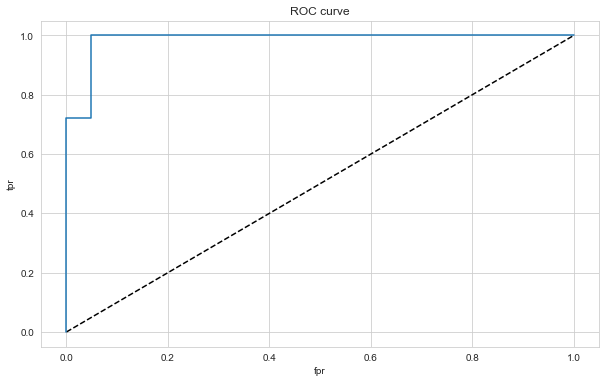

In [74]:
y_pred_proba = model.predict(X_test)
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)
plt.plot([0,1],[0,1],'k--')
plt.plot(fpr,tpr, label='ANN')
plt.xlabel('fpr')
plt.ylabel('tpr')
plt.title('ROC curve')
plt.show()

In [75]:
roc_auc_score(y_test, y_pred_proba)

0.9867724867724867

### for gridsearchcv model

2/2 [==============================] - 0s 1ms/step


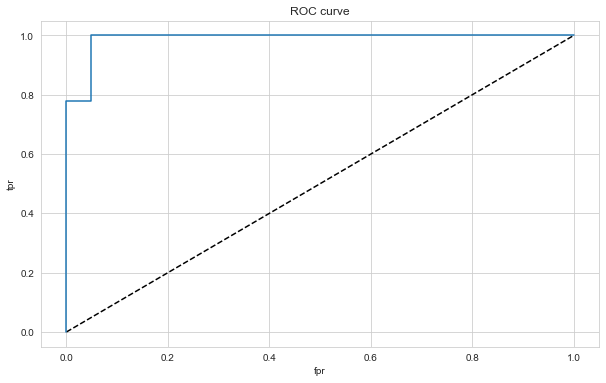

In [76]:
y_pred_proba = grid_model.predict_proba(X_test)[:,1]
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)
plt.plot([0,1],[0,1],'k--')
plt.plot(fpr,tpr, label='ANN')
plt.xlabel('fpr')
plt.ylabel('tpr')
plt.title('ROC curve')
plt.show()

In [77]:
roc_auc_score(y_test, y_pred_proba)

0.9894179894179893

## Saving Final Model and Scaler

In [78]:
import pickle
pickle.dump(scaler, open("scaler_cancer", 'wb'))

In [79]:
tf.random.set_seed(seed)

model = Sequential()

model.add(Dense(36, activation = "relu", input_dim = X_train.shape[1]))
model.add(Dense(18, activation = "relu"))
model.add(Dense(9, activation = "relu"))
model.add(Dense(1, activation = "sigmoid"))

model.compile(optimizer = "adam", loss = "binary_crossentropy", metrics = ["accuracy"])

In [80]:
early_stop = EarlyStopping(monitor = "val_loss", mode = "min", verbose = 1, patience = 15, restore_best_weights = True)

In [81]:
model.fit(x = X_train, y = y_train, validation_data = (X_test, y_test), batch_size = 32, epochs = 1000, verbose = 1,
          callbacks = [early_stop])

Epoch 1/1000
16/16 [==============================] - 0s 7ms/step - loss: 0.6777 - accuracy: 0.7480 - val_loss: 0.6615 - val_accuracy: 0.8772
Epoch 2/1000
16/16 [==============================] - 0s 2ms/step - loss: 0.6490 - accuracy: 0.8281 - val_loss: 0.6291 - val_accuracy: 0.9474
Epoch 3/1000
16/16 [==============================] - 0s 2ms/step - loss: 0.6122 - accuracy: 0.8809 - val_loss: 0.5865 - val_accuracy: 0.9649
Epoch 4/1000
16/16 [==============================] - 0s 2ms/step - loss: 0.5632 - accuracy: 0.8867 - val_loss: 0.5298 - val_accuracy: 0.9649
Epoch 5/1000
16/16 [==============================] - 0s 1ms/step - loss: 0.4993 - accuracy: 0.8867 - val_loss: 0.4559 - val_accuracy: 0.9825
Epoch 6/1000
16/16 [==============================] - 0s 2ms/step - loss: 0.4282 - accuracy: 0.8867 - val_loss: 0.3815 - val_accuracy: 0.9825
Epoch 7/1000
16/16 [==============================] - 0s 2ms/step - loss: 0.3606 - accuracy: 0.8965 - val_loss: 0.3147 - val_accuracy: 0.9649
Epoch 

<AxesSubplot:>

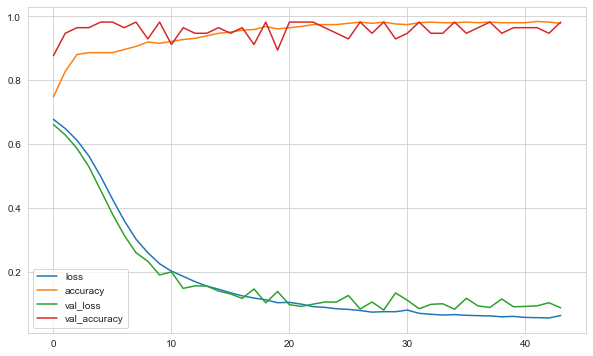

In [82]:
loss_df = pd.DataFrame(model.history.history)
loss_df.plot()

In [83]:
loss, accuracy = model.evaluate(X_test, y_test, verbose=0)
print("loss : ", loss)
print("accuracy : ", accuracy)

loss :  0.08040451258420944
accuracy :  0.9824561476707458


In [84]:
y_pred = model.predict(X_test) > 0.5
#y_pred = model.predict_classes(X_test) for tf 2.5.0
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

2/2 [==============================] - 0s 1ms/step
[[20  1]
 [ 0 36]]
              precision    recall  f1-score   support

           0       1.00      0.95      0.98        21
           1       0.97      1.00      0.99        36

    accuracy                           0.98        57
   macro avg       0.99      0.98      0.98        57
weighted avg       0.98      0.98      0.98        57



In [85]:
model.save('model_cancer.h5')

## Loading Model and Scaler

In [86]:
from tensorflow.keras.models import load_model

In [87]:
model_cancer = load_model('model_cancer.h5')
scaler_cancer = pickle.load(open("scaler_cancer", "rb"))

## Prediction

In [88]:
single_patient = df.drop('Cancer', axis = 1).iloc[0:1, :]
single_patient

,mean radius,mean texture,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,radius error,texture error,smoothness error,compactness error,concavity error,concave points error,symmetry error,fractal dimension error,worst radius,worst texture,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension
0,17.990,10.380,0.118,0.278,0.300,0.147,0.242,0.079,1.095,0.905,0.006,0.049,0.054,0.016,0.030,0.006,25.380,17.330,0.162,0.666,0.712,0.265,0.460,0.119


In [89]:
single_patient = scaler_cancer.transform(single_patient)
single_patient

array([[0.52103744, 0.0226581 , 0.68000973, 0.7920373 , 0.70313964,
        0.73111332, 0.68636364, 0.60551811, 0.35614702, 0.12046941,
        0.15929565, 0.35139844, 0.13568182, 0.30062512, 0.31164518,
        0.18304244, 0.62077552, 0.14152452, 0.61828432, 0.61929156,
        0.56861022, 0.91202749, 0.59846245, 0.41886396]])

In [90]:
(model_cancer.predict(single_patient) > 0.5).astype("int32")
#model_cancer.predict_classes(single_patient)

1/1 [==============================] - 0s 34ms/step


array([[0]], dtype=int32)

In [91]:
df["Cancer"].iloc[0]

0

## Comparison with ML

### Logistic Regression

In [92]:
from sklearn.linear_model import LogisticRegression

In [93]:
log_model=LogisticRegression()
log_model.fit(X_train, y_train)
y_pred = log_model.predict(X_test)
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

[[20  1]
 [ 1 35]]
              precision    recall  f1-score   support

           0       0.95      0.95      0.95        21
           1       0.97      0.97      0.97        36

    accuracy                           0.96        57
   macro avg       0.96      0.96      0.96        57
weighted avg       0.96      0.96      0.96        57



### Random Forest

In [94]:
from sklearn.ensemble import RandomForestClassifier

In [95]:
rf_model = RandomForestClassifier()
rf_model.fit(X_train, y_train)
y_pred = rf_model.predict(X_test)
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

[[20  1]
 [ 1 35]]
              precision    recall  f1-score   support

           0       0.95      0.95      0.95        21
           1       0.97      0.97      0.97        36

    accuracy                           0.96        57
   macro avg       0.96      0.96      0.96        57
weighted avg       0.96      0.96      0.96        57



___

<p style="text-align: center;"><img src="https://docs.google.com/uc?id=1lY0Uj5R04yMY3-ZppPWxqCr5pvBLYPnV" class="img-fluid" alt="CLRSWY"></p>

___